In [2]:
!pip install optuna

In [37]:
import tensorflow as tf
import optuna
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoost, Pool

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


ModuleNotFoundError: No module named 'catboost'

## Load data

In [4]:
data = pd.read_csv('https://docs.google.com/spreadsheets/d/e/2PACX-1vS2iyOeqNrnzENVMbYsEubeyeCeR2FQSrC2kWAtB772F2kr9hCQ8atVRcxIav6Dlw9EPoNh4kKgkgJ3/pub?gid=213617889&single=true&output=csv')

In [5]:
data.head()

,I_Coil_S_1,I_Coil_S_2,I_Coil_S_3,I_Coil_S_4,I_Coil_S_5,I_Coil_S_6,I_Coil_S_7,I_Coil_S_8,I_Coil_S_9,I_Coil_S_10,I_Coil_S_11,I_Coil_S_12,I_Coil_S_13,I_Coil_S_14,I_Coil_S_15,I_Coil_S_16,I_Coil_S_17,I_Coil_S_18,I_Coil_S_19,I_Coil_S_20,I_Coil_S_21,I_Coil_S_22,I_Coil_S_23,I_Coil_S_24,I_Coil_S_25,I_Coil_S_26,I_Coil_S_27,I_Coil_S_28,I_Coil_S_29,I_Coil_S_30,T_R_Core,T_R_Core_2,T_R_Core_3,T_R_Core_4,T_R_Core_5,T_R_Core_6,T_R_Core_7,T_R_Core_8,T_R_Core_9,T_R_Core_10,T_R_Core_11,T_R_Core_12,T_R_Core_13,T_R_Core_14,T_R_Core_15,T_R_Core_16,T_R_Core_17,T_R_Core_18,T_R_Core_19,T_R_Core_20,T_R_Core_21,T_R_Core_22,T_R_Core_23,T_R_Core_24,T_R_Core_25,T_R_Core_26,T_R_Core_27,T_R_Core_28,Rotor_posn,Net_Torque
0,838.911750,759.710510,151.419436,1615.056972,743.575343,391.038655,1261.606568,242.427231,1517.168814,1235.880686,1136.968086,1644.552590,1299.043478,373.753114,1154.363677,968.558844,475.046566,1728.383799,695.624587,1451.133024,805.648549,1142.269616,200.665408,1902.587556,601.935652,40.713244,1532.422884,1856.700587,418.592063,955.759736,15.479226,-42.847403,6.064716,-12.895680,18.252286,-29.389699,11.222207,-26.003880,-21.294832,31.174374,-29.326844,112.638421,-24.577963,24.606552,4.854151,-57.440308,27.289150,-117.839598,37.453612,-47.446869,17.398821,-26.851500,-28.688864,-13.777332,-11.467442,122.742396,-14.451273,10.036495,-1.200000,-65.087081
1,63.159728,1145.927954,1657.822801,304.390164,494.859837,1807.131972,1049.181833,94.704052,489.101852,426.085510,358.871208,1578.618173,314.545535,612.220245,636.828373,622.404727,404.759696,1805.421913,1690.866852,1461.239642,280.030105,1460.276274,5.973251,268.499457,870.218774,570.007014,1128.917385,703.853609,597.595272,1904.930449,11.229471,-12.536256,30.446560,-103.580160,20.265228,17.454621,19.543563,-38.937267,-10.905801,13.979060,-8.572148,112.500900,-8.759866,25.504916,0.290484,-40.982595,41.326342,-100.186679,26.732960,-66.229009,9.483419,-44.946565,-8.622409,27.807482,-15.351617,82.259023,-10.616755,31.961057,-1.175758,0.557958
2,604.895390,1687.818115,1012.687243,1502.671404,405.011494,1454.313326,589.616445,1840.587726,21.227596,353.216915,1263.009765,1345.094191,1366.001321,110.808211,729.066266,1374.909432,153.261000,279.744488,658.661727,1519.840001,1756.416608,1286.093196,501.047096,1929.647805,974.581579,129.650555,1607.304410,820.807789,1824.520892,473.856855,17.637504,-31.529522,15.031434,-49.240416,15.424546,5.433440,13.185292,38.785119,-19.140526,20.559278,-7.332849,97.164002,-16.685405,5.809139,6.244711,-75.382638,-5.592654,-13.735950,50.292172,-13.282855,17.478178,-22.011852,-25.213906,8.814699,-19.264357,130.770247,-13.454053,36.582125,-1.151515,167.344904
3,17.840346,1759.438076,1574.016330,212.658269,330.123381,1857.333290,970.880979,224.690144,1995.096232,1716.554497,938.142312,231.825997,574.401833,312.836168,1135.919141,1026.209542,1396.933967,1093.977710,1367.545965,1917.831175,823.392415,595.425860,1878.078629,1205.817297,597.432528,858.841403,343.724064,882.827033,445.642094,1678.188694,12.994437,-6.987048,24.382430,-80.895173,16.929088,35.475627,7.852790,-11.329015,-17.989747,53.259204,-40.250328,25.070360,-0.386462,7.051670,10.609738,-65.145659,22.312188,-42.883271,46.302679,-69.812219,4.260714,57.851876,-41.122330,13.443905,-17.304365,29.278734,-2.543550,5.425467,-1.127273,-24.148261
4,309.189519,1211.884724,1241.877155,1765.598706,958.032189,180.943129,1683.015986,1804.044797,1496.436842,1253.418474,1899.860847,1739.772124,860.744173,9.266228,829.254146,643.718123,404.240796,1258.558023,1777.273983,630.647459,1237.191367,459.165193,803.252614,937.639813,1289.839030,338.787254,61.456967,1785.606285,1092.452883,835.650610,15.827835,-28.320735,36.028130,-32.938019,21.500328,-36.722931,-10.237192,39.495440,-44.268432,59.057567,-10.266856,76.100659,-17.603027,-6.133252,5.726628,-45.872483,28.380931,-30.701357,20.523078,-3.909566,0.900474,17.781660,-19.684223,48.454667,-18.190603,31.816934,8.748907,-21.019876,-1.103030,84.474686


In [6]:
data.columns

Index(['I_Coil_S_1', 'I_Coil_S_2', 'I_Coil_S_3', 'I_Coil_S_4', 'I_Coil_S_5',
       'I_Coil_S_6', 'I_Coil_S_7', 'I_Coil_S_8', 'I_Coil_S_9', 'I_Coil_S_10',
       'I_Coil_S_11', 'I_Coil_S_12', 'I_Coil_S_13', 'I_Coil_S_14',
       'I_Coil_S_15', 'I_Coil_S_16', 'I_Coil_S_17', 'I_Coil_S_18',
       'I_Coil_S_19', 'I_Coil_S_20', 'I_Coil_S_21', 'I_Coil_S_22',
       'I_Coil_S_23', 'I_Coil_S_24', 'I_Coil_S_25', 'I_Coil_S_26',
       'I_Coil_S_27', 'I_Coil_S_28', 'I_Coil_S_29', 'I_Coil_S_30', 'T_R_Core',
       'T_R_Core_2', 'T_R_Core_3', 'T_R_Core_4', 'T_R_Core_5', 'T_R_Core_6',
       'T_R_Core_7', 'T_R_Core_8', 'T_R_Core_9', 'T_R_Core_10', 'T_R_Core_11',
       'T_R_Core_12', 'T_R_Core_13', 'T_R_Core_14', 'T_R_Core_15',
       'T_R_Core_16', 'T_R_Core_17', 'T_R_Core_18', 'T_R_Core_19',
       'T_R_Core_20', 'T_R_Core_21', 'T_R_Core_22', 'T_R_Core_23',
       'T_R_Core_24', 'T_R_Core_25', 'T_R_Core_26', 'T_R_Core_27',
       'T_R_Core_28', 'Rotor_posn', 'Net_Torque'],
      dtype='object')

In [7]:
data.describe()

,I_Coil_S_1,I_Coil_S_2,I_Coil_S_3,I_Coil_S_4,I_Coil_S_5,I_Coil_S_6,I_Coil_S_7,I_Coil_S_8,I_Coil_S_9,I_Coil_S_10,I_Coil_S_11,I_Coil_S_12,I_Coil_S_13,I_Coil_S_14,I_Coil_S_15,I_Coil_S_16,I_Coil_S_17,I_Coil_S_18,I_Coil_S_19,I_Coil_S_20,I_Coil_S_21,I_Coil_S_22,I_Coil_S_23,I_Coil_S_24,I_Coil_S_25,I_Coil_S_26,I_Coil_S_27,I_Coil_S_28,I_Coil_S_29,I_Coil_S_30,T_R_Core,T_R_Core_2,T_R_Core_3,T_R_Core_4,T_R_Core_5,T_R_Core_6,T_R_Core_7,T_R_Core_8,T_R_Core_9,T_R_Core_10,T_R_Core_11,T_R_Core_12,T_R_Core_13,T_R_Core_14,T_R_Core_15,T_R_Core_16,T_R_Core_17,T_R_Core_18,T_R_Core_19,T_R_Core_20,T_R_Core_21,T_R_Core_22,T_R_Core_23,T_R_Core_24,T_R_Core_25,T_R_Core_26,T_R_Core_27,T_R_Core_28,Rotor_posn,Net_Torque
count,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,22400.000000,2.240000e+04,22400.000000
mean,996.029242,1002.405288,996.900911,1003.020502,1000.481953,999.578071,998.890007,1002.673373,1000.993111,999.075557,999.671414,1000.268747,1000.553996,996.498886,1002.008095,994.987251,999.492229,998.196996,996.579502,1002.115980,1002.708562,1005.839158,1001.934716,1005.546612,1003.575875,1000.086654,1002.412327,1001.832307,996.185028,1001.720195,55.209673,-21.764204,-1.167778,-1.864564,0.961534,-1.397368,0.859146,-0.723061,0.371804,-0.977094,0.533358,-0.480691,0.355382,-1.098639,0.722420,-1.868515,0.652947,-1.544885,0.964310,-1.314285,0.991629,-0.989329,0.570301,-0.720355,0.276832,-1.946278,-1.968832,-20.376690,5.551115e-18,2.266769
std,578.535337,576.696840,577.604178,575.561780,578.090009,576.439669,576.066464,576.944867,576.696654,577.390990,574.594964,575.711155,573.657340,577.968632,577.675817,580.388550,577.063202,576.955835,576.407417,576.415843,576.076546,576.993530,575.295901,575.988551,574.524966,578.767917,578.199871,575.700156,577.509506,579.619357,48.230066,50.919562,20.780160,53.328355,20.054736,53.273077,20.175436,52.723797,19.702822,53.252575,19.975110,53.987327,19.812342,53.812878,19.744899,53.025817,19.723639,53.472846,20.154484,53.356215,20.012468,52.950547,20.005338,52.261406,19.637961,52.764809,17.226915,44.912634,6.997991e-01,97.258066
min,0.013550,0.097202,0.103686,0.111777,0.018601,0.037435,0.004806,0.025360,0.031232,0.053234,0.013005,0.014895,0.079997,0.135144,0.354437,0.018027,0.162864,0.022250,0.028933,0.093824,0.113154,0.001983,0.017914,0.071979,0.003151,0.069719,0.021228,0.138513,0.026009,0.050669,-110.847693,-178.549692,-62.869201,-158.422496,-55.740555,-154.760028,-57.819274,-145.107575,-59.303839,-153.648904,-58.168909,-150.260530,-60.107094,-152.006700,-59.650572,-151.449012,-58.920209,-152.821031,-58.782976,-150.706566,-56.316810,-152.080151,-56.031336,-151.252624,-55.363733,-145.706603,-55.786074,-183.652520,-1.200000e+00,-389.891944
25%,494.145012,508.436744,494.269513,500.168919,499.535025,502.659471,501.740137,497.828358,502.171805,498.465474,501.262234,501.868126,503.161400,493.109271,500.634900,494.298763,499.583864,500.277444,495.247315,505.657092,504.103439,505.956738,504.930673,512.457327,509.315463,498.793882,501.745270,496.682961,495.829529,500.154565,25.347180,-57.062667,-15.648767,-38.138196,-12.836342,-37.830907,-12.413996,-38.030733,-12.824915,-37.590108,-12.935747,-37.987310,-12.666063,-37.707372,-12.370229,-38.792296,-12.637383,-38.573052,-13.029114,-38.589725,-12.722999,-38.228409,-13.211468,-37.068332,-13.117664,-

In [8]:
cols_rotor_torque = [col for col in data.columns if 'T_R' in col]
cols_rotor_torque

['T_R_Core',
 'T_R_Core_2',
 'T_R_Core_3',
 'T_R_Core_4',
 'T_R_Core_5',
 'T_R_Core_6',
 'T_R_Core_7',
 'T_R_Core_8',
 'T_R_Core_9',
 'T_R_Core_10',
 'T_R_Core_11',
 'T_R_Core_12',
 'T_R_Core_13',
 'T_R_Core_14',
 'T_R_Core_15',
 'T_R_Core_16',
 'T_R_Core_17',
 'T_R_Core_18',
 'T_R_Core_19',
 'T_R_Core_20',
 'T_R_Core_21',
 'T_R_Core_22',
 'T_R_Core_23',
 'T_R_Core_24',
 'T_R_Core_25',
 'T_R_Core_26',
 'T_R_Core_27',
 'T_R_Core_28']

## Plots

In [9]:
# prompt: pairplot of all columns

# plt.figure(figsize=(15, 15))
# plt.title('Pairplot of all columns')
# sns.pairplot(data)
# plt.show()


In [ ]:
data.plot(x='Rotor_posn', y=f'T_R_Core_15', kind='scatter', c=f'I_Coil_S_15')

In [ ]:
# box plot


In [ ]:
#

/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


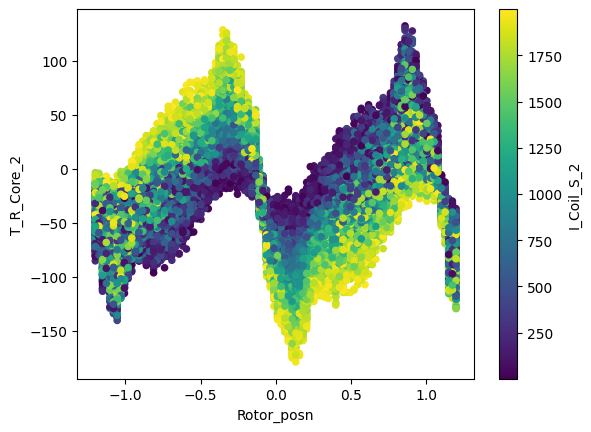

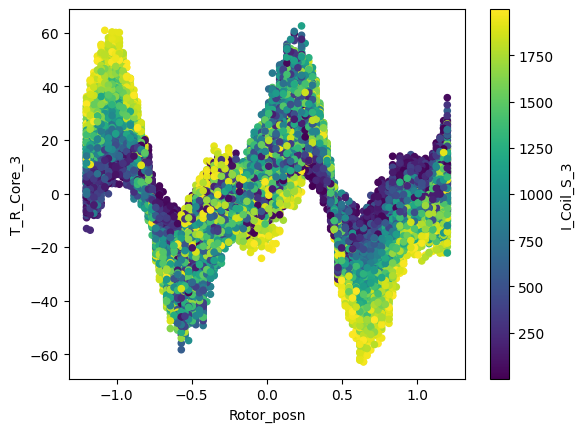

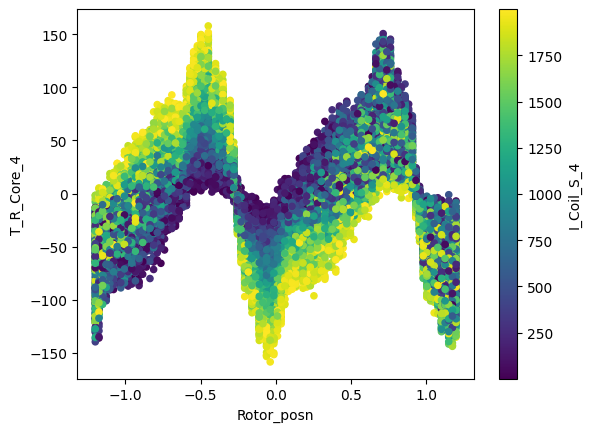

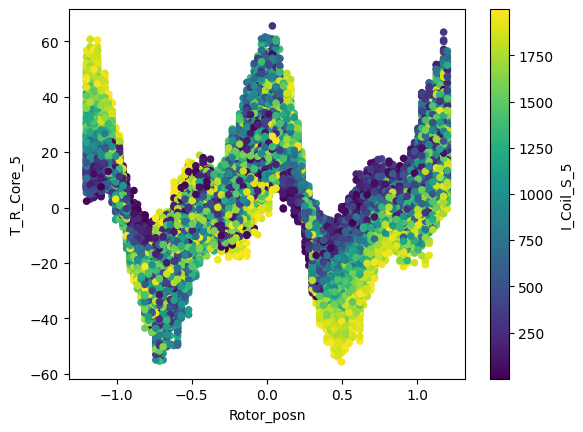

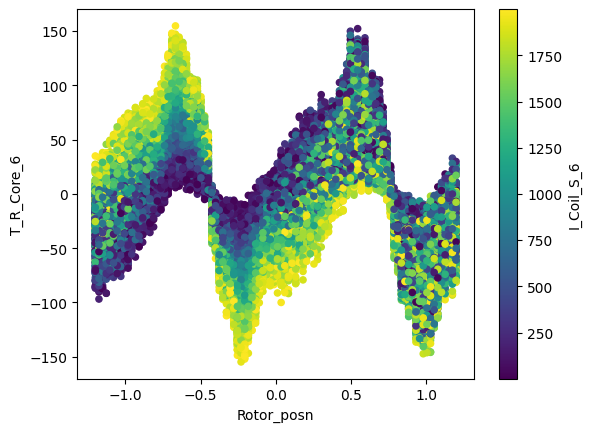

...

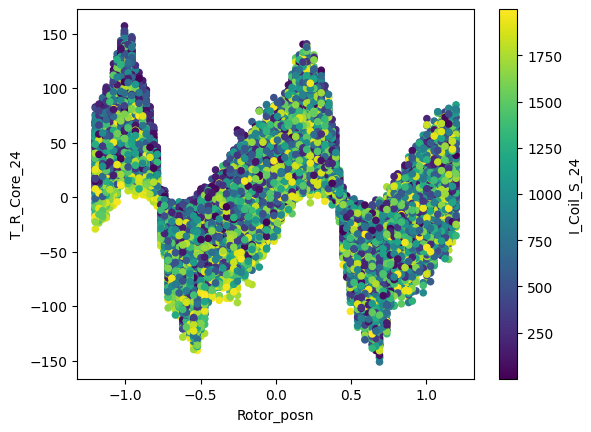

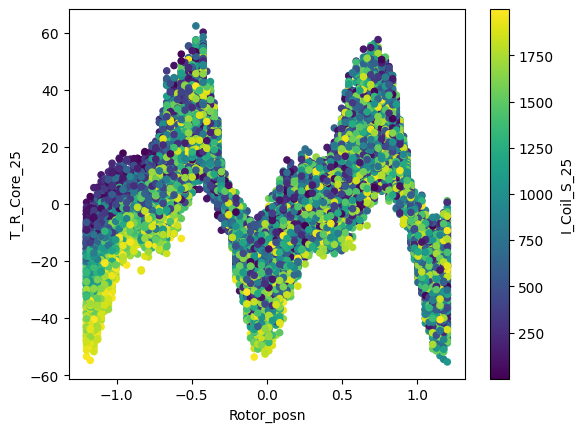

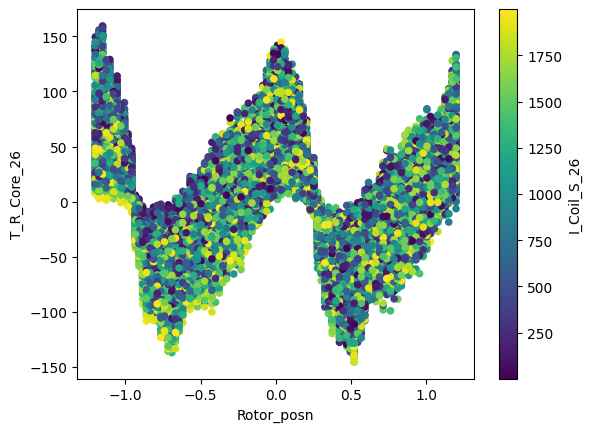

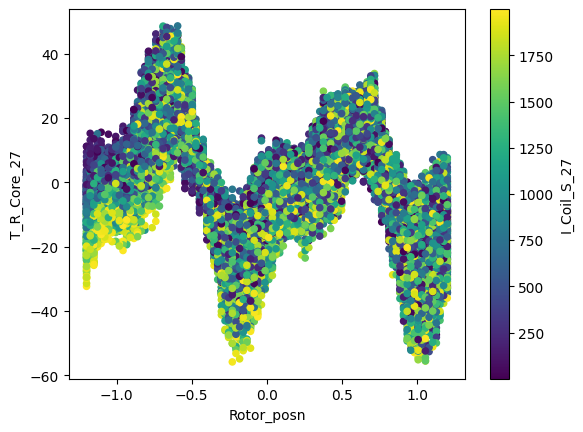

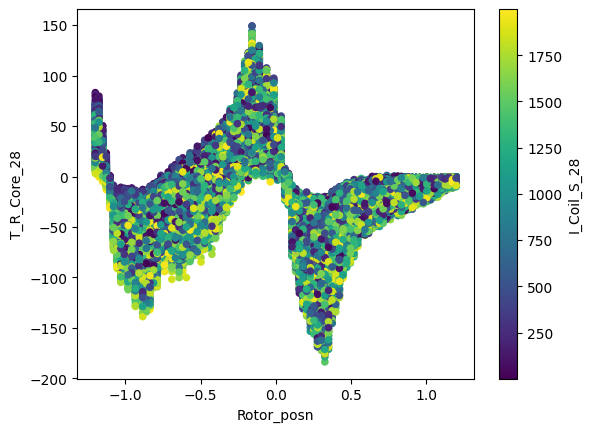

In [10]:
for s in range(2, 29):
  # data.plot(x='Rotor_posn', y=f'T_R_Core_{s}', kind='scatter', c=f'I_Coil_S_{s}')

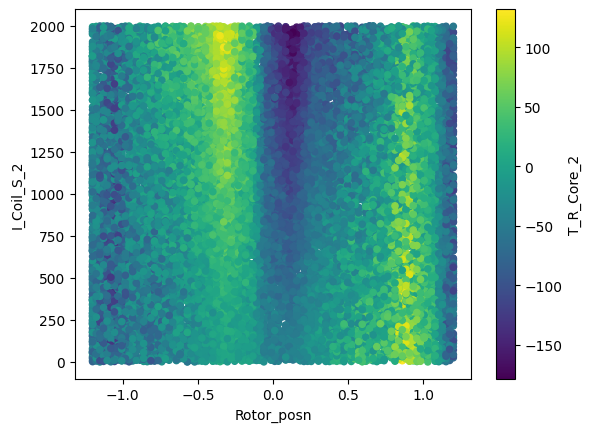

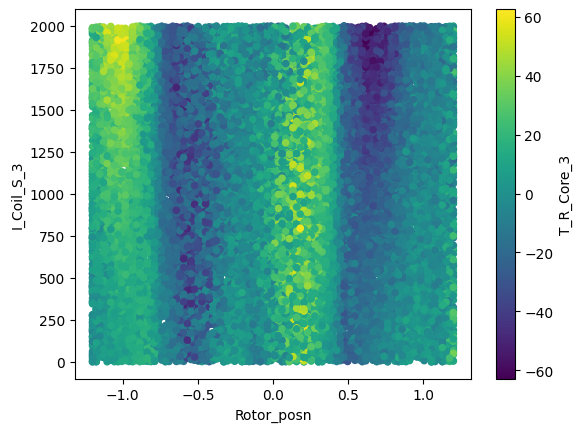

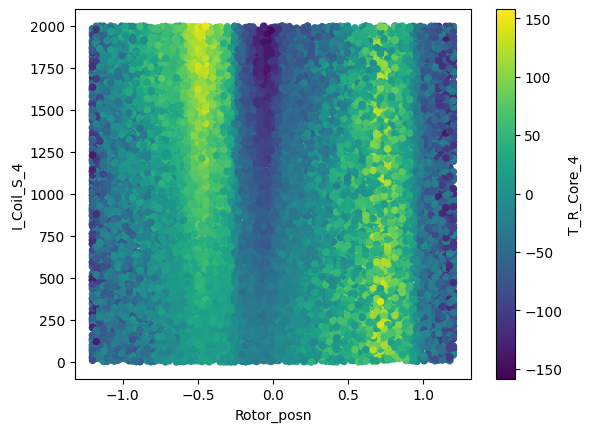

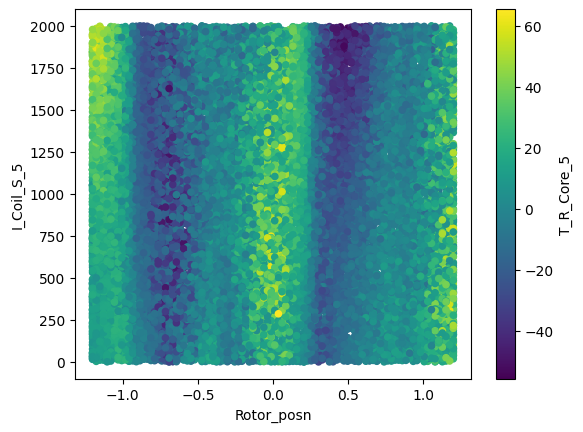

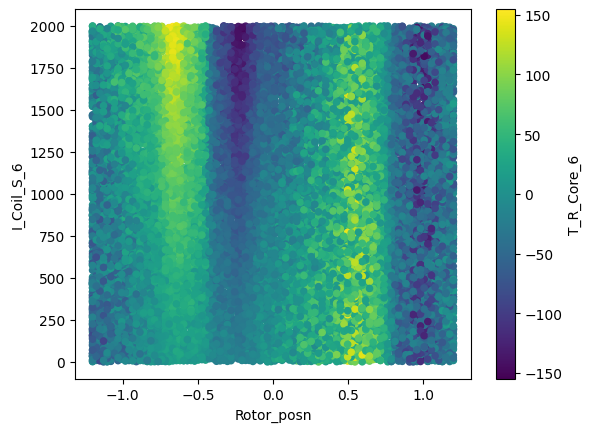

...

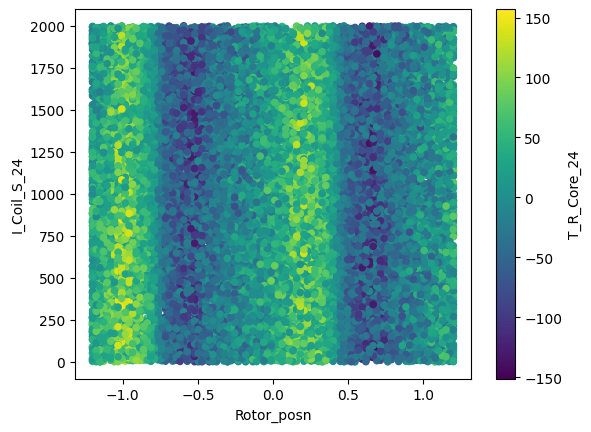

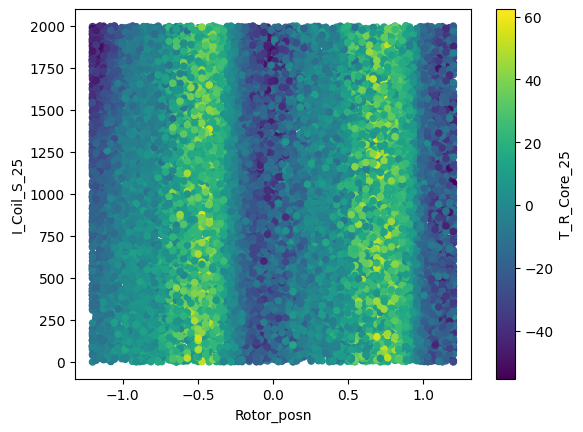

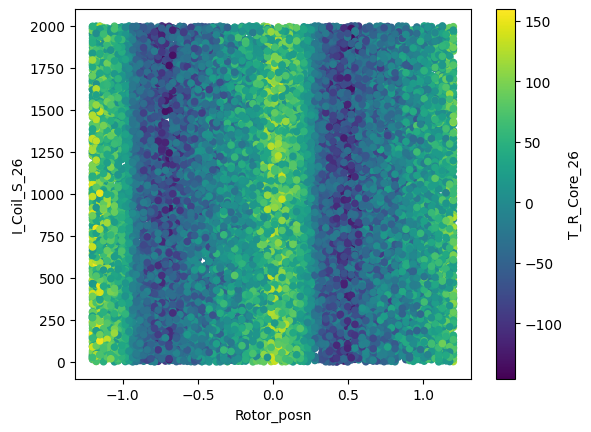

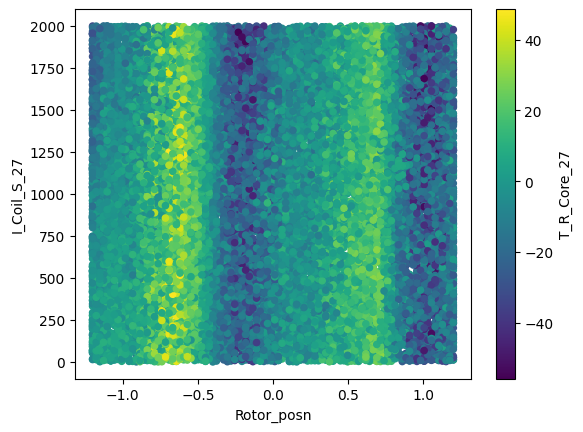

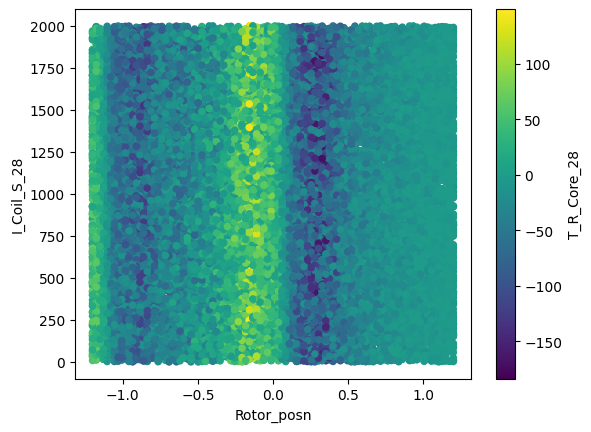

In [11]:
for s in range(2, 29):
  # data.plot(x='Rotor_posn', y=f'I_Coil_S_{s}', kind='scatter', c=f'T_R_Core_{s}')

# Surrogate model

## Neural Network

* To model: T_R_Core_15
* Use +/- 0, 1, 2, 3, 4, 5 neighbours
* Use rotor position as 1 input

Example for 0 neighbours
* Input: I_Coil_S_15, rotor_posn

Example for 1 neighbours
* Input: I_Coil_S_15, I_Coil_S_14, I_Coil_S_16 rotor_posn

Example for 3 neighbours
* Input: I_Coil_S_13, I_Coil_S_14, I_Coil_S_15, I_Coil_S_16, I_Coil_S_17, rotor_posn

Example for 4 neighbours
* Input: I_Coil_S_12, I_Coil_S_13, I_Coil_S_14, I_Coil_S_15, I_Coil_S_16, I_Coil_S_17, I_Coil_S_18, rotor_posn

In [12]:
current_cols = [col for col in data.columns if 'I_Coil' in col]

In [13]:
# X = data[['I_Coil_S_13', 'I_Coil_S_14', 'I_Coil_S_15', 'I_Coil_S_16', 'I_Coil_S_17', 'Rotor_posn']]

X = data[current_cols + ['Rotor_posn']]

y = data['T_R_Core_16']

In [14]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


In [15]:
tf.random.set_seed(42)  #first we set random seed
model = tf.keras.Sequential([tf.keras.layers.Dense(100, activation = tf.keras.activations.relu),
                             tf.keras.layers.Dense(10, activation = tf.keras.activations.relu),
                             tf.keras.layers.Dense(10, activation = tf.keras.activations.relu),
                             tf.keras.layers.Dense(1)
])

model.compile( loss = tf.keras.losses.mse, #mae stands for mean absolute error
              optimizer = tf.keras.optimizers.Adam(), #stochastic GD
              metrics = ['mae', 'mape'])

history = model.fit( X_train, y_train, epochs = 100, validation_split=0.2)


Epoch 1/100
448/448 [==============================] - 5s 7ms/step - loss: 6931.5366 - mae: 54.9436 - mape: 344.2441 - val_loss: 2831.8909 - val_mae: 43.2983 - val_mape: 139.8632
Epoch 2/100
448/448 [==============================] - 1s 3ms/step - loss: 2767.6179 - mae: 42.9100 - mape: 169.1191 - val_loss: 2685.5469 - val_mae: 42.3189 - val_mape: 138.3628
Epoch 3/100
448/448 [==============================] - 1s 3ms/step - loss: 2687.1660 - mae: 42.4260 - mape: 187.5548 - val_loss: 2662.7102 - val_mae: 42.1988 - val_mape: 152.8562
Epoch 4/100
448/448 [==============================] - 1s 3ms/step - loss: 2660.4785 - mae: 42.2470 - mape: 189.6064 - val_loss: 2649.3499 - val_mae: 42.1504 - val_mape: 152.7758
Epoch 5/100
448/448 [==============================] - 1s 3ms/step - loss: 2661.5610 - mae: 42.2514 - mape: 205.4937 - val_loss: 2679.6218 - val_mae: 42.3926 - val_mape: 155.1844
Epoch 6/100
448/448 [==============================] - 1s 3ms/step - loss: 2646.9006 - mae: 42.1019 - map

In [16]:
preds = model.predict(X_test)
mae = tf.metrics.mean_absolute_error(y_true=y_test, y_pred=preds.squeeze()).numpy()
mse = tf.metrics.mean_squared_error(y_true = y_test, y_pred=preds.squeeze()).numpy()
mae, mse

140/140 [==============================] - 0s 2ms/step


(44.645325, 3213.7104)

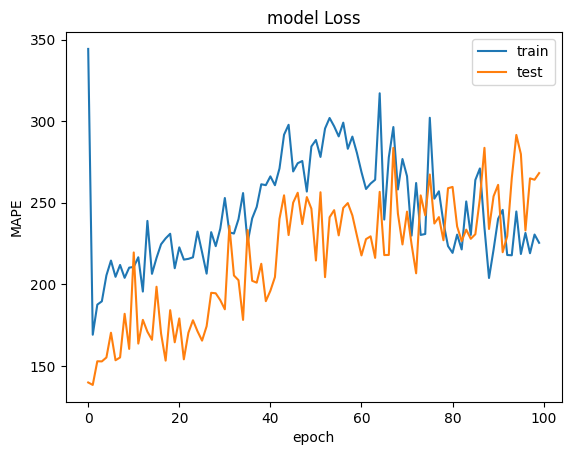

In [17]:
# summarize history for accuracy
plt.plot(history.history['mape'])
plt.plot(history.history['val_mape'])
plt.title('model Loss')
plt.ylabel('MAPE')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

## LGBM

In [18]:
import lightgbm as lgb

In [19]:
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'n_estimators': 1572,
    'scale_pos_weight': 2.7847617081590714,
    'reg_alpha': 0.07819944048253905,
    'reg_lambda': 0.13324834417739773,
    'feature_fraction': 0.9204523407582761,
    'bagging_fraction': 0.9979325142841247,
    'learning_rate': 0.016577737766254656,
    'max_depth': 33,
    'num_leaves': 87,
    'min_data_in_leaf': 107,
    'min_gain_to_split': 0.008260058277433398,
    'monotone_constraints_method': 'advanced',
    'objective': 'binary',
    'metric': {'area_under_pr_curve', 'auc'},
    'boosting_type': 'gbdt',
    'random_state': 2000,
    'bagging_seed': 11,
    'min_sum_hessian_in_leaf': 2,
    'bagging_freq': 1,
    'verbosity': -1
		}

In [20]:
# X_train, X_test, y_train, y_test

In [21]:
train_data = lgb.Dataset(X_train, label= y_train)
test_data = lgb.Dataset(X_test, label= y_test, reference= train_data)


In [25]:
params = params
verbose_eval = 10
early_stp_rnds = 500
num_rounds = 2000
eval_results = {}

gbm_nm = lgb.train(params,
                train_set = train_data,
                valid_sets=[train_data, test_data],
                # verbose_eval=verbose_eval,
                # evals_result = eval_results,
                # early_stopping_rounds=early_stp_rnds,
                num_boost_round=num_rounds,
                valid_names = ['eval', 'train']
               )

file_name = 'lgb_model.pkl'

joblib.dump(gbm_nm, file_name)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


['lgb_model.pkl']

In [26]:
# prompt: lightgbm predict ovet test data and print all metrics for regression

model = joblib.load('lgb_model.pkl')

preds = model.predict(X_test)

print(f'MAE: {tf.metrics.mean_absolute_error(y_true=y_test, y_pred=preds.squeeze()).numpy()}')
print(f'RMSE: {tf.metrics.mean_squared_error(y_true = y_test, y_pred=preds.squeeze()).numpy()}')
print(f'MAPE: {tf.metrics.mean_absolute_percentage_error(y_true=y_test, y_pred=preds.squeeze()).numpy()}')


MAE: 42.77675373625381
RMSE: 2786.0436483342824
MAPE: 101.91641260751514


# Optuna

In [34]:
def objective(trial):

    param = {
        "verbosity": -1,
        "objective": "regression",
        "metric": {"mse", "mae"},
        "boosting_type": "gbdt",
        'random_state': 2000,
        'n_estimators': trial.suggest_int('n_estimators', 200, 2500),
        "bagging_seed": 11,
        "min_sum_hessian_in_leaf": 2,
        "bagging_freq": 1,
        # "scale_pos_weight": trial.suggest_float("scale_pos_weight", 0.2,5),
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-2, 2),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-1, 3.0),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.6, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.7, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.03),
        'max_depth': trial.suggest_int('max_depth', 10, 50),
        'num_leaves' : trial.suggest_int('num_leaves', 25, 100),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 100, 300),
        'min_gain_to_split': trial.suggest_float("min_gain_to_split", 0.001, 0.01),
    }

    train_data = lgb.Dataset(X_train, label= y_train)
    test_data = lgb.Dataset(X_test, label= y_test, reference= train_data)

    model = lgb.train(param, train_set =train_data,
                      valid_sets =[train_data, test_data]
                      )

    # model = lgb.train(param, train_set =trn_data, valid_sets =[trn_data, val_data],early_stopping_rounds=300, verbose_eval=200)

    y_pred = model.predict(X_test)
    first_metric = tf.metrics.mean_absolute_error(y_true=y_test, y_pred=preds.squeeze()).numpy()
    second_metric = tf.metrics.mean_squared_error(y_true=y_test, y_pred=preds.squeeze()).numpy()
    third_metric = tf.metrics.mean_absolute_percentage_error(y_true=y_test, y_pred=preds.squeeze()).numpy()

    return first_metric, second_metric, third_metric

In [35]:
study = optuna.create_study(directions=['minimize', 'minimize', 'minimize'])
study.optimize(objective, n_trials=200)

[I 2024-01-23 16:43:27,072] A new study created in memory with name: no-name-b899019c-30e9-4bee-b24d-035be52cefdb
<ipython-input-34-21dc21844474>:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-2, 2),
<ipython-input-34-21dc21844474>:15: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-1, 3.0),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-23 16:43:31,344] Trial 0 finished with value

In [36]:
study.trials_dataframe()

,number,values_0,values_1,values_2,datetime_start,datetime_complete,duration,params_bagging_fraction,params_feature_fraction,params_learning_rate,params_max_depth,params_min_data_in_leaf,params_min_gain_to_split,params_n_estimators,params_num_leaves,params_reg_alpha,params_reg_lambda,system_attrs_nsga2:generation,state
0,0,42.776754,2786.043648,101.916413,2024-01-23 16:43:27.075623,2024-01-23 16:43:31.344213,0 days 00:00:04.268590,0.755941,0.896830,0.010027,40,232,0.007433,334,79,0.326306,0.956466,0,COMPLETE
1,1,42.776754,2786.043648,101.916413,2024-01-23 16:43:31.353025,2024-01-23 16:43:37.172506,0 days 00:00:05.819481,0.877479,0.611496,0.006608,48,153,0.002797,724,61,0.638766,2.135321,0,COMPLETE
2,2,42.776754,2786.043648,101.916413,2024-01-23 16:43:37.175561,2024-01-23 16:43:59.969260,0 days 00:00:22.793699,0.798116,0.830415,0.011131,37,178,0.008786,1945,51,1.067928,2.238306,0,COMPLETE
3,3,42.776754,2786.043648,101.916413,2024-01-23 16:43:59.972075,2024-01-23 16:44:02.174700,0 days 00:00:02.202625,0.783684,0.927386,0.010950,19,194,0.009589,235,93,0.324442,0.374633,0,COMPLETE
4,4,42.776754,2786.043648,101.916413,2024-01-23 16:44:02.177291,2024-01-23 16:44:10.433961,0 days 00:00:08.256670,0.966335,0.624102,0.002032,38,194,0.008917,758,40,0.053403,2.500624,0,COMPLETE
5,5,42.776754,2786.043648,101.916413,2024-01-23 16:44:10.437048,2024-01-23 16:44:12.506201,0 days 00:00:02.069153,0.915253,0.983695,0.005718,18,266,0.009100,248,29,0.620546,0.664373,0,COMPLETE
6,6,42.776754,2786.043648,101.916413,2024-01-23 16:44:12.509367,2024-01-23 16:44:37.046868,0 days 00:00:24.537501,0.851353,0.916637,0.026070,42,117,0.009471,2276,41,0.056921,0.116177,0,COMPLETE
7,7,42.776754,2786.043648,101.916413,2024-01-23 16:44:37.053441,2024-01-23 16:44:56.445233,0 days 00:00:19.391792,0.955429,0.743328,0.025723,44,198,0.006849,1532,81,0.214257,0.629503,0,COMPLETE
8,8,42.776754,2786.043648,101.916413,2024-01-23 16:44:56.452756,2024-01-23 16:45:03.897954,0 days 00:00:07.445198,0.709211,0.789013,0.018690,33,274,0.009340,755,92,0.016095,0.991547,0,COMPLETE
9,9,42.776754,2786.043648,101.916413,2024-01-23 16:45:03.907017,2024-01-23 16:45:18.775910,0 days 00:00:14.868893,0.747353,0.905258,0.002920,23,200,0.003678,1509,77,0.263469,2.390139,0,COMPLETE


In [38]:
def cast_as_df(optuna_experiment, experiment_type):
    df = (
        optuna_experiment
        .trials_dataframe()
        .rename(columns={"values_0": "MAE", "values_1": "MSE", "values_2": "MAPE"})
        .assign(experiment = experiment_type)
    )
    # the following lines create a column identifing which of the trials resulted in a
    # Best configuration -- a model with these HPs lies along the empirical Pareto frontier
    best_trials = [trial.number for trial in optuna_experiment.best_trials]
    df['best_trial'] = np.where(df.number.isin(best_trials), 1, 0)
    return df

In [39]:
study_df = cast_as_df(study, experiment_type="Multi-Obj : mae vs mse vs mape")
study_df.head()

,number,MAE,MSE,MAPE,datetime_start,datetime_complete,duration,params_bagging_fraction,params_feature_fraction,params_learning_rate,params_max_depth,params_min_data_in_leaf,params_min_gain_to_split,params_n_estimators,params_num_leaves,params_reg_alpha,params_reg_lambda,system_attrs_nsga2:generation,state,experiment,best_trial
0,0,42.776754,2786.043648,101.916413,2024-01-23 16:43:27.075623,2024-01-23 16:43:31.344213,0 days 00:00:04.268590,0.755941,0.896830,0.010027,40,232,0.007433,334,79,0.326306,0.956466,0,COMPLETE,Multi-Obj : mae vs mse vs mape,1
1,1,42.776754,2786.043648,101.916413,2024-01-23 16:43:31.353025,2024-01-23 16:43:37.172506,0 days 00:00:05.819481,0.877479,0.611496,0.006608,48,153,0.002797,724,61,0.638766,2.135321,0,COMPLETE,Multi-Obj : mae vs mse vs mape,1
2,2,42.776754,2786.043648,101.916413,2024-01-23 16:43:37.175561,2024-01-23 16:43:59.969260,0 days 00:00:22.793699,0.798116,0.830415,0.011131,37,178,0.008786,1945,51,1.067928,2.238306,0,COMPLETE,Multi-Obj : mae vs mse vs mape,1
3,3,42.776754,2786.043648,101.916413,2024-01-23 16:43:59.972075,2024-01-23 16:44:02.174700,0 days 00:00:02.202625,0.783684,0.927386,0.010950,19,194,0.009589,235,93,0.324442,0.374633,0,COMPLETE,Multi-Obj : mae vs mse vs mape,1
4,4,42.776754,2786.043648,101.916413,2024-01-23 16:44:02.177291,2024-01-23 16:44:10.433961,0 days 00:00:08.256670,0.966335,0.624102,0.002032,38,194,0.008917,758,40,0.053403,2.500624,0,COMPLETE,Multi-Obj : mae vs mse vs mape,1


In [ ]:
import seaborn as sns
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(111)
sns.scatterplot(ax=ax, x=study_df["f_score"], y=study_df["Recall"], hue=study_df["Precision"], palette = 'viridis_r', alpha=0.5, label=study_df.reset_index().experiment[0])
plt.xlabel("f_score")
plt.ylabel("Recall")
plt.legend()
plt.title("Comparison")

# H2O

In [41]:
!pip install h2o

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.2/265.2 MB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.44.0.3-py2.py3-none-any.whl size=265293968 sha256=52cdb18deacce52bd0f4112af62ca8556fe5ab9ad84c1e9024cc555ef873036c
  Stored in directory: /root/.cache/pip/wheels/77/9a/1c/2da26f943fd46b57f3c20b54847b936b9152b831dc7447cf71
Successfully built h2o


In [42]:
import h2o
print(h2o.__version__)
from h2o.automl import H2OAutoML

h2o.init(max_mem_size='12G')

3.44.0.3
Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmplb436ao3
  JVM stdout: /tmp/tmplb436ao3/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmplb436ao3/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,06 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,1 month and 3 days
H2O_cluster_name:,H2O_from_python_unknownUser_x7fqts
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,12 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [44]:
# prompt: h2o work with X_train and y_train

train = h2o.H2OFrame(X_train)
train['Response'] = y_train


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


H2OTypeError: Argument `value` should be a None | numeric | string | H2OFrame, got Series 78        41.070890
4334      28.106580
8839      77.734756
3094       0.456686
14188     34.421149
13367     18.359281
22003    -30.937335
9903    -115.643057
21172    -15.136779
5501     -45.732102
11570    -24.423000
3047     -34.793663
8980      -2.160036
15167    -17.585155
1756     -43.875087
10872     21.616463
15506    -61.606307
21378      2.778985
21897    -25.546743
409      -19.972730
9640      44.207839
21014    -44.972844
2801    -101.403063
49       -39.625238
6082       8.895386
3509      -9.708738
20815    -63.296185
8788      38.619428
9535      91.260365
16475      3.658839
13360    -15.960808
4675      24.626144
12151    -67.463720
5705     -69.964862
8871       2.060589
21080     72.898428
15020    -38.588364
22173    -24.937457
17966    -16.462195
22261    -26.932055
8876     -21.556366
13361    -31.287504
11954    -81.443813
2482      28.356632
9207     -44.116854
18059   -101.224878
5045      21.315453
13664      2.084235
8431      35.098482
11069    -19.301256
15716    -25.754772
21410    -22.808899
3606    -127.738206
17067     -8.270559
20370    -12.360349
6009    -103.758340
1141      78.431336
9479      64.112054
17216     -9.776741
13324      4.709531
12792     30.308719
4814      -8.222721
5776      -8.580542
6840      51.310377
20278     60.711921
10583     19.410375
14361    -54.860737
3474     -19.572580
16663     -2.629966
12785    115.473564
12600     -8.749609
10689     68.870090
18013     -9.347609
20700    -67.722131
9892      35.652114
1495       3.229838
17414    -30.619945
9914       5.241361
21748    -30.330923
5581      44.282375
11789     97.333819
9139     128.710427
7580      50.807263
2255     -56.688381
3725      -0.650268
12911    -61.737129
12661     -4.029310
7774     -27.237562
3020      14.554522
10292     29.832310
10215    -69.936734
13777     13.360529
21981     44.711073
8785      99.289890
5965     -25.786081
16472    -22.986410
15528      8.173395
11646     -3.362120
15118    -25.761702
15321     21.887583
1462     -61.249208
18801    -76.825384
11906    -31.221485
966      -40.925947
10136     53.897933
11681     69.309811
7500     -27.430331
650      -61.249035
13940     92.315916
3189      38.971080
7718     -13.664359
12210    -30.164271
18242     11.466228
8581      67.989470
5169      43.002221
3692      80.918416
20542     51.943642
19162    -14.129578
21943     80.468827
1866     -10.656297
8422     -11.917584
5361     -71.769539
3460     -32.867603
4318     -52.504971
17701    -24.993895
5220      15.230871
19912    -51.482960
19931     17.027535
4257     -64.261060
13291     60.297970
1161      -3.001243
18708    -46.493586
16758    -28.125767
2900     -65.336603
6108     -29.651006
274       -4.168956
10306    -62.517773
13163    -34.934684
19787    127.535490
1532      78.447763
14648    -64.055816
22198    -44.949082
9433      14.584043
12713    -58.509040
6499     -43.251181
3518      -5.701262
15797    -51.676472
7752     -79.587895
8697     -53.993452
19016    -80.072124
7837      99.486430
14426     20.371325
20939     61.780570
13127     46.679265
12051    -54.121565
8551     -69.949973
3880      63.210156
16944     44.748290
20696    -26.189530
6136     102.719015
2408     -31.923825
1988      79.344815
16839    128.057929
2228      17.636260
6803     -51.501500
6801     -70.415759
7001     -75.629772
22223     67.722264
21046    -27.402398
7182      18.411377
15311      8.770066
5017     -29.523780
21573     37.682440
7231     -11.749344
5506    -139.212658
2205     -57.161734
4663     -66.454606
14882      3.627483
15753   -106.877262
4729      50.887929
21407   -128.539549
5533      72.622438
20438     92.715787
18935     17.724881
19807    -37.137438
21002    -50.630359
16516     19.158924
19901    -70.122263
7354     -51.048988
1084      75.753284
16470     14.283948
6979      30.818225
4705     -67.378943
6350     -36.428403
2685      30.439722
13345     40.940228
2641      59.237242
6284      13.389056
9716     -75.336721
14406    -83.872513
11593     64.058099
6807     -23.342664
13282     39.293339
14002    -13.981232
12667      1.236211
19873     10.381529
2207     -51.188297
4488      99.056799
15804    -62.429542
17574     12.804970
14378    -10.864236
15745     28.749424
18517    -62.667128
11091     62.691451
14442     21.739219
3104    -101.910963
3067      36.818757
18521      0.526204
8046     -24.086897
20102    -89.011034
2810      -4.385721
11489     61.945799
4068      -9.474818
6311     -80.668863
18891     28.486477
14914    -18.243255
18161    -11.853040
16825      5.290588
19065    -54.947554
19385    110.582528
8202     -79.319917
4398     -31.478028
2631      62.223572
8169     -23.714471
8866      22.167859
15952    -93.859177
18398    -48.049141
1223      18.571299
3361     -23.530572
4164     -33.324852
11509    -19.212844
15315    -42.689451
181       14.814693
1868       2.687346
17098    -23.535426
10378      7.045985
12799    -60.285443
21727     39.320870
18463    -34.043844
3494       2.023204
19436     27.165692
9426       7.994443
19836    129.696632
13386     15.992632
6379      48.798586
21672      0.767337
16416    -55.199269
21675     44.534143
4159     -57.424883
7007     -77.231368
13595     18.515199
16335    129.858380
13512    -58.074893
15543     37.490318
6333      89.107895
17519      0.937355
8992      49.967572
8830       2.160725
2819      -5.170660
5367       5.659587
13842     84.757535
17134     34.797011
11780     45.628265
1437     142.185274
12236    107.242213
16962    -29.639760
19935    107.839888
3360     -36.734989
7042      82.429801
12351    -18.510159
1501     -49.338356
9473      -8.489959
14108    -26.004824
875       61.669199
6618      -6.440511
10225    -32.017960
7210     -66.515005
17508    -65.796442
18871    -28.292847
19473     15.092543
8526       2.582135
1881      60.781673
912      -46.870253
8172      -8.836015
17569    -62.028697
5930      51.423150
19675     24.891102
11960    -45.476686
1508    -114.797044
8470      10.446277
18730    -11.141999
18816    -30.454318
3190      35.963001
22006    -98.085520
6277      33.709800
3035      60.591849
8197     -57.722636
12231     -3.225993
15153   -107.943355
7856     -30.009803
15615    -16.192653
9056     -60.949826
19418     22.499114
20580     46.673010
15431     20.368801
22079     34.213261
8393      62.628999
2612     -23.409615
209      -90.557084
9121       8.645494
5228      35.764951
19213    -37.978919
22095     23.729184
21432     69.978516
21681     75.408709
19693     70.674469
6668     -23.221413
16851    -29.414531
4965      15.441917
8596     -44.032427
4657     -92.380979
19040     55.372440
19775     86.610244
13232     53.733234
4073      41.688857
1700     -52.744178
10806   -111.945539
9993      55.567862
20067    -51.953212
6922     -28.248974
2653     -61.520123
10275    -41.463994
17378     54.249750
18979     66.161155
19550    -47.541083
11254     -8.133340
18709    -72.731727
9882       0.050832
8808     -85.278932
9082      42.699678
19183     21.809203
21969    -43.031814
12975     -9.588100
10579     45.187565
224      -28.272578
7449     -82.316893
13517    -16.743705
293       41.338618
0        -57.440308
15636     94.685205
15475     52.555792
182       65.620227
18164    -36.726671
21526     41.098154
21364    -29.708363
3777       3.782537
13242     37.217678
7942      53.280510
21893     76.120096
9024     -13.615932
11052    -93.258497
599      -30.754027
3559     -39.989873
2811      -5.322214
117      -54.688772
7431      18.663217
11176     22.787564
11768    -22.307969
21061    -95.679267
12279     27.757591
19953    -70.716757
5102     -37.526438
2601     -74.774747
10028      0.741852
5355     -53.635922
18859    -36.801596
1601     -79.948363
19801    -90.700292
12590     29.248822
3512     -55.349122
20605    -94.781065
17819     -8.190104
5764     -56.351821
7528      49.226072
15367    -79.179738
14498    -27.803580
12424    -10.483019
14762     -2.461146
19676     22.173694
11668     37.194649
563       12.978252
7884     118.300371
19200    -26.627335
13659    -23.431429
5881      34.296910
784       53.973206
8508    -108.420176
17868    -51.842012
10525     22.980719
8417     -30.303945
2616     -38.977598
20675     52.861016
7070     -16.769227
22285     56.507396
9420      16.143932
22067      4.281261
14475    -23.656357
18085     35.934026
19728     10.134004
2938      11.204310
7890      81.983482
8259     -85.958159
21910    -41.203424
16092     29.572184
14640     50.691585
11306    -84.781365
8690      56.487075
11234     58.502695
13959    -62.050058
2715     -51.832739
7117     -77.964005
324       31.381981
17623     -6.527999
19537     31.870377
4033      83.874413
15048    -17.203076
11277     48.240698
16343     27.969876
9393      46.952969
17622     40.806196
15565    -12.980719
5288      92.954744
18741     90.523760
3926     -46.087171
6866       2.170666
21444     62.642540
9998     -59.789742
21664    -14.508712
1605     -99.877402
9569      32.553429
8394      36.732852
2826      40.707087
6145       9.994939
4272      39.915188
21814    -27.770059
11393     28.882748
4752     -48.686359
21494     39.042038
18543     47.955982
6408     -48.740398
1359     -78.987187
4809     -52.984317
8365     -84.164667
19820     31.145040
16743     58.843639
21256    -46.849787
21454    -42.205302
10611    -44.695839
5463     -13.439481
17443     63.426735
8352     -20.887374
560      -60.734297
20712      1.582300
9181      47.752740
5280      81.057303
14965    -43.968917
12293     24.164951
13306    -88.353418
7557     -37.846781
16914    -23.183881
21567    -39.557118
10603   -102.788038
5187      99.537733
22025     25.016592
5825      47.183887
4556    -118.518453
5505    -118.100452
16168     26.556997
18666    -17.731941
12207   -151.449012
1185      98.933919
6313       2.014785
8319     -15.748748
3431      21.653272
12395      5.801448
2417      22.394751
9027      69.603716
6699     -73.803484
10093     58.702110
12273      3.071093
20124     10.252201
9231      70.530335
11762    -12.631760
13859    -12.228324
15252    -20.838272
4225      -5.461727
4722       5.046290
3577      27.950782
3392      12.898289
7410     -28.453115
14656   -105.787245
12471    -47.192830
18767    -23.419630
1068     -39.197007
19512    -73.249507
7291      27.445384
19225      9.894135
1938      28.187015
5315     -40.022765
22294     15.414506
21958    -82.168558
1034      83.104647
14005    -81.035131
13667     14.074316
17450    -63.874677
19579      8.134324
18120    -38.131237
6419      15.029376
6441     101.712419
1759     -31.002759
10981     13.063633
2394      29.557868
21948    -44.536511
17879     63.434541
7600     -81.902669
22172    -11.332540
22385     81.007163
20715     16.206344
653      -73.763573
5689      25.965763
985       83.463209
6003     -17.583098
17913    -53.917366
16133      5.066250
2231      67.085548
12552    -36.414613
13160    -72.975418
879       17.973140
19644     44.524486
14891     24.901038
4396     -41.948727
3442      90.840443
19467     28.580048
16905    -90.970243
19955    -89.889689
6657     -27.005158
8320       4.167445
6884      14.432832
10078     31.402553
14869     15.935564
19983     74.999110
19661    -24.492138
10276     50.489605
1082      16.893882
9595      16.808530
10545      0.256856
9501     -92.523811
1782      21.246963
4852     -96.138213
22365    -22.369901
1574      -4.738594
13472     17.276525
6426      25.184902
3093      38.377234
7830      -0.984786
7932      82.452455
4576      21.241210
21714    -19.666856
4292      22.678808
18896    -36.129072
303      -40.654164
8310     -26.891723
14422     -9.345537
9053    -101.888155
351      -70.694755
8267      -3.523605
18952    -19.709470
1151    -106.975665
20863    -35.045947
10995     13.729880
17438     32.108451
15744     32.467621
7279      61.840130
18046     17.865298
6759     -93.887947
1281       0.584843
4098     -56.448171
7634      16.922532
1923     -10.229204
21973     12.622184
2536      58.680634
16388     20.510154
5613     -65.234676
8161     -61.514541
8497     -59.055191
2764     -10.978810
7958     -67.082195
9466       1.862678
9785     109.244246
16933     56.401178
14799    -22.338092
22364    -14.789961
14258    -49.723583
9251     -22.770190
15811    -11.094916
17548    -36.752218
10655   -132.645845
9107    -135.724866
18203    -31.300991
19130     35.191905
8014     -56.556578
2221      26.664392
17920    -11.243947
8995      14.569366
11992     33.073921
5371      -2.092308
12517    -28.081428
18498    -29.432407
16064     -7.202010
4793      44.442436
11787     72.613372
6771       7.596167
731       18.504338
3455    -117.243948
7161     -48.354371
5233      57.327612
21978     -1.696851
2774     -21.757701
13928     52.905264
8036      86.657803
13125     -2.830461
1805     -57.615997
4276      55.477202
11688     97.199530
1914     -40.271576
701      -81.076161
13840     42.872725
14939     17.506293
7606     -45.539694
3711     -28.787930
10117     18.502579
21224     68.589777
20081     65.838560
18231     22.844167
5013     -39.348851
20883    124.203737
6998     -22.067648
20884     79.107955
1249     -63.619513
3936      42.622432
3334      54.801816
12221    -36.309156
10337    131.931105
6112     -62.156061
1788      96.134511
2514     -54.985920
8159     -83.206147
773        6.896520
8782      99.440061
4150    -100.796597
9049     -46.288729
1436      93.876778
22253    -84.099052
9489      10.675817
2498     -55.375317
8008     -43.096088
21104   -113.324007
3937      26.898173
20415    -58.257062
8818     -32.973690
12905    -17.253729
5966     -37.924122
2593      35.143033
12563    -56.253538
14705    -35.620314
22102    -35.827166
4582      73.400510
9105    -113.260726
19023      8.822649
7014      -6.687364
18629     62.197893
9533      19.309238
14533     33.165200
11070    -59.512309
15223    -48.361757
14256    -99.332002
5511     -44.932763
14076     44.888505
3329      59.271245
19397    -25.467052
11742     84.281366
19443     63.971478
545        8.134022
900      -77.543231
740       85.964862
12307    -33.972082
13927     22.375088
11409    -77.804168
3278      15.365166
8416     -22.829723
8317       2.859032
20604    -79.561050
6251     -27.632615
323       18.827027
7778      41.839288
5995      13.931722
22312    -38.301875
2300     -76.953082
7212      13.296752
1976      10.979842
11286     61.689730
16878     30.070126
14197    -47.844034
12787     90.198283
14768    -15.222530
287       79.190331
5967      14.753525
20387     84.593212
2596      -7.163323
21270     19.148173
6261     -18.310681
6090      79.112645
14736    115.035567
6463     -43.098518
10246    -23.602198
18802    -72.607039
3767      25.713990
19756    -31.808650
11709    -13.599101
10103    -49.061466
18131     58.139334
18803    -68.470060
11813    -30.772869
3756     -55.923391
2245      17.475077
2855     -93.154950
20190     35.712546
8911     -45.880110
6517     -39.796854
12250    -71.523494
22131     11.303980
22009    -11.525339
9918      26.358377
19042     44.978292
18012    -63.264514
18828     -6.968961
9641      60.169699
11663    -48.807316
7509     -77.848516
20489     94.340533
251      -75.787048
12786    111.724036
18200    -54.567172
9123     -30.517453
9980      20.304811
18920     -1.225507
9812     -64.643487
3644      27.817529
7551     -49.987520
5338      22.181108
8052     -22.064469
3413     -78.939685
10201    -62.088302
20352    -81.590223
17628     50.898116
6809     -25.184361
19770    -28.443420
8898     -27.518084
13002    -21.736466
5593      20.195104
18578     54.518297
13597    -32.363645
14947    -44.848020
6059     -45.194947
884      105.122159
20872     63.968480
17079     27.438416
19972     12.447854
12660    -12.217326
4706     -36.606534
12639     78.035446
11233      0.855797
19710    -36.641286
7858    -107.851894
17955   -103.172431
19126     25.577990
20388     64.976972
4943      31.904411
18641     57.439893
7798     -80.135165
11505    -59.750979
5892      55.074786
20424     47.647723
4250     -33.935086
4945       9.378018
1006     -33.358958
15203    -47.974928
17077     38.442472
4930      51.522173
12549    -26.033893
15326    -43.572975
2070     -28.595559
8927      35.965089
2767      32.222240
11048    -15.484183
19187     91.219672
10375     48.605494
8956    -109.143725
9273       0.251727
14293     45.513448
6601     -41.363572
1102     -29.737782
21919    -35.894598
20092     32.906920
11677     16.584765
418       17.087182
12022      7.905690
13263    -72.678757
11171     34.633881
17451    -75.656621
916       -5.102556
16668     49.308362
11339     85.670041
9278      -2.939496
15355    -51.564680
4906     -70.218645
12740     70.609843
12821    -11.766388
2376      51.073079
17668    -76.082888
7923     -33.785852
10503    -85.172026
21715    -17.130052
18477     24.991953
11152    -68.368527
15098    -71.672501
20759    -27.229373
12196    -11.935102
7582      34.507004
7730      11.780842
4291      66.706975
12978     15.138588
10711    -47.063676
17605    -25.003754
2273     -11.338749
15222     12.355576
16642     94.657865
3525      39.916552
21477     29.211712
4249     -92.980333
9621      16.421397
20804    -59.493077
21286     51.705402
5535      37.239944
1972     -12.795091
7835      70.641651
4680      55.088255
20313     -3.355708
20494     44.859435
12839    133.336453
3026      52.043596
2186      55.573626
10249    -59.657859
8266     -20.278032
2644      41.951729
1592      62.610079
19291     74.207318
11921      1.516269
974       39.846386
7349     -54.810973
5098     -66.778362
16031     74.235133
16989     63.458846
12822     11.897158
1422     -27.277206
12745      6.138081
17331     25.596536
13390     36.145120
3373      21.235392
5248     -61.630112
16051    -39.770812
7400     -49.839142
20069    -65.265677
9895      20.070466
873      -39.990476
14652     -9.374034
3768     -39.828570
10361      7.262768
15752    -68.338956
14499    -82.258891
8719      26.200141
3255    -118.724158
6645      16.674348
14863    -30.643531
7590      36.153540
3416     -55.662520
19603    -80.740483
7772      10.089307
3277      18.373145
6869     -23.815733
2439      59.712577
14805    -64.517350
11163    -23.409537
20721    -58.228916
9119     -13.520159
20490     27.929712
20222     17.733552
14000    -52.958504
4623      31.512579
16273      5.142950
11429     50.163164
21917    -11.810671
9661     -25.099507
13583    106.691000
2615     -44.048261
21907   -100.238026
11945     18.789754
2027      15.388859
16828     35.090433
17155    -22.776787
12349    -67.868507
21611    -26.040939
21344     36.833606
16532     34.836188
90        66.910959
20175    -23.736990
2602     -51.668977
20082     26.545876
8448     -21.137752
9988      75.073243
17975      5.786937
4005     -40.590590
11346     -4.564395
5028      28.102994
16341     27.053419
5198     -50.239488
11402    -17.545263
3338      96.584397
19142     37.160051
1321     -63.253534
2712     -28.331567
18536     45.281534
18435     23.065263
4109      -7.837400
7862     -27.997277
8540      21.057444
14900    -76.226480
7627      45.899859
19080     12.121674
19384     90.686706
14392     50.590166
9713     -40.317039
6238      95.817401
21632     44.277497
21513     -2.436019
18427     47.357033
9763     -27.511492
14265    -45.223428
3469     -28.258826
17292     75.208501
12012      8.871927
2392      70.206380
12656   -104.390402
14309    -63.441596
10712    -71.280107
15990     25.189594
20760     -4.769796
9201     -82.026342
15783    113.398123
9855     -56.025440
17509   -113.128717
17675     50.542822
9008    -119.109085
1567      -1.564139
20277      4.836219
18825     16.791968
1804     -82.254421
2384      62.417113
13223    -42.553714
61       -11.527682
13497    -14.791705
2614      -2.960741
20749    -65.502820
9074       0.142817
13238     18.167666
17961    -67.013467
16716    -14.319840
5730      24.621249
17698    -36.445727
14260    -40.522378
9017       8.644277
19196    -30.306654
21740     22.154994
21878     14.170187
4175     -11.458797
3571     -45.892167
2370      -9.166067
901      -67.237160
19224    -26.740022
12358    -96.199371
13974     23.830057
5302     -16.316747
9863      17.312824
17119     15.004334
18082     33.866344
2879      74.343575
6974      33.505673
417      -56.924162
16802    -69.524927
5124      22.294864
6129      46.816268
673       33.207460
14591     26.363831
8683      13.081901
13331     38.608253
13734     60.273911
4092      39.153711
13828    -30.209167
12378     35.445221
21710    -47.303192
13261    -80.842110
17858    -57.399371
19259    -32.362924
17542     66.218944
21145     16.142537
20451    -14.408805
1113     -36.797509
15900    -57.979698
15961    -37.253551
1360      12.411599
19013    -43.254549
11111     -8.494950
20075     43.861680
14542     71.052269
15170     29.695317
11731     -1.243748
16236     14.717889
11080     27.956976
16423      4.360857
1559     -41.047743
10697    -50.730827
20530     -1.067349
16432     13.035421
238       85.094923
9334      16.527409
11157   -102.998727
6687      50.011028
13814     -8.307599
5592      51.977152
179       14.777068
640       36.895910
5692      24.236723
16945     25.048070
2690      36.654629
14686     81.609807
7989     112.161851
431       77.035654
2080      52.497449
681       23.381264
14210    -73.082533
7176      16.713862
4800     -32.175973
9184      16.297586
17203   -113.815040
22016    -33.417401
8301     -44.580325
6498     -59.132849
3581      33.437577
7379      60.151454
15477     46.690782
18832     42.306297
5791      82.891359
19585     38.931936
5420      28.876901
14087    120.044690
1612     -21.098557
9889      26.183200
571      -46.163072
5832      33.036243
13183      3.345831
9944      33.541128
14628     19.744178
230        8.166245
18966    -38.810486
9868     -26.824773
4013      -6.537210
9938      17.960598
3823     -15.292038
7367      -6.830981
2336     115.571433
14771      4.467363
3585      47.120530
19984     87.952971
11219    -37.695717
22213    -49.500811
13794     -4.009137
9702     -67.598319
15621     -4.610449
2645      55.648508
16204    -10.122385
16089     54.929251
19564     -9.374540
12263    -70.143356
1668      -1.200662
17887    126.238502
15085     79.659857
317        7.891889
20565     13.960321
18699    -57.846256
20026     34.992406
16761    -14.418655
441       74.778913
8236      64.304923
11941     38.590712
4590      66.702399
21899    -69.440364
5082      24.325965
15579     59.681125
10458    -23.719710
10231     -6.573115
19921    -12.013915
1659     -37.310162
16376     -1.501019
1869      -7.418968
16555   -131.831522
17188     34.952838
15646     -4.218205
7669      18.959078
9365     -10.980293
14633     53.313375
18616    -25.899663
12625     10.760658
21446      4.066881
5163     -53.882495
1248     -41.783525
2450     -31.700790
18943     46.327931
1155     -45.873189
2654     -91.306728
11122    -54.959467
16515    -78.670668
21937     66.825604
11345     11.915080
15614      2.545224
3464     -35.311298
1893      57.721211
6228      27.638755
1836      45.777993
18488     71.119993
1745      30.708431
12289     29.298696
13260    -38.521099
17543     45.683365
15406    -91.026604
5579      55.126014
17419     31.652377
12768    -65.183876
12734     86.586990
18216     -6.698100
9038      81.104586
9546      -3.907754
22196    -16.347255
14449    -53.783261
6553     -45.456593
9009     -42.638179
21552    -82.299656
8300     -58.180719
334       31.378771
10947    -31.757997
19665    -33.358536
16391     29.118256
19150    -64.559361
16812      3.198620
11717     -3.816484
11094     45.088532
21303    -28.540416
22112    -53.780253
11732      7.892235
8420     -12.739514
1470      27.154685
1536      73.048943
5400     -84.202267
10846    -21.596140
2564     -22.608166
8328     -10.496161
1725     -12.965784
12254    -23.831340
11726      0.320635
14016     15.934006
18301    -23.194208
18639    133.833748
8902     -87.479705
4639     100.190273
20550    -47.738734
11046     -7.377048
10665    -31.823748
9343      28.026594
10148    -23.736245
1246     -18.407853
21088     84.678825
22379     14.091573
14718     12.656823
11280     41.264315
19774     88.934450
21760    -32.796272
17024    -15.040761
536      127.984838
19053    -49.092983
20991     79.254301
2112     -36.438896
15039     63.027409
16307    -67.720093
6783      79.018275
18334     86.809552
19878     25.956856
17138     77.045132
9636      47.108250
11127     66.117503
17564    -71.469406
9357     -34.648275
19960    -41.008292
6000      -9.877214
1121      43.984334
16046     -6.466278
21160     -2.250029
22267     -2.256050
5092      16.256189
11600    -73.815044
12532     27.352029
20173     15.400860
18742     30.630748
2519       3.817238
10782     26.437625
2434     100.090896
5632      84.511508
7854     -45.999877
11774     76.161625
8329       9.170904
3914      17.353190
14043     22.896654
2419      25.628450
20523    -28.833418
14349    -69.056191
4794      24.148155
11187     71.956035
7241      72.428639
9018     -19.089297
19845     13.992048
15168    -43.664416
1934      16.521696
10314      3.472170
14530    -17.765481
3607     -80.450416
6012     -42.309184
2755     -73.346588
10374     -2.959221
17629     73.604370
2200     -68.762713
11000    -85.493345
11799    -59.602867
21530     57.604911
6596     -41.004473
6640     101.992908
19766      3.181706
10551    -57.382066
12305    -55.825318
10777      9.853078
414      -18.283305
1086      37.294678
22287     81.987380
14118     10.176106
15626      5.793140
16145     44.462629
3181      32.794599
16233     88.888508
9219     -12.582591
12895     19.395619
19791     15.780233
5065     -10.438202
11777      0.255922
10760      5.098657
3363     -18.611918
5238      31.703551
5643      77.937236
20087     49.568893
15926     18.597039
15074     -1.487693
16075     42.095486
14124     21.622375
16217    -26.276341
8203     -70.079846
5872     -58.298892
5457     -15.273027
17410    -62.798090
3732      67.035826
14969    -37.186700
14199    -18.875910
2190      10.665158
20478     31.130798
16882     18.421534
7638      88.649850
10035     70.775432
16604   -100.587139
9432      65.433696
1183      64.771591
10808    -61.807775
22344      6.522612
6185     116.220512
12544      1.128918
5251     -45.882920
7522     -52.455990
19049    -73.582446
20746      4.717589
2335     131.215910
11499    -38.611375
9100     -26.061745
18259    -69.917161
11927    -26.913322
8512     -11.565862
20178     74.228598
16349    -72.149288
10896    -10.981174
13783    106.694779
18576     32.488886
2948     -31.851487
4807    -135.054887
573      -21.653046
16033     67.821700
4778       8.765688
12439    126.011234
13960    -69.264305
8836     133.942295
10350    -15.165902
21627    -32.429662
515      -50.966971
8064      14.065339
119      -16.354149
14012    -55.350896
3408     -41.567218
1341      94.480288
19077     49.223352
4695      24.738969
17407    -77.500812
710      -23.330351
780       12.223708
4528     -10.766809
15202    -25.497978
9246       2.230309
16156    -20.086726
7149     -91.230719
20650    -36.151043
3687      29.568989
2850     -28.747104
682       13.414852
8494      19.690602
12198    -37.508055
11514      9.897261
3135     107.305378
21529     41.940641
8553     -88.217660
18939     36.373713
3087      18.431897
5209     -42.634757
16128     10.406490
8493      33.337593
19635     74.060016
11523    -25.791103
19239    117.796174
19968      3.518273
14308   -117.543833
16010    -15.019968
17637     43.496009
19681     47.021380
22380     22.270048
13030      8.953343
2088      91.240705
14023    -53.089814
6        -63.539390
21418    -43.694017
1039     136.839433
9602     -41.984236
1044       1.776623
15944     12.050440
5987     114.472413
16770     19.631458
21144     22.551838
21890     80.067673
16721     16.060896
16141     69.481505
15016    -10.157632
12689     64.550479
7602     -63.926082
20068    -25.625736
4614      -1.461334
4246      -3.503437
6983      53.251486
18689     75.668607
7952     -60.790817
12097    -49.380043
19864    -47.335172
13269    -39.551823
18602    -20.814792
17294      4.466713
12626     27.818494
11888     79.847577
14823     32.212695
10988     72.254332
6977      32.427409
9187      28.550407
13722     62.974391
21975     44.736930
13352    -84.507523
15061      8.248069
20825    -12.660442
16433      5.940271
4210     -25.371707
13698    -35.054940
18442     44.937309
19684     50.303008
19220     -6.334185
7356     -72.027008
10413    -62.455687
6058     -47.024327
11485     59.974017
9320     -19.624528
15580     23.840805
3940      67.723919
11004    -52.613741
1505    -136.716721
11594     13.933143
19302    -73.619873
10818     -8.093533
17049    -26.308439
4131      25.236559
3803     -22.839823
20635     70.640164
15290     27.696170
6351     -24.287574
6682      65.994992
19460    -31.977005
2111     -84.453729
11652    -54.770005
2316      -6.681773
5340      64.267928
6490      99.040790
21584     30.845318
15586     34.002134
17108    -76.278067
13119    -11.726100
20003    -32.485874
15366    -53.897637
22054    -96.869335
2366      -3.228348
6817      13.418082
17202    -51.518608
4925     -13.445461
2806     -27.396914
7421      34.929969
7588      44.215388
22023    -37.293910
7157     -48.631015
9036     103.078822
17954    -30.130899
1628      40.384819
656      -24.917805
5601     -58.670777
15747    -15.513186
17271     33.600993
17502    -32.592567
9683      19.902118
8597     -53.751286
1609     -48.492838
14187     79.493760
16724    -20.058667
20691     66.540416
11073      9.397352
6046       6.960411
22290     49.501800
6072     -26.368925
1986      49.551976
7680       9.671880
3080      -1.377024
16742     57.656785
18950    -18.322178
16966      3.009477
22255    -97.364926
12277     57.786108
20711    -46.185208
13104   -102.709946
14521    -11.254034
5468      -2.043272
12330     20.700944
18339     49.804265
10111    -39.959639
12374      3.701515
21816    -10.349109
2981      42.091491
6035     104.927215
17997    -47.957572
15251    -56.079806
13481    102.653735
19062     13.905767
7106     -50.753631
10067    -28.216880
18729     91.606959
11478     17.939394
13153   -110.294510
2603     -26.284845
8374      19.138310
9329      36.628739
7624      34.203412
4781      21.770599
1842      63.844002
8584      20.816200
7313     -22.958713
12061    -46.974945
15542     48.959993
16601    -52.181897
12188    118.682229
8650     -30.326680
4629      35.879993
18079     13.878521
20052    -74.827464
12906   -142.284312
9753     -98.538617
2754     -96.891805
1621     -18.672027
13736     36.877918
8250     -72.467408
16483     56.158338
2400     -78.832618
14348    -10.308276
12835      7.832857
15746      2.158121
17       -26.774761
13072    -14.544737
20809    -80.275795
19066    -23.514076
19458    -26.909810
3601     -58.699631
16278     36.439826
11671     44.537806
6054    -103.080874
17709    -17.199540
9593      37.082734
2538     124.641758
21925     23.417476
21731     42.787479
15826     31.640891
10058    -53.583853
7194       3.427334
9742      11.857602
18687     81.030472
12952    -85.751703
17592     55.190995
9871     -15.257953
5620      19.349131
15354    -39.870622
21585     79.387405
8210     -74.474851
19942     24.287425
2307     -21.354715
20335     98.836400
11204    -45.908190
14526     -7.681496
18029     18.184516
20703   -107.778957
13966    -27.637312
1061      -3.928114
13831     62.416772
16796    -21.891799
19920     27.497027
13283    118.587566
7345      38.933087
383       43.464919
7591      33.204162
830       24.744880
4040      71.829421
15559    -17.057695
12753    -35.399571
9300     -25.780303
5982     104.562485
4948     -51.780308
7248     -36.068225
924      -13.744009
12728     29.669933
3242      47.323328
11565    -62.116105
5985      36.319373
17867    -75.779844
10282    102.057132
8838      43.235482
1428      17.402805
6241     101.447540
8099     -16.345024
3951     -66.756353
16683     87.654632
2852     -76.294135
9512     -76.370186
18615     -3.956497
17005    -55.727745
9966     -63.724278
20272    -27.701976
19446      2.979249
4775      -6.888838
9933      40.648289
3595       3.441991
4568     -34.674708
4174      28.013412
20610    -56.968690
13286     38.997330
3762     -67.722710
1904     -31.168820
22032     66.439051
9356     -85.967358
20607   -136.739909
2154     -58.739897
13761    -87.118222
2463     -37.176898
17724     14.249671
245       19.278117
3217      10.714565
15805   -122.310448
12453    -79.675251
18621     12.164930
14934     -3.508883
10295     10.133224
9657     -62.450001
18925    -38.078677
9732      41.277428
21300    -34.543719
15553    -38.170790
404      -22.310815
16161    -43.737796
9124      30.912068
4128      48.830264
17933     15.291271
8984      86.248670
6714     -67.749385
6446     -10.075817
5637     115.288610
5540      80.409713
19294     23.062812
6409     -50.836336
17261    -47.979547
17731     19.672313
14962     -7.946014
1412     -74.273346
7898     -54.721979
17953    -22.870300
22153    -79.312567
19374     22.237450
21582     15.717494
17652    -72.294377
21261    -40.058918
12617     24.781794
22306    -34.318286
14277     21.583900
11936     33.660815
20408    -42.075348
19979     49.053589
9658     -98.993427
5196     -35.072283
18597    -11.454448
18783      1.217193
21657    -72.710171
17026     -3.481698
5608     -69.813978
3154     -23.198071
13522      6.616522
13133     27.528024
3197     -23.847156
5079      65.918645
9195       1.571807
16280     68.659650
11218     -0.786758
6428      19.098102
9409     -52.195622
13754    -67.259319
14318    -18.155135
10217     -5.552755
312      -46.609336
12963    -16.873256
17111    -73.951090
16422     13.510223
20998    -69.806679
12881      3.697072
21516    -57.152729
7610     -68.792568
8324     -13.745924
12888     21.881675
838       50.616168
12130     21.340801
14602    -36.203349
7395      28.821471
11061    -23.161654
685       75.780784
7499     -78.664943
11109     -4.800794
6697     -51.878463
21562     14.964512
17878      9.261889
21065    -35.252775
20802    -50.726549
9979      18.176933
168      -24.847549
18910     -9.392540
6269      -3.776648
13454    -14.576864
5298     -30.674385
17514    -35.867272
126      -16.067964
20252    -56.181953
22052    -70.324526
21480     27.407805
360      -28.086075
2960     -57.018582
13892     44.143771
5574      11.905871
21385     33.605745
603      -81.383468
14721     -4.985032
3720     -19.466147
7574      -3.794941
10820    -31.475115
20012    -51.468915
9189      49.856364
18390     42.126217
554     -115.954617
4993      12.211761
15963    -10.461877
15158   -109.213739
8930      20.400495
12735     79.667835
7780      38.788743
1500     -56.636688
16348    -19.404521
4754     -52.012756
5648     -66.571238
14389     79.611250
18056    -16.524714
10247    -58.916874
614      -11.681105
18484    117.386279
2287     103.684474
18508    -31.535678
10205    -90.811844
22099     -7.301894
6552     -79.241988
20509    -86.408475
14026    -31.133468
1975      23.678243
12512    -12.565839
17823      3.216337
6581      33.586977
20658    -11.387559
12892     25.985177
14828      8.372963
18528    -28.842928
19621    -41.160945
8337      52.111553
16637     28.033839
12239     30.256743
21329     10.303406
13733     75.923536
16500    -19.642424
7222     -23.992377
13694     29.807938
21196    -11.218916
4662     -67.329374
5752     -49.751580
12187     51.705625
2923      -2.154926
18188     89.259550
14337     51.816174
18067    -17.755408
6829      -8.894421
15317     -1.028828
21128     62.707611
1696     -13.202328
6754    -113.761855
16594     -2.384290
7625     -31.217748
19265    -30.727736
20764     -4.218460
18206    -14.242243
9485      47.083321
5946     -16.704856
10444     20.820557
18084     33.179331
2421       4.102575
8243      74.779179
17732     18.765307
4745      14.296111
20144      0.850433
20051    -67.850238
18036     64.260044
1547      -6.760129
18422     -0.258851
8822     -40.869035
5817      37.427804
4586      57.630098
14803    -32.008015
9584      46.306946
16006    -45.836249
18632     46.376022
5709     -32.350568
19616     26.416067
10984     67.664535
18752    -89.306207
2467      -8.022203
21921    -19.336466
3505    -130.919479
10179     14.914080
20730     -7.611688
5846       6.105537
1266      21.440263
14177      9.147209
11734     51.940397
9509      -6.812682
4072     -13.319304
18501    -56.048428
14472    -23.966225
10296    -21.689906
8119      22.999830
14040     80.561255
20164    -27.900651
7750     -72.279297
8570      37.248103
12842     38.396316
12204    -72.655528
2416      -5.223460
7887      58.951657
19545     31.221252
6171       3.096456
3504     -90.839229
5215       7.500171
3718      35.724938
3753     -77.086177
18757    -21.267882
8183      60.386889
11426    -11.635946
10849    -74.655270
5973     -33.312074
1071     -42.973121
17349    -23.781050
9554    -114.696946
6838      92.146980
21397    -45.546939
8991      24.101166
12102    -69.268287
14889     43.915053
5427       8.439686
22381     78.394789
1043      29.934649
6144      -4.251419
20120    -38.154829
16894     14.018333
3246     -17.544318
8177      41.310257
6352     -71.723389
20862    -62.276890
7548     -15.285582
20911    -92.641109
11589     77.503182
12917    -17.695356
21083     57.292488
12157    -29.262184
10702    -91.813854
10907   -115.370521
22390     70.337019
12343     34.361715
12687     74.844983
13724      6.305827
11944     34.740596
7034      89.802259
8112     -66.044878
4030      53.438858
2477      63.421080
11831     10.261066
11379     19.328718
704      -86.842736
19241     55.517801
9469      34.296029
16638     35.559888
19711    -47.717519
17566     -5.549128
5343      79.578933
10011    -53.609868
20592     67.154875
17197    -24.249631
9079      23.865726
8037     111.425839
15240     15.726346
17610    -78.197830
17103    -22.235775
9353    -109.993941
4264     -71.490554
12811    -16.397772
21217      6.047947
4407     -60.246172
3049     -37.744821
18144     39.557434
14636     24.827095
8707    -100.055349
20830     75.975966
12316    -30.857309
13252    -44.380640
19832     27.282910
83       109.182117
9276      52.345848
9880      31.509292
1153     -60.294972
8168      20.749840
18116    -43.443267
20251    -15.735224
16489     61.121426
12970     16.650436
16063    -46.090894
1514       3.155030
10916    -30.380721
8351     -95.386687
6461     -50.135814
8724      13.607097
17397    -19.457303
9597     -58.522393
3107     -39.647250
10798    -20.055183
2706     -36.652414
9757     -38.966934
13895      4.766539
7712     -13.244583
13552    -87.577948
12491     70.360239
12227     31.426389
18248    -47.659651
4354     -51.851239
5649     -89.180156
9106    -129.400476
7851     -71.722763
18716    -35.633565
6195       6.380645
18514     27.160595
15303    -66.169648
828      -31.075913
22005    -33.919098
1148     -30.153077
3552     -18.815665
11576     79.450221
4126      -1.975130
9729      58.110612
21622    -10.665780
13010    -49.496948
7540      35.906703
10320    -11.033284
3493      57.546133
11929      9.054210
21237    125.338448
17329     65.180960
218       15.508099
3540      32.696238
9809     -14.208986
14248    -36.368704
4526      12.293030
74        -7.091252
6544       0.805644
6344      42.087942
21819     32.681950
20031     22.334857
12260    -12.750140
11533     46.728808
22139     68.739642
20005   -115.859267
17041     35.899678
10997    -58.550190
5094      41.482601
805     -112.480531
16032     61.827826
1726     -14.541262
11676      9.151717
19501    -88.353090
7463     -32.506031
19222     21.275423
21209   -110.302850
5029       4.250660
22106   -146.837841
18831      3.049495
20464     -3.797010
22169     43.853718
810      -68.649149
897      -34.530030
5891      40.078580
782       19.392584
18857    -41.551389
16980     15.523935
13024      2.553803
11566    -32.854818
19936     65.594552
1372      27.314910
18050    -82.423900
9663     -10.478516
5289      62.667275
13407   -125.012763
5893      56.186089
6135      43.821875
2501     -43.503130
11645     27.433467
19720      5.910974
21347    -60.312773
5686      74.611505
4916     -50.034748
8848      -6.853449
21087      6.989896
6708     -41.404436
17717     19.332442
3638      35.062049
7495      31.865207
17258    -55.974021
6291      57.249501
550      -51.515243
2741      33.569371
12601    -60.443462
4238      87.207817
9058     -12.427431
19941     57.457417
1563     -33.084327
6812     -36.955434
1595       6.297238
20083     99.112814
11460    -86.533027
19375     19.138367
1195      12.107304
13208    -30.378541
11861    -24.445590
2454     -50.407478
19178     51.199359
8783      73.504991
834       66.640878
4835      90.343257
2561     -64.287215
13347    -27.740115
21820     14.410780
7273     -19.750138
16750    -16.623584
1182      96.240795
2358     -14.035757
5963     -68.661722
9059    -105.040198
11748     -6.962569
19334     80.420157
4427      59.454549
10550    -19.250851
9734      15.210282
5820     -26.061589
5863     -76.265104
3539     116.668556
4012       5.313701
9133      15.457887
6920     -64.612511
19428     36.497620
4392      16.484666
18274     70.152863
10349    -35.009691
12108   -108.190004
1278      46.012041
2648     -39.015941
16764      5.020572
6410     -59.075428
14059    -18.131978
15068     54.105843
12893     18.295948
22237    112.212447
5166     -10.966948
8061     -86.858623
4173     -21.995766
2794      10.857067
18204   -114.142873
3136      76.222056
9335      48.057027
12178     16.185561
2037     108.237287
19234     22.023082
15684     48.261724
21716      4.279717
18171    -56.604344
252      -89.542088
13930     61.060513
6859     -14.788272
15133    113.291154
8009     -69.921551
14769    -69.900359
11805    -59.030353
9010     -80.632407
12199    -77.518517
11053     -8.411727
15575    -31.700759
5144      50.012279
3992      21.501444
13224     -0.935538
5408     -68.650143
10793     12.522831
12686     23.496388
20048    -47.031429
203      -41.732096
3118      -0.396336
4777     -15.400716
5479      17.308117
12023     -9.149484
19448    -40.605188
2049     -28.307749
199      -16.354104
15143     38.336542
1681      20.008793
4967     -55.510027
11371      1.331588
21932     10.044387
15942     50.389971
14796    -31.392988
4887     128.399089
1797      -9.679135
18530     31.652543
6339      19.232867
14905    -26.261989
14488     31.369109
1960     -62.578387
12672     13.884605
10770     43.555350
6414      -6.347563
10871      2.800828
8251     -92.223164
17585     85.418951
21694     32.176208
9867      30.776703
10556    -12.472190
29        43.470000
12578     65.520359
3468     -43.227726
22281     35.615485
10325     29.314749
854      -43.443546
10596    -40.557288
17370     -8.812326
11666    -40.427514
19221    -14.726044
332       39.686723
384       44.242332
16240     46.382082
8367     -10.530947
3428      53.020759
14760    -42.728745
14007    -83.857211
17236     57.563855
13368    -59.573988
15372      6.020668
6484      18.517894
2377      55.119808
5235     108.892380
5006     -37.753306
3619     -38.186400
9522      31.468308
17927     26.903849
18101    -28.424488
11332     61.638947
6470     -31.073711
7537     137.895799
10557    -42.254596
3576      36.927594
18944     52.239778
5903     -34.099708
19913    -12.949408
941       74.263958
9645      39.188878
22164    -70.172508
8361     -73.712172
11840     76.025003
2864     -26.775482
1790      -1.050125
10926    -24.986567
3978      47.038292
1300     -21.212171
9679      13.980726
4870      -4.871122
14832     48.981445
3761     -75.414297
4423     -57.143993
19823     42.537263
6067      -9.810243
17676      3.113587
7062     -57.629877
11299    -12.243968
10751   -104.941784
12770     12.275770
5767     -19.778657
14323    -38.639755
965      -74.291498
5589      31.730540
11027     52.128706
3023       1.241763
8167      15.299134
6362      -6.989786
1549     -49.111154
3843      29.018141
9907    -136.749496
20541     45.966866
14645     32.374444
6673      37.247796
6695      -6.290973
7195       6.910930
16040     65.938264
22077      6.989065
2748     -27.585636
7487     132.466991
19261     14.378471
20916    -44.203574
5773      32.287512
18807    -47.258659
15909    -86.865007
2476      35.428870
18581      0.333034
5775     -23.409902
5616     -39.413757
10868      5.624613
11794     13.958557
8651     -71.211142
1496     -31.865100
13878     12.299721
13307   -131.681849
13477     15.595137
17181     29.313888
16686    118.368357
8247     -11.611071
14195      2.112624
1166     -47.315414
21736    106.002856
10717      7.197750
10001    -86.536827
2020      -2.991976
4414     -30.747315
7056     -68.439785
18888     83.275398
19482    104.712283
17314    -43.722714
16093     55.045400
9978      37.875092
7432      18.419224
10431     20.559614
6747     -38.263803
729       64.479691
19511    -82.041812
19806    -32.731254
7139      65.671304
18095      3.608984
20778     21.248913
3280      43.022322
1016      -6.368576
1862     -35.520585
13572     30.801500
4865      -4.166614
3052     -36.629437
6442      13.639825
8292      14.567472
15993     39.469087
2769      40.144009
7012     -41.330803
20752    -14.954588
9245      11.921505
2828      55.730922
19417    -60.489792
10084    127.699400
4719      45.736469
16588     34.557433
21633     45.617396
17034     76.108583
13343     53.757936
12750    -52.644826
15204    -51.664837
14070    -77.942720
14791     59.123616
16206    -46.270163
7146     -14.032107
20971     -2.855583
17558    -11.103755
11597     -9.085571
1165      26.544888
14577     63.537581
20547    -54.968784
12919     -1.696132
6584      17.995408
18746     -1.999218
21761    -54.056205
6505    -101.096721
6290      81.847847
18324     47.576096
2977      12.621788
7670      -9.453009
13855   -111.944279
1449     -24.145077
18499    -77.170220
10224     -0.737638
2285      64.493216
7025      23.221181
1241      34.022199
13429     23.064357
6658     -73.262615
6160     -26.128834
6474       5.276511
15981     33.368607
20518    -59.317431
3427      62.341785
16429     57.849669
11150    -69.179595
1258     -38.784333
7340      21.742465
766       49.026756
4626      16.161351
6950     -40.920880
14825      2.794914
10667     13.701234
4587      46.446565
13443     23.537633
18549    -65.761034
19233     48.365959
139       45.637043
20807    -95.848829
7244      20.543944
20206    -50.994544
736       22.733762
7849     -64.078667
20085     33.445399
2420      14.776290
20859    -69.083059
12004    -10.826484
21883     87.051059
5174      -2.573831
15130     44.581811
7327     -38.344631
5100     -33.423845
4001     -86.010203
15548    -30.138326
11657    -35.990286
14812     -7.798895
5348     -28.055280
5677      12.245415
5464     -13.434020
18199    -56.264942
5711     -15.600246
9253     -88.614579
19088     53.193971
2551     -41.974717
6819     -47.933446
9039      35.094055
19737     97.366842
21697    -33.116871
20588     62.089837
691       87.640395
5111     -44.351907
14163      1.530266
3872     -15.551934
8481      44.192442
21906    -75.418640
16987     59.679865
20491     65.110817
14150    -31.087699
15593     18.716547
16843     54.633006
20452    -36.947666
5194      29.491523
8770     -34.808555
10908    -46.073919
1118     -45.562759
17396    -31.806688
9292      34.017037
7612     -67.443383
18163    -22.274856
18256    -48.495727
14255    -67.440425
16703   -100.946426
9302     -55.735296
19653    -71.661567
13097    -46.126886
12784     88.878865
998      -58.739109
15455    -73.660400
13692      0.619534
4332      62.313550
6909     -88.503249
19645     31.132918
13899    -47.792407
2662     -34.175530
22208    -26.860193
7576      10.629427
18646      1.898447
15681     35.948507
22239    114.635728
8884      21.256370
5067       5.373345
5735      11.308488
7245      31.432228
10060     -6.649283
10585     16.847544
4734      29.317817
10425     -3.975060
21358    -35.903763
20176     17.202035
8049     -35.762407
3579       2.477457
7088      50.785401
11920      0.683165
11348    -55.022844
5951     -70.843608
18261    -47.587255
14178     20.252848
13505    -34.494866
8345      11.255355
4816     -50.074321
7977      -0.753977
3547     -13.210061
21280     51.300427
2865     -82.493526
4759     -24.030827
12541     39.161471
10814     -3.917697
20766    -14.890743
6223      -0.591389
11410    -20.794970
13126     47.597276
18166     19.942975
21439    120.888169
9951     -89.239198
7219     -39.927292
2187       8.791683
4724     -21.493283
9549     -52.742378
14739     86.801740
15905   -112.672022
20670     12.621650
2753     -98.770131
20549    -45.494547
7710     -78.756983
2963     -52.953626
11188    104.113265
17047    -41.231786
2642      71.200850
8543      41.675247
3452     -16.653358
15408   -117.231378
22363    -24.306593
20997    -22.186355
17712    -18.268867
18858    -84.663243
18055   -142.964666
3980      83.406001
385       24.870466
19174    -41.497451
11282     99.485061
13414     -5.909962
12845     21.739866
5936      56.489997
21026      8.616799
15666    -68.111142
7732      13.942086
2182      18.003152
5363     -77.888897
2239     101.838748
7562     -86.997010
7993      37.653219
11304   -121.318483
9934      53.062923
12274      0.234270
12720    -11.979963
4187      53.357335
21059    -61.904651
5130      50.133178
11548    -42.857018
20047    -40.370276
7937      50.000543
15831     16.321329
12630    -18.996114
4765     -48.701571
21801    -36.757815
15835    111.871247
3218     -29.079776
5726     -11.669241
15648    -61.593670
18438     70.383720
22174    -12.561555
12189     69.180719
13609    -66.719596
12872     30.425327
20454     -6.831982
15917    -49.795528
10277    -22.875542
5231     -15.613324
14131     77.341151
10502    -84.417773
10505    -66.187487
22368     25.488475
8549     -28.228108
15040     75.140310
17277     50.810108
16293     63.566545
13599    -28.642467
13634     31.218555
13021     -3.272975
3676      68.513590
2460     -71.340051
14194     25.257722
2260     -48.984237
1197     -63.237961
16776      0.987129
2236     122.511355
20141     45.195716
17576     64.371453
5676     -29.987182
15045     37.520710
296      -40.538020
18563    -70.219071
3109     -24.735055
14926     26.015930
13836     71.194438
19994     26.841711
18976     -2.413007
11704    -79.268161
164      -74.392506
16615    -83.259107
9721     -19.159255
7990      59.759510
4204     -61.973157
11158   -108.542255
18684    125.564093
14649    -74.066485
15377    -25.483674
4315       1.166015
12021    -30.197520
21220    -38.087315
18032     34.150311
17644     38.176847
8069     -37.453726
20941      7.918839
15140     33.833498
15287     18.268254
6254     -61.793196
16017     16.486883
13230     11.172276
16284     37.670073
9586      35.580240
9724      51.006349
19281     54.985366
804     -102.703137
1103     -27.088208
1853     -58.655601
6615     -46.887075
11318     -3.471266
9826     -40.206074
19199    -72.108778
4052     -21.406090
3274     -72.109169
6434      80.100329
16440     80.663330
21401    -46.159722
5650     -26.375977
15062    -29.675525
375       50.190610
3863      -0.905410
18391     40.684597
16291     63.141693
695       34.517559
14238     49.656919
21164     15.032962
18647    -34.604536
327       21.156397
14619    -26.084100
7494       7.474936
3330      44.321029
11626     23.309276
5264       2.620228
11179     60.690224
19201    -77.841226
21161    -71.752335
12994     20.384905
6386     106.676529
11337    109.397283
21219      2.392875
19709   -114.191077
15026     15.791226
233      104.893952
10096    -37.232166
3955    -135.634520
8042       1.580418
1796     -29.948538
2271       4.875782
2859      -9.703213
14635     37.485049
6561     -37.157774
20888     80.537926
9672      -3.511537
13529     28.943274
180       32.123044
11132     50.978108
411      -38.236359
20282    102.420940
16471     29.700927
21505   -123.904769
17366    -30.033529
3209     -35.566318
15676     10.784237
4328      20.901280
22325    -13.199584
12809     -4.350401
21528     57.093633
16602    -56.015066
19068    -22.305433
20649    -71.221857
3269       8.679435
10174     59.736256
3439      32.088354
10529     30.572650
21308    -63.432316
20185     93.382976
21383     23.982861
1355     -39.080667
14942     51.058932
13484     30.771222
16252    -43.298517
12833     14.703725
8016      -4.921431
7639      72.012925
11224     56.416161
14808    -49.351821
22154    -84.480106
2206     -70.241370
18439     89.478397
14104    -41.476425
17672    -47.465227
5385     121.496129
15727     44.711152
9311       5.459095
21319    -48.423221
6926       5.558351
16269    -11.846251
12247    -33.525977
10805    -88.760479
16685     61.114675
7352     -16.949200
200      -18.775383
800      -20.527389
996      -53.084947
3239      30.934625
3426      44.657741
15082     79.010466
11175      1.844885
3126      14.898132
1025      58.907961
3208     -53.392918
16148    -34.976690
1709     -26.589221
8739     124.360005
13476     -3.733629
4386     133.464702
1464     -40.929563
6026      12.593821
19596    -49.261377
11088     52.945351
2422       6.648995
10632     24.622518
17535     79.413505
19739     34.592984
19263    -55.013463
2433      78.155396
20184     41.532573
4886      57.366782
16775      3.645319
17647    -13.625343
14585    121.642703
1280       8.711611
5782      42.886317
5184      79.413780
4340      30.918110
1579      57.969169
20458    -43.781127
2099     -67.514132
10630     39.569101
21634     95.911002
13908   -126.901899
20678     11.876290
1839      24.725492
16059    -33.552594
6543      53.479043
6537      57.699249
1010     -42.679342
11660    -22.064075
16892     49.561104
18860     -0.141006
15751    -65.490830
8680      47.467170
2742      40.559777
1353     -20.041734
5822     -49.856809
15634     88.957605
11471    -46.406934
9947     -27.576471
5455     -63.471417
16355   -127.841030
17627     11.495673
17918     -7.345355
18764      8.145301
9839     103.782100
15414    -37.695391
20393     30.744931
2351    -111.885939
1734      41.391340
6550     -67.874526
12472    -25.298348
6232      35.796730
7247       3.640851
13590     47.605914
150      -42.434099
20170     44.979088
10754    -84.231614
19275     45.467695
5662       0.037740
18780     37.076621
6655     -57.972117
14541     37.121664
11950    -77.993309
21985    135.091529
14377     29.326631
13388     65.907384
20828     23.586479
6495       3.216902
9886     110.934403
18109    -76.945814
15109   -109.697914
19899    -25.220769
14989     82.019298
15949    -26.287501
1078      39.794448
584       31.616159
4964     -21.907891
3747     -20.030136
6473      49.043853
4419       1.163852
9660     -57.670414
16218     23.418429
19837    152.202717
17381     39.911460
6648     -62.439274
17305   -120.273872
3715     -36.214866
14603   -102.120240
4442      58.919034
10284    111.520041
19540     55.869116
22100    -11.608412
14751    -42.355836
17315     -4.706886
14539     49.798433
8380      30.918583
2875       7.012957
13755    -56.233978
8116      -2.178520
1506     -37.905169
7538      73.033863
8120      11.165705
620      -51.732674
7850     -64.307686
6206    -116.211138
529       83.408587
6191      69.155635
15430     11.544255
12800    -72.426768
8978      29.437254
17373     67.636364
15247    -11.807414
12806    -80.799544
6643      46.229795
3746     -11.681015
6992      -3.569267
21568    -13.920647
13496    -28.565145
12331      8.979290
4895       9.400903
6146       5.601546
12551    -69.372298
17020    -17.759441
10538     78.032104
10810    -25.868259
9065      30.132234
15102    -89.218049
3775      17.418178
10082     44.628652
1744      12.181726
16445      8.927964
19157   -125.525252
9748     -45.374030
1760     -39.023909
11601    -68.733754
19352    -38.428794
1446       6.482974
7237     110.718343
21040     23.508757
10309    -43.135044
4676      19.967255
14232     23.109795
14766     42.155817
8409     -53.736142
20812    -11.396378
16571      8.551898
18856    -23.914674
2127      44.408166
8981      52.779623
3933      10.645732
16636    114.929435
17625    -35.284292
9923     -25.917733
17996      2.200679
15778    -13.562393
10381     98.072050
4897      -0.927346
17165      6.113156
18160    -30.136741
18107   -107.681342
18234    107.038846
4859     -23.068106
14034     91.374489
9635      48.195575
4555     -19.607115
3459     -44.542488
12851    -87.406345
19599    -40.768349
16356   -113.026144
7287      28.993950
17063    -73.497509
8762     -46.563588
15678     48.923998
4863     -30.741924
1770     -32.014376
17109    -47.314832
15152    -57.921901
16231     16.730009
18895     23.610913
22094     34.192455
18885     92.408113
5282      89.869275
16786    107.757356
18820    -49.296071
16438     94.365713
4234      57.881070
7492      56.937025
17163    -14.359293
16760    -69.772863
19125     55.151119
12288     91.651482
4294      15.541528
9116     -57.903530
484       89.603997
17486     17.219576
2925      40.814688
4087      50.917987
5830      35.883465
2267     -33.332439
10018    -13.798875
3598     -53.578727
14120    -24.903596
16919    -36.988521
2604     -38.055754
307     -117.051408
7611       4.561775
2281      61.282649
14877    -22.844420
11952    -74.590343
9496     -39.400334
12910    -39.224223
18933     48.228837
7143      32.179369
9412       6.024360
6865       5.812571
21940     78.007451
19403    -54.717157
4783      21.225566
222       52.428766
10029     80.373564
16746     -6.958139
19251    -20.779858
18253    -42.104031
1749     -75.249004
9025      73.098157
20740     25.043224
237       31.194139
509     -106.003139
6961     -76.256623
5999     -59.476257
21461    -22.473331
20595     -0.261932
503      -58.354660
6227     -41.659253
14113    -50.052086
19071     40.383509
19725     36.255882
15638     76.197737
10412    -40.293504
18761    -69.507129
15375     20.345967
2494      12.317675
19356    -80.549047
14484    131.738584
14852    -13.153066
8713     -18.077075
11690     91.303998
17066    -36.031575
19124    -45.044883
17859    -32.414236
17567    -35.053735
11836     29.048872
2270      21.756334
8787      16.851535
21009    -46.916896
19841     79.535654
17466    -26.400937
8244      42.791963
2917     -19.069991
7859     -54.518037
19533     24.578898
14938    101.123129
12864     19.906990
17052    -99.187488
9199     -52.708223
9212     -14.133151
19498    -56.273539
12804    -63.038513
13099    -46.193750
1554      -6.201474
8612     -13.521662
21768    -50.890541
9060     -61.525081
3188      28.980949
10608   -122.974562
4910     -35.453513
17748    -45.656528
1688      62.441520
979       40.106677
9717      14.874560
19642     53.957408
19406    -91.957485
8318      25.945431
8778       8.387849
3665     -62.608235
22017    -29.909898
6899     -68.417143
12356   -109.184569
4431      74.821876
6161     -39.994751
12882     44.051199
16350    -64.479938
10332     62.387803
19623    -36.696562
788       45.839922
10304   -109.016347
6162     -73.304380
2624      -6.881139
2166       9.350588
15697     -9.800366
13257    -76.609655
5976       4.495532
6588      90.048637
3404     -70.640487
15841     98.480991
10469    -59.538033
3964     -15.181912
13227     40.770761
7435      20.256507
5996      -1.596498
20332      2.717595
19098    -63.480504
17633    100.238987
21377     14.939238
5299     -60.208376
17926    -18.632743
21313    -42.519929
4018     -34.427657
9751     -71.109769
1775      11.048839
7678     -10.080717
9115     -61.311751
13400    -63.046388
15550    -62.442851
1239     124.837094
20318     -3.811880
6475      19.349387
13778      9.688390
20373    -18.578124
11252    -25.589274
22055   -120.127821
8215     -60.198285
20929     73.129477
18252    -69.812643
9463     -34.956382
20765      3.421892
21647    -30.715596
17620    -73.222264
15119     46.769867
11667     18.246026
20497    -34.599241
6037      56.322486
13329     49.620937
19025     22.347918
8718     -18.996425
21974     12.515945
5780       9.762796
9138      68.377696
2950     -62.245007
21069    -17.160893
15391     87.213046
13939     86.086188
15911    -72.987189
1429      19.638293
1358      -1.217237
547       -6.435122
13767    -13.374066
22234     27.904131
5218     -26.558344
4002     -82.295324
4971      26.112391
3846      -6.438923
12492     47.533947
557      -28.848399
1050     -38.866595
18627     22.680859
6424     -45.748870
13977     34.368770
1074     -15.701026
13325     -3.399457
14856    -67.573890
19822      9.770279
6231      43.024481
18631     -3.371292
17621    -23.515906
12971    -11.951083
997      -25.673704
19869    -31.352901
6681      79.959360
14967    -28.977850
9507     -50.015220
18492     24.411388
8749     -44.149147
6013      15.275673
16941     51.872836
7877      78.831573
58       -54.620353
9854      -5.070459
17583     42.775827
1582      53.992976
18405   -105.286359
3097     -20.332536
1131      30.889473
6052     -41.388037
10736     58.916536
21780     30.258077
12652    -83.936027
15769    -24.051541
13507    -82.249224
2078      44.459951
4504     -76.066554
11513     20.409981
4182      93.185954
7549     -75.247177
8586      78.833689
16542     44.729015
6972     -39.123660
9741      26.703636
960      -27.449286
15055   -115.868898
9543      57.437832
12569     -7.888412
21939     24.983221
5672      19.081736
17533     86.754407
12312    -56.839454
14527     12.706992
799      -43.773976
1530      53.415864
8692      10.907550
8334     105.334156
20612    -29.982963
1666       7.869341
12348    -33.571886
8466     -64.328753
21369     39.395463
21749    -51.215696
8631      27.034084
7076      36.635316
16493     56.230727
9355     -37.411378
3894      -3.914184
1928      19.890354
15400    -20.120563
7651     -26.340582
3804     -25.212518
15488     95.540951
19704   -108.474605
14382     16.610285
1498     -37.288882
10873    -31.144602
10447    -18.655771
6497     -50.667544
501      -71.703026
15931     73.087186
5261     -38.794787
21126     42.382006
9443      89.749370
15212    -16.905209
5546     -20.952871
12271     46.907061
19206    -32.901985
15115    -24.407323
19351    -60.713758
7309     -80.195793
14553    -35.805857
1611     -93.588764
5115      29.195552
20853    -29.889721
21728     24.563103
3489      59.208721
7017       4.063013
11538     61.016964
2556     -12.344985
17015    -31.299206
8249     -86.606236
9985      94.819529
16303    -99.454260
9769       6.224405
3533      25.676470
17281     15.287437
18333     55.621544
11159    -35.769045
12098    -39.429081
4273     -42.885605
6405     -35.836807
16485     30.265903
13926     -0.697581
20713    -27.729427
93        36.528452
11214    -27.442892
6683     112.135915
19597    -25.085892
21188     88.905979
20773    -22.348858
17480     -1.186969
17196    -17.563275
19368     35.226530
11388     97.074495
8917      25.756979
3240      33.153736
6320      26.118747
15135     85.110943
12543     39.682795
7675      36.794799
13705    -77.909714
10089     64.194765
7049     -76.608430
8575      52.654044
11479     50.925758
12110    -21.504543
8965      -7.753457
10259    -60.582031
4342      55.048692
142       61.192881
3287      32.166402
2973       8.943127
6462     -29.609573
18068     -0.819615
17946      4.274552
20570    -28.888006
1634       9.438677
18640     40.070191
10945     33.431570
21404    -34.300107
2308     -52.367113
17673     40.866226
16288    120.666410
1687      27.341222
8281       4.760323
977       42.218639
11965     22.725328
2354     -67.517508
2011     -47.647750
9925     -11.621896
7300     -67.220482
10363    -65.977580
14646    -12.152532
9996     -19.932566
9893      56.957780
17670     32.077339
1889      35.277777
15703    -55.088387
16378     45.567036
21151    -59.550397
9157    -101.559548
11034      4.221114
15869    -35.258754
3033      58.548741
15031     14.345311
14212      1.424575
7087     128.065160
21730      6.292483
9113     -52.040592
3351     -29.707767
10609    -22.398754
197      -24.985609
16458    -24.688232
4649     -60.757817
3523      17.406797
6790      35.489541
10992     41.051656
15159    -21.534546
12427     19.958317
2359     -43.896833
112      -40.956329
7834      50.912639
8023      18.850115
15384     43.590112
10574    -11.398770
19666    -41.009590
7570       6.161772
17895      4.319195
22082     53.178989
8588      70.430046
4230      19.775251
13819      8.053781
21424      3.981421
15816    -39.614052
3861       6.349729
6045      40.455167
8554     -99.547052
22189     49.609868
15617    -67.243007
5446     -11.449360
13006    -28.993562
21624     44.981709
13209    -17.124258
1405    -110.467680
16424    -37.632139
20724      2.887881
7783      89.408836
8834      93.522251
16614    -10.649018
22159    -57.181765
18045     45.199277
2292      29.124065
17536    117.792024
7213     -42.151780
13440     37.122038
17980     11.381882
21031     62.773473
11001    -32.663480
14048    -15.958648
12553    -79.936087
8277      34.728490
11168    -16.841539
6808     -72.746178
4554    -105.905311
11603    -87.220045
7482      21.910699
3981      62.960680
8415     -70.200079
4716      27.979338
18932     74.024392
6031      17.656236
19032     19.954808
16635     53.503220
1042      20.080956
17475      4.727436
16893     47.866287
15757    -26.778179
2787     108.679087
1974      36.898405
10097    -18.446875
2253     -76.314269
10369    -46.746522
13653   -105.158480
14706    -56.973592
6769      17.871341
1980      20.277394
636       73.507769
769      -24.531447
3128      54.804579
2792       4.316825
1245       1.623953
856      -64.188843
13251    -43.197803
16507    -64.606561
20803    -77.796189
1004    -104.513737
20786      8.571250
16094     26.798454
743       37.297987
2591      68.806104
16627     -3.218051
7240      30.277441
21021     20.095308
11206    -10.988511
1354     -55.339772
16373     33.211817
19970      5.835989
8228      -3.304092
20279     12.763568
11269    -51.113041
3339     106.148063
19097    -14.185459
8007     -34.174661
17112    -33.691177
11743     42.901891
443       42.526248
18706   -111.430918
8776     -41.288755
14660    -53.247178
1499     -87.070370
21353    -38.709095
7742      77.056971
5378      43.891032
8458     -64.519967
6951     -66.217627
4966      -1.396995
15731      6.936870
17973     -3.067064
518      -21.812481
19346     -2.672165
4653     -86.168140
13967    -44.435087
358      -75.451334
12645     44.501352
17900    -77.939979
15381     14.906859
3998     -30.686694
7819     -39.362033
2768      -5.818292
14817     17.658072
17310    -85.046167
502      -20.612717
7543      64.429466
10063    -56.780100
21645     10.806816
3734      63.424705
9955    -110.813986
12088     53.349539
6131      27.691973
328        9.712052
10080     20.116405
18739    123.791032
8915       3.718118
5241      44.969397
8658     -13.974094
17497    -37.251653
1783      55.160114
5513     -67.119960
8928       2.752650
5207     -32.211181
14275     61.904232
6560     -36.312801
3771     -15.192398
18665     24.080822
4689      87.219023
14998    -33.439043
9976      -8.301346
17189     86.560799
22178     20.455580
15342     20.725079
13442     71.668766
1663     -33.932711
15479      3.129238
1966      -6.332323
15667     -1.450228
17803    -24.854554
18571    -29.986486
11440     16.094983
22314    -45.196192
1145      15.979751
8280      61.780987
11232     96.923516
5425      50.140014
1007     -55.567656
6750     -74.869073
18898    -35.687870
21211     -0.564767
18062     -4.993684
12595     10.590701
7418     -43.356111
18224      7.228376
18677      9.652750
21352    -74.934177
11455    -83.385732
21189     37.264346
14080     29.968830
18854    -57.526172
21643     24.435306
1394      -1.807663
13109    -91.121151
12561    -16.321109
491       39.563700
18454    -54.982570
11083     53.861580
1715       2.321112
8158      -4.892182
18968    -34.546319
20566    -16.830510
9532      71.814326
16214    -53.040667
6847     -26.905457
21200    -56.708893
21793     32.487867
6514     -40.766784
6395      17.728799
20917    -12.312810
19434     27.158744
21722     46.568422
8309    -110.679481
1290      14.367376
18125     42.775283
6166     -91.772336
14674     19.589636
21281     13.107574
10885    119.492214
16823     39.816232
12361    -41.498955
4497     -29.029358
194       12.569754
13377     25.272420
10031     54.970344
12454    -55.490933
10968    -35.857352
15974    -43.166999
1870     -22.450979
7775       2.030203
17549    -64.737133
21478     44.081817
4625      10.235318
20980     28.284320
5007     -80.662911
8476      17.424952
19632     19.838440
14432      8.278644
7128      32.177560
2729     -11.224464
45        21.782796
15791     49.492564
15790     62.207753
2926       7.061632
936      138.017869
2581      90.321602
13444     15.908621
19724     44.622554
1160     -55.691225
8638     114.162958
13592     28.965347
4736      45.408366
10969    -28.052293
9165     -28.519034
8720       6.455321
967      -27.607900
21382     70.659742
8819      -4.375046
1389      35.815055
1260     -79.652751
21486     86.545616
3046       8.037153
5452     -85.740120
108      -14.227694
19816    -15.220953
1650     -81.475036
20912      9.562295
553      -74.948593
1410     -87.790330
21003    -96.844263
7454     -47.347432
12433     73.072997
9389      52.966120
15019    -10.301749
5481      72.955186
4458      -3.997383
4902     -94.206269
6523     -34.953846
8897     -25.628117
13008    -46.880635
19982      1.251374
11340     66.846165
19674    -28.361900
2339     108.060126
6868     -65.460729
10884    105.283051
8258     -96.672221
15232     31.907900
2075      29.182677
16645     10.349806
9452     -15.122155
683       29.296940
3193      17.209571
12119     -9.115273
18436     82.835479
5716     -51.347667
12152    -78.078200
11265    -16.930929
15815    -11.887997
16718    -45.110110
4941      63.281719
21970    -30.165423
16650    -64.277774
9371     -30.323937
4839     108.078650
18352    -54.493622
17971     17.566951
7071      10.735753
13540     19.698179
5756    -116.622202
18949    -32.426358
18522     -4.639194
17908    -15.756286
18861    -76.245159
961      -20.044458
11404    -19.638678
8056     -67.474172
21112    -66.096004
6709     -27.329847
21169     -9.553583
918      -29.070045
18705    -74.915580
3332      55.789538
6675     -20.819246
16085     25.861603
10272      6.501004
17565    -29.647873
11573    -15.263273
16763      5.350078
16379     28.281946
17185     94.989954
5324       0.110653
14952    -19.099248
21056   -132.760432
13679     33.613229
20744     37.624986
20931     35.497766
256      -64.478191
2928      62.266670
1009     -83.485951
13148    -22.218550
12346    -15.115318
9011     -14.228228
14284     37.143393
2521      -3.786626
3871       3.114745
9406     -32.769548
7375      19.790794
8026      26.253146
18380     27.901227
20716     -7.753859
5325     -36.183100
17403    -42.005639
12992      5.122807
17922    -16.682528
7782      50.946729
16459    -22.115582
19280     33.256293
4377      -2.358583
8344      59.871475
15124      7.463099
18975     55.713182
3340      18.229994
10501    -51.790797
4514     -30.908604
13603   -125.462968
11969    -37.977008
21628     14.040831
17153    -95.870223
5275     -36.062313
14826     38.321602
12091     72.163813
17377      6.239037
127       25.858386
20011    -70.994392
20779     69.710222
18900    -28.483037
19454   -110.557558
3414      11.482336
684       92.299770
5081      63.677800
13815    -20.094337
3641      85.557414
1108     -29.731836
5745      26.581494
10917    -35.896093
18341    102.289844
6995       2.135435
1545      33.706670
7059      -6.544618
20913    -42.470733
14072    -28.033384
17719     19.639827
7889     102.677676
10948    -46.617641
19318     25.090253
3021       9.912002
12742     38.564210
19742     49.744641
19677     -8.331072
4949     -65.545040
20086     25.688514
16313    -52.363396
8974      40.649622
20398    -13.979764
21577    -25.367461
4795       5.096185
4655     -68.730563
12949    -41.812247
6694       0.926021
2507    -112.666657
15980     74.253779
12982     30.267484
6051     -34.165832
10998    -57.025763
10599    -31.551828
21880     17.159224
15294     18.025386
1444      20.084836
17679     65.085525
3243      35.077284
2199     -33.628401
1390      17.328136
1327      37.868541
84        51.125173
20628     12.939642
15305    -82.821351
6752     -68.154153
10856    -61.078192
5253     -86.589227
6187      78.409814
19813    -69.241986
14115    -26.602932
13248    -39.768244
1901     -28.096749
15330     12.150115
17426     28.965937
14271     50.891953
21744     17.200537
19338     71.036286
13364     -9.096248
20442     23.933981
21873     20.659126
10752    -65.399222
2724      13.495500
10652    -23.077310
11846      8.153573
20933     70.564919
2258     -68.532054
8747     -42.388016
10563    -19.084254
19273     -7.440128
17101    -42.034686
17596    -31.502544
18327      1.260681
11097    -36.364319
3600     -46.998908
10232      8.178717
9827      75.014124
20915    -13.486953
10432     53.455410
11312      1.381361
16979     -0.681857
4113     -73.142223
1453     -58.539649
6862     -47.529663
17081      7.490183
19371     24.970011
11629     57.413745
21927     39.399837
7510      -5.495877
20270    -18.207651
2167       5.376202
4139      93.304571
6703    -106.523314
7476      17.035349
1632      11.638896
8053     -29.945842
11006    -83.135954
12509    -10.271076
4740      27.430600
4513     -13.985208
7917      21.869602
6399     -91.954537
9573       0.229463
662      -34.761064
3949     -66.705252
20146    -12.268308
2314     -55.711152
12884    123.439296
4819       7.143302
364      -63.683244
2039      63.251352
13068    -26.812217
10809   -113.499136
11650    -37.508260
17380     63.267725
14749    -35.020595
17521    -31.188028
12852    -47.130050
16402    -60.199116
12635     26.163437
3860     -71.973772
475       26.878634
4608     -71.472938
97       -63.048562
3515     -56.189148
11090     33.849161
21314    -27.266723
20686     38.683093
19133      5.732052
5214      -7.630548
16853   -110.935563
21496    -19.299042
6607    -101.313240
4995      -0.010591
5816      -6.199571
21682     30.324055
18584    113.623564
1028      46.319353
862      -59.181747
20476     21.001428
10646    -23.268731
11788     74.982948
21590     55.579341
6377      39.887751
5062     -42.435026
1888      29.947317
19255    -38.694766
19038     92.188788
18596    -23.099538
6338      63.354367
6730      60.199585
18268    -47.041213
14824     56.852903
1761     -80.670594
21024     -8.769943
983       15.854513
3282       4.028248
6639      43.869196
14397    -15.393771
12604   -120.039819
1336     126.501666
22019      9.349824
1295      15.658146
16452    -35.759428
3795      26.284025
21842     68.441196
6482     112.619293
19815    -56.302007
7870      -5.239003
16780     -7.087778
22097    -29.630277
22219     18.456778
7895      10.380586
16671     44.684353
10638     55.548542
7211     -40.252012
9693      53.452928
4152     -11.684927
1930      35.140503
13787     72.739155
15260    -57.432225
21775     25.298079
12588     24.492528
16399    -35.858044
13011    -60.609067
5550     -81.008148
12408    -58.705986
511        8.397604
1127     -25.122110
6587     121.585373
11221    -46.729118
13515     -5.242786
3889      47.266120
5454    -110.794435
13197    -30.946998
814      -59.138963
8521      19.286655
1338      41.525399
13830     73.535347
14756    -46.173787
18546     -5.869136
1130      49.923773
13574     51.452690
21223    -23.432845
12337     40.700831
9890      91.995086
14687    120.514205
13938     72.255807
13089     97.441448
4195     -12.338422
16371      6.049641
21527     50.532614
17379     51.893282
1542      42.267416
21136     39.519600
11713     -4.857159
16363    -56.412440
15635     64.649884
13350    -69.574142
14698    -45.808265
11557     -6.947749
14570    -54.376110
1457    -109.990514
16188     17.841923
20400    -68.336011
6835     102.548348
11694     26.610328
1276      66.767497
14400    -19.052752
20463    -56.859696
5044      40.272563
15899    -74.048906
14322     -4.943928
2732      39.733671
13173     38.782761
5940      33.112247
11302    -22.238377
8662     -32.064531
7676     -21.695691
263      -24.393539
13506    -86.929845
11980      0.868411
1381      71.818264
582       12.297721
18180     22.975134
12937     56.744568
7275     -21.319573
18863     -7.240152
11986     90.067316
6614      19.332655
13185    113.882989
15708    -22.865544
18296    -36.838379
18872     73.134586
4909     -74.411007
8502     -13.529197
12547    -23.973589
20135     51.578778
17459    -54.756746
20204    -67.920912
10256    -56.976727
10127     -7.331428
13023    -37.858604
4140      91.343274
21696    -37.769502
13946     -8.567033
7293      34.139555
16772     12.418184
1252     -82.684019
12281      9.441816
3531      16.588966
1947     -30.024912
12141    101.698782
3275      65.839660
1850     -50.350432
21592     69.076166
8012     -18.939056
4252     -94.074882
1596     -27.903961
21157    -73.325683
5694      22.791822
6797     -44.973256
17696    -16.751924
2975      47.731548
16086     17.472691
1565     -19.032363
21372    -14.552027
12793     46.264245
8235      26.691333
9806     -76.062686
8725     -42.421642
3708     -24.833970
5159     -80.597323
6785      47.938627
4203     -86.101253
688       21.263053
19810    -28.478961
1809     -19.506032
19619     14.404918
1128      21.330472
20854    -33.341356
16902    -22.465449
9200     -27.139141
546       -2.591705
16102    -64.964727
6567     -45.624976
12195      6.929598
326      -32.282576
5257    -108.442041
12538     42.606028
19091     51.096701
5445      23.147448
4286     105.347426
732       76.494362
20725      9.201586
14093     47.840123
17088     51.953547
14021    -17.600106
2251     -57.418207
3480      41.607929
12142     91.943451
7229      56.089394
1489      45.463976
11938     41.267291
20036     23.812774
17002    -39.221405
20101    -16.328200
315      -55.025947
1779      49.898102
4697     -30.766517
15385    121.783068
18868     33.159190
437      126.477625
10066      6.783950
6008     -38.435337
19507    -50.097327
10475    -24.855081
17808    -73.939329
4312     -63.889142
16171    -40.241256
18945     34.604408
13886     42.957720
6078      47.123318
2910    -101.033509
19476     16.865263
363      -63.202568
2523      24.737813
12700     -6.726802
22015      3.606643
16454   -116.033172
22033     76.101592
4297      -9.197635
17682     23.681946
16501    -81.869811
7988      64.130931
11442     37.649182
13970     -3.918334
5797     -23.316996
21711      8.377630
17729     25.148301
3009     -22.620309
5344      57.549262
1269      23.091442
6489     106.231013
11124    -11.548273
4045       0.969453
20376    -19.810603
4888      36.689531
7954     -82.772197
7539     109.602800
11002    -38.021084
2563      -4.304536
10924    -23.738444
11028    -16.108554
20174     -1.384919
17813     15.442114
22232     50.750129
5383      50.613937
19349    -67.496379
10951    -19.212348
6010     -22.802354
11531     19.299726
2701     -88.888354
13203   -119.791413
6401     -37.658032
235       83.743774
11322     -3.065218
5949     -19.060993
3259     -24.581635
14373     15.244822
10384     22.652177
11526     -7.016609
8670     -36.120739
17995      3.927827
19223    -13.097585
11284     56.206442
3797     -41.959484
1546     -14.917015
15720     28.512168
21806    -78.826537
19307    -80.236418
1490      16.227068
10888     24.457035
20234    105.315843
1932      28.478466
9919     -62.082373
1396     -25.171400
13958   -114.529295
15704    -56.597956
4970      42.817407
13179     19.682289
3947     -26.011608
8442      35.765622
19301    -71.876269
12780     34.730167
5698     -66.618906
12560    -22.158822
2927      27.537765
6306     -73.347212
13702    -41.691850
9576      12.457203
19370    -26.584105
18394     25.369792
20521     19.623541
3007    -111.750002
8883      33.799321
8620     -24.701124
4218     -59.882233
13288     35.160541
5885     122.283033
16011    -84.300600
2140      66.085750
4347     -22.227273
11344      6.174677
7235      16.595598
21295      6.725407
2857     -14.453530
6471     -32.484263
13633     19.751439
5639     105.154009
5118      28.076957
5068      20.588786
13601    -69.865588
2944      67.570058
19060    -99.662527
4739     129.402557
19881     66.062601
12943     60.620187
11867    -30.202125
13078     14.977342
15736     97.911777
19160    -22.663955
8004     -16.307765
8607    -106.152238
21183     52.780499
1703     -51.809787
5697     -36.753230
1250     -87.414011
8969     -19.212687
10135     38.360053
9779      57.712907
859      -34.408882
21010    -43.949234
16008    -44.153107
2259     -90.351243
14491     94.730854
15763    -13.527687
1541     114.772158
602      -68.786545
17928      9.735392
20640     61.120765
20895      5.483104
7457     -90.250312
12705    -49.157511
14991     19.856827
12781     35.335461
21962    -26.418228
4056     -37.438178
18458    -63.181474
7260     -26.723719
21152    -83.124384
19827      2.672859
16898    -45.343415
4480      23.127514
18023     50.539261
18338     95.502618
9159     -27.895704
16553    -41.060935
16590     68.181838
2488     100.687580
19760      2.103011
19350    -29.456725
3654    -108.113535
11638     49.057975
4912     -37.050982
8646      -4.680436
21803    -94.696107
11296    -32.158598
7084      95.038503
2793      57.120913
9032      38.249193
707     -137.349577
4850     -13.112715
12452    -18.358076
16580     47.224934
17139    109.529251
15954    -63.207386
10627     58.906409
13802    -64.511682
2558    -116.986306
17357    -71.481275
11937     26.514201
12085     26.872465
7483      73.300835
17939    119.289259
14119    -77.202566
4779      12.052119
20572    -21.576275
3750     -21.526169
8573       4.381440
15448    -66.588976
22228     41.985858
19361    -21.979770
18835     29.078737
2918      14.631599
5974       3.886500
5308     -45.148640
12134    110.552464
9575      57.658833
8492      56.303706
15386    133.517739
15625      9.924082
2261     -36.358572
1081      -8.336577
16427     55.750047
21641     81.118330
22117    -30.261028
17754    -80.208085
20166    -44.037042
2575     -30.404932
15179      5.557989
11546     -5.286142
10105    -47.418896
12116     -2.946657
2455     -33.679042
15965    -58.799421
18228     34.742899
19149    -60.813541
13514    -59.277482
1479      47.303438
19718    -35.070176
6652     -32.070262
15239     38.577204
12475     -6.736065
21271     27.673683
21255    -36.444366
15038     40.372115
3419     -31.137548
8080      25.911869
2086      28.204959
19423     44.085698
21264    -15.136868
2713     -53.752520
14719     -3.051710
14219    -29.606455
2834       7.453311
19237     86.343651
8231      67.343601
19535     91.489082
19392     -1.581215
5014     -13.696256
7263     -41.926085
21950    -33.138145
5729      42.835503
9191      71.058126
15724     38.870760
1367     -40.119534
4172      20.560030
6636      50.898113
2676      29.581546
1115     -20.835843
2108     -53.116954
14559    -56.386875
19716    -23.839145
2163      -2.232161
7657     -12.261193
2800     -63.493630
12897    -42.930248
756      -61.245377
12902    -99.028158
6955      -8.404591
2201     -52.989898
12186    108.437084
5015     -67.534881
6265     -45.143977
8779      18.678314
10418     20.965104
4564     -61.547727
6087      28.586320
10133     83.110676
16655    -61.329989
19958   -104.065588
7373      32.040655
10196    -19.141723
6595      -8.604025
14286    111.784481
9202     -35.728934
8382      35.882218
11414    -33.189280
5316     -41.310273
4522      17.051258
1426       7.114836
1135      33.548522
17703    -37.373987
17551    -18.643752
5826      61.571473
8467     -25.140553
19922    -49.284760
10834     26.746024
13502    -34.538730
12505    -11.757215
6949     -23.358107
21853    -99.153287
10845     11.191664
4500     -52.585845
10696    -30.677627
16055    -21.016482
16510      2.875025
10743     36.854664
5016     -38.262689
22108    -84.162125
15329    -10.227689
17488     87.318694
20365    -71.500091
14955    -43.660410
51       -75.865860
11661    -16.166637
16910    -86.577173
15865    -48.237712
15836    107.926582
1887      41.337136
19316     11.891244
114      -60.482862
9480      54.374253
22378      4.886054
17515    -20.269380
20350     -8.196108
9264     -18.560053
4669     -43.392765
7446     -23.567360
13577      5.758143
10591     54.103207
22240     78.858581
13315     29.456251
2493      33.047426
3158     -35.431538
803      -23.200838
9416     -60.417650
14790     82.535854
7966      -5.127772
12220      6.595525
8615     -57.820787
18830      5.316989
16158    -86.126661
6156     -20.656657
3006    -109.593101
14140     46.294616
10773    -38.765333
4505     -94.338417
3149     -14.371607
2043      49.999394
770      -34.217048
14039     84.482438
10440     51.071007
1024      -7.760204
12129     49.494692
21115      3.779404
6205     -41.306487
226      -20.634841
19793     42.359796
3593       9.833723
3984      71.123421
535       43.753570
21277     58.724972
95        15.550906
13140     23.012873
192       66.942226
19047    -33.572006
12373     -7.393574
8457     -21.045569
11081      9.517712
5586       1.956824
21391     20.379292
3378      15.732654
1397     -34.896906
13602    -19.481021
13568    -22.082035
13392     70.163863
21285    118.489365
9040      70.020409
7135      68.675781
11577     -2.399807
14242     49.686519
16306   -133.126166
18781     52.784682
15577      5.988474
16534     81.853564
12147    -33.612311
19977     57.549235
292       26.415811
7225      17.543707
5691      38.842346
4825       1.093396
16616    -14.505335
19755    -34.455303
16778     46.769662
6295      -1.204930
18567     -0.296460
19829     22.895629
2222     -37.460724
10070    -35.032368
13154    -80.105998
13616    -21.577904
11496    -17.885420
21607   -106.638942
17452    -67.541114
8299     -21.341366
11522    -34.600333
3236      58.257647
12190     89.203666
7320     -15.161558
14581     64.843589
14098     -5.169243
659      -42.745543
3659     -77.911708
14560    -68.024948
11951    -57.887980
15985     37.971397
10377     19.279667
9350     -24.531942
14303    -25.186222
11691     39.428401
22276    -10.763036
13413    -17.865336
17991     28.618268
17334     -2.075528
6836     108.808526
10681     26.962574
20652    -89.652159
13393     70.778380
15461    -46.426560
6571      33.344517
4269     -18.187769
11199     -9.970613
9185      92.277965
439       41.443178
1727      29.826334
19311    -37.244148
14994     26.984660
5827      37.649565
18984     99.510283
10883    108.643991
8946       3.632766
5403     -25.683225
7140      42.040807
19849    -20.485163
7152     -27.282395
11139    117.024321
13453    -92.474942
20559    -95.264931
17393     48.654160
17093     84.733298
14761     12.198832
14402    -70.397716
13083     46.464580
20399    -44.455021
21512    -78.732324
2704    -112.467193
5645       9.652186
21247    -23.609807
12319     43.732366
22220     30.260890
13740     62.956350
17014     15.468238
494       16.330563
898      -48.937381
16942     35.233746
16875    -35.891908
273       16.204870
9174       1.864779
17816    -29.684057
999      -62.956982
5461     -14.925748
18288     38.104843
11374     38.573794
12443     18.189125
18233     30.657661
16531     22.260186
19120      4.428646
9815     -17.206267
8786      94.662327
6182      22.621278
3805     -91.981944
21178     83.598424
8751     -52.691601
4239      79.063087
12181     40.151606
18174    -44.550845
10780     14.081089
11412    -36.252701
15645     10.670263
22366    -41.496774
6302     -11.613096
11231     58.721469
9042      14.876539
6944      12.060972
22119    -44.375705
20227     23.277863
2747     -24.254671
22227     62.866230
21859     -1.351861
19852   -103.844266
11059    -38.180019
16540     65.201280
8951     -39.027793
10512    -22.288229
14757    -63.918591
3857    -115.207287
15793     48.440528
20959     -9.223916
6531      59.630465
15588     55.867178
15782     12.217120
13703    -77.261252
4384      30.700568
3262     -35.612693
9536      75.333829
10768     29.466948
6097     -17.471002
14745      8.885665
15469    -79.308817
10362    -20.505729
5518     -14.554830
7145      36.249674
5644      20.712390
17280     31.056484
7970     -39.542269
19139     51.593463
16862      6.612944
11433     33.951003
9331      60.969108
20169    -27.780355
15178     88.512114
11843     64.264362
21143     55.734832
9962       1.039245
9768      41.061926
11376      7.224629
18121    -20.930544
14215    -25.579226
1507     -22.633273
6583      39.098228
15331     11.862594
10890     73.958696
18964    -63.806039
10954     -7.293633
723       47.698102
1455     -30.318888
10927     62.435773
11949    -27.271407
1916      21.416030
22205    -76.596654
12005    -89.598079
8872      52.717821
20325     41.610835
13385    135.643828
18748    -38.778857
8763     -40.075178
12166    -42.958628
5070     -15.720207
2092      45.538253
18899    -43.309361
13341     78.567199
8706     -53.322350
21412    -42.361899
984       47.515676
4293      48.397834
2694      35.172360
6890      67.024401
11491     44.781248
16169     -7.492687
21460    -75.269508
18526     -0.111546
8471     -42.035414
5145      31.120864
20197    -14.297052
12531      2.734995
18809    -47.438423
7961     -50.892279
21746    -23.460468
4684     106.538632
4707     -24.287402
8451     -63.507860
3022      35.776631
19778     10.795720
10253    -24.805097
9818      -7.181989
8999     -50.184590
6225     -23.193349
21159    -25.200044
10701    -47.982686
5760      -5.347310
15008    -64.245959
17463    -21.998585
16294     26.437343
21964    -19.698802
11641     63.727761
9899     -21.327979
1929      49.271795
18654    -24.678824
20199    -50.412275
18400    -30.684126
2585      94.863364
12201    -50.049303
20582     86.792331
15742      9.931246
2638      68.201552
17612    -39.883193
14153    -43.267662
17183     22.544417
8447     -35.339888
712      -27.899411
21507    -43.379557
21836     18.540071
19117     13.497421
4723     -26.638305
21725     21.522122
8852     -40.846644
13553    -20.604826
278      -14.062250
776       20.359113
15643     37.826095
14983     12.775162
13866     -9.754618
12329      3.664761
2443      59.645246
857      -48.637380
16097    -30.590353
4317       2.170421
16792     27.430214
2191      27.767715
2152      -9.800880
20927    -10.262099
20674     13.271682
14878     -1.758904
18078      1.009603
11815     10.197331
8832      61.291656
6074      83.313511
18495     18.637872
2636      54.470177
14184    125.951191
18511    -66.250651
8738      23.136230
13145     21.261224
12284     80.819742
14536     28.246700
15435     29.146798
5725     -43.798916
6749     -64.492424
9415      13.180443
21558    -54.956546
9324      -1.559047
16157    -83.433864
11985     28.418171
17283     15.185647
21489     35.543380
19785     24.315512
16266    -27.824362
1304     -55.912405
3055     -88.445605
7565      32.295256
15057    -36.182480
19314    -35.478139
12339    102.823326
10088    121.830081
18650    -38.674068
9930      49.930030
21739     43.191912
1520     -22.703870
21258    -43.853007
195        8.722219
19252    -89.813521
16646      0.018798
18097    -11.818859
2737      44.947604
17905    -82.455995
9810     -74.276576
3565     -44.989873
17780     41.531825
13193     65.631604
10831     48.776991
22278      2.914606
15006   -106.414992
11605    -33.873372
15347    -11.679800
19943     51.122651
8966      -3.247861
17353    -53.483946
10950    -48.720880
14550    -34.340256
16725      4.993727
17707    -82.877342
4395      26.139513
10660    -63.791121
11468    -24.207697
15832     45.414179
16584     91.380830
5492      54.762266
12479      8.253372
18552    -78.773632
16585    147.689219
12087     95.445078
4698     -78.489954
15397    -42.598104
464      -38.329532
16127     13.588627
12771    -10.237650
17099    -57.411323
19217      1.755983
1716     -10.078997
13270    -58.734904
6753     -89.962326
17071     17.457846
10435     84.607539
14405    -65.127944
10925      9.945402
1764     -71.528490
9738      35.720492
3095      12.645824
643        8.394578
10676     42.665007
20329     24.167828
6520      44.475865
7779      62.961489
11863     -9.098426
661      -50.785950
3819     -28.820741
883       56.451016
14810    -35.457817
2871     -51.694819
5441      50.572560
17655    -21.460211
3398     -46.742455
12636      7.466492
18276     10.554259
5389      44.992778
3735      39.836448
20833     69.532068
9156     -50.477484
20637    119.900838
18145     29.175648
15258    -38.007446
21581     35.007186
12684     19.413828
9436      18.308355
17794     13.801987
5625     -12.066921
1922       4.046615
7608    -111.468377
7003     -25.875576
1011     -85.029803
8245       5.624719
10026     32.855377
17422    -15.639763
13411     -7.428036
15300    -66.371320
4375      56.582934
8059     -17.441893
4110     -22.916755
8904     -60.570660
22264     -7.288992
3791      79.055407
20032     36.930565
20562    -34.014975
1730     -24.813762
2029      14.352813
13237     55.484053
3399     -56.487349
11764    -57.137677
19812    -56.353066
9755     -56.390614
6081      37.942026
15423     70.302780
10914     20.344519
3212     -62.388950
7767     -48.166558
13834     77.359835
10118    -52.122230
13059    -33.534204
9347     -29.955763
18290     94.396287
9698     -60.791036
20159    -91.701207
6341      32.867672
10869    -25.907245
7206    -103.002589
5005     -74.358228
17025     25.788394
9294      22.756259
5287     113.995005
10371     14.455439
3668     -42.579400
22372     12.007601
3788      31.219825
8213     -30.494504
15041     31.472970
5279     -22.496418
794       19.504307
2427      13.907793
17751    -29.408861
10351    -15.245798
12484     47.308839
14083     96.699628
4612     -27.335641
13762    -21.091533
1385      20.423916
5960     -50.728600
12175     12.275955
16151   -102.578129
16457   -100.534625
3099    -100.500332
6642      21.117770
18707    -89.345415
2284       8.531942
9949     -37.994593
19069     -6.412897
20897    -51.309918
21843     50.243053
6982      26.862546
7596       5.472249
2749     -64.927086
440       65.559845
9171      11.977157
8532      31.242829
21138     99.545810
12739    114.867875
9971     -31.396568
5450     -73.114102
18408   -105.109033
13106   -134.160718
16319    -25.367974
19204    -70.218540
9802     -88.790869
17791     75.636827
6020     -15.823781
9093      36.122220
13446     -6.436691
14789     74.505886
521      -41.737407
19110    -12.867924
18016     -8.885301
10801    -75.739001
7527      31.864300
5242      35.211564
4185      24.352844
1794       2.504934
5869      -2.238462
21253   -117.169585
1308     -57.040590
6439      79.093511
6629      29.785669
8269     -72.634753
17017     26.615089
3970      48.494566
14236     29.628549
3440      52.387093
20212    -11.703964
22148    -29.746596
14456    -80.229505
3276      39.428916
319      -50.975881
7720     -55.140734
8397     -52.266053
11832     27.026995
3997     -37.460902
130       -3.183290
7466      -8.124072
21422     14.497617
16679     -8.606247
6886      89.151311
17774    -26.807568
13744      6.053466
7946      -2.130992
15809    -55.039616
9498     -38.766201
17638     36.995541
16114    -41.821305
6911     -20.377100
11200    -48.986219
1240      68.281520
17070     51.353530
8843      46.288255
302      -16.536837
12778      2.169250
1170     -43.886777
19362      9.343409
17376     35.091415
19333     23.754973
15623      8.928464
12823    -17.073539
5528      16.460341
9997      -8.129724
9344      34.335731
15628     40.314060
10397    -27.532188
4190      46.757489
12676     27.841486
9746     -24.520215
13031      2.473445
9023      20.436367
13359   -102.790055
6845      27.693568
12876     66.744665
13623      5.054069
18579    -13.367808
4176      -4.701232
2425      39.809356
19015      4.701483
13245      3.199400
20187    110.140463
6347     -33.121762
12665      5.425475
8147     -49.315393
20065    -16.054360
2565     -66.402810
14375     47.354370
11719    -18.416809
15226     14.837249
3703     -19.661568
21431     10.611166
1588      83.314356
513      -32.172626
14251     -9.858919
9230      14.571600
7150     -44.313214
606     -121.795025
7875       1.848325
19048    -30.231648
9110     -24.197133
16754    -88.126815
7802     -89.760014
2480      53.031540
7103     -88.936717
1072     -51.101135
19698    -13.489178
10524    -45.858600
7026      26.560792
13775     -8.982532
6987      88.190530
1305    -106.377553
6271     -55.547430
12797     -0.671163
20843     55.056900
7847      -8.281885
14370     23.061675
14476    -32.374983
11963    -76.721328
3698     -20.461836
322       25.122354
7299     -73.029767
10264     27.676601
15021     -0.030619
19685    115.489982
4569     -23.435762
18554   -100.870897
10129     55.913850
5959     -86.948750
18533     36.657995
9846       6.659565
12805    -82.597571
12328    -11.404480
15750    -61.818190
13355    -49.909918
8412     -30.797102
1969     -49.153540
12269     27.367566
21570     -9.996453
8372      -1.639820
15609    -38.832559
7728     -15.225506
22087     92.142447
18320    -60.772732
18037    132.854924
7702     -79.028173
13050    -43.540005
6942      31.588497
7142      21.236254
5168      15.976022
5671      22.017498
465      -51.091428
22065    -28.106409
18913    -49.610934
14336     86.980418
16320    -10.115018
16509    -38.852174
18751    -40.428836
1978      71.249063
9750     -58.439915
18369    -38.118824
11971    -15.681375
5151     -59.894766
12296    -19.105398
11814    -63.013118
928       49.023951
1813     -11.926618
5411     -11.692297
20511    -53.622161
7996     -23.998377
18796    -29.262211
22084     50.425035
8195       1.062139
12024     11.394032
2283     108.550429
14783     82.053029
5843      41.196410
2786      32.148570
16521     20.777719
13379    -15.930604
5803     -82.893994
20360    -55.341628
14759      4.528127
1440      53.561974
17307    -32.559847
18700    -32.070163
10365    -37.887966
2668     -22.555220
3874      16.863224
2820     -25.551542
16125     38.212363
21946    -12.889162
13971     -9.480708
8078      10.781001
7643      59.509578
7028     -20.976849
17339    120.814482
19790     18.007552
14240     -0.919796
5418     -65.865752
3705    -112.710314
17389     28.634276
12143     64.243742
5741      76.235155
15818     -9.273594
19115     -1.800170
8684      13.686296
5777      -1.737903
1875      38.901661
2324      46.283980
3303     -56.797005
9553     -41.477665
12049    -50.719006
18606    -30.188565
16798    -64.908265
11918    -42.565254
1361       7.349176
21332    -14.183392
3567       9.590661
11456    -82.789981
6278      46.823276
21821    -25.899286
1307     -23.082767
16767    -74.453728
13542     60.599094
16860    -39.214407
17161    -22.659158
405      -48.326023
17744     30.153225
6913     -35.659945
20119    -11.353148
3492      26.475767
6101     -35.689835
8574       2.695846
12255   -121.901043
4426      29.348826
13132     24.907130
11459    -16.360532
4353     -56.340691
14246    -13.825466
17529      1.471004
21413    -61.644576
18881     17.929961
16268      2.141041
347      -27.266718
10575     42.495640
16611     -1.314028
14876     54.851057
21359    -95.857955
2249     -36.328491
17263    -39.833552
8308     -67.508076
7162     -62.576969
20899    -37.534340
5950     -32.828310
2842      18.634226
16096    -28.792364
10747    -14.682649
14578     24.076834
8550     -70.955013
21990     15.085604
17796    -42.719585
22089     13.951188
878        3.362389
99       -25.700469
2412      -8.661514
13612     -2.482261
1218     -27.781445
17713      1.329306
4578      30.871122
566      -29.614859
7394      10.439393
6137     146.435899
7601     -11.501327
9340      21.908464
434       33.770524
10999    -33.433598
20208    -79.564196
14887     84.498684
14634    118.572985
9898     -16.456389
3503     -23.691888
20936     97.859364
19783      1.487360
13256    -26.938782
17942     25.600864
11633     14.305584
19043     32.209745
4531      27.031153
1593      75.053278
21050     -4.722304
21469    -24.941700
11715     -4.656432
6006     -39.432310
12017     -7.918594
3707     -16.176147
14855   -117.480078
12334     99.949488
10340     47.918517
7464      11.010279
13690      2.326458
9346     -15.300145
909       -9.179144
17563     -4.560479
12501    -88.868138
11193     27.056079
1076      30.980394
19524    -50.786166
449       -9.267312
9455     -17.197195
3514     -81.405064
11916      1.936560
4854     -65.705371
17304    -80.975973
15612    -64.355967
9526      30.434613
22116    -36.358068
14899    -86.244841
1812     -22.355232
17759    -37.569955
1427      12.561853
16067    -29.490715
10222     17.159711
10578     56.188546
17909    -61.685201
14509   -104.455929
20064    -13.971201
16548    -57.954364
21649    -27.331439
9516     -17.311801
16658    -98.649626
19289     64.633198
11516    -43.155809
15853   -104.248232
242       27.948693
1297     -39.236025
8895       7.190637
19652    -60.282963
7826      27.065399
18474    -35.695779
13389     68.331764
14741     91.738891
18516      6.171697
10508   -109.625227
18973      4.090757
18066    -68.682866
10685    119.786503
15186     91.744827
18418    -27.632623
4551     -14.444136
13122     -1.814134
17783     43.382588
14683     94.725374
7709     -26.260501
9662     -21.063277
6032      38.700953
14685     51.707076
6288      43.555423
7282       6.868831
5193      23.837704
11108    -10.231179
7514     -32.059235
13757    -81.304831
19044     13.964768
12969    -59.412037
8433      48.714810
8087      25.685584
13051    -48.075589
738       22.971662
16449    -63.755052
1919      36.200844
3004     -95.464812
4275       4.379021
10415    -17.702125
8709     -85.798623
14518    -18.471506
20323    -64.716376
20519      7.389736
15827    -28.171755
10644     15.120652
16983     84.597574
1020     -15.267788
22349    -36.729605
17434     15.018090
13253   -112.775519
14664     -2.082945
8305     -83.048590
14254    -88.935156
19305    -73.175731
12003    -88.762978
118      -60.270065
3238      52.711257
19161    -13.227669
22330     48.060458
18357    -21.319754
6741      20.939856
11502    -89.086673
16889     60.930220
21124    -12.918489
1015     -53.110517
21532     94.911113
20063    -73.117487
19429     13.007734
15785     48.429237
2517     -65.020374
6798     -40.695825
2106    -127.471304
5120     -43.513262
11164     -7.550097
2474      16.712007
11203   -124.036054
15123    -15.561770
14004   -115.159166
17184     22.981227
19879      0.249809
1707     -68.112185
10465    -42.388560
15399    -23.208993
5792      34.173842
7264     -63.144697
2953    -122.557172
19764    -74.956339
5042      61.293077
7067     -61.292513
6976      -4.312136
19627      5.564951
4325      24.730530
231       66.849091
5404     -34.362426
13549    -69.386447
13873     -5.353392
1544      19.776233
19699    -66.981770
6274      41.435315
13258    -23.529383
10895      5.077448
20409    -88.088840
19472    -20.517600
6334      32.463547
5034      60.401624
2220     -34.132094
9834      22.746472
3225      11.053689
2862     -41.103552
4025      -6.348348
13       -24.077942
15036     67.700784
12608   -101.041082
19591     34.282425
8509     -25.752493
5983       7.173485
18540     45.523359
15828     28.140394
15259    -73.504592
7045      42.780283
14861    -20.708282
11744     18.044697
12807    -37.822235
13952    -12.047474
19818     -7.725077
17986     81.962049
9104     -96.144776
12145     39.767029
1638      82.357828
14036     70.989203
16728     20.649890
6049     -60.743602
12939    108.833127
5860     -40.099756
14025    -19.296406
11830     43.502880
9467     -22.861291
7362      -5.348957
1702     -23.451997
11759    -62.052622
2606     -89.470384
3375      18.489785
6211     -68.210974
2137      37.999076
9969     -15.620669
4595      24.554426
21800    -43.527684
165      -36.381178
6174     -19.747569
9747     -25.178963
21257   -110.797878
10360    -46.072863
18015    -40.653559
17636     42.429938
18221    -14.315634
283       98.749998
1895      -7.617219
8196       1.295005
13474      4.138375
4493      45.294770
21785     88.859218
20312    -58.839501
5250     -90.826481
13297    -40.757443
5052     -33.652364
20498    -58.563390
22107   -133.268790
7295      12.074028
17651    -86.548456
19072    -36.200184
20554   -114.185068
17772     65.952475
1211     -33.728865
19474     -6.242947
20791     64.839077
16552    -48.521148
13287    115.597787
8121      43.852745
15145     23.742363
10172      7.767118
10410    -41.145612
17343     27.621839
1387      30.392904
16448    -46.550165
13240     67.737809
14419    -27.346611
15758    -41.713214
11029     51.859821
12016      3.245635
18927      2.381124
14338     98.451975
14042     59.520538
12257    -95.087819
9474     -22.363911
3374      -3.267848
21309    -58.648399
2328      -6.601994
3015     -34.515467
8152     -61.136600
18213    -91.635949
5565     -94.191594
12819      2.896936
2423      74.222687
22315     10.268534
1967     -27.290963
19885     45.726848
17218    -53.376777
8696     -35.896323
1282      41.573277
10572     53.229486
10841     55.556545
11532     23.142026
4406    -120.609476
11116    -71.366219
4962     -89.290927
5795      23.112482
1793      38.302888
5783      18.115151
17251    -77.323529
14477     48.151653
7265     -54.887030
15632     29.894248
11197    -32.149075
2663     -38.395488
19470     38.574247
15935     94.005706
16710    -17.193494
2832      32.349862
15880     42.657653
9634      28.111951
2174      36.231916
11016    -56.980933
12496     -5.590839
15938     97.314692
448      -34.562001
2670      -6.846478
15398    -79.133190
20694      4.361181
21334     71.666768
12420     -0.401569
8399     -25.910985
17700    -52.158221
18999    -48.599824
2831      -6.892277
11689     43.943207
990       86.611079
3721      -3.423859
6089     107.290132
19416    -60.636506
10931     -9.217251
18407    -52.735935
22206    -92.768916
19084     91.527349
7207     -53.257412
13674     11.199644
11910    -84.153121
7583     112.992381
12323      0.192918
19412    -11.424187
14312     -9.962355
12695     15.004811
466      -41.425592
152      -53.644363
11334     14.398847
18070      1.854865
12726     40.675838
1859     -29.916501
6839     113.261769
21421     -1.444032
7404    -110.853279
3391       9.826462
18434     15.007548
2895      12.668018
10534    107.012958
21043     75.125313
21075     -2.807621
4219     -43.550204
423      -33.100051
6453     -90.305927
10404    -45.155486
14482      9.951051
4160     -53.509662
151      -43.655132
14565     22.418583
5158     -93.894424
9981      40.102239
210      -32.628395
18291     38.313105
12040     27.329916
6073     -60.495359
15457    -71.323973
18052    -56.387326
20433     58.720378
14428     48.521038
7897     -57.563372
11394     28.249452
9756     -66.033595
20427    -17.901103
15409    -35.524055
608      -43.209213
9598     -25.204966
5026      -4.514842
21891     62.587082
20733     66.997428
12253    -74.642326
13055   -122.736523
12371      8.996760
8589      25.638308
2884      59.490838
17351    -55.663115
1564      -0.234407
11751    -90.829720
14838     28.114921
1122      52.132288
14696    -24.599239
4192      43.986412
3538     103.999928
1658     -17.694782
16720    -26.832277
18911    -27.692492
13362     -3.342706
5576      91.238297
10473    -43.565492
3563      13.874662
13005    -74.425469
18132     85.011112
7959     -44.628941
19614      5.976942
14667    -34.874799
16368    -45.437035
14704    -14.524892
2618     -53.338257
10739     21.672324
19895     -1.376380
3748     -49.594454
12468     30.295224
3657     -75.120805
13396    -25.601046
7746     -13.918673
12907    -28.588935
3806     -48.845664
10000    -29.329151
13742     33.543276
21324     12.324161
7828      30.439951
19940     32.202940
14110    -38.738581
20002    -39.085489
2661       5.645371
16939     79.256728
9624      18.504931
15840     45.596848
20150    -73.169133
15950    -29.320897
20096    -40.192123
7406     -89.776177
6493      39.266378
1472      27.526692
8109     -22.421658
3985     131.233206
7448     -52.131369
3005     -94.445711
8479      71.554623
16886    101.875702
3502     -48.543361
18123     70.680623
20130     23.518996
17929     45.714628
12180     14.098624
18322     27.553709
20575    -40.543351
13371    -17.879210
21153    -56.072416
3884      74.432382
17694     11.621896
11063    -34.407184
7748     -31.337806
8527      75.405070
11128     24.507367
8514       9.862808
16503   -108.166862
7785     104.849897
4768     -67.051356
5559     -13.609627
6345       9.452087
8681      -1.926494
1852     -45.036286
8252     -69.489355
10359    -26.960202
9462     -42.224303
18971     40.348819
19639     23.531911
12276      4.798818
8354     -69.465022
8687      44.008393
20347    -27.876870
8499     -65.796281
14244     18.151755
4304     -41.943126
7183      88.545391
2505     -81.010300
7415     -31.558847
14694     49.113392
16050    -61.234038
12426      8.831158
11782     48.740454
7694      15.618148
17462     -6.368405
6545      11.590939
4976      -2.491744
3738      28.106578
19963    -53.244391
1557     -37.425587
255      -55.983449
19364     10.345945
7842      13.593043
16719    -60.070975
14579     -6.252363
6898     -59.825115
7888      28.404677
12844     38.621914
3324     -35.399807
10938     12.775564
8123      11.729530
19749    -79.645033
2804     -28.985205
21547    -42.679994
1299     -58.265416
16447    -17.160255
9303     -93.008005
22235     21.369530
3694      16.214001
10944     49.689658
2102     -91.513644
15112    -79.841825
13268      9.543995
378       30.112924
20823    -32.770892
17919     -8.762004
19727    -13.711429
2180       8.948852
1247     -26.103802
21555   -102.524382
12904    -99.736012
7734      44.931970
18848    -60.728373
18980     18.159412
19320     -8.707714
11741     60.068028
16170     23.413490
2941      79.607151
217      -24.191099
19380     26.996332
15504    -90.812489
15913    -53.429863
13877     36.949616
2329       3.453094
17133     28.837872
1827      20.563876
22195     11.642861
12458   -117.178329
17453    -77.953315
14642     35.455507
18903    -89.547629
11823    -24.378743
5362     -39.131072
505      -48.286905
17528     77.544008
20671    -20.564815
18403   -111.756616
17375     70.122818
19549     -8.513506
18588     75.070862
16003    -56.534404
21333     35.362719
10610    -74.370304
2431      13.887354
20514     11.627090
13987    124.850785
19624    -46.279955
2772       2.467039
9281      37.953283
12096    -25.575632
21263    -38.053410
19553   -124.116299
3166       8.779641
8141     107.106627
16688     93.161497
19988     34.204680
1286      89.028741
19064     33.962630
138       53.523247
831       61.676049
14362    -37.674021
2131      -0.806343
18651    -42.380126
4376      35.153762
12425     13.555848
16227     88.310656
5359      -7.714176
16629     48.553939
20131     28.791211
21504    -53.059736
18784     14.479875
18416    -43.715557
1487     109.916343
9287      91.608805
365      -18.094542
10062    -10.595072
15090     31.130332
783       17.631250
20646    -10.394306
12968    -60.089363
9517      11.882648
22       -60.700320
11310    -27.869103
6478      45.367983
16209    -39.116924
12131     91.896665
13893     52.533084
113        3.524457
12359    -79.103683
6963     -10.495795
18894     22.636813
12838     86.778067
12763    -26.023671
21071     -0.235748
17472    -26.815805
20293     66.272858
16505    -82.509039
15717     36.705324
16164     -6.680438
10003    -51.032136
4058     -38.465056
954      -17.445745
7148     -40.051142
17755    -81.408438
22245      3.703564
5875      45.161551
5512      13.061749
3696     -14.830430
15182     70.285246
21951    -71.653145
21111    -70.938728
18958    -59.709535
13265    -35.087541
15507    -64.694469
12384     27.960737
18603    -82.797934
5640      24.676543
12286     95.707944
7156    -128.493330
4202     -71.881017
18014    -41.628933
17060    -62.927595
12325     23.878529
8878      -0.526308
19865    -53.002973
9617      19.484635
6289     105.086082
9821      47.303787
3616     -59.228314
2418     -18.012944
1156     -62.148382
7031      31.175243
2578       6.417981
2972      -2.180040
12197    -42.518333
2797     -33.370825
7666       2.370024
16078      6.609640
17363    -35.617201
22029     58.317241
10164    -51.108439
21499    -77.187805
9786      45.066475
11860    -31.871011
11451    -18.160203
2958      -1.531233
19283     88.116629
14972    -44.773799
13039     41.757166
10419    -22.282649
13561    -96.490753
7193      47.570618
7816     -46.296386
16347    -15.462575
5661     -36.690837
6157     -13.829982
13716     -1.136802
8407     -67.021107
12164    -34.123339
21523     -3.846862
12789     60.905657
4143      51.257055
19657    -11.706164
17207   -132.922948
10654    -86.571064
1460     -92.599057
4439      42.027610
9718     -65.003969
16970     56.286126
16490     22.133665
4205     -98.919335
14252    -37.557471
19328     25.422820
19945     48.246670
19054    -25.656109
3945      26.981259
12100    -30.390489
8932      16.606089
18855    -37.917749
12788      8.877904
5333      80.472940
20045     14.494697
6361     -30.441514
7880      47.578583
17824     52.824797
21553    -35.219974
22369    -78.070245
7716      15.104213
6775      63.132071
13833     56.104623
12038     81.865323
18114    -45.964063
6388      72.638492
15597    -28.248556
16087     61.321672
6664     -21.709824
3450     -26.542315
22367    -53.136956
1045      24.842897
19287     73.279112
11953    -69.091592
19961    -33.465122
11181     23.895052
11084     68.239557
13469    -36.668311
16321    -55.428728
530        3.843493
15005    -89.097201
16179     19.891682
17246     -6.825100
7380      76.432989
17788    115.553678
9648      -1.137050
11933     75.552487
11364     -6.809987
15784    100.018367
213      -30.256389
7249     -62.613480
16800    -52.966667
21307   -117.817991
5621     -25.385888
18404    -49.653420
12267    -49.454922
7338      51.690760
18735     11.985988
3096     -20.909210
10250    -58.419945
18921     17.751635
17248    -18.477964
433       91.054417
17982     81.991817
12896    -34.526129
16336     83.862411
7408    -109.910110
3967     -10.634882
12290     72.146024
14343     24.129530
3008     -24.782845
5410     -56.951351
11669     -4.788395
2213     -11.124337
19586     20.662483
14068    -18.955508
1858     -44.353422
17649    -39.761165
2491      69.098516
16441     54.481763
10157    -13.297977
8138      51.176217
5664     -21.672806
933       74.650025
11026    -21.157490
20876     -8.923627
12185     67.711502
12916    -93.672950
7041      50.554151
1527      23.478236
23        34.261137
17150    -52.066479
8628      14.393732
6095      23.572832
8199     -48.557972
15361    -61.048141
428       34.186278
15589     78.171618
4491      12.898427
8755     -16.005795
16994     23.119068
17645     29.882011
11972     -7.039516
9678      78.078668
17761    -16.842469
2181      42.871529
6644      29.543806
7642      29.788572
4149     -16.810750
12743     55.743447
6088     113.541889
16819     -4.120580
1717     -20.741675
6854     -99.112803
9677      -6.108045
7973      27.166791
13689     32.188490
5127      43.355140
20242     13.600282
22090     37.257691
20955    -88.188166
14469    -20.440559
14512    -62.622591
18720     15.754462
5706    -117.167720
1171     -12.963385
13949    -16.260026
19763    -79.760732
16568     -2.157266
16920    -24.036075
15855   -115.987901
22012    -83.933306
18595     28.553056
21822     59.298060
15322     25.696411
17809    -26.906560
19995      9.783278
5862     -23.459471
17650    -49.238713
7893      38.440902
8678      24.150114
1133     105.632866
13534     63.253762
7261      -7.148906
21134     86.379042
12575    -29.459042
14399    -76.001132
21337     39.588515
10052    -29.867014
4207     -25.899904
7793      42.833137
13973    -10.201822
5306     -72.109704
16358    -20.765322
18182     68.423511
15094     -5.930506
4543      23.011930
18874    -13.157050
12066     14.432842
21629     34.743642
14532     84.786446
1962     -51.239895
11865    -19.961294
16861    -42.250640
2711     -51.691275
3127       0.338120
16409    -90.923228
18471      0.517360
669        4.267827
17499    -51.860382
10613    -78.781706
13439     58.894726
17711    -30.751450
15768    -30.011586
14437     36.775879
3229       9.931943
4055     -33.417599
20596    -24.270642
7283      86.167176
14818     -3.233203
12241     17.756831
11866     11.846191
19106    -16.818981
6818     -42.037071
1242      28.989382
3896     -18.411301
9375      14.622455
3496     -17.482936
13062    -56.894281
7744      32.017433
7822      18.260445
11223      4.501049
7147     -23.599128
8563     -67.828343
7965      16.243733
12666     26.314942
19319      3.962424
16927      1.613706
5271      28.988340
7992      58.272687
12647    -39.438537
6316     -10.801339
1109     -90.898143
18594     38.333062
6001     -65.627064
13428      6.099655
20882     90.417527
16801    -30.461713
3793      60.177672
11058    -34.997527
16609    -21.767311
12159    -64.955153
5465     -51.943213
5821       8.029871
14772     11.064403
15686     93.557819
189       29.830302
2527     -16.091581
6997     -36.117561
9475     -13.239330
1204     -33.338286
193       39.352164
15893     35.686363
16261    -35.073970
7983      28.470991
11323     33.170165
14906    -77.160157
4036      95.539906
18235    113.113344
15796    -42.381180
14747    -20.658662
11457    -58.615837
15348    -63.901280
13726     78.474919
12302    -16.035847
4980      52.276006
12365    -13.411721
7136     129.840364
1937      28.685481
19804    -39.823326
2959     -12.695897
1262     -29.913426
6068       1.885747
15177     41.357851
20742     66.204295
19914    -13.930805
166      -14.844609
3252     -60.922004
3072      37.927133
13159    -54.597433
21425    -25.278262
11883     17.709379
18186     85.757000
8377      -8.869073
1267      37.383721
6666     -60.663778
11307    -20.909233
15438     17.370834
7558     -37.568217
2723      34.081217
11822     -3.463808
15743     52.695296
16975    -16.321531
1824      54.106111
12558     -9.957092
18981     96.612922
737      110.159728
18419    -32.857051
7613     -20.442415
1815       4.016214
12315    -35.714738
8102     -43.949985
22210    -53.015084
10939    120.165991
12218    -22.107583
2807     -40.244030
7029      72.465270
15295     11.234391
20077     44.217248
21588     25.016977
16757   -127.033731
3111     -44.297078
9070      16.262978
19663    -48.886284
5900     -73.544511
12725      4.032032
4714     -16.880192
21521     -2.060508
17770    -53.935611
4758     -24.244097
20976     10.651610
9965     -33.163763
1878      55.910180
17917    -16.134834
13768    -53.098322
18556    -91.307448
5941      93.507082
6795       7.467532
14311    -73.730386
4364     -51.884990
9161     -47.105081
495        8.626941
6632      22.003190
7789      32.147543
3848     -35.289591
963       11.011632
15503    -47.191222
21490     19.066307
15454    -61.158976
6831      52.521477
17424      0.989094
18089     67.834998
2758     -65.126452
14320     19.132308
20243     19.791664
19101    -16.836321
2104     -49.793783
3086      48.101200
6208     -49.363544
13820     49.723693
12874     53.383041
7640      96.496208
15073    -52.579358
14545      9.455710
13920      0.286822
18962    -45.239148
13128     41.406352
12747     -9.705550
12248    -57.445837
1647     -41.799704
7333      89.527409
604      -99.719924
12979     51.603479
4605    -117.473654
3039      34.041800
8200     -59.630948
5106    -122.008112
9819      22.766115
5641      49.201022
16361    -11.983870
10269    -29.823729
12156   -117.002640
17430     56.375809
8386      54.293950
13947    -19.038170
10301    -88.187607
4233      82.409061
13658    -73.024247
12913    -68.153626
16021    -19.606080
20704    -68.548460
5436      30.392631
18843     74.848597
6570     -20.595445
20693     63.052541
4310     -66.197057
2272     -27.437446
10076     -2.621617
13312    -72.174154
14918     18.842524
9073      -5.755095
3611     -90.013307
8771      47.810709
6542      17.511247
19734     79.637993
19835     91.977127
17291     59.483196
578       13.192800
13937     77.307335
5549     -22.825299
1180      78.168494
15513    -71.871557
8349     -42.246190
4700     -22.729059
16277    -17.643708
6075      16.500927
18826     21.337760
12706   -133.830780
10813     12.348843
10708    -87.778726
8611     -36.010828
21976     24.504613
4674      63.118079
8936      29.031322
22114    -56.051761
4615     -21.369106
3908     -48.410641
14283     38.230000
14006   -129.396917
11134     15.456320
20683     37.833574
4858     -49.899094
18750    -58.109671
5290      12.857458
20546      6.485686
18867    -49.911811
20123      9.640300
15280     54.760517
19298    -42.883542
9236      53.947439
541       39.491302
11539     68.792712
21831     40.085414
11810    -11.025040
11143     73.044768
13452    -65.794341
18520    -53.381554
5994       4.631025
15709    -44.395982
18412     12.126689
10631     10.907327
8846       1.386162
20855   -109.277353
14374     -7.624134
9858     -43.342657
8084      70.416569
5434      30.530464
8789      78.810639
16038     33.915678
2158       3.066324
7976       5.745126
2381      65.488671
3076      59.444736
8106    -131.486166
4524      19.287105
18028     41.798265
20355   -126.270844
19073      8.675146
3223     -20.051290
4667     -18.848134
18795     -2.486734
1993      62.287438
14086     64.063766
510      -93.743655
5339      26.064975
9448     -65.714685
16419    -30.854617
6028      51.223133
12006    -63.501369
14949    -27.038589
8444      43.236077
11326     24.106688
19761    -15.746465
4389      57.058743
9850     -18.743965
3160     -16.194482
20761    -25.675699
9521     -59.145065
8643      22.483391
14130     19.645271
2082      89.909872
10293     33.807799
21423     -4.813478
14507    -54.113271
7073      22.899687
8940      78.199017
1451     -73.380885
3922      18.099341
12794     28.384701
3451     -14.978741
11856    -17.469437
11876     53.588723
19887     44.906732
2559     -11.252597
20250    -23.175693
9499     -54.694304
5019     -39.816747
18776    -16.541025
19654    -90.307579
10199    -46.234737
16122     16.688976
16396    -22.236143
2045       9.531097
10656    -83.954210
6298     -15.326898
19246    -27.392268
8542      19.754297
1543      18.630920
13780     -1.598162
13009    -19.106070
2456     -76.868709
13058    -18.084262
3498     -72.910437
6220     -63.872820
4670     -18.020768
3350     -32.033333
9091      25.979493
13279     14.643740
16740     71.618595
18312    -24.244729
13890     31.382877
3974      26.969225
16113     -1.926305
12107   -128.691191
2726       9.724360
19930     88.318203
4374       9.100778
18727     15.032993
14291     70.446774
16045     17.961794
17520     20.327743
4767     -16.475473
14730     35.362086
14324    -22.679565
18489     74.723475
10071      7.689207
1566     -45.564907
16830     57.180720
6856    -100.018695
5733       9.986476
21794      0.519537
14435    103.429790
8967     -23.277590
21262    -69.623417
2868      38.209045
6565       6.230741
14031     68.201939
1051     -96.122567
6331      15.503658
11008    -67.701092
10642     72.605883
18849    -48.825267
19848    -42.915543
16366     21.634465
8178     -22.613575
16587    116.680413
81        83.962612
5078      18.948928
111      -19.153563
3043      15.019457
10978      5.139038
4263      -9.484470
905      -35.838109
7033      70.659854
21231     66.633322
6272     -16.881062
13823     34.656883
3406     -12.892101
17075     -6.791308
8268      10.752140
15682      3.021748
462       14.050791
726      -39.567088
11569     25.413931
20889     14.414739
16375      0.859341
13303   -116.962708
8900     -59.993967
2782       7.526998
19481     29.550652
6096     -14.689581
10875     31.883149
7628       7.711704
18247    -44.828353
6210     -55.536503
2692      22.185679
17606    -71.924381
7185      31.146659
13057    -32.186555
14480     94.023875
19798    -42.541909
6336      66.284253
4352     -19.992134
10891     26.732851
13314     14.109628
4296     -43.447068
15058    -63.058723
9055     -58.567906
4014     -27.960562
9158     -88.093975
21935     21.486647
3357    -121.953230
11842     82.643446
8131      25.467873
9328       2.866794
11301    -44.395161
6167      39.288569
1591      91.228116
2429      62.975483
12870     32.391290
10612    -43.864633
12999    -62.459502
13786     83.287237
6022       5.527588
3716     -78.650881
16732      5.211709
18393     27.303759
1838      73.050453
15968     36.293532
14561      0.275547
16820     12.557053
798      -68.811527
6100     -57.853597
15401    -29.626062
14390     55.880711
3664     -21.001345
19293     67.536346
2702     -69.835417
20209    -30.215385
8729      82.059104
20689    126.908704
20587     71.729723
4037      44.552772
18170    -20.289010
14221    -12.845981
19444     39.388668
2788      20.591456
2302     -63.306187
17657   -107.552563
2248     -14.418945
17477     25.000585
16512     12.740536
12080     19.771073
11889     71.372472
13036    115.293386
15814    -25.433898
10562    -52.994933
18270     10.470809
3634     113.707673
10342     21.889079
8425      51.981456
2024      -5.459078
268      -36.581024
22001    -94.713016
19592     35.648742
3273     -13.222119
8189      53.299842
3365      13.468169
17330     32.141996
19063    -31.009093
13052    -23.788626
16756    -37.580198
11753    -35.016622
22166    -80.367194
17144     50.434584
14279    -15.652585
5948     -34.039022
21141     49.957286
7390      38.167885
16239     29.557991
1897     -43.049644
10756    -49.736965
17312    -18.108173
13399    -41.462946
10725     61.730748
2279      20.863934
8977      41.724686
16057    -92.432426
7402     -26.697074
20000    -15.587476
9782      48.643227
4583      67.770434
22037     96.839825
12584     17.187929
21433     62.855148
15091     82.941934
12174     42.112897
17374     62.235222
7239     123.071476
17513     -6.028905
1288      29.882999
2038      26.627283
12493     31.952892
21834     91.125163
7164     -23.885581
7844      49.246605
5405    -113.999448
18817     -1.131403
6043      60.511549
4416     -29.528189
19182     35.626208
7113     -24.415556
20193     55.825962
3546     -15.181415
15984      9.380599
8603     -48.007845
15044     23.715155
17035     47.618150
19910    -39.006300
10714    -63.454653
6713     -13.424715
13459    -76.138302
25       -36.654915
401      -16.661459
16295      8.007017
6849     -77.866962
10920    -22.926977
7609     -11.349385
1855    -106.920827
760      -78.683809
18481     44.230472
2818     -25.691412
7214     -21.531516
1257     -21.935681
9743      22.310187
1765       0.986550
21583     39.903948
4191      40.970560
7941      86.550801
19285     19.227221
21918      8.549052
12262     -7.142011
3199     -27.892352
1970     -10.199862
173       39.189578
4359     -32.098155
15657    -56.010228
17385    126.469270
17064     -8.959412
14282     11.504842
18719     -2.762639
7298     -27.748408
16110    -39.016006
1324      -3.202699
15863    -10.229038
600      -34.365137
22138     25.436441
19907    -84.118336
20413    -40.568355
14953    -98.167249
21296    -15.726328
16923     38.467453
9239     110.878406
12757    -43.823783
5312      -7.865692
1653     -68.963260
14214    -23.498890
21345     42.999108
2025      13.741401
9798     -28.238697
2936      80.505706
8647      -5.960426
16326     60.479943
7788      91.511135
17790     53.556432
12936     58.418779
3170      -1.867433
18158    -67.304883
19768     -1.709984
10407    -60.821889
12363     21.508796
7438      26.731007
10300    -77.591872
7756     -81.897014
1272       6.757421
6827      69.050031
17058   -112.334696
4047     -44.671148
18905    -83.073509
6532       3.809353
16610    -47.567663
2856     -72.718110
22343     65.995673
4845      58.672844
15388      2.787474
16993     37.735847
342       21.217221
4091      24.467660
10424      3.251823
10987    106.832714
9935      94.077007
16814    -72.781741
12063    -20.403572
6704     -21.862400
21468     20.892231
16338    104.193069
21123      2.390938
1778      66.350113
18073    -15.142054
11763    -66.278227
11343     27.502272
20990     36.469589
8577      13.977550
16904   -102.982410
4096     -10.805584
12887     38.526431
20677     18.897195
2931       7.986314
987      103.668283
17972      7.987753
13495     20.401285
9002     -35.658214
8636      51.579290
9943      28.425490
20022     50.541447
13196    -30.851550
10668     -3.224296
8413      -2.743443
2330      61.919946
18413     -4.644945
16605    -37.389530
8487      35.385126
7507     -70.113184
16077     46.126522
2347     -26.577683
9735     123.671124
7820     -17.015464
17000    -67.942858
9037      80.451655
13929     23.331994
12889     77.408610
12469    -25.440705
17674     22.513256
21170    -66.976400
13425     76.161830
19609    -95.333849
16835     89.301614
16417      5.183177
21829     23.472583
12216      6.299425
15861    -12.415138
211      -10.394958
6705    -107.028025
19551    -61.828829
3709     -56.560911
4481      75.099294
21872     66.349572
5295      26.030935
17105   -127.554754
4265     -71.043497
21671      2.181131
700      -76.652157
11534    105.237221
21235    147.800492
16831     23.399378
10169    -21.604999
12767    -47.903683
12068    -25.338300
21595     -1.042109
6610     -82.636533
1912     -22.329453
4021     -33.368945
21326     48.355314
3384      72.555341
14346     -8.058623
14647    -44.671805
21297    -39.145810
18383     25.257965
14582     -5.562595
5237      70.274498
8311     -46.266336
17641     49.299954
14744      6.876054
2993      21.332978
9709     -49.544685
13471     64.485811
893       66.176219
18094     10.597034
9780      60.813805
4892      13.621749
7569      42.228723
4872      -5.625919
15554    -65.773044
2343      58.499990
22075      6.473470
20805   -130.645518
12081     27.589345
21833     96.415321
236       97.655975
8184      42.175001
2362     -41.290820
7523      -2.864646
4391      59.053532
12539     60.385208
20599    -73.942455
14770      4.878723
10152    -47.894509
1217      -2.698723
5855    -100.998341
7238      40.195347
21812     -2.492799
2611     -34.428377
1461       2.477946
20381     69.175673
21642     51.016170
11900    -45.009004
15185     21.567585
13273     -1.568357
16578     57.289046
19100    -15.683963
9440      53.221675
8704     -33.391552
7153     -53.330104
5128       3.554862
18318     32.346981
751      -79.377211
15070     39.398619
21827     24.180526
19141     57.536745
2061      -8.132366
14902    -33.180873
1083     106.125291
4447     -15.449178
5032      76.402555
7894      21.838767
1845      -0.066700
10531     81.996687
19500    -46.634687
10500    -61.417981
125       52.191583
9465      -7.701267
8944       3.765490
20545     26.755593
7626      -2.153163
15274      3.981132
11961      1.219271
18879     15.818417
20066      5.895466
15767     -7.672031
8242      58.901934
6201     -79.370731
20763    -26.270011
20179     54.025876
791       42.856823
11413    -82.787855
12703    -19.959624
1303     -45.368501
17527     48.589057
10006    -99.785669
12698     -2.839713
18285     64.256606
8477      38.912348
14743     22.437056
330       22.119896
14615    -12.004482
7505     -83.596989
14121      6.932020
279       14.712506
7250     -28.452495
21438     44.349544
15930     23.649834
4366     -62.647232
2353     -65.217065
1309     -80.312921
19747    -13.742582
10719    -34.318183
9421     -55.891715
18440     28.782875
7174      -9.138099
9477      38.673149
20241     33.020939
14109     -5.794109
11375      8.130991
7635      19.753624
9118     -48.944304
16690     62.851586
18889     55.317907
3524      28.334499
8428       0.435085
1883      33.038665
20306    -48.591299
4348     -30.890414
1731       1.040424
3976      67.759740
21440     48.608957
22355    -50.173849
11419     26.583173
2109     -15.919341
7903     -94.968926
13289     98.592706
16070    -18.543891
14458    -40.432756
5407     -40.361057
4741      99.511532
11724     22.866560
19427      5.775881
7234      32.251112
10441     33.163616
20361    -29.719532
16837     98.671647
8144      44.615295
18351    -52.797743
13216    -18.545216
19908   -101.158859
20431     14.174518
9366     -18.509935
9210     -62.872825
14589     68.743750
7173       5.626955
16562    -43.221608
13107   -134.777890
16652    -36.393940
20754   -106.134432
19777      7.396345
5770     -36.872777
15578     10.418896
20902    -66.222836
21571     34.240913
10401    -87.729628
3736      48.047763
13213     -8.217815
9700     -63.040082
5498     -16.905009
21233     51.364641
14651    -70.133035
12612    -19.661129
9625       5.526357
16393     14.228313
5886      97.399815
7328     -15.348759
14684     12.583946
11272     24.215950
15261    -11.452597
14793     51.098356
12494     15.086200
5443      51.086206
14575     -1.100487
16680     96.009357
8134     108.899554
6149     -48.565814
13462    -45.598039
1902     -30.435889
11267     -8.691381
8031      -5.406098
6273      13.805950
10647    -26.432792
19331     37.099831
14502    -15.594721
458      -47.166814
21525     44.104737
9777     -13.769422
13358    -59.183760
5129      21.105836
5431      17.139490
9795      21.009884
21127    -10.751724
20168    -47.258632
11631     68.514244
10355   -138.170456
7520     -72.914168
13043     10.091405
8949     -70.174521
2998     -52.464614
13467      8.217577
11829     26.014415
8963     -58.889805
18271     -8.094625
16694      4.610990
17846    -15.760829
17901    -83.013898
16272     56.381598
12473      4.405078
9528      54.085986
13369    -24.829357
13277     13.766790
16385     79.028966
1037      59.297273
16748    -55.981276
10694     22.397871
7053    -111.953172
15440     34.903886
12056    -44.227752
5370     -19.119874
1615      -4.065745
9590      21.128709
5758     -92.771100
1920      30.526983
4361     -15.804202
170       -1.889851
19595     13.996086
9942      64.083736
5962      -6.366054
42        58.654844
20851    -70.979397
13564     -4.091005
15999    -22.188655
7629      19.973904
2629     -25.357702
13846    -14.393945
20258    -69.321527
9047     -44.958648
5165     -53.225775
1330      28.344426
5396     -46.933179
5897     -56.470064
3599     -51.015289
13181     69.811946
3156    -122.179886
3119     -79.933323
2240      49.787321
3818      31.639373
10243     18.118239
16960    -10.045993
8340      31.013527
5122     -44.617135
3741      32.012533
19867     19.707981
20914    -62.396611
12769    -36.201579
389       33.514126
14439     41.864501
11993     56.752723
19789     95.545409
1136      64.950811
21386     26.813923
12488     48.056490
5723      20.460981
21669    -24.349195
11309    -77.790007
14010    -34.290640
16525      3.719522
14165     10.234501
2196     -32.983208
3222      23.055188
15764     14.598905
14616     -3.055270
8410     -15.145218
12990     46.521015
22362    -43.031652
9145      15.324833
16044     15.095873
12465    -45.217151
21689    108.429482
11542     85.764389
12668    -25.681224
19670     34.912508
10372     23.908594
21452    -62.665288
10639    110.888702
9372      39.653394
17104    -81.905445
6481      63.752860
7524      -6.028888
11246     14.554092
18600    -67.212782
13738     55.624705
20027    -44.753096
7334      21.540374
4843      80.630298
17785     47.058689
2687      38.581628
11776      6.748955
18936     79.011125
6953     -20.919474
18866    -78.346545
675       11.740749
14230     10.269859
22170     22.052804
10474     36.457578
15298    -32.160698
15188     61.129980
6329      84.868498
11237    115.999138
19006   -147.048262
16561    -87.254152
19575     23.688872
16623     36.950708
16777     38.854597
18113      4.857944
7450     -71.818237
12385    121.615103
19503    -80.242918
4933     117.791499
13680      2.611232
21357   -108.067451
21931     -5.624544
2052     -49.125211
4762      20.113454
18284     76.577945
8274      20.333342
6496      -5.383823
11914    -42.874854
1094      29.084188
17784     32.645067
4517     -35.176576
18388     46.971318
6445      20.158237
18202    -27.813940
2303     -39.846198
13845      8.447957
1194       7.060774
16738     27.340001
13202    -75.551216
9072     -28.867271
7753    -100.106311
3110     -24.167182
6833      20.030153
18076      1.591085
9492      18.250849
9675      -7.595142
5942      65.706043
13103    -46.196422
13565     -2.912012
13516    -25.379090
18468    -31.775140
6906    -101.243325
17038    109.607578
21158    -93.685867
15419    -61.037529
12487     28.534218
282       90.439333
5053     -84.554415
18210     -2.979631
15921    -11.038471
1302     -87.300856
15947    -16.469844
20922    -33.449587
16047     -3.886185
16954   -108.855084
741       37.844820
14894      9.323012
5521      36.078887
18804    -91.894477
11305   -139.916619
17763    -22.991847
6533      68.297076
18529     40.824434
8211     -17.108476
3588      65.358810
6181      52.646313
10452    -41.935741
21251    -57.974311
10953   -109.075510
22177     12.928231
6637     112.978798
27        -4.315728
20574     53.758254
11051    -68.743828
15281     69.267487
309      -99.601488
12503    -57.172759
5200     -49.906454
10851    -37.314311
3662     -62.666125
8488      70.839292
3891      53.163059
16622      2.099977
4871      -1.216239
12128     70.511812
19646     -3.476810
15362    -42.084743
19290     62.007541
20203    -74.711735
7776      18.400762
9333       9.885185
9801     -20.900294
4987      26.657042
18644     36.053462
19834     18.898341
19430      2.559241
10837    125.164560
21679     18.361408
3333      30.977361
19587    109.681173
13412    -63.032892
13479     76.750170
17757    -18.919807
393       40.366297
9400     -37.444355
22024     53.767803
14722    -35.840259
3013     -36.701288
21698    -69.481826
15943     44.994963
6432      23.973433
20344     27.062183
16755   -135.321095
5075      -8.906563
20303    -63.010773
18723     42.226210
16365    -48.543962
14746    -22.397790
8519       4.811409
10785     41.478943
18356    -26.340908
18366    -27.129998
21900    -25.172476
1203     -69.098685
20244     13.810186
14752    -93.804643
6346      12.212474
10495      8.368516
11786     66.454351
558      -15.537127
14937    133.985685
6929      23.969978
11421    -23.491188
20269     57.425204
11554    -35.996398
11208   -105.026083
19679     63.377178
21388     61.522202
19381     10.055095
10462      3.287474
12591     30.665075
17458    -99.988202
6822     -28.966789
5673     -48.589217
952      -61.015761
8137      82.819809
18782     82.178869
16727      8.626665
5762      -2.070357
5889      62.128785
3250     -73.957293
12841     38.550182
647      -21.408632
17447    -42.269227
5176      71.628618
14175    -23.651692
8623     -29.223266
13192     13.010539
8976       9.810922
16667     26.395310
21023     -5.160000
13532     -1.722081
6152     -70.585315
19952    -17.731772
18997    -44.006524
8800     -58.265223
4221     -39.244228
15314    -49.604090
21485     41.117303
8253     -53.955741
2750     -43.705510
2105     -47.097220
853      -87.455917
890       50.663642
17545     21.599760
18827     17.009426
18634     27.384348
1243      65.937112
16937     39.503778
3061     -54.273108
12332     32.356287
3650     -49.666968
14299    -21.652702
85        22.690360
20088     65.802084
7803    -124.873326
20940     26.360611
3558     -15.090340
1112     -20.344525
1509     -37.731836
12751    -61.985923
14801    -93.716454
19889     81.919306
11308    -24.512245
8233      60.487278
4546      -4.981406
10606    -72.168369
8485      68.076739
3477     -31.303303
5039     132.804121
4100     -57.705233
12321    -21.907789
18818    -54.293821
1059     -32.779099
9601     -34.976560
3953    -123.362566
8533       7.680513
20842     31.184670
11338    129.586602
4703     -60.031456
9391      23.572502
10443     60.633172
12628      8.522024
21291     74.237734
1926      -2.117823
12232     62.062250
16053    -30.900494
20284     83.993546
19689     15.269294
9537     131.796579
16868    -44.008657
15356   -126.801668
21503    -88.166575
3248     -43.500756
630       31.087983
10693     59.377908
22038     52.541124
10279     59.357062
3770     -29.236727
19886     23.481464
5109     -24.836410
749      -61.374307
3116     -40.284470
17613     -7.653494
5284      18.772845
4209     -21.684469
4119     -21.969749
13975    -25.969392
3044      25.275702
22361    -44.338506
10990     92.890349
2282      26.576762
1409    -101.125927
6394      42.355164
22309    -24.461077
15486     50.084067
1539      75.181885
12918     -8.678320
11295     30.604309
20606   -107.022643
1511     -21.453933
7597     -29.897780
18452    -21.300298
5413     -11.993831
12525      6.186708
3014      18.835122
14317    -38.069745
5515     -11.014684
17384     26.335419
9609     -58.817799
22109    -60.497651
14306    -60.973894
19399    -26.554368
5728      17.030143
18244     34.364847
7094       7.781716
10722    -50.166306
12926     13.187947
1503     -58.772955
2974       9.621294
19432     74.582820
20035     52.657076
4630      62.572557
432       30.079258
4422     -11.583618
15995     18.895953
4381      75.956559
140       24.243349
10510    -49.152054
9004     -57.213045
18196    -28.165279
20800    -67.798864
20239    114.618852
19743     23.680675
13668    -18.295445
14200    -31.414722
6877      11.598790
20310    -86.278098
1364     -48.495030
18583     44.191748
20380     36.188732
10577     12.118124
3220     -11.162047
2808     -11.630677
14205    -86.917387
20967     -8.660339
18472     50.341512
5929      69.895495
21538    101.474262
5809     -81.906351
15735     15.539604
20384     24.319829
20467    -30.255039
276       33.919274
19939     46.256385
10104    -68.972846
13054    -95.367293
10254    -77.184615
16677     66.829628
6248      -8.480702
15213    -17.888977
18218    -15.012034
10477     15.358385
11297    -15.805245
18697    -32.988055
20647    -21.094398
754      -48.589627
3961      -3.405702
21063    -88.602045
4106     -22.780611
6396     -27.335916
14429     52.850998
8746     -21.201195
7808     -92.858262
8962       8.539439
6507     -74.898897
9888      41.072030
11434     52.210167
8842      39.052211
7593      60.558761
9307     -35.039893
22141     56.371413
1792      40.010484
16533     46.382607
10698    -53.447480
17013    -13.290092
13728     20.419447
9186      58.347076
1199     -61.943200
6458     -17.512645
6621       0.157432
13860    -29.294301
14689     92.787088
20881     13.571989
377        9.186793
17004    -31.723186
16228     33.257044
16296    -13.139793
6508     -35.399934
15496    -34.152001
11178     43.939114
3150     -24.304356
16805    -52.099994
15043     64.703757
20201    -72.156018
4985      75.072108
3344      -2.631921
20487     80.228769
5738     125.383380
1538      39.597651
14078     -4.378569
19186    111.855418
13821     45.492672
14143     47.993555
13014    -79.977240
11515     -0.531568
8811     -65.694414
4977      11.965612
16101    -90.119969
9198     -39.646208
6780       8.426494
18381     51.574794
20719    -12.307435
13069    -13.142122
13901    -87.016288
13566    -19.416335
16324      4.502407
22360    -82.407774
12011    -44.538420
18506   -115.182722
19437     48.682582
11586     27.496799
5804     -94.467229
20223     57.590700
15606   -134.784688
17328     67.149594
18156    -16.546486
17042     57.376698
19343     29.235040
1874     -13.618238
4473       6.312546
3191      46.794043
12034     78.842153
12230     30.325719
10068     13.152643
3301     -76.237708
3754     -38.970185
3284      89.765114
3839     123.458310
1301     -50.728108
4065     -36.842852
17507    -48.304582
12018    -33.018825
19345     31.466549
21719     -8.094221
3031       7.260420
2133      15.429881
21118    -83.053666
13686    101.886340
13995     34.385294
16162    -29.577258
19276     26.373300
19189     55.969191
13415     -4.330507
17897    -53.351881
16436     43.913532
16653    -17.267746
12812    -68.432544
8491      50.057018
12292     36.755244
5437      99.232771
3139      20.630646
2995      11.603842
9285     112.377684
12828     83.185550
16290     45.622738
2218     -25.129129
2809     -60.196612
16922    -11.253566
2892      63.147553
1066       1.074569
15128     63.160260
2657     -73.874438
7512     -22.919462
18287     87.066026
9057     -22.315836
30        32.845883
1432      13.420747
8289      81.753898
12879      6.803370
3058     -51.283246
12960    -12.428781
10815    -33.132032
757      -31.192691
14531     28.730065
6113     -49.834747
12160    -48.214118
5850     -80.015854
970      -37.445989
3596     -17.716629
7715      -7.546295
6716      -5.610743
19389     40.990560
1909     -96.699194
17667    -13.676755
13100    -12.673760
4463      -2.350855
13718    -76.140958
20845      6.976272
2576      75.949056
18762     -7.749077
9262      -6.942863
13941     62.135006
10541     17.409634
7000     -29.059193
9352     -34.395334
7660     -66.227642
11064    -30.902115
9926       9.368701
17981     83.809424
3060    -102.630746
21367    -18.339600
14500    -36.149643
20493      8.266635
18842      7.379809
2372     -17.184668
11869      5.230103
10168    -48.047397
11835    122.766556
4165     -23.448125
11100    -19.246358
20359    -74.615120
18799    -17.915959
7644      27.221645
7815     -92.543801
17152    -34.697256
22047     -0.375912
19703   -106.699817
1935      36.429757
19509    -55.590991
1959     -73.257065
20543     25.196088
7355     -16.763610
6989      62.849420
11506    -37.777994
5387      55.584340
13600    -55.677444
445       16.043494
3400     -69.334673
21384     37.621207
4798     -41.769466
3878      30.527355
12411    -89.898715
19426     33.531358
19976     28.492417
2280      34.492224
17648    -39.919477
13047    -32.106282
1234     100.092539
22248    -43.260880
11057    -14.077268
14782     84.846065
923      -13.139904
2215      -7.548867
1625      12.157762
8474      34.446805
15670     10.584415
7351     -56.570611
5116      13.035102
8002     -84.309476
12959    -30.412433
7636      56.571924
8044      38.538155
21718    -31.208294
17192     38.820850
16119    -36.252243
6369      32.782714
7567     -41.225218
8624      -0.438710
2504     -63.679636
3594      18.720034
21393     46.124618
2001     -23.075436
4123       2.225112
6323     -13.457720
21450    -15.777275
11207   -134.710837
5580      -5.523249
21120    -33.412364
16908    -12.053569
9297      -5.783910
18572    -34.796188
15837    114.093376
4031      67.221210
21409    -36.464579
21542     23.129945
11834     57.566811
15613    -45.432517
21877      7.712451
19811    -64.848956
16726     18.299451
8350     -28.910762
21243     78.982799
10038     99.321863
8637     134.284042
7908     -68.678174
11329     54.672115
17965    -67.262483
2442      78.091995
12375     38.998787
8072      30.279277
17003    -29.515438
10150    -18.867702
7016     -40.411068
14017    -26.106627
15907    -25.699482
1225      17.757308
12237     47.994875
13041     66.908143
9561     -28.049789
2813     -11.882498
2700     -88.785306
927      -10.503518
20348    -13.344797
9015     -18.419486
3354    -104.274776
8641     107.029223
16018    -46.792759
19891     48.567061
10561    -81.493853
6579      49.216225
8600     -18.158554
548      -60.157486
17750    -65.169298
11498    -30.499465
7115     -14.589075
18724    -25.336520
1518     -29.289606
6576       9.603415
19664    -18.939451
3529      14.184627
5178      33.830473
14342     35.426256
18008    -11.014902
18695     16.656693
18509    -57.731436
528       33.167826
7344      33.060214
2555    -125.328203
16661     -6.405402
5824      23.492804
5947     -38.218136
6466      32.297658
8166     -47.985221
8495      21.363454
13765    -38.575620
17598    -20.881803
19925      2.839180
17332     43.084331
12366    -92.856068
16364     -3.179587
18957    -25.838881
18947     -7.343867
17227     25.104718
17976     14.378044
22121     28.183245
5736     140.429860
20597    -30.544868
11177    -34.274239
7806     -33.753390
21786     26.288407
11365    -33.129499
19916     18.832050
3353     -71.961702
10139     96.343278
8047     -44.396054
7818      -6.285070
400      -36.079599
12054    -35.534067
5202     -67.172941
6143      87.482628
12831     -6.626041
6536     112.676356
1152     -58.553947
4905    -105.714650
12240     34.340467
8576      -9.579831
452      -25.055164
184      118.222670
2757     -87.461879
359      -53.036747
15173     51.920011
6843      22.914795
4130       6.123217
2185      42.705232
17137     97.813354
7058     -92.433276
14062     -3.368969
8333      92.455874
18946    -19.650066
11275    -17.719334
6449     -71.231966
20924     -3.594574
4907     -73.398288
5636      37.066479
18083     88.070886
5217     -33.938478
22007    -51.168716
10395     29.814367
20600    -46.875240
13184    111.822976
214       18.700279
17835     57.486042
15187    115.337740
16072     20.910496
6033      20.118645
789       56.847180
14285     50.222985
583       53.156700
12450    -82.730181
13769    -38.104615
20525     33.769704
12696    -36.789283
9531       3.707586
10651    -53.917629
14233    103.149925
1701     -77.101275
4151     -22.756768
2584      55.755015
21395     -3.045499
9316     -53.397314
11085     44.297113
19964    -20.605793
5357     -52.669950
10595      7.787713
6193      60.848355
10047    -42.588582
6417     -31.122995
16827     14.185349
21691     46.361511
18098    -21.247399
6943      37.809860
3445      31.434242
244       32.590760
1590      41.142144
5500     -25.869920
18620     -9.066338
1430      69.983302
21429     10.533029
9647     -15.251057
10910   -105.323230
15288    100.797437
19188     98.824982
7955     -96.067050
18292     58.973259
62       -53.363383
4772      53.763209
21771     -1.921552
22115     37.185742
11399     -9.482590
12924    -11.064353
6598     -76.964646
20084     31.966867
19578     52.218651
19461    -11.405372
16283     39.864123
9823      12.132061
5270      32.147320
13688     50.686853
4267     -46.817272
17383    114.552193
3129      40.458572
6996     -14.050560
20906   -114.641228
9125      27.425080
3582      32.615410
16315    -17.996833
19266    -15.778144
487       69.875209
10710   -107.005534
12506    -30.532944
19817      6.974112
8601     -23.567811
354      -57.558636
19808    -23.949947
17911    -75.297198
1318       9.721187
21660    -32.992558
13259    -89.239053
21810    -79.910817
2344      26.299131
355      -19.151139
20154    -92.718964
17587     71.262928
4307    -132.276043
16641     75.285696
13582     15.383954
21162    -14.483858
14269    -36.344122
4908     -35.200050
15081     33.040891
4830       4.962093
11588     88.737557
4712       3.373474
10626      9.385233
988      103.944309
19147    -15.261335
10143     66.349001
6159     -37.113942
19612    -47.464456
4856     -95.472973
11854    -93.843592
6197     -29.180507
22068    -16.151029
9205     -42.568402
109      -85.697167
11613    -33.788340
15184    113.892595
8639     118.316551
8283      86.924789
10240     69.199574
14992     40.131287
7331      -7.431370
3781      78.745777
2164     -55.485414
18309    -20.317630
5566     -66.812214
16913    -50.991552
14063    -74.861632
6203     -37.643768
7727      46.812945
6777      79.312478
5534      78.429005
8065     -15.714632
6469     -43.319296
17500    -48.044710
3349     -29.996081
19572    -15.468483
12383      9.644688
9226      26.211425
19027     -8.270351
2226      15.584664
11962    -83.049827
10175     54.398913
16841     28.979200
6343      64.009083
9687     105.791930
22241     40.885973
16712    -70.329515
6735      87.666387
16829     11.123228
21792     59.294402
5087      57.806005
9803    -115.335692
2036      64.825481
442       42.888009
21683     28.132401
20383     47.447494
12836     63.840884
9581      46.437071
1714     -50.684094
5374      -8.197131
4631      30.925942
11847    -28.844930
19805   -101.819063
9048     -51.050252
17323     25.492905
3608    -132.185778
20717    -21.943485
7745      15.169767
13661    -18.695672
4456     -52.280428
8960     -37.722243
8851    -101.813475
7465      14.177256
15460    -78.484502
7795       0.058253
9387      88.801115
261      -44.264824
3699     -85.415141
8517       1.032303
1999     -96.076846
17943      7.303470
14909    -24.964769
5375      20.386109
2403     -64.797526
10554    -97.267765
421       28.229480
17106    -53.689295
14129     10.099666
17148    -51.021109
16570     26.230618
10674     36.710278
21707    -80.097344
13669    -28.403392
20625     31.442367
7086      92.818568
11862     -8.928026
12259    -49.305815
15292     69.010683
14126     56.767909
18847    -45.390130
1773     -32.877374
595       27.746050
14841    103.778754
7118     -51.992852
8376      25.893422
2903     -67.184613
11493     49.598352
21514    -17.870644
14182     77.336469
19308    -47.192135
4492      41.068003
6935      64.533031
13171     39.447350
20321      2.221731
17435    125.860369
7866      11.067086
13112    -92.545928
16353    -97.121824
15706    -33.487577
10532     10.836829
11162    -20.091845
16526     59.839012
18022      0.153209
17303    -35.695393
7020     -28.151903
9265     -29.723872
10454   -116.083465
16574     33.139888
2728     -12.593775
5727      -8.276310
2117     -15.583916
20690     38.610746
12372    -22.739163
7336     100.999201
3851     -60.354299
12704    -90.672898
8754     -74.029028
11736     66.002705
13853    -40.410793
9861     -16.953153
19313      3.040859
2145      15.925176
5627      55.687860
7555     -76.257973
3283      94.998163
17764    -47.986934
1293      42.306730
19962    -10.057014
8732      49.770199
1573      13.648516
19184     36.478879
19504    -52.165304
17800    -68.959495
18353    -76.968999
525        3.483842
11728      1.279746
2034      76.968175
8486      88.412386
16109    -81.900021
1147     -35.240128
7948     -21.982207
2570     -15.279641
21204    -47.329859
12215     11.428407
17432     21.957323
2262     -13.252191
16666    -13.396637
18191     38.205084
33        72.070912
14858    -22.692308
4358     -98.656403
341       74.381127
12146     -5.570479
14611    -33.952976
17146      8.348854
19896    -35.291308
13638     54.858467
16073     -7.591734
13424     18.592526
13433     47.077330
5895      12.704655
5323      -1.114971
20248    -21.859750
11102    -38.799564
864      -29.324057
9399     -37.577974
19697    -45.373271
6821       2.004803
20098    -58.978898
17191     10.111732
21799    -82.469293
8095       7.359437
22105    -24.768387
16048    -36.437100
7662     -51.398438
12894     13.875474
14695     -0.815315
8190      81.915036
3919      12.508144
2997      -5.618798
16520    -18.230179
9566     -44.505405
10748    -36.346791
14360    -14.288911
17182     34.773938
21986     24.341168
16450    -51.127393
14661    -63.820767
19112     -3.345823
792        4.997913
3910     -38.371583
7315     -55.200176
18190     28.985330
19780     13.995617
2894     -11.997938
10707    -69.512870
3815      -6.765264
753      -74.249786
8585      30.630914
22035    108.505223
21048    -19.910220
21148    -10.701538
14788     30.163529
22336    132.398677
17779     17.992222
16251    -74.331113
861      -73.933195
6382      51.900558
20533     49.803054
10055    -48.638039
9097     -18.635126
11758    -24.093266
17238     34.508364
5058     -22.799048
221       -1.691177
19536     52.823990
12938    101.395590
7289      70.285989
10558    -98.385740
15722     28.224496
3295       6.829598
16061    -29.972343
11166     20.229446
20639     17.011145
17141     81.133671
3948     -38.507695
17259    -25.588218
13190     45.200698
3432       3.975800
14235     53.644418
17398    -61.698052
14054    -75.408198
17011    -10.088359
4846       1.929935
5173      48.595874
11913    -45.707452
2983      43.043565
21913    -62.940458
9228      38.401459
14773    -29.249182
17685     48.995722
16826     -1.693055
18377     29.184195
1691      75.208786
8824      52.368998
16906   -114.316871
14534      6.710440
703      -55.666005
20654    -75.295377
19405    -80.900747
22142     40.372905
4336      40.374518
7022      -6.771818
15060    -50.607827
21006    -85.049768
8507    -119.264309
10065    -32.481172
3174      -2.744093
17665    -13.928001
13902    -64.157317
19074     -9.616211
8         -1.520099
16997    -23.272333
12616    -36.406463
16390     55.523801
15729     39.315994
17136     23.782627
10775     77.960567
15813    -72.352518
9676       2.953492
5556     -20.626626
19131     26.096676
9881      48.585346
7370       5.524393
6242      56.621213
14009    -37.129907
18914    -26.082259
19031     44.680278
11316    -20.168602
660      -27.110565
9731      41.249933
4421      32.267488
10864     -5.424166
8221     -48.881017
15592     27.700625
15030     26.932865
8364       6.651472
7077      30.144846
12886     13.311256
19523     49.591647
11105    -65.954960
206      -68.546838
11817     36.004735
20254    -22.560180
9367     -22.298645
12522     13.001513
20214     15.320572
4471      36.763347
9488      85.907798
2955     -36.554682
22226     64.454284
17169    -45.505075
4413     -50.919323
3766      19.358102
3814     -37.991881
21614    -22.699432
4409     -42.068798
5502     -67.006903
5008     -17.115176
12632      6.990146
8765      -2.364188
3288      86.099869
5876      16.336408
20838     20.273014
15886     80.301591
919      -29.776573
11560    -65.141289
20358    -43.218668
21284     73.187343
10960    -17.257551
10069    -60.255533
13806   -128.916675
3669      33.128049
6698     -48.220624
18672    -47.868503
18769    -33.280707
18314     -7.992692
8943      65.590277
6218     -35.005447
1657    -111.365918
18491     22.641254
637      117.018249
15688     48.776243
16982     23.017033
12265    -43.085652
13461    -28.387271
18054   -101.685480
4900     -28.456951
3785      68.312602
13864    -15.076283
19463    -27.012677
2883      -1.132790
19140      6.447991
14466     -5.192281
8101     -74.510329
5140      47.059761
5350     -39.682967
10854   -109.236100
4838      56.357769
21448    -48.906279
935       56.658150
20407    -86.397062
17268     10.500538
16387     83.478211
1351     -33.744995
3379      26.903742
21316    -10.276261
12520    -20.798953
816       -5.421174
8809     -18.272836
14041     35.700468
21663    -15.657676
14600    -15.735032
22098    -13.467977
3265       6.605785
16871     14.346468
3635     101.858122
20531     53.154063
21755   -118.805558
1403    -100.588579
11618    -26.520726
20308   -106.791134
6772     -39.289741
1132      67.834815
20105   -101.647966
11735     22.053005
7909     -94.520139
22286    121.500599
4479      37.341293
1746      -5.020509
3528      72.444138
13310    -49.117721
12442     31.166061
15291     56.739866
2695      19.074280
483      118.470086
7384      92.684838
3232      -5.248096
22357    -16.365173
17523     44.829537
3609      -1.054180
3486      65.479405
11683     74.702600
5334      51.078528
14013     -6.603026
6431      50.872156
22014    -61.296368
12866    -39.564165
6444       9.012676
6019     -49.257189
8558     -64.779339
1572      19.124793
15466    -43.384331
516      -28.749686
20265     -4.630356
3258     -61.120960
3724       9.728038
3740      75.249454
4082     102.004053
5360     -60.721291
14867    -40.000384
21139     95.461355
14692     41.073917
8480      34.664930
20432     27.814009
19839     49.745264
8229      42.682135
4563     -61.454293
20901    -35.246905
2572       2.403840
10894     -0.803104
15418    -13.772671
13475    -20.627573
21400    -23.231744
16232     90.313581
22042     15.748038
13900    -57.313282
18994      5.727152
17762    -10.039112
10705    -44.730136
11013    -33.159542
20128    -10.113339
16877      8.990430
17274    -16.632932
14653    -23.933942
13573     41.914776
5853     -35.680140
14339     88.155951
1491      70.883219
11030     22.955425
19468    -49.514984
9016     -16.560647
12483     64.764058
6660      -2.653523
20560    -24.070621
12432     21.609968
1604     -23.900721
3537      92.287129
7251     -74.307146
5819      28.255003
15319    -27.792369
20769     50.673260
21751    -82.628220
3763     -37.913302
6169      23.793471
15024     15.631889
13327      8.324782
21824     10.474365
15890     37.749145
13793     53.882077
9896     -28.490395
17490     82.283695
5401     -19.796377
2579       3.073484
20885     30.447089
6460     -33.451905
1392      72.156080
15904   -108.079330
1332      78.534932
14516     -4.507748
13657    -24.611599
18431     72.784887
5901     -38.421236
12030     25.364485
15522    -48.950887
3071     -23.532731
5626      17.379715
4039      30.430299
15639     20.703497
9856     -88.168029
16517    -47.974091
1675     -41.676644
10601    -49.490837
20364      8.083375
4537     109.415475
15411    -19.359737
5798     -63.775682
14116    -53.083845
5364     -69.916372
17118     34.498572
5430      43.973097
18931      7.383341
8863     -43.828600
7082      -9.022149
6738      85.604785
19923      3.375288
19741     68.624867
21399    -67.595081
12463    -36.627682
1206    -102.067286
8560     -30.192136
19951    -40.254535
14156    -31.647583
8583      55.509174
10156    -87.809735
4575      51.907860
21933     86.550241
21854    -68.050713
1555    -117.483915
7781      77.680448
3853     -72.796500
13061     -7.103669
7288      82.074777
415      -12.873266
2050     -18.981046
18794     21.960784
15732     21.418173
14607    -29.130805
13607   -124.527379
12126     47.721853
22316      2.762962
137       70.893698
20274      0.621620
13535     42.645383
340       28.670401
3630      29.087500
13376     41.633784
10263    -51.938202
11352    -36.614296
677        5.634351
2541      38.429859
5204     -54.248425
10682     15.265527
14067     39.737805
19095      5.047296
16198    -20.615377
19732     42.780920
2361     -36.556481
4797     -32.108676
8827      49.765599
16103   -118.807999
852      -38.962748
10537     45.412199
18917    -26.522080
2193      44.087000
4236      15.705983
3213     -51.678700
6938     107.249591
8905     -58.002942
21475     35.487198
2671     -28.040061
13302    -89.796188
20253    -35.726160
11076      4.740900
13438     28.644497
14707    -21.368141
3893      28.781095
13770     53.038849
11355    -17.144330
21600    -73.937912
15664    -23.996498
13816      7.673020
16173     -2.816583
10438     49.308733
2065     -51.549197
7703     -65.710473
18731    -19.845011
11750    -66.380019
1467     -51.863732
6952     -35.191640
14372     13.237961
11864    -73.788510
8677      21.113249
16547    -52.596831
13373    -23.887986
498      -52.769522
8149     -21.717512
8454     -66.875363
16143     61.453379
18226    -14.930342
20819    -11.020832
2985      40.112361
5483      48.580594
21057    -12.616963
7257     -78.306069
22370     79.553515
10226     20.366023
18266    -10.961975
1537     103.017304
6881      69.632617
975       50.629629
13707    -26.481087
5888      74.480096
13166    -44.874238
1610      -6.218654
8262     -27.654083
14886     45.141955
6638     101.392899
15296    -40.061368
21435    121.496181
3437      63.355018
18280     72.245369
11614    -18.594163
7068     -12.355997
3206    -137.697109
2216      37.929877
5489      81.750777
17156    -31.801998
16589     77.529957
8405     -29.677244
9052     -47.374741
6118     -19.416048
4323      23.131670
15154    -97.530568
13408    -81.892710
2745      22.872664
12149    -37.623275
21659    -15.538982
2872      31.437401
2658     -22.252287
16286     63.078508
8979      27.705099
8537     151.012168
17875     51.781315
3856    -121.806070
21203    -17.800011
17089     72.037166
21556    -10.376328
12883     72.124706
5840      32.681978
473      -24.200265
4329      -5.874337
7659     -90.154480
21612    -12.502287
21605    -55.489182
14975     31.307383
16741     30.243850
2017     -56.054415
19402    -61.278348
9608    -119.064199
6667      17.112067
11981     96.278277
8363     -62.472660
13637    115.244971
2006    -128.582183
11211    -37.069938
3885      56.178973
15002   -100.504278
3308     -69.601803
4770     -43.322622
16177     22.260904
11363    -15.091545
3550     -53.721150
17578     35.542528
21119     43.261348
5842      57.408333
13649    -41.184004
17417     -9.673992
21351    -85.266778
17441     65.839532
18295     15.008590
10158    -80.735493
7474      49.033345
10977     50.506654
21195     33.213636
21379      8.033843
4224      40.760343
10471      6.760461
17124    -26.935574
15096      1.678513
1277      -0.780021
2889      68.786990
8520     -49.866099
11010    -34.956543
6239      92.498461
2881      17.407145
10165    -22.152714
21398    -66.337526
21472      4.627524
2803     -54.807725
16279     13.180108
11680     65.900111
16095      2.833935
4155     -35.619234
1331      67.618568
1890      45.033279
964        9.967497
14851    -67.928362
2640      60.761875
18364    -17.468824
12177      5.102901
17932      8.429718
15365    -56.659496
12682     80.618344
21206   -111.063098
19517    -27.168885
17945     43.176048
2991      40.547254
18805    -22.562619
188       76.874402
15078     -2.249516
9494       6.089981
15066     -0.632179
7649     -35.224411
1803     -78.305361
10480     90.828964
12677     35.802040
3029      43.775940
20641     81.793471
3429     -20.460596
12194     14.682239
9781     -21.202076
6613     -32.334715
17691     79.137251
7916       9.510732
154      -90.317644
14139    118.210767
2276       0.475352
2481      49.235346
6620      -1.774504
3901    -103.899817
2988      37.282910
4533      85.613823
11151    -66.587307
8892      18.872694
22101    -50.207187
14567      6.816045
10258    -67.641325
11885    142.972675
18071    -48.242767
13869     -2.098538
17433     46.943052
20211    -47.990126
1599     -23.182652
21082     43.086127
2247     -26.733211
21729     25.669560
15876    -40.080531
5522     -19.894137
17127     21.251220
2382      61.674783
16577    -19.179204
13884     45.743428
5447      -7.398107
6200     -16.518469
6134      61.596495
3532      82.607250
7091      39.719723
651      -17.632136
7178      12.660119
3142      64.795095
5273      12.872695
19687     75.790652
15413     -8.658996
11610    -29.680209
20109    -25.166808
14262     18.460002
621       19.682415
9164     -13.898116
1233      82.141542
13353    -77.708743
10015    -28.833822
1856     -23.197415
8115     -70.083049
17721    -21.576370
21578      2.692789
14065    -36.062468
10049    -48.684199
20731     58.804866
15738     47.940150
13172    -17.007113
13450    -48.826943
19590     65.796189
1027      47.651324
3257     -80.512902
20849    -23.575325
12908    -42.375114
11276     -4.282254
22288     58.441552
15691     14.041621
8649     -32.955241
17194      0.832030
7641      45.980097
15680     55.660189
11463    -39.667666
9117      13.466667
14966      6.426235
17735     27.251796
12701    -93.143236
15211    -63.492069
13951    -48.110477
21310    -53.055356
4701     -47.697534
3988     104.863458
21462    -35.546248
5710     -22.983290
11524      9.440215
1953     -66.938415
5945      32.304355
4616      -6.179196
18605    -75.651493
16789     93.085520
16840     29.084441
16672    -32.157148
7166     -12.288973
7089     105.021213
15951    -53.285951
11988     75.304537
4732      52.800491
14587     97.471689
18569     12.713124
20336      0.977317
13903    -49.204337
5879      37.853951
15165    -47.247415
18696    -32.531471
17359    -22.018345
1736     118.752348
5394      48.464230
1231      51.334196
18162    -41.503473
4237      22.195106
5365       5.132932
17068     15.504733
6670     -13.260133
11262    -21.433146
10086     46.402248
3123     -23.735029
12002    -52.190802
474      -50.665586
11778      1.410194
16967    -14.528948
16598    -30.373018
16603   -122.405556
8929       1.889480
5978       2.126495
8139      21.154794
2309     -25.916356
2291      82.965991
4141      95.002215
15991     41.075568
19574     17.198481
21457    -23.545960
15891     50.832213
120      -39.627451
10619    -75.438639
9551     -96.308817
6285      61.664299
2574      -8.564006
6627     -20.167649
19123    -10.680469
19373     -9.288499
5537     113.512006
20416      3.410811
12335     59.170232
12228     -5.458841
9403     -46.740863
4127     -42.723598
12956   -132.601623
13222      6.781645
15370      8.427813
18670     15.119677
15523    -11.285691
17594     16.164507
9337     125.875887
2032       2.617378
21738     75.708056
6527      -7.513273
7929      48.325973
3943      72.832719
18657    -44.222742
8224     -34.905825
8307     -77.875955
15906    -17.888771
18310    -11.320127
1751      -5.213654
12670    -47.420887
3298     -42.592709
19989     33.172013
11651    -97.966791
2367     -37.498788
15996    -12.117690
11510    -35.295936
19497    -27.197748
12120    -32.966247
17318      2.942547
20750    -36.206550
14703    -42.894639
1664     -21.869912
16569     -2.898050
15536    122.161161
2675      24.021772
4266     -12.212498
14134     44.814972
18538    119.048757
14853    -55.921082
4521       5.151800
14270    -57.036800
22209    -22.818168
2854     -85.405018
4226      -2.988241
18679     25.569511
1140      28.069770
8712     -47.517076
10678      9.999923
3653     -86.669987
7724      10.692534
15500    -62.844029
10493     40.238200
15756   -114.275990
7481      -4.827219
10125     11.940400
1618     -72.418058
22279     39.097560
16550    -68.675839
3663       0.085587
18703    -68.356274
6132      56.226438
158      -52.844063
891       99.611651
21678     40.889089
7444      22.358012
9866      -3.403358
7319     -32.256825
2996     -36.735074
20520     -0.316486
9218      -5.394045
21741     20.554812
15970    -48.431775
1143      50.645784
6566      20.881023
10559    -34.892874
18749    -61.681031
3877      34.765364
13721      0.444935
812      -14.541407
12507    -93.072147
5934      65.413337
8234      82.544048
17322     28.332568
14666    -68.842875
21770     -9.198072
21239    104.082388
115       -7.440061
14171    -15.351150
5849     -37.212660
46        -9.083296
12474     10.636115
13271     13.513037
1391      52.171539
1835      52.233966
913      -16.561921
7332      27.405434
1911     -69.228257
21312    -32.749465
10663    -51.975225
12930     58.301917
18425     -0.782551
7516     -55.333093
20443     73.810892
13651    -43.853629
20501    -47.399236
5388      14.107557
14483     80.193206
16529     14.316309
15217    -32.044974
20106    -56.732839
7968       4.673054
18518    -15.939938
19128     68.596077
4335      18.558729
3403     -41.759511
15027     34.459664
1157     -58.398012
10597    -24.496873
17455    -29.288429
8005     -24.273258
5211     -34.406531
10159    -57.315282
6958      -5.303460
11615    -34.405910
5943      61.590117
2529       1.777915
17773     15.758511
21724     16.842829
13510    -25.736574
13049    -21.737141
16297    -61.643161
15787     71.087154
8820      -4.820743
16863     14.884354
13293     53.035081
8041      68.026668
17658    -47.344481
1023      62.826869
10804    -26.832885
10886     97.316660
20643     14.546863
15765    -29.620355
14296    -33.581305
20954    -23.204458
17325     11.896751
22125     19.255493
9314     -21.351962
22181     66.170803
6057       2.389075
7314     -57.460835
20103    -43.553283
8067     -19.807266
19422     45.165965
9179      29.159186
19521     13.246429
14672    -24.924876
11967      0.857220
19129     14.458792
981        3.321191
5604     -88.556440
15180     -7.338229
4161       3.292021
5547     -13.071709
7534      42.907071
8793      54.939106
8092      15.030417
19933     64.573745
17494     34.215328
7081      47.322526
21871     15.527215
10392     51.039344
9392       6.591467
22396    -22.651668
11227    -10.260794
88        26.653971
5919     -59.678005
18047    -19.730102
22387     63.396895
11136     22.930671
17416     14.182728
2866      10.679892
14650    -13.156285
14047    -30.839067
20391     79.806046
8091      27.836424
2707    -114.461240
18007   -130.751407
17337    141.833043
8867      24.831812
8469     -22.454050
10017     -6.701429
6062     -73.273304
1369     -20.603695
1406     -97.648593
21879      1.294237
823       32.214885
10281      0.256415
12391     95.922199
21774      9.227658
8151     -67.115360
7224      29.157875
6957     -71.254380
370       30.597095
19489     54.850012
8021      -6.307871
3968      18.258172
20837     50.627973
3030      21.277238
9345      24.915532
21091     81.545432
14519    -66.987178
15117     29.874834
2368      19.065706
3623      -7.551770
1356     -55.995245
11931     35.344513
3799     -70.362655
21146    -18.352129
1362     -16.603937
9487     113.079793
874      -28.615773
2278      46.890600
10101   -104.154609
7242      73.093710
225      -11.449056
11293     29.106227
11752    -44.046472
1213     -40.889390
9043      29.705192
14107    -37.338144
2627      76.279126
4049     -47.327101
15       -57.006193
6724     -24.375283
14231     32.263388
17220    -17.866414
7787      17.849367
12878     -6.575988
5571      -8.822454
4278      37.143777
12336     80.013316
21898    -15.339448
2345      34.570497
284       54.553001
1816     -60.233357
5473      12.310783
2947     -20.821544
1411     -26.531951
18319    -46.407991
3415     -26.538661
19229     38.753597
4103    -120.154667
2613      -9.607357
813      -55.121691
10956   -112.366870
13046      0.409562
9153     -37.290168
16201   -115.929542
8017      13.196989
2342      42.341919
207      -24.095212
16344     52.685109
12208    -42.451199
15883      4.782617
12798    -38.255450
19630    -11.373155
14489    113.201810
9419       1.446880
13410    -45.849944
16329     55.796130
7765     -41.820973
2128     -37.787177
3165       0.829863
1173      25.915014
15544     42.542539
2033     111.878428
11845     46.148660
14986     18.625260
5596     -26.327030
16247    -18.505068
143       16.778844
16013     -6.042706
14384     39.921754
20437     38.723073
1733      87.216056
20898    -62.912796
216      -32.801278
20642     34.039458
19207    -73.918490
22202    -35.420209
9280      53.516619
12502    -75.993742
20660      4.318458
6634      18.370158
12899    -18.385939
20147    -24.598208
10523    -21.239226
11005    -66.213421
11848    -50.592695
20551    -53.033344
21336     82.019619
18179     38.014856
19299    -45.887064
4367      -5.185150
21101   -108.784337
17608    -42.475705
20793     61.291935
10228    -10.946472
8582      30.646523
9318      -7.566672
3306    -115.818014
22146     14.309859
20796    -18.111362
4135      39.072621
10900    -26.013041
17839     22.701729
10787     73.911128
1644      18.405862
6606     -15.709549
2885      40.104372
5414     -40.275396
14351    -66.862464
353     -108.099317
4613     -56.039992
15860    -35.876706
11599    -32.144343
11959    -16.116081
16332     79.304074
13968      3.736076
7101     -18.723842
10897    -44.951786
12903    -65.900608
17838     80.634643
14029     48.775282
8625      75.334796
9977      39.333636
13150    -49.665190
12980     66.655652
18995     24.869992
17948    -46.422446
19691     52.667197
5318     -36.284475
12988     91.219361
11403   -120.654264
10398    -54.515707
6150     -39.263891
14792     49.942275
16187     29.476265
7698     -87.663064
21685     20.790045
8844      38.656423
14340     34.819999
2004     -65.660101
3913     -11.518812
21125     57.077660
15850    -93.921657
13849    -27.458409
9370     -12.727952
15698    -17.640059
8652     -98.356928
12832     39.898924
19341     54.896974
1752     -26.105209
20132     46.051256
11567     22.549608
1854     -21.438717
11872    -11.238049
22091     41.562255
1517     -17.622554
20651    -14.056970
995       -4.232470
5105     -63.750581
5423      22.164870
17420     -0.493310
3886      22.331146
5255     -82.541615
17204    -65.808644
5864     -23.626144
3322     -17.793909
20938    100.791057
7790      35.377847
13375    -18.385754
15714    -23.264062
3289      99.236685
19236    123.060033
7907     -82.310030
4076     -31.393591
3905     -48.938066
3081      56.294328
15594     11.074377
3230       6.048625
14724      8.671171
14928    -24.720094
1415       3.203837
14618     30.381794
3342      27.691093
21576    -31.243821
7964      -7.050437
4343      64.247549
17570     38.428189
17782     88.650618
18168    -49.495874
9099     -65.345415
2484     143.537564
7398     -35.441146
15527     31.189657
14835     76.659831
680       35.387376
9360     -50.580192
2405     -52.320245
8937      33.975211
21387     79.953754
15447    -29.710147
16370    -20.536698
14407   -106.840737
2817      -6.285888
14376    -11.731404
4243      56.873182
5532      11.370924
18197    -20.726860
8290      45.035041
15129     -3.572882
13241     19.648990
20681     46.715186
11995     -5.472697
2489      63.785303
2155     -24.523679
2697     -51.436132
1619     -27.452806
387      116.953023
21481     15.464827
10472      9.576515
21587     91.411326
11912    -71.758832
20044     37.783349
7488      92.177257
134       27.825205
6098     -19.116837
14555    -53.664456
5171      35.667831
16220     39.661651
10757    -55.463049
10709     -4.638897
4253     -43.004844
8240      46.827291
7928      29.389185
7104    -128.093497
4477      33.879897
9491      46.307978
336      101.728330
34        14.630662
19825     21.885040
9225      12.663465
6823      20.180363
18019    -53.925844
21895     21.509971
11422    -44.114285
13795     18.310212
4518     -42.981435
10430     14.351684
6841      28.304337
14447    -34.414093
20840     72.482818
13771    -16.495020
18473      4.784691
14586    120.247892
15427    -13.156681
9244      16.286158
19012    -57.343858
11490     16.671838
20280     49.517023
15848    -23.430903
13704    -44.039038
13486    129.710762
19929      6.822930
9771     -41.433168
1863      -7.747513
11635    103.257434
3932      66.119899
2141      19.775736
907      -43.165726
10570     21.345014
18500    -47.119709
4654     -64.377373
3713     -41.601269
15383     54.050620
3438     110.055478
129       50.631031
2087      43.379550
13276     33.943912
7751     -53.837273
7962     -65.254351
6910      -2.104781
668        3.425031
4206     -96.952867
21362    -34.426318
8987      73.726644
21598    -48.258383
8617     -31.754237
14492     80.467937
16004    -96.083738
9417     -19.641878
12860    -22.082646
5847     -22.746894
17286     99.862450
1134      96.483718
17269      1.913433
19205   -101.322930
16274     39.031372
4011     -86.915801
11428     -4.587245
21778     57.520617
3802     -66.721617
18585     49.134196
18691     33.284596
12576     36.475547
12192     41.567626
4454     -27.653222
2827      -0.966786
904     -106.757736
14229    -20.733891
22151    -86.575346
9813     -10.868630
10735     46.658936
20706    -75.606561
16081     43.907176
18740     86.563853
12449    -45.517898
14486     76.528161
4804     -95.011889
19330     11.482631
10045     52.816658
8160     -54.985792
15658    -57.563100
22076      7.237911
18432     91.086859
5560     -14.488928
8132      56.868629
20224     27.910728
13983     37.577667
5077      -1.439803
12719     49.574697
21325     27.815188
20527     27.977321
5839     112.165483
8490      70.141251
14764    -17.126917
7107    -119.707244
7169      14.269241
19493     24.255007
1958     -43.613439
2677      14.175675
15271    -48.377295
13201    -81.956864
13527    -12.086810
15390     80.999646
22039     74.717564
17142     58.406530
12653    -72.657515
17032    103.026839
6213     -51.073146
16377     11.886986
626       19.785674
7731      55.769039
17276     -1.215419
1063     -32.604194
10289     76.392053
15214    -12.519148
14003   -120.762772
13620    -30.384240
4939      48.061874
1414     -32.792037
3934       3.741721
16248    -64.876158
11648    -10.137131
13797    -28.064389
14455   -120.805621
10623     16.260656
21631     21.265207
13838    120.522209
4664     -34.306089
1983      22.409857
18737    113.472697
20255   -121.561656
241       69.151430
11802    -19.241315
15278     72.653771
7414     -51.840361
17145     15.625505
8672       8.011869
21470      3.627742
21508    -91.960040
19544     31.199735
15505    -65.976618
18768     40.919122
1641      62.375937
15150    -63.063709
18505    -47.353004
3372     -49.059746
12934     91.174630
17861    -10.329109
795        6.065351
8590      32.542242
11480     72.984617
18593     30.094222
22190     49.497101
20615     -7.553953
8889      20.685325
22346      3.941779
774       21.685205
20276     31.299443
171       24.850764
9671      30.234380
17492     38.807143
10054    -40.604188
21987     90.189518
4774     -25.184692
15558    -27.197588
17346    -14.926443
17814    -16.514843
21487     25.233077
15760    -34.723863
12572    -59.685962
7243      92.662586
14884     88.827172
4404     -63.359902
10862      0.166516
8090      39.845258
16838     64.409166
1448     -19.462962
22175     10.087289
1646      -2.044246
7663     -10.881023
5922      17.378026
9063     -50.834365
5345      26.642656
20465     -1.543896
20485     65.845636
1200     -57.101966
16984     77.487710
4007     -89.226904
12732     22.039745
19209   -111.497942
459      -16.224705
20942     16.807169
1994       7.145320
772      -19.013850
5179      11.665149
2535     121.065044
11359    -14.316494
16911      6.814830
18701    -35.473998
14554    -55.242443
3098     -57.845524
5573      25.720663
14675    -18.849333
3671     -15.414085
22269    -25.716856
6602     -18.962020
19491     17.388150
22222     28.757743
6310    -106.494318
2446       4.011340
6105    -117.892848
13619     -2.103301
9325      -0.408366
7925       9.898460
13909   -105.082618
1847     -44.346054
20516    -30.351263
3483      23.536231
20112    -31.083858
21955   -138.160917
7836      93.435133
4757     -66.912622
19769     10.712612
11360    -87.867325
11976    -15.175982
6892      45.255739
3078      39.343714
1484     108.161903
12498    -11.183446
1556     -93.235130
17073     14.374783
16599    -55.535848
21965      9.257525
21175     -2.002514
6677     -26.803517
14274      7.336333
16496     -9.718335
21699    -71.413466
7442      25.144697
18617      0.592736
16243     43.927906
21137     49.469502
14513    -34.801197
20257    -98.884323
19487     42.913537
11796    -27.971997
7177     -14.217512
13648    -38.621045
5778      60.571450
12001   -105.235074
8899     -73.194102
2072      35.552600
17768    -43.255816
15286     86.701844
17539    106.728186
5883      23.962971
3231      25.149834
20528     -4.092143
8127      46.531156
8562       5.174267
9269      16.877551
6308     -70.081404
19660    -26.815164
20972      8.202832
16711    -19.716721
13764    -36.884517
1617      -2.050669
11619    -28.741378
16506    -84.286377
6021     -57.838564
6467     -18.480511
10411    -84.135792
765      -16.480242
14569    -26.731611
9266     -41.296063
12423      6.617231
20571     55.561408
8727      22.068620
5487      95.728608
6793      17.950105
14170    -36.700777
6872      31.104420
3355     -97.823197
64       -16.908371
11049    -73.286755
7217     -60.069597
13498    -87.389159
3820     -22.713997
13882     62.604493
10446    -11.897256
13063    -19.648337
21670      3.318862
3016     -53.958857
13801    -71.516699
11298    -64.094353
8302     -38.857809
10643     72.184942
6558     -27.615577
693       49.986191
19499    -88.997886
2890      62.160157
5490      42.113031
7037     140.218693
9708     -12.928043
1755     -74.863361
4197     -39.212579
8708     -82.017202
18561     -0.917769
16504    -93.921548
19154    -54.550811
4168      -3.082715
9033      30.037664
4652     -61.568379
11183     63.396332
15220    -52.200024
18678      9.633479
12467    -19.563222
17552    -49.454268
19821     20.942381
9502    -101.522618
8634      40.458567
4306     -35.238991
12900    -61.212455
20558    -75.575160
18321     -9.604527
876       39.391341
9193      49.233583
17306    -47.288197
18303    -72.567718
5311      -7.025481
12291     24.657307
3034      22.448845
2176       1.047219
15526      4.964233
10251    -59.694959
19735     36.931071
7009     -29.871333
15644     25.165941
1005    -130.208344
4148     -63.625084
12559    -73.292811
14101    -42.655533
3508     -58.486807
17319    -53.459642
9005    -137.389248
21000    -77.485752
13275      0.885329
7378      -0.394087
18142     50.014565
9142      28.948597
6582      34.656096
8153     -50.340904
7561     -57.768062
21375    -22.521431
1012     -20.992844
19254    -66.363511
17211    -33.602891
10536    124.372256
2030      37.813139
15511    -44.107953
21502    -65.388660
18902    -18.210740
21798    -28.555732
11552    -77.682824
14712    -14.354600
13627     15.615520
5429      55.752732
21726     37.423132
5309     -84.462658
15059   -100.118836
18277     46.451504
5852    -101.558974
14522    -39.405665
6476      69.897464
1636      55.841769
10166    -59.812686
20040     35.702446
9029      -1.596262
3388      32.331118
13825     -0.193403
2969      -3.393156
9434      36.374041
5685     135.017051
15376      6.095541
21591     66.164517
12871     46.118212
2040      32.223339
13531     12.919924
5025      68.016870
17518     49.125066
11260    -63.746025
15849    -73.477236
10005   -127.746259
15502    -29.807582
16735     29.314077
15885     84.251638
13320     35.235317
19861      9.407145
19146      2.476733
10774    -41.251656
9956     -65.928044
16924     35.759892
8396     -33.997280
15521      6.892980
12058    -34.316072
6503     -49.819971
10548    -34.819846
18424     31.932423
2673      59.256619
21539     94.947148
2435      32.208742
15864      2.095300
9682      85.626583
1576      81.837912
4849     -46.141917
3661     -51.596306
14862    -61.196289
8794      -0.086909
6005     -14.023630
3629      65.671423
2135     129.615060
21759    -26.430984
15844     20.439396
7667     -36.803458
20879     13.699798
21103    -45.213353
12111    -49.925630
903      -79.469463
20366    -21.970439
21654    -53.942756
11438     57.637647
11444     47.560864
19802    -75.329901
1558     -21.867740
2860     -79.439214
8598     -61.224761
3314     -60.569768
4208     -39.303686
6123     -22.380196
10791     61.723252
13538    115.631456
5956     -52.780137
1008     -22.205038
22028    -14.138273
12526     60.671764
12179      5.512649
22263     -8.850127
3572      18.758910
16846    -20.447921
6066     -61.522075
6971     -11.844705
20395      4.605977
10555    -46.412282
20495      0.881575
10680     17.298353
9752     -42.367505
1423       7.673848
16395     -1.896847
20792     12.301333
15914     -5.588702
2802     -39.822610
13712    -61.786478
18401    -91.562948
16254    -84.206272
3272     -52.412763
14933    112.952041
18102    -68.771273
2407    -104.820523
9950     -46.058880
20557    -95.374468
5681      30.791640
8346      -7.333515
6120     -21.540675
5243      61.259070
2397     -21.673247
15004    -21.348991
18308    -65.734160
20349    -48.019023
3070      39.467973
15244     32.920615
14481      4.978907
12060    -47.877667
19086    106.127562
22262    -66.302976
10658    -48.080773
20720    -62.857560
1371     -20.781999
17577     27.352271
11335     74.738202
22374      5.830650
11574     17.578327
18667     16.720436
11806    -26.724199
350      -55.985961
11591     22.467492
4244      43.431629
17401    -70.566355
15476     23.481673
16398    -46.962935
11699    -53.309773
20116    -58.384511
19880     64.126671
15962     22.554550
11257   -124.482882
674       10.167557
172       52.595441
1425      37.148549
3237     108.708135
19893     23.181182
22149    -16.399879
15884     56.200141
12029     54.355477
8609     -29.306871
5234      82.423234
22318    -58.256493
7763     -12.041246
11819    -45.931791
5911     -51.392017
9929      51.431443
6904     -55.230267
12007   -130.685411
17228     48.551701
781       20.640456
5459     -87.334607
833       82.470500
21796    -38.311363
8689     103.089302
11420     43.002986
5152     -38.279706
15490     21.834429
8282      21.727014
6064     -72.942158
4346      -9.973572
5266     -62.479805
8093      56.386646
10437    104.006545
4198     -67.955117
2835       1.552529
19321    -20.233964
6448     -56.537526
2524      -8.811156
14621     23.196155
13079     54.624678
10358   -106.613150
7736      41.860591
8098     -59.051709
11647    -12.851686
8695      -2.629085
17209    -21.268922
3928       4.791666
18821     30.372752
16175    -21.551647
15971     43.653561
7461     -50.982870
10679     59.085145
8918       8.961340
16437    113.739329
3352     -99.244813
4188     107.903581
22383     46.044133
5293      46.036645
21055    -84.754553
2552     -33.029539
11126     40.246997
11987     22.274119
2608    -115.505391
12222    -18.941991
12158    -27.825400
10176      6.997134
6725      14.999710
20894     45.943868
20094     19.038774
13492     51.149348
4053     -76.340493
13042     82.154627
17871     28.655390
14995     22.011003
18099    -60.650011
20857    -71.097976
7810     -46.371364
21994     -9.300240
6500     -57.082608
153     -115.626424
1811     -38.922422
2590      43.907038
7417       0.020035
18329     30.522312
1382      41.457285
16147    -43.114472
8761     -64.752667
9438     103.185522
19036     38.213004
16566     25.724463
15301   -102.959645
22137     45.257277
22143     14.606687
17266    -41.250239
18423     25.232754
11072    -30.238017
17999    -14.420010
8214     -24.715476
12915    -14.806944
629       67.431503
13956    -17.768015
6479      39.515327
13339     57.298550
8886      33.880021
1268     -43.349736
10912    -78.180018
15903    -32.922625
17338    116.180867
17336     38.178807
17560    -50.113864
12407   -129.824264
22180     92.009971
22000    -14.008490
8769     -25.052088
2        -75.382638
2920     -16.071677
17771    -35.615819
1799     -77.576133
21639    132.000269
9960     -61.651264
7228      37.731842
6069     -30.043910
3024      51.337680
16403    -32.464997
5845      31.348825
7620      35.520484
22179     80.196285
17295     -4.999004
20378     41.599046
8855     -71.333065
20770     10.004317
4034      21.965340
18245     21.111269
7047     -23.947662
9651     -77.393095
18030     49.446325
4815     -39.345487
20887    117.782141
9706    -140.155588
12587     60.078271
12482     90.261546
18841     15.450014
12737    116.967818
1026      15.553480
21278     60.203269
21302    -76.304330
3074     -50.179732
16484     45.417001
3787      24.616771
13837    105.069125
522      -49.516334
15607   -141.159784
11495     17.045549
4000     -37.010825
4851     -75.389082
3254    -117.436758
7979       7.686737
17787     93.004897
12637     30.414167
7623      27.759776
1181      83.334479
12693     53.327241
10370      2.492006
14189     64.794996
13086    129.321652
20537    139.686572
14659    -47.467610
14930     20.661972
16023     -4.264238
16342     53.886416
20062    -33.989862
9168     -33.419170
18283     39.783951
7363      -1.734225
4270      61.481746
5119     -21.203432
1603     -44.529390
6266      -9.459719
10434    129.156764
18652    -54.298432
15046     -4.192965
6748     -37.573895
8722     -10.627839
1924      -6.632976
12856    -49.332923
1124       6.632978
15780     26.824470
8063       5.658909
16140     20.814918
14888     69.370927
4998     -58.909377
3962     -11.081428
2930      52.734043
12995      4.915393
16352    -90.103798
17094      8.973185
2197     -43.810089
8614     -16.451354
10515     -8.776151
3969       8.860085
2759     -69.791023
8170       0.999723
8465     -10.348844
22249    -23.339281
11494     29.780559
5684     109.452743
9638     131.542229
20611    -73.741270
2708     -64.254375
3443      61.452997
658      -19.713633
14668     -1.732611
9776      57.361607
1820     -42.076436
19843     84.346459
9916     -17.485964
15309    -67.950532
14408    -30.837186
5568      29.035450
13921      6.756610
19198    -88.194609
9144      34.824766
13226    -37.533638
3260      -9.808405
3393      33.604912
664      -16.427249
19260     -9.774999
4609     -48.715883
2569      29.276766
5668     -63.412418
16934     75.156327
18897    -14.486132
6559     -13.195349
15794     14.332332
3549     -60.809380
14328     51.388991
6723      17.870978
5722     -26.419891
3253     -16.273625
20817     -4.795639
12071     41.676706
17571     10.043486
2921      37.062008
22339     39.232831
8619      -2.938747
18129     75.755500
3639      67.539209
4611      -4.087176
17210    -52.244016
6902     -34.597487
538       71.516429
1713     -53.943502
7921     -45.762811
8552     -80.496192
9380      66.601646
6011     -18.040295
19061    -15.325133
11407   -101.490160
6318     -35.031238
16476     24.329038
17316    -10.170816
12699    -66.794835
13085     68.697716
16367      8.655997
9922      -8.758891
5083      17.954663
14599    -72.185081
11722     -1.624368
17678     71.785263
3315     -47.943494
21306   -117.326924
7061     -87.897198
17012    -20.605434
10353    -73.884914
4645      34.166074
1873     -16.492172
4434      52.445895
15442     24.729742
6611    -107.710219
2776      -0.114942
9913     -24.774980
8515     -44.703656
19297    -56.580223
1777      36.282427
22320    -13.112908
12446     -8.885114
592       46.402977
3027      24.527282
19556   -114.357777
5164     -63.992383
17159    -51.303922
9937      30.851867
2844      31.004500
1104     -30.711813
11551    -90.145924
13610    -47.275464
19420     -7.282906
9862     -63.986884
17400    -34.583695
9178     -25.001981
8206    -127.956241
12136     90.255757
17288     23.493022
5125     -40.254053
15879     26.630515
6244      31.357544
3749     -40.286507
12123     15.983749
6404    -112.011299
11325    -12.149611
13605    -72.630750
7823      -7.273587
1766      -1.052146
15585     45.066203
10123     17.167356
17869     -5.873267
5807     -42.571292
13308    -35.391367
15624     -6.007451
13861    -24.761509
5475      -4.728854
5884      47.354832
6262     -11.839074
14497    -53.448853
11185     38.145467
2277       3.350488
14331     12.488421
22231     17.121697
18395      9.243002
1961     -49.485789
20126     36.536920
10451    -29.944866
8664     -31.697603
13747    -28.535311
19195      0.680763
5054     -91.456747
2298     -22.812497
7254     -70.531659
2054     -23.848993
14997    -28.918922
15001    -17.047606
7863     -58.039115
5699     -61.415532
1562     -26.859056
13255    -42.469227
5548     -14.455097
13934     12.669321
21060    -59.059198
2956    -119.537599
17253    -99.727293
18106   -116.256377
9799     -96.369700
13906    -29.891349
5409     -59.153904
11575     23.478557
3790      65.158284
3624       3.218714
9733      61.287141
5912     -21.565234
14626      4.579250
922        6.315111
18151    -21.645571
10416    -38.448533
8114       9.686995
16869    -21.367301
17793     32.252089
10131     40.386956
5470      18.834955
10461    -69.386418
12417    -26.756274
17854    -82.642417
6897     -32.531534
22225      6.322416
17538     63.171473
6511     -34.730484
13309    -75.199540
19492     58.730997
11082     76.412461
6204     -96.492358
12212    -10.168395
9511     -55.788998
17554   -109.523646
9887      53.746060
3904     -92.097554
635       92.118564
3386      65.516208
2989      97.944779
22224     31.933698
20226     58.854658
1789      25.134939
7458    -104.754522
1110     -90.451711
11721     18.172940
8395       9.829084
14125     69.322974
931       84.760145
17806   -131.146606
8797     -24.804271
13832     60.566331
15693     40.378242
22010    -42.545452
20428     -5.458427
22182     90.042608
16015     -2.606894
11828      9.802513
9250     -38.102793
15373    -29.961682
14148    -10.843771
8435      46.706282
4718      30.929421
7412     -82.216913
20567    -40.633281
11255    -35.093748
4861     -76.605531
11170    -36.748698
12582     18.646500
9167     -47.240915
13723     65.341781
11808   -114.617330
1219      31.340226
272      -52.850319
5961     -14.022456
3730      33.914420
14307    -72.606986
4884     104.313147
10457    -89.727645
20602    -42.399920
12571     51.684899
10024     27.565091
16414     -9.723625
17631     75.228471
15929     74.653378
17282     58.272641
10439     57.131132
7372     -28.807273
19631     51.569651
5599     -81.581921
2472      42.146460
18225     47.434922
3447     -15.146011
3825      37.332445
15190     67.499949
372       10.275534
20311      0.105947
18663     -2.984315
6646       3.512062
10459    -36.621879
21936     62.846288
12076     69.589250
3950     -36.132974
478       64.737895
4796      -7.396882
20296    -37.572932
21667     -6.519315
7769      32.528900
1678      18.820361
6651     -70.905702
15700    -71.606052
12679     30.630803
21638     48.625523
1627      44.418195
8019     -10.760636
7688      87.592855
7198     -77.033995
10967    -26.861500
2076      64.864356
12470      9.161626
19387     11.147119
2915     -62.855500
10790     53.775141
13168    -21.367823
14261    -56.257511
17061    -48.051014
19035     71.441085
7080      15.354487
12090     55.765156
8028       2.867155
819        4.106805
4958     -54.267309
16185    138.528074
19526     31.442469
1065      -4.348030
20799    -70.094277
12646    -17.254799
15456   -106.257399
9363      -9.157793
1768     -60.293057
5191      50.906936
8216      21.512580
14620     -8.588344
7892       9.202548
3065     -13.261740
20946    -12.231162
11032     49.307883
2246     -10.471937
5249     -46.019076
11923    -36.769911
10315      0.522368
12817    -32.104465
16573     38.259425
9911     -11.718657
20745     29.579832
16301    -39.472899
12176     19.028920
16876    -12.982064
16813    -67.137033
2746     -11.957666
5595       5.348618
10971     13.435918
7933      17.377120
8862     -11.963014
20783     39.333572
20016     -2.386193
2306    -150.296248
7323       9.412186
14543     70.505400
3556     -87.211089
8569     -27.180654
427       41.633015
20692     57.532195
17199    -38.566571
77       -21.664944
14673     -2.494718
3370     -20.335233
20292     28.536423
842       70.760691
11096    -17.098285
10799    -62.991790
3337      27.869895
2436      30.227109
10193     43.757979
5924       6.577251
4108     -33.691451
7754     -22.789353
10322     -7.505109
18686    123.345636
9369     -13.902763
20441     76.445735
6436      31.394358
20992     38.553355
17473     -1.599336
19552    -37.567521
21956    -67.818866
3866     -15.609369
12014    -19.763774
18392     -0.297808
1323     -56.030477
2352     -87.403756
12827      1.772279
18331     31.558940
15587     43.141084
9379       1.419785
3017      26.290046
1706    -124.640928
5086      89.140644
10324     26.937455
1265     -81.444538
5658     -29.791326
12072     -8.898399
15387     59.753783
14514     -9.326663
6494      28.351384
1253     -97.636435
21275     26.024860
412      -52.063292
22118    -29.221729
16000    -20.013101
160      -40.652038
18215      4.504962
13007   -123.517397
13858    -33.029695
1179      17.657936
12048    -27.177611
11396    -25.335337
14122    -24.571189
18060    -89.394424
18137     50.244340
19602    -83.976584
20127     30.143966
18260    -82.411083
5336      49.982061
7114     -32.034623
14166    -23.646269
5935      68.123910
10899    -28.532079
10821     14.841733
1910     -11.557930
14305    -87.946436
17664    -70.389085
7039      51.612744
3829      28.336896
16340      3.845369
21216    -20.457902
6402     -83.246432
18415    -61.908124
15875     39.589389
14128     26.133265
5093      21.428041
17279     14.901427
22292     58.806371
5043      75.743478
3488      33.965240
4085     110.770656
9712     -20.888736
11217     28.025848
6915     -45.251042
6966       1.330971
8804    -108.198970
5449     -34.227120
9628      26.756026
11894     11.081863
15987    105.988044
3285      59.481431
8580      70.670027
2546      -6.961744
12341     36.974275
21866      9.807621
639       46.089480
6857     -22.007768
7341      18.574186
10943     85.468048
9848     -40.846323
14190     57.349356
8523     -31.693097
20217    -31.402509
13872     27.195884
556      -94.869910
5002     -58.177361
5851     -49.175948
6172       6.371869
16809    -23.244056
2148     -38.118110
5010     -21.997270
22130     -8.430356
7382      39.165164
7679      23.896211
20008     -8.050928
12352    -84.052317
2265     -63.234823
4668      19.790562
16265     -7.205839
9592      42.005182
17512      4.516357
314      -29.188195
8864      14.435204
20421     22.645510
21615    -39.667441
10880     23.198496
14571     15.886904
1561     -71.168143
3553     -32.935993
20394     38.070581
3859     -23.665100
4379      12.141692
5841      98.371229
11077     66.501736
15650     -6.712533
9390      20.024923
4659     -96.634013
4024      41.523665
7357       1.139520
15672     31.425380
13569     12.810130
5972     -31.748523
8446      -9.407628
3192      39.252668
12235     87.681485
13156    -49.393569
17361     -5.082325
19892      2.673720
17963    -14.045789
5161     -23.754110
20795      0.386681
19247    -59.068734
3057     -49.736675
19041     80.538239
14710    -25.473460
21430     44.239159
13931     12.506673
10328    -15.529058
16172      5.107493
19344     27.119755
14816     -0.301768
3575      -2.121911
8919     -35.047654
257      -69.388141
20638    100.604407
13421    -36.086221
5800      -8.093476
14061    -63.460943
1093      31.893108
19659    -70.635554
8455     -56.599408
19232     80.153268
12451    -78.850364
2015     -94.723049
14333     53.470374
10171     15.715240
1186       5.801181
11467    -41.128624
17609    -77.081632
4050     -61.237351
14001    -93.983673
14463    -36.238880
21938     17.520328
8013      -8.103656
16617    -23.147436
18058    -32.891344
19987     46.505554
6619       5.658445
8760     -27.292511
12489     81.714858
10590     55.220554
13398    -51.665645
16029     52.901802
13406   -116.027988
2533      19.565749
10285    115.583597
10607    -82.568205
198      -38.194236
21004    -51.505348
14679     41.044067
10022      4.646718
15215    -40.649261
4051     -96.345593
3931      -3.268619
2573     -24.104522
425       73.000807
6554     -22.577322
9941      88.795950
4536      55.804844
16134     57.145577
7175      13.689808
17444     52.634011
19678     42.958585
12121     14.361564
19583     81.866523
13416     -3.498290
14396    -18.066668
16084     56.234058
11948    -11.023273
16964    -72.046417
5984      36.895697
18091     66.031102
2101     -76.548310
22296    -13.404057
16930      3.504638
20726    -43.309694
19838    103.447585
1259      -2.603995
19634     37.680220
15581     29.494141
15823     28.230755
17579      6.796929
18893     58.964031
16213    -74.633163
21791     68.651432
12619    -11.348739
15010    -85.868389
3377      30.936625
20440     92.110982
3121       5.237593
12440     22.543253
19391     68.598493
21606    -59.204165
19099    -15.515548
16714    -75.124227
13272     -3.224932
12869     -9.144384
8227      41.897914
6217       4.954936
7200     -49.954713
19197    -57.515417
21841     31.659518
14622      6.945492
7141      15.171856
19750    -58.655248
4620      15.698358
7127      43.959110
13422    -46.037095
9529      40.492382
1328      27.901392
13547     -8.070014
8239     102.421138
12009    -81.194602
11581     76.062003
21904    -45.605795
18446    -22.708305
22260    -28.065867
11672    -15.290059
16606    -92.408054
17820      9.775738
14780     29.811251
1981      73.452640
19680     10.604192
10628     13.919957
18148    -37.568986
19519    -70.530467
13503    -49.019719
12223      5.926775
4064     -26.891575
5390      63.456471
1784      52.466014
15249    -79.268534
14082     95.803769
3996      -6.525373
21038    112.297792
2340      39.603169
13563    -17.368990
5525      18.797664
9068     -40.079103
8536      89.457231
19390     49.271401
11692     54.060471
3958     -30.998143
13776     75.020839
19974    -19.049183
19844      2.030659
3362     -72.068069
9784      21.307581
17591     48.540008
22358    -15.101051
13753    -19.395620
9407     -82.588423
10922     34.913208
21167     -8.796974
2943      56.514631
18682      6.210572
7203     -36.223199
18410    -57.756846
3813     -13.110104
10357    -52.660945
7078       6.137122
4132      78.287033
10470     50.267981
17811     -3.080362
14677     41.145622
21484     85.644046
3834      81.528465
15919    -18.011232
4027       5.070201
17298    -60.436419
8773      22.773689
9275     -32.065571
4170      11.363937
7430      13.548714
16624     -7.788048
11544      7.077766
19185     47.168244
21068      2.582993
6400     -24.605245
20977      1.270794
14127     57.559519
17074      9.692235
5678      46.241854
11400    -42.477905
16508    -31.891851
9088      22.481600
4393      34.573809
8768     -68.158465
4935      94.760712
14588     79.326670
20472    -64.262668
15997    -31.199407
16229     31.830638
5225      61.513696
11905    -73.745700
15267     15.566576
21434    100.556299
13301    -83.825925
1957     -18.984922
15421     -0.965295
9719      37.322161
15545      1.108519
6491      34.293323
20781     28.242968
391       20.112036
258      -94.650468
2485      13.711147
8810     -65.007461
20034     55.321128
131       82.585702
17293     60.629209
18375     11.245697
698      -40.161130
5496     -22.399192
9912      -7.514037
18243     38.069516
8408     -41.889050
6109      -9.843540
12511    -53.878127
14913      7.379290
1903     -54.751147
11342     56.498030
9699     -89.311673
2119      47.535784
13924     18.454329
22289     44.992383
14111     -8.362375
8387      94.657728
5146     -10.154583
16464    -32.530126
5759     -99.524845
3264      -0.887259
9610     -27.619611
8186      51.926287
2623      36.693551
14774     -2.202307
4046       4.654494
10569    -72.852900
8567      -2.512902
17054    -67.944368
18938    105.095798
8107     -88.579093
17354   -106.862665
5143      40.482500
21864    -35.630517
15415    -12.756084
3345      31.162603
16880     39.983879
21447    -22.669483
14060    -19.112555
374       15.171501
18355   -109.670096
18681     37.547881
9109     -40.941725
4876      21.051144
3527      -6.777183
12167    -33.128314
4530       4.450403
10229     48.699214
5381      -4.423418
9163     -24.334854
9414     -47.291759
9351     -67.582119
4715     -33.346832
7364       7.539669
9358    -113.090009
14022    -53.944611
10190     36.543166
19075     14.354185
21428     59.291647
13808    -18.621338
5523      28.052075
14146     -4.758080
666      -19.112100
21708   -117.245102
20268    -25.095195
10485     35.025386
15248    -39.731972
20238     37.242719
1465     -68.020816
21688     19.963756
2798     -48.915420
17884     95.114602
19730      8.649835
6256    -112.536925
21848    -30.242015
10271      6.208717
13646     -4.028916
10195     17.189806
2610     -47.177361
7467     -22.377374
6767     -50.598817
12564    -16.805216
4799     -80.724983
6978      13.341618
21186     25.821980
6222     -58.516507
9216     -43.571438
6851     -57.895630
4114     -51.831332
20322     32.161420
2664     -28.201915
4010     -69.497298
2090      21.514150
11383     43.496808
17301    -82.491429
19159    -23.610849
15741     99.197867
8156     -89.084780
18        -1.913167
10584     23.923821
13332     65.777260
11416    -65.361846
3410     -66.064783
14461    -19.066490
10242     20.221539
2438     110.905450
10387     33.715022
15583     78.341128
10354   -107.912665
13773    -17.888473
1722     -33.932993
14753   -107.844926
9064      -7.590083
20377     70.467182
20050    -92.954499
13143     49.858951
7445      45.378639
21656    -62.805407
6563       1.516024
9500     -30.359239
16899    -63.757185
3688      17.327618
3717      -6.348548
8545      11.529392
14468    -77.768593
17873     33.537937
8957     -92.997008
3241      86.890124
9131      17.431608
4622      32.779575
1144      33.697191
5063     -66.015824
20782     91.377724
14133      0.643782
5224      18.810220
15777      9.235157
18785    123.317808
22110    -75.645920
14929     24.927564
8593      23.627205
12428     72.530160
2225       2.416068
21406    -27.383434
17760    -37.244267
19395     18.230260
19884    124.636424
9550     -46.079544
20816    -83.836277
8385      99.808440
4337     136.220181
5435      81.682204
1581      15.251553
11103   -118.858095
6314     -62.381080
4078     -22.655612
18609    -14.786763
12774     20.359288
17603    -93.384775
12297    -19.437464
21550    -67.075109
20001    -56.087765
5986      25.470312
21882     36.945712
6825      -0.525784
10390     16.790635
10110   -102.155042
19010    -70.896307
14234     57.775684
18263    -41.020823
21923    -36.369123
20374    -40.442871
19695     -6.943397
4881      97.507162
2781      13.833089
3865     -47.324322
6916      -4.338171
18754    -58.232849
11408   -110.682593
11015    -69.336686
3390      23.644567
19707     -8.584289
9570      23.570098
3371      43.190753
735       29.237513
18354   -110.363461
16322    -18.910194
21467    -15.186094
14295     14.454286
5160      -1.549725
9441      43.839545
2548     -52.627848
11807    -29.621098
18057    -25.366440
18901    -52.331398
5351     -53.042518
6786     127.397828
4982       4.113941
5499     -56.426725
10194     13.762491
10273     56.144960
5467     -35.320332
4593      26.486010
10621     22.594017
22271    -13.042393
926      -13.550146
21463    -53.358813
7361      -3.908513
19580     -0.029915
18039     75.988144
17739     30.194360
16330     31.442982
11584     50.948209
13098    -57.617669
790       94.921558
18021    -28.777920
19244      7.737139
10330     47.188952
4142      16.384497
14917    -38.966543
18732     69.927774
15973     12.977104
8796      -7.585419
7159     -58.949527
9838      64.151455
8157     -79.486877
11191     34.683036
8893      12.797649
16595     10.328776
15358    -60.455408
19859    -20.992701
10833     52.738679
2250     -54.169025
19629     53.349441
18992     38.696990
2646       1.822607
132       -0.939305
12285    105.840413
5904     -98.817536
10145     26.241119
3470     -45.125364
18744     38.222711
4424     -30.729323
10428     25.428645
19158    -95.839783
12848    -55.462843
5564     -50.140514
16925    -30.371205
4545      23.252270
16351    -10.632497
8074      21.269167
10134     30.007403
4004     -97.228770
690       18.021552
646      -19.494717
19485     18.189635
14875     22.628040
7773      40.323596
21618    -13.628586
20568    -23.483171
906     -124.984658
8669     -41.161308
11289     28.758032
1844      29.829580
21054    -65.291142
19022      2.822557
17241     97.650618
18146      7.908820
3168       0.446810
14641     78.830302
18519    -12.674072
7397     -26.616356
476      -24.801206
15116     27.642968
1848     -74.482828
1941      65.952193
6039      31.071693
10662    -21.536156
13584     25.322817
21566      2.571765
3101     -69.793033
15363    -38.203359
17602    -73.102589
3500     -28.473490
16439    128.422855
4617      -8.868858
7668     -24.888844
3682      86.413435
21783     69.670258
20787    112.675434
1987      44.420868
9606    -140.484611
10879     20.208970
3610     -76.924948
526       -2.646776
10219      9.742230
672        7.993892
10041     76.434625
3902     -13.719204
19673     48.840067
21922      9.175263
598      -29.392058
7757     -81.074923
3433      62.278759
8813     -21.694569
6701     -59.154216
14893      2.808853
8870     -51.057268
5050     -76.207167
20165    -37.507619
11903    -88.102979
3966     -42.908109
21984     58.192460
19626     17.586098
13533     39.795871
13999    -35.569553
9630      31.317641
9402     -24.611128
18592     40.249308
5055     -69.089938
5719       2.757377
4901    -106.087711
5380      73.479348
12036    129.972108
14978     77.201701
3318      13.020508
6820     -37.388357
1154    -126.277377
6036       3.502375
6696     -26.531956
20979     -0.782420
14850    -46.831236
1291      34.918162
6153     -28.655190
21236     75.949035
16466     18.091587
19505    -82.049705
7630      -2.126841
9841      36.636190
12464    -61.927036
19877     52.010529
11922     -2.491706
12115     16.429175
11074    -28.585825
20414      2.974714
21809    -45.381953
11909    -62.241698
4093      48.638115
8618     -23.081366
4785      24.328755
20006   -109.250715
18688     32.237947
9694      34.189291
12863    -31.539234
16657    -12.754825
6796     -29.049112
19121      3.066393
13095     21.622558
6575      25.826013
460      -11.681091
8411     -30.471551
14811    -31.640278
5406    -130.276634
14515    -41.401042
17756    -89.428403
40        90.458480
13826     44.670124
16572      1.963059
4258     -69.720313
13487     87.034155
1073      -1.389316
7296     -22.787940
15711    -26.160741
702      -74.303607
19079     88.895346
5607     -80.438323
686       95.162972
17956    -72.780345
17460    -89.510836
11113     -5.582690
865      -52.541108
16076     93.031239
14038     69.948984
15571      7.143992
21493     14.458002
13963    -80.839280
3626     -13.426663
1271      34.656789
21093     59.600634
12301    -86.218149
15013     -8.346507
7253    -104.281417
4008     -23.848522
4896     -52.751984
20177     11.604094
13608    -29.361840
16707   -124.029620
14669     19.304859
2449     -18.518043
10386     50.500971
9242      61.569185
6275      30.042194
652      -69.213875
2659     -83.049183
9143      62.587464
14610    -36.542479
16049    -67.864583
3204     -43.796717
12435     42.308658
19180      6.017756
21747      0.118792
15067    -12.335455
1116     -65.190460
12536     78.943387
21959    -31.732221
2094      23.019174
15803    -41.403302
16054    -54.254819
7236      87.678951
18363    -35.743899
937       57.332564
20697    -25.595674
362      -50.019521
5476      64.920882
10838     61.594092
8656     -46.257895
19496    -25.195705
969      -74.475363
6259     -21.254061
22350    -17.792452
982       25.349723
10463    -23.706612
7387      48.594879
8817      18.792232
8781      23.282239
19210    -11.990045
13478    -12.846914
6110      -4.383836
5624      58.761340
7995      18.619897
17352    -47.219157
2935      35.120945
21701    -22.881088
19170      5.420984
11418    -70.185123
20115    -52.073067
15655    -33.859529
14881     73.785107
10383    105.971307
20089     22.737087
14974    -18.553482
6315       9.188412
17324     17.302107
17229     16.713571
10520    -60.040780
12109    -35.130283
9545      21.405340
2464      -9.543600
21199    -59.104160
8505     -46.370917
8452     -76.405918
19163    -80.356456
5256     -66.281988
16916    -17.443848
2816      10.563038
7232      38.901949
1325     -38.406702
14870     25.442183
10072     -9.280720
1949     -55.115418
3369     -11.015700
16698    -42.304844
6947     -36.156169
20023     16.982283
5590      51.352448
13139     36.975784
6883       7.165272
2840      28.334444
12504    -85.045892
21968    -70.452398
9897     -50.063501
7498     -31.356580
2686     128.869819
21995      6.656517
16751    -53.335251
2499     -64.663032
18457    -80.922617
6832       6.727372
6967      40.436708
5742      52.872010
19606    -25.142982
10726     -8.555724
13798    -80.417641
3685      15.366821
4344      54.513988
8758     -26.709202
2839      78.703201
5638      72.761074
19270    -23.439407
10498    -51.903703
20536      7.591100
9425     -39.927862
21565      7.976763
18250    -36.929769
3830       7.855166
5870     -68.530733
10857    -50.917774
11881     83.318055
1643      27.713021
14662    -39.097935
6367     -42.834929
4472      24.640792
17640     66.680532
1191      27.856620
1493      27.315337
15737      9.162093
9404     -73.261311
3759     -45.698562
12562      5.808993
14263     -4.962596
13060    -40.192484
12638     89.834157
1001     -30.941857
3845      10.278718
14316    -13.537037
16917     26.636312
920       15.421741
13916    -69.897201
15870    -33.154629
7646     -19.045129
1913     -29.425969
11606   -136.054575
18942     58.472122
18024    -31.688836
19752    -95.613102
15730     57.684941
1053     -97.136436
10310    -28.779045
18613    -13.023840
7216     -68.109103
6133      17.504810
2542      93.204667
18736     91.423641
13387     37.094826
14996    -20.828767
12664    -48.057349
20110     -9.323271
20059    -32.011346
9710     -65.146301
20286     56.576918
21354   -114.494966
9905     -95.838262
9596     -36.974505
8133      32.235540
12570     43.608759
20910    -88.390748
8812      -7.273422
17086    123.553215
20806    -73.270669
17233     11.546417
15660    -45.627052
3822       2.061309
11850    -76.291308
2000     -61.400240
22251    -30.021880
19715    -67.010120
18343     58.978930
19400    -60.884614
12182     50.489120
15444     33.858368
11935     20.252980
3484      41.218033
19640     17.914427
9317      -9.396796
12675     -9.459614
177       60.090978
15379     48.951867
13215    -70.997646
7584      69.391758
7974     -28.879262
6111      -7.335093
5748     -13.792563
14511    -43.697205
1529      -3.199398
15111    -94.568238
3979      11.940685
2129      -2.023164
16747    -15.647765
13111     -9.373259
13155   -100.472871
4990      56.936485
10181     27.996210
4211     -27.702138
20028      5.066958
16669    -25.821463
9456     -65.868042
9506     -51.953868
16799    -27.480307
11616    -13.118250
10755   -126.524055
19651    -13.288459
14754    -97.540754
20430     39.325771
19722      1.977192
7831      70.633511
3092      18.781813
5205     -91.692473
3615     -11.244883
10010    -75.943060
8753    -110.700593
15960      3.715785
15164    -63.774598
18823    -13.279949
9180      72.643393
19094     27.233492
21168    -29.745229
1513     -37.924839
20945     33.578730
249      -86.883357
17347    -17.871250
8530      53.787774
3649     -33.099580
21155   -108.039991
16659    -43.301065
9804     -72.107825
381       78.302349
13383     19.988249
8060     -24.834073
5495      22.375196
9559     -70.621483
9154     -46.867394
17841     29.726940
20180      3.657911
18983     29.211538
10262    -11.050972
10209    -47.942646
6502    -102.815313
670      -29.749970
1660     -13.525356
5258     -85.311719
1704     -61.532643
17714    -21.787521
6757     -83.314838
19772    -37.206907
15434     75.862338
21426    -24.265946
14494     40.160398
20183     14.420409
8959     -51.557673
1101     -17.948979
12927     40.180473
4200     -32.319053
1335     123.780679
7129      69.301488
12317    -28.422753
2107     -56.146680
7792      42.624766
7794      -1.037427
7633      61.478742
2901     -26.149558
17235     45.764169
13048    -21.301718
11357    -52.521852
17544     29.076817
8362     -36.197888
8663     -45.885472
4284     101.881158
8661     -50.214557
5814       8.247295
2269      51.414465
6421       6.240101
8882       6.388260
7587      53.248679
9098     -64.289683
1867     -67.591319
5147     -12.612567
75        -5.816730
12820    -23.594329
5491      42.363422
16773     57.254972
1569      26.846396
4415     -44.897911
1956     -51.693229
9182      17.387616
16884     68.424928
19052    -10.934045
15416      5.728014
20481      9.309378
19166    -34.175269
22353    -58.918082
12322    -15.652042
6609     -69.985931
18092      0.955411
5059     -69.620241
21858    -64.709153
12459    -16.643265
14304    -61.007377
16314     -0.329391
6383      75.846028
13789     63.478856
6993      -1.051815
7305    -103.722507
20007    -41.511240
19295     10.534081
12586    101.359725
14049    -61.878920
4999     -72.214459
7389     107.568756
4720      11.793475
11392     71.548633
8989      31.004064
19826     65.243168
6870      15.230325
15316    -51.049283
1522      -7.978713
21825     34.788448
20385     89.694729
9259     -89.342004
2317      10.459127
12873    -11.611980
3835      13.845593
21636    132.664742
11712    -47.597513
2471      10.248574
13666     27.177421
5424      11.389206
21777    -15.968282
18839    109.870412
13915     -7.287073
4878      61.861359
18704    -94.855128
21116    -24.749627
9759     -49.910530
11887    109.519058
7119     -43.185384
832       -1.962132
13363    -36.679713
18487    103.277283
20526     24.843351
5598     -61.877857
20515    -40.615879
21466      4.455304
12206    -83.753829
14123      4.018439
21390     35.341699
17769      2.626464
472       -8.098144
21350    -48.549801
6294      43.328056
21132     48.542636
638       68.995258
11054    -34.594557
12104    -43.341721
4748     -37.582716
2961     -58.037014
2173      -4.902313
2414     -15.420021
15443     45.832249
11930     33.089320
18080     18.259669
15228     30.213346
295       11.802142
22171      1.717205
10618    -60.654704
17915      3.551498
13207    -80.194068
5848     -64.988037
18909    -89.015339
2762     -16.046055
12390     17.208724
22236     57.736188
2580      30.188491
5651     -61.070769
21549    -68.243557
5721      52.052306
6422     -33.994804
9295       8.532316
6007     -72.852153
2301     -52.474981
22002    -25.073196
8342      40.868647
10153   -108.018828
10109    -95.865002
11145     13.384561
469      -49.134111
13847    -52.353779
14580     83.573043
9483      56.257247
727       60.008089
15862    -17.125984
19208    -76.756137
17863     -3.884252
4805     -56.702159
9339      61.059148
534       53.842481
8276       4.760209
7589      59.791789
3203     -18.658670
14781     10.556862
12592      9.344899
15762     -9.442021
253     -123.163926
2532      40.388106
18890     91.969938
16976     74.901126
21212    -38.842510
16394     23.818167
8571     -48.566051
16412    -57.355367
9229      29.451034
3291      16.876646
11121     20.982880
8426     -15.418678
1285      80.271535
21599    -37.606211
17812    -35.848278
1350     -86.026185
5057     -52.588252
8357     -88.364503
4756     -35.077072
10122     22.531884
461      -46.103603
3511     -48.116827
4769     -72.895805
14330     -0.809438
13033     32.964539
17989    105.529129
18201    -29.159375
3916      -4.164466
18307    -56.787443
4647     -31.778506
6480      29.151040
3449     -45.810884
7511     -30.476945
5880       8.346902
13645      3.182415
15817    -11.686761
20943      5.461471
4028      66.164056
5623      -0.134327
20508    -16.984767
21860    -22.435648
20532     30.053536
6720     -27.819672
3971      48.328014
13508    -62.510755
4891      79.322952
12357    -90.875482
2510     -12.404961
22242     54.578505
14935    107.123800
8998     -28.009612
15868    -58.537783
2159     -95.777130
5038      56.541366
16952    -38.017046
20581     16.720568
15568    -35.730541
9611     -40.694864
11172     49.440710
19348    -43.443086
22049    -71.512254
8591      66.512637
21228     35.692772
6048     -16.805536
18061     -4.768281
17009    -36.958441
5913     -17.552462
3887      59.278483
1598     -30.439509
4552     -96.176736
12026     29.713374
2192      60.990620
7825       3.015900
13420     -3.464417
13725     14.350844
1229      42.352511
21191     46.325613
9326      22.950797
10692     49.021622
11517    -27.480040
15759    -51.932778
21996    -26.647063
18645     17.393931
1056     -97.427297
17967    -14.954185
8314     -22.885767
2957     -34.704399
9811     -41.304078
9796     -19.471482
7536     108.556676
13988     71.641616
20228     24.599556
13174     -3.078732
752      -62.305713
10915    -59.821885
10985    141.446054
625       -8.080527
14412    -59.597114
10881     38.586522
19441     99.237545
19419    -14.549198
7475      15.744076
15967      7.143174
4390      39.607077
12444     30.315025
11561    -60.250407
9972       6.346286
7371       2.568259
13524    -17.908112
100      -73.013656
13096    -31.398179
17037     28.164692
18305    -90.650892
19462    -59.063612
1067      21.029392
22081      8.723756
19096    -48.960079
17639     72.958879
1386     112.078658
13520     11.656811
9620      25.780519
14903    -33.931177
5784      29.984241
10288     43.152594
21941     62.742852
19796    -23.554187
2632      68.742643
2081      45.265445
10877     28.245199
22352    -93.435008
19860    -61.057382
887      127.474881
19148    -43.842795
19394     31.289767
17479     -0.620676
8847     -39.868737
2068      -4.521244
11473    -22.562495
11939     56.243785
6733      -1.475285
16287    106.796550
17557    -44.005877
16656    -28.119088
836        8.421420
10716    -19.666842
3841     106.317366
15748    -32.205169
4339     122.846380
7154    -102.970046
8501    -105.525730
14735     26.424432
17140     26.382234
787       35.177140
17162     13.303558
3487      34.412980
15786     21.793095
2386      81.549888
15851    -38.553370
7817     -19.169063
12318     16.894182
22274     -1.632986
3397     -15.493864
8821      56.470214
9540      14.406809
20021    -59.698212
12615    -46.753985
9028       8.923072
17597    -37.635275
7258     -43.790268
3157     -34.726745
11377     31.686614
3454     -87.876607
945       37.522749
5653     -51.699373
13220      6.254768
14478    -21.054735
19738     98.674214
14114    -12.066026
21869     30.587539
10800    -70.501436
3348     -65.685436
12688     80.379424
17090     69.505112
16575     -7.017065
17423    -44.984517
14720    -45.993938
12050    -27.599424
14218     19.906936
4287      33.225518
13365    -10.200715
14208    -64.869547
7696      -9.554972
20259    -32.766575
5091      38.625350
7684      99.024259
8621      19.430672
9288      76.937850
15627     44.925622
9715     -35.729074
16957   -124.150987
12057    -74.606778
22041     71.095727
11117    -45.774655
13700    -16.422073
16317    -24.007506
2583      99.619774
21497    -16.185329
11174     38.793077
19020     -8.597466
101      -30.931136
9381      53.662609
8003     -34.717806
6592      23.570860
1220      25.300516
2887      81.637189
2734      46.411357
16462    -50.734033
11018     16.424526
20601    -45.229514
17974     31.835713
9476      -7.709106
20037    140.222518
7252     -71.617313
21926     28.591193
9514     -38.183274
8923      27.291562
21560      4.483143
1841      30.417683
479       -0.189116
18345     37.363890
17962    -73.989969
1046      -2.618624
16241     41.926307
6245       5.570373
19303    -30.900227
13464    -52.822025
21142     75.756579
4122      12.076857
7713       0.641515
19478      6.958111
14873      5.537373
16556    -82.018976
6276     -27.309148
6371      18.298337
12481      2.850864
15472      9.980657
11411    -71.584952
12795     -2.030285
12287     61.533402
17531     36.066505
6905    -123.031165
21874     46.187446
9519      11.897617
11827     36.516792
5813     -31.060202
8912       4.629847
2103    -118.310247
21902    -33.138862
15888    110.964659
18159    -93.323905
19215    -40.759406
2502     -51.199144
10487     52.944410
2157    -124.423984
5753     -73.785692
11321     48.400577
19904    -67.053652
4603     -34.794912
13792     56.473313
5373       1.776317
19218      2.608686
10116    -36.564668
9518     -49.976179
8105     -18.969623
18774    -65.604321
15339     15.956650
19858    -51.281842
8400     -35.046585
20061    -38.555908
9970      -3.409810
6430       3.909347
4643      61.555313
2018     -18.180511
20343     21.406561
20345     12.913343
13178      3.419787
13907      4.105570
1737      21.324998
17036     45.730985
1682      44.226468
18622     -6.950368
6236       2.200087
11760    -36.541765
4743       1.452948
1510     -34.878855
2497     -29.759465
6676      66.961635
20656    -97.411951
1963       3.688021
7791      49.023865
20396    -12.452657
8799     -97.064822
6766     -32.945100
22317     17.212196
13334    121.180546
863      -80.252996
15229     68.826203
6574      63.227117
7486      48.333243
18638    110.026164
3675      31.520481
5538      91.379691
8907     -34.422699
6761     -17.066928
136      112.487868
10344     56.204829
11583     57.466871
3647     -28.229209
6047     -33.309362
8711     -79.319711
7024     -17.451371
15134     24.035706
14517    -65.152584
12333     20.348263
8594      11.125295
588       30.709683
10519    -16.491253
21287     19.746775
746       -6.372619
4915      -1.963016
12834     17.022891
3760     -35.723299
12124     36.673619
2906     -87.389722
8223      26.914493
12644     31.710384
18926    -11.716731
10479     -6.470047
9928      26.430771
21015      3.641119
1035      31.205427
8985     140.249153
2833      37.303647
16477      4.927696
1088      99.907346
9045      11.367380
6270     -49.401057
4864     -29.868316
8404     -30.190895
141       63.503418
12397    -12.978536
17593     59.500406
622      -25.832713
20194     10.939447
7036      62.522009
1207    -141.860863
20054    -20.646431
2886      16.719713
9822     -20.429166
6060     -35.363304
17050    -27.823333
297      -26.817145
4268      -8.405456
3430      38.564219
21215     -8.625664
18798    -80.916591
1822      23.752355
17344     23.995864
1192      69.852654
948      -38.887994
6654    -115.836851
15683     18.515377
17516    -24.400203
2175      -3.680671
15514     28.082804
6229      23.122198
15233    100.098202
19534    107.192293
14138    123.402474
10366    -57.449985
1795       5.214971
18112    -29.578404
6356     -25.532461
2545      18.860713
13989    122.229218
7647     -30.341478
4437      57.620854
7069     -34.660280
10161      5.109665
13372     -0.927929
15433     18.479029
5227      31.045174
7294       5.952555
10615    -37.969976
14546     -3.821584
13244     45.757773
19650    -61.426461
12184     26.072355
11970     -1.925677
11450    -74.920656
7518     -19.418920
8255    -115.536984
11884     61.884758
21579     44.647603
19151    -47.878422
18211    -93.437190
2172      10.719096
3925      50.660719
9725      -6.908558
7420      38.423400
17468      8.243038
18604    -95.774450
4084      88.780335
2183      81.614494
3141      37.054072
13911    -12.794625
8148     -16.577753
13206   -113.999688
12654   -100.999530
9515     -28.320306
19717     13.527169
5509     -18.142174
19748    -57.220380
11946    -17.927319
4061     -41.192796
19342     29.876308
19372     11.513632
15272     -3.778586
18237     91.815785
9762     -55.662334
21912    -62.103750
4572       9.980619
2055     -33.991239
17626     -1.618155
10421     45.254963
16745     39.845066
55      -101.331144
1879      22.298371
4577      48.889319
10903    -46.661271
20462    -41.351006
20871      1.956162
17778     22.110373
1600     -14.344676
4022      64.405291
11942     70.837261
22384     32.229931
147      -25.908346
3625      28.624594
19014     12.890985
17157    -40.293804
21702   -101.550281
14520    -36.917941
3131      48.143718
9778      17.564069
9571      24.210632
20090     25.143327
18907    -60.003369
15707    -61.413927
17677     50.971500
12225    -12.012174
19531      6.275614
7131       3.821040
9580      42.180934
19357    -64.491228
17849    -80.633698
10568     23.666054
13187     52.375823
13397    -33.785905
11497    -47.350669
4201    -105.999438
4280      29.969294
9127       4.874200
14990     68.213878
12410    -45.925342
15093     36.626936
7277      -1.801345
20315      4.274248
9000     -83.285441
3911     -10.067390
1273      37.628903
13756   -106.494023
10847    -13.927517
15498    -69.747656
13093     44.535447
6813     -27.655511
22061    -15.855674
2509     -34.530138
7292       6.635435
4636      64.742110
5035      99.238790
13124     34.957745
2318      15.164819
7566      -9.457360
13162    -22.159227
785       31.103541
11041     55.044707
16874     27.210639
15669    -29.765378
5197     -17.057460
186       51.940727
15009    -46.211274
14300    -42.332098
11695     13.250967
18281      5.909557
8055    -102.009486
5412     -27.177664
19594      8.741181
10624    -39.881784
13189     14.395517
13614      3.298637
15975    -34.409916
3646       3.538905
13965    -66.832429
19445     48.133811
15596     -5.570771
16632     52.099404
4519     -38.129721
8565      -0.085450
18272     14.163036
14301    -26.668417
18465    -69.016395
6968     -51.248221
21857    -58.696530
116      -15.763227
12404    -20.993499
9851     -73.125584
16675     44.363124
6855     -50.351760
10213    -24.463499
14220      4.871595
8193      13.653435
2656    -129.250426
13466    -27.410045
14847    -38.000868
10287    110.407768
17469      9.813066
18409    -26.638595
850      -77.023617
17575     10.586410
3458     -82.873759
12513    -75.582019
6594      21.028425
16183     91.647305
8143      55.347616
8181      57.114053
20220     -1.690948
9983      10.105662
15293     25.559506
14528      6.976801
7739      15.048419
300      -52.111172
12568    -13.113023
4199     -71.845048
14713     -3.920390
696      -33.405051
9513      -7.327377
16684    110.158530
2110     -17.178842
18951    -73.496040
4495      26.724394
6734      60.006168
6092       8.511063
8419      13.155458
5680      13.767002
12261    -37.142953
7910      -8.601875
13066    -45.689863
3088      43.292904
1418      -9.210113
7124       8.051722
7658     -37.190525
11250    -19.731084
18325     52.619192
8975      28.639229
16915     19.020538
21301     -8.884726
22136    114.941041
16783      2.455979
19840     13.033616
10212    -18.507336
3341      83.984558
9984      29.726676
5971      11.804263
18503    -98.616500
20004   -112.316547
19993     61.387160
11693     36.944486
8688      35.276206
19894     26.083004
4038     111.786861
4837      75.128712
2084      22.711312
9221     -12.301183
15776    -36.084818
2461     -45.618852
14069     -7.863557
20983    109.001604
3090       8.522565
17847    -22.741174
22133     55.346161
16807    -44.758111
9482      87.142279
14253   -102.701684
15022    -45.504842
593       53.954279
15556    -35.448339
17697     -7.585522
19103    -88.448046
15679     12.155277
14050    -68.879733
14623      6.976648
15306    -33.582884
17262    -43.758846
2716     -30.198825
3989      23.586843
14066    -16.486707
19723     -2.407141
12101    -58.206024
5724       6.330721
12998    -27.528570
16565    -20.267104
14901    -27.965920
1438      97.059519
10188     76.369823
2391      50.816148
10848    -15.246283
16706    -91.441718
2332      44.620828
10051    -70.815946
3637      57.556903
7645      21.167032
19105   -138.219298
5488      95.149155
10671      5.290162
2836     134.527672
21179     -2.131454
21830     30.216059
4826      38.433744
3062       5.154665
15014    -15.963816
281       79.081914
22307    -70.054756
11331      0.979035
6050     -36.169404
15725     29.161182
13844     42.591326
17348    -28.542926
16890     58.342730
867      -21.235092
3557     -77.710684
7699     -46.705436
8510     -97.994049
11173    -47.507999
17244     17.968190
2179      -5.007511
8500     -41.955632
19767      1.441721
19944     41.744190
19712     -4.874501
17777     71.868428
6363     -73.656354
13394     22.630890
14487     15.532440
12984     77.813444
19168      4.967985
11031     34.281085
9954     -45.615135
21652    -56.229073
3643      45.392992
3946      -8.090353
1333      -1.187410
18713    -46.194454
13803    -31.812288
4485     124.267698
8766      -3.412145
7051     -21.642552
12172     10.572552
10422    -40.853985
10865     22.112487
19803    -34.677847
1587      25.033135
16311    -55.562970
5073       2.847439
285       86.320927
6787      58.293576
12649    -49.636600
1052     -75.216591
10788     84.437458
18003    -84.812849
5090      85.936757
8942      38.897266
20867     54.807874
22382     30.006672
9853     -15.595874
8438      29.990616
2873     -13.218485
15238     45.804015
10683     24.439811
15205   -133.645870
8721      -0.741359
18733     33.041860
4997     -43.323693
19243     62.409247
17448    -34.066763
7158    -104.235171
13914    -27.029755
4261     -73.295075
2410      -7.732911
16043     48.973409
12041     92.610986
382       41.708113
11112    -35.009068
19282     43.929267
22272    -65.567164
12490     -2.059377
14676     48.755422
13191     34.307738
22268    -17.612408
20986    121.524556
7199     -62.871913
20060    -19.762378
367       17.817267
15335     36.651586
9958     -30.987311
14946    -16.163549
1494      33.942422
8802     -20.955174
10297    -15.225121
3436      72.920022
7615      -4.638116
3356    -125.541694
18130    -14.570435
1939      30.642550
1843      60.645080
4445      39.000114
7934      35.145632
3678      -3.437806
18792     18.266448
11239    117.500067
2978      -4.547921
8606     -22.402418
20018     -6.301896
16022    -39.865080
18923    -35.550774
6623      -0.078074
17501    -67.486714
18559    -80.035142
19494     14.927212
18455    -90.090400
1169      25.718609
1041      57.599190
22123    -11.350775
22167    -46.637103
19846     -4.802131
18026     48.339061
12500    -31.683887
3164     -14.777374
4412      -3.024357
11896    -18.887218
5177      -9.822431
16857   -107.237834
1626     -37.740528
6268      -7.331610
7190      46.615877
10270    -16.614061
7374      28.485861
11247     -3.600386
20375    -10.937573
16612    -24.123568
15656    -14.150374
21113    -44.749829
4988      60.407208
9539     100.815933
2678      49.467018
16498    -26.620771
17925     -0.471949
1982      94.652666
17021    -16.253961
5988      23.757411
15297    -25.347025
4144      16.608418
6516     -81.505263
10753    -32.594100
17285     26.621678
10203    -45.833887
4259     -38.186857
15590     34.914173
21626      6.679165
14630    -10.803286
10408    -15.230652
2870     -40.410727
5908     -69.988981
8208     -46.872767
16545     34.513384
22295     13.789157
8356     -48.200071
22086      5.981370
13136    122.601849
14765     21.321503
13311    -73.221929
19782     14.289000
18819    -42.919548
9120     -21.502948
1534      50.077242
15620    -17.902276
13176     48.246778
19004    -25.589374
9552     -86.925146
1159     -50.631004
185      145.145016
13105    -54.598529
844       32.113612
10542     60.520856
12599    -42.046361
3122     -35.142817
12790     49.306900
10934     77.709886
2327      47.262874
6387      72.631269
17990     76.720210
6328      14.126772
17689     85.525532
20468     22.538265
8529      14.545440
20134      4.819425
9497     -12.786912
4937      90.355729
20988     42.057752
148      -54.549557
12070     13.338136
5785     120.048016
15299    -55.645938
2727      28.089188
19954    -97.258991
10965     -0.441592
9141      64.747380
7747     -41.899055
11336     70.363519
9035      31.911755
21106    -92.361607
9384      25.640189
9136      37.185780
18236     20.280616
13333     11.689364
424       10.708384
1202     -70.732918
18077     33.815348
8691      81.115793
10329     16.577726
4968      14.112966
10208    -63.024895
4823     -23.419261
12825     78.928181
19116    -57.780496
6768     -12.898862
5137      47.256917
8081      56.786661
21053    -56.929698
2326      20.077587
5717     -32.324207
9906     -17.114473
11801    -25.048220
5154     -48.004629
14157    -11.388314
576        4.942739
6122     -19.419489
18110    -20.963059
9772       4.101238
16360    -66.508834
1861     -57.532284
1289      82.901473
6816     -35.912619
8752     -59.538527
14459    -64.000095
22256    -74.029157
9019      18.962573
8256     -56.337324
5051     -28.053635
11481     72.586675
16105    -40.087342
13521     -4.469448
11169     38.366093
12518    -11.587074
11908    -29.675008
8592      43.000092
18978     18.938116
15459    -86.647090
11436     83.608341
2916     -18.587255
8050     -46.818814
10852    -25.633822
12421    -21.616255
20302    -79.420379
14344     34.348925
20937     98.711686
3        -65.145659
1344      31.690803
3457       0.086235
5563      10.902772
10476     29.181051
15749    -64.885996
8676      46.648427
7369      23.602576
22305   -122.723980
1370     -22.437912
21849    -75.450215
22258   -118.079653
13556    -34.993839
15602    -89.242842
18483     21.798197
16186     28.330121
5857     -35.373626
2655     -54.136996
6628       9.277236
11572     33.674387
20974     32.024122
344       27.572399
16468     -4.574419
9740     109.433574
7405     -41.019561
3103     -69.183282
18562     13.084335
4833      53.015853
16028     10.281800
5113      12.376787
1551     -81.216281
21972    -25.921352
4862       7.176682
15137     95.850895
2966     -11.504230
14207    -26.828423
18993     54.647848
15673    -32.524608
10100    -73.877513
925       39.725165
19870      2.744203
3702     -68.033066
4704     -65.604466
13654    -21.713437
4637      33.839959
6127      48.168242
11568    -58.135312
16430     81.658369
22221    -29.075066
1791      55.008827
1695      -3.292757
17766     -1.799463
18278     26.435356
212      -62.260117
16066    -45.757341
20104   -123.885525
9670     -53.851698
9632      30.514782
4824     -11.487395
456      -60.747179
2162     -54.137108
20743     42.221197
10844     22.886498
14748    -28.078610
2483      56.903926
4733      11.163392
7852     -88.577986
20181     66.361485
12078     36.745377
4585     104.669167
6782      29.208141
13076     23.895618
9562     -72.743146
9963     -80.541948
21064    -28.388916
16100    -75.876993
20698    -72.938072
12052    -25.679895
2198     -40.791813
9368     -48.055443
18702    -33.283180
16380     21.316246
15369    -66.007801
17151    -78.825457
5587      94.424677
14924     27.842854
9578      43.459564
4883       6.142593
15710    -73.694038
21543     45.971626
4560     -16.156674
14415    -23.510318
13147     -9.782194
12233     18.849078
16115    -31.606555
3307     -98.913208
14716     20.684727
4216     -28.400747
21122      5.823850
11824     -6.395857
9939     121.551847
1833      91.757831
16502    -29.974180
16027     16.722479
17654    -21.119529
18104    -58.470732
6685      94.723707
16938     57.257444
18143     25.340246
597       -9.481358
12294     39.148128
11384     39.663670
20564    -49.951656
17484     77.368684
3555    -140.851369
10553    -65.482798
14471    -34.646543
3605     -78.659695
9342      23.226851
157      -31.618469
13822     17.503037
4867     -18.000958
17096    -24.531038
20260    -25.894628
19902    -33.291835
2512     -70.738371
159       -9.108255
15428    -19.015745
17635    140.102087
6882      39.500705
260      -26.477829
8353     -34.472894
13511    -27.801588
14681     14.488317
18105    -94.842376
8312     -65.462125
3957     -23.320066
20893     53.883819
955      -36.484115
2877      43.658976
22282     53.398921
7938      22.823158
13395     22.354605
20662    -67.407283
15122    -13.106895
2146       3.287052
7525     -16.972273
11878     17.143820
5541      16.340262
4992      11.841017
10497    -28.952991
22085    123.420997
7468     -11.676049
5529      22.038194
12418    -35.693728
19386     19.997540
10379     14.609359
18141     37.139298
13954   -114.981240
12683     55.157759
19109    -36.618713
20502    -18.779590
21569    -34.854440
105      -17.159778
15077     46.196839
7896     -38.068943
16696    -22.738226
11115     25.444278
6465     -41.656245
11278      9.125506
10189     20.297595
13706    -77.449448
20351    -21.960083
10616     18.266826
1346     -11.451425
20868     30.289441
20622      8.794502
9794      13.625813
15193     29.564390
16702    -49.031037
2964     -21.274178
12597    -62.505255
20079     57.434388
7874      79.241074
13636     19.174920
13782     68.539503
6830      64.564400
1894      27.969992
13978     77.493942
21381     23.416696
16354    -17.352612
21201    -10.503333
7578      -4.376058
10859    -47.854743
12556    -75.745616
7502     -33.876328
12824    -46.057736
18286     54.453519
9101     -79.177198
19411    -52.132405
12135     12.023625
8694       8.181008
16234    101.979332
3987     115.366748
19794     28.872564
20        21.816300
10905    -99.318116
16446    -19.435223
14738    123.417439
19465    -36.896530
17883      5.945675
16473      8.895414
5779      16.469186
7619      -6.408566
18249    -22.999861
13784    113.758115
6219     -52.286529
9183      -0.796357
19256    -87.886828
4570     -40.385375
10087     34.176269
10828     20.542958
8261     -48.375543
17506    -35.553584
16281     82.333272
22034    110.889274
2513     -84.864626
11202    -53.695833
11643     21.778312
1977       3.691527
13693     21.016561
10400    -32.302305
19788     32.781091
16752    -77.308577
3828      24.123715
21001    -30.223852
21177      8.524140
5136      40.865466
5765       4.339934
9664     -25.626912
6914     -51.892267
7462     -47.453931
14206    -38.167043
16304    -26.070738
10863    -20.456647
14970     45.024997
12369    -84.917162
19475     68.657603
8108    -122.776246
8774     -20.026639
3235      85.467822
1680      54.664046
6528      29.002188
5811     -63.248386
15015    -52.110852
19296     -9.939287
12944     49.644377
21090     68.441609
12925    -26.284704
2320     -20.418151
11686     79.634374
16865    -21.686737
2266     -12.167131
14879     77.516579
11579     56.155693
10919    -25.638124
15518    -25.601665
19495     21.007971
20389    102.628427
21750    -23.390322
11092     25.325080
18302    -29.236495
9411      -3.219976
2409     -72.024707
7304     -67.227770
2170      17.771403
13458    -26.062814
5874      -0.611057
1951     -57.999992
15671    -20.445611
1817      20.834300
17087    113.398554
175       23.168772
1374     -36.003122
4766     -21.181820
6321     -27.671697
7517     -34.001610
13709      0.467997
20099    -61.231946
12438    103.676983
19617     29.674446
1483     100.126368
2223     -38.537349
3302     -41.360545
18378     89.336946
968      -14.711092
4383      96.854589
2635      99.004215
6151     -90.923789
21129     59.888772
2679       6.459022
13483     60.491454
11662    -43.431095
12033    117.750209
6521      65.932534
16222     -9.555617
6773      40.003734
15191     68.732516
3040      43.961553
18359      8.746533
14201    -24.216422
13451    -46.904488
20330     59.134586
17876     50.678567
20483     89.183867
13560     -9.047302
11458    -34.771936
4081      60.759639
4490      30.151281
9629     -15.264341
18460    -28.933094
3656     -18.395021
3117     -93.862843
17436     34.048076
16559    -77.965705
11800    -60.166291
12485    129.063508
16995     -5.452637
20522    -29.923923
19238    109.731784
5834      35.406729
13295      6.788109
10874     27.385456
10402    -45.473050
11435     77.504242
2413       5.597592
14105    -21.539636
7564     -39.854923
2385      17.546852
4920     -43.510609
12708    -17.050569
8086      89.655842
26        -6.595114
9299     -73.860223
17390     72.327642
17190     43.952693
3037      64.006229
12776     48.566093
12622    -32.651730
11727     81.173966
4370      36.053382
15983     97.914482
5955    -107.844457
4932      57.448261
2374     -15.528105
17110   -101.064487
3130      14.577750
2937      60.706806
18126     67.106719
19455    -29.071045
1097      -4.069770
6789      74.427757
19442     68.705756
7999     -78.471177
18924    -45.192392
2064      -3.677352
155     -106.706582
5755     -23.196555
3423       5.622698
22321     33.499151
21563    -28.263356
3485     106.287135
15600    -35.407913
1193      37.347571
1177       5.324695
820       -1.816233
9248     -49.231107
17043     49.018430
10173    -42.214993
14257    -14.249420
5221       1.800457
11385    108.818856
7427      36.343258
15701   -100.424877
15437     42.825423
21365     38.781713
5097     -42.834117
4673      -3.179584
12415    -63.023708
4728     -23.759493
15206    -98.730153
18753   -101.588810
11772    -23.653691
10741     84.915203
17100    -34.914592
10014    -61.985600
20729      3.944026
11767      5.825367
21862    -56.528388
3764      19.862061
11098    -48.996596
8971     -32.108378
16558     -8.222396
17215     -8.640604
16163    -37.587102
9162     -47.672278
815      -54.266230
10466    -50.112871
5064      -2.669278
4369     -63.466515
12035     25.130779
8303     -17.346422
5085      25.223545
5040      28.864040
16136     91.311176
9565       4.843476
19108    -56.183929
12853    -57.519378
7284      98.853883
5833      67.980865
6398     -77.529335
20790     18.217236
1419       0.003504
11812     -8.406299
11785     56.738598
19924    -12.769156
15953    -97.263830
16973     47.254471
10494     12.769211
16310    -58.929188
15566    -11.418693
12614    -59.433463
6212     -30.160525
11765      4.261275
17016    -26.143520
19034    108.376454
21374    -15.118014
8737      29.737593
2047     -32.914358
9884      17.228520
4535     103.076409
9208     -21.365971
20108    -25.511269
14168    -24.445426
3918      38.207777
19235     97.908521
13249    -23.048894
10478      2.715892
7950     -18.224446
7692      50.790842
1040      50.958240
15611    -73.485958
16487    112.514919
532       22.556652
2411     -53.493254
12953    -30.643493
1375      70.184288
17877      0.384608
1771     -54.530674
10560    -80.416629
8163     -61.636953
21020    -36.739765
16469     -6.686311
3729     -10.716808
19323     32.389709
2208     -20.445649
21952    -58.938418
3195      11.183799
21252    -75.528817
5975     -19.005453
1940      70.945663
17429    -12.148973
3407     -58.421589
9859     -17.314884
10204    -57.111877
19903   -106.962811
14727      2.895132
14925     21.563635
10637    119.942864
1407     -67.099105
19421      1.818587
8952     -34.833817
6492      43.331093
930       47.892446
5246     -19.691894
13526     58.181930
13644     32.050866
14028      1.086496
8685      55.943949
6415      28.962612
4746     -10.186799
11775     39.433584
5216     -25.506216
4692      68.766346
15236     72.333300
19358    -94.426961
6814     -34.912770
3875      42.283292
8950     -80.191969
13691     71.668034
21757   -115.399518
5657     -89.044481
18955    -28.577097
14325     54.860253
16691     45.975552
2369     -56.452026
4420     -26.643578
18396    -38.486614
3312     -42.934566
3534      80.419376
20648    -40.606585
5552      -9.007190
9844      22.867054
15176     11.532134
6535      68.980551
3201     -29.437521
15847     -8.576001
14409    -87.512630
9523      52.125160
21402    -84.279935
12754   -129.543756
12901    -81.731227
15337     92.571814
8076       7.835400
9135      92.774564
8958     -81.086788
2823     -15.599177
7226      17.082326
978       18.550046
19508    -78.765830
10108     -0.783424
3755     -98.822034
19628     40.185585
10373     -0.617215
19398    -45.810927
6999     -68.772059
10675    -11.812168
16042     50.622945
4633      88.571064
15492     23.390489
13457    -76.067337
21416     14.485753
8868     -32.568296
3411      -6.431024
2799     -80.559302
6452     -71.715115
17789     32.073285
8111     -47.161496
7401     -45.903713
21655    -72.483524
3112     -26.168124
1677       7.260199
16790     30.116045
13994     23.326443
7829      -5.722097
6286     112.261601
17727     -7.537871
7266      -8.374074
18373      5.305346
2227      14.627432
21130     21.737038
247      -28.474642
18513    -34.701287
7132      30.349581
1979      69.501598
6322      16.463478
9096     -16.039159
17556    -63.222552
19172     18.788752
855      -48.189465
144        8.022322
12445     20.734885
426      -30.258138
2479      43.276517
183       94.224211
4341      93.952080
11673    -25.349137
3568     -32.685704
8667     -33.052261
6589      40.181120
14141     69.455814
13593     39.340569
7388      69.987602
4035     106.796003
21623    -12.402068
20748     -7.331147
20735     14.383111
22328     17.729384
21596     -7.792486
12171     -0.702672
306      -80.085160
17121     25.438348
11156    -26.594374
22013    -14.936491
19250    -24.710295
20668     -6.407255
2503     -90.252301
18829     22.407593
14945     18.140320
9435      90.632810
3909     -24.229163
7902     -71.005411
18195      1.081052
13419     27.767688
2440      56.259802
4702     -73.438698
3673     -25.750619
14193     45.059084
21690     89.064662
8237      91.863897
8284     106.524987
1945      11.815602
22391     26.035015
6736      41.297539
4646       4.436688
9050     -30.857573
14149    -86.733373
22129     49.552593
20046      6.114123
16108   -129.089523
7307     -31.750737
11397    -16.337034
15573      0.723466
14297    -27.454206
12436     45.324495
7652     -75.037463
2097     -38.468588
3591      16.768627
2595      16.411660
17684     76.660680
13015     37.906840
5754    -104.565502
16681     88.577222
10453    -56.780343
15136     34.120642
13318    -67.945696
11067    -59.834449
7687      77.271746
4467      35.492844
19245      0.268833
11461    -54.001974
15364    -57.086437
2537      70.213577
8795       0.618829
1187      74.976541
17186    122.405665
10313     -5.649880
7905     -29.298413
3133      72.476155
11120    -58.787127
13161    -32.640792
11086    102.500298
19809    -38.238899
2791      57.371647
13118    -75.327751
13663    -28.895735
17706    -31.849333
3999     -37.383197
20129      4.325970
5605     -51.767375
4749     -53.052436
20739     21.890417
3536      26.390319
3305     -28.183322
6945      15.801382
19145     38.808207
5916     -14.703535
20419    -16.974429
11934    110.295286
12008    -95.981674
14848    -56.412174
6739      93.127246
21214      1.658480
1575      26.915345
9878       4.026083
17055    -57.266580
6246      -9.711980
4567      -6.950470
9760     -26.590788
22230     74.428546
2233      93.421284
10185     65.130467
16885     76.872442
6568     -61.452316
778      -14.103860
12620      7.973632
10012    -73.939011
10317     39.388957
4681      39.145630
8085      44.210124
1780      36.836243
1849     -18.544194
18049     -9.389972
14100    -45.605031
16225     14.744136
4019      -8.862083
2341      89.162981
316      -46.013234
22088     55.468553
2151     -26.750616
9252     -23.731955
17031     20.351511
22335     61.535784
5751     -42.711286
17180     -6.266236
4331      86.660039
2705     -86.642333
13405    -54.223178
2177      -9.508709
16443     71.583353
1373      18.842627
9075     -10.531522
286      113.329378
8219     -17.224106
20024      3.570962
2447     -14.199975
3143      55.916929
18198    -24.504624
10991     85.280734
6168     -18.339657
956     -124.678878
6293      47.152910
7618     -36.360864
21818    -37.507325
7653     -77.984902
20956    -80.068829
410      -56.811550
7918     -48.774293
16518     18.371925
16034    114.878402
16996    -24.569672
1577      15.278656
17123     -2.791718
17311    -16.334534
8627      41.372741
398      -85.947644
6056    -123.728780
4955     -73.759204
15773    -37.778834
8128     -14.090038
8434      10.372256
13586     77.038713
6941      89.317195
7994      17.156552
14896    -19.512450
21007    -78.335108
10420     18.964575
20682     17.147435
3782      23.919106
20890     15.410144
14549    -74.539050
12045     40.810188
19618     -3.371936
5878      68.673991
2647     -23.771048
6633      17.405261
8873     -48.967147
13182     10.015157
4461      19.428729
15728    -11.357421
11580     23.152556
20613     -0.971199
15845     14.307381
17053    -69.723518
8018     -57.691095
14027     25.652700
17046    -25.087118
4436     102.859272
12205    -70.818707
7072     -23.804823
21609    -32.338654
15812    -26.870053
8587      13.306771
8287     126.258239
13530      3.737121
1085      52.881419
19956    -29.418541
7019     -14.473738
2666       4.990837
8279      67.808360
3681      48.993425
17056    -81.574462
16480      5.957494
7428       0.217853
14393     25.756571
12183     37.175088
13870    -27.768616
14387     83.809905
11791     32.270110
14379     11.129451
20621    -21.803196
19249    -24.691596
3757     -95.160429
2074     -19.620117
18676    -21.700562
1635      44.553425
6079      95.045165
4177      27.411819
11226     -7.332456
17902    -33.447986
2733      26.058686
4444      19.978722
15439     89.325410
13785     74.086419
6585      50.390440
1366     -16.691165
20446      4.701931
15489     17.914278
17200    -68.106021
2060      -2.373423
8336      89.767450
19559    -51.165418
6221      20.416361
18869     -3.464540
15410    -24.521507
21453    -90.452043
16873     30.147193
7184      37.861953
10622     41.446773
11023     68.252662
3597     -23.407182
1774     -29.930757
4911     -11.444282
18127    -16.742931
18490     32.380113
21100    -23.986060
18010    -73.902602
17844     44.234744
10221      9.132198
18328     35.254042
11521      0.662921
6939      71.988306
13280     51.750532
7935     130.853639
20191     39.404787
20356   -106.287810
19089     13.700038
12877     59.138445
14310    -51.068042
10112    -24.029909
7006     -41.454239
5611     -58.385543
9003     -36.621030
8057     -85.179390
2849     -60.703723
10593     34.037525
12755   -139.021314
16       -42.786864
20010    -38.099308
13417    -22.556878
10724      9.794941
6549     -76.649285
7853    -107.646721
12138     31.404299
5786      83.982711
4215     -69.841687
16410    -69.318158
14460    -17.015896
15569      1.989945
10053    -55.931622
10955   -107.497959
18173    -46.521150
9765     -10.146821
10781     92.222803
7840      63.387024
19781     79.248537
18372    -22.585249
19111    -40.644255
12783      4.031530
2349     -35.221037
15989     34.157828
21230     12.126766
17936     21.364510
22217    -49.677619
12360    -24.979931
1022      47.726568
13381     89.223768
3401     -93.932004
17413    -30.760228
16418     23.045499
21734      0.545499
11373     -6.785765
9257     -32.284062
717       -6.410133
13323     -6.528292
21017    -28.420539
13239     35.147632
20333     40.406214
22132     54.221326
13591     26.592008
21174     20.101430
4671      -8.117099
22008    -27.597096
39        69.673373
15131     -8.661898
5507     -61.924055
8555     -44.498186
4066     -10.957351
13991     80.061049
2784      44.437129
5772      17.502044
4494      36.405887
6923      13.273794
8421       8.171142
15641     48.486752
5932      66.998874
20629    -23.218440
17614    -21.051738
24        15.480738
15802    -42.077222
21208    -79.637357
21066    -29.213854
6603    -110.787045
20969      7.984698
17722     -0.288767
1801     -69.402129
8068     -13.265619
18178     52.070994
8703     -24.419391
5192      20.635970
19658    -47.063337
3923      38.217071
227       25.910921
12137     57.388535
2465      -5.760299
15540     63.909031
1190       8.262122
16644     18.550362
4597     -54.023415
14987     15.228847
6936      56.270590
11317    -35.432263
17048    -17.402271
19240     47.877018
14357    -22.034178
8439      89.184044
22373     72.173644
10552    -45.581935
8025     -32.129531
20290     12.971644
15087     72.194704
16226     18.906267
3566       9.178606
5660     -52.563788
570        7.247291
21742     66.107360
2426      26.886852
841       72.331962
17201    -81.435013
4457     -41.468194
10772     19.941187
6981      27.847538
13130     43.928509
20281     32.247923
10727     40.265383
5460     -62.090982
16519    -26.742760
3642      27.161116
3648     -41.744816
277      -11.577427
9430     -21.995189
19190     21.132919
9084      61.286385
12993     41.934984
4003    -105.017147
2091      23.961536
7913       1.355983
12583     48.856313
8961     -15.315955
8518     -13.079254
17057   -115.315401
3554     -51.000959
16318     18.052945
19656    -86.382852
3548     -57.327370
10975     19.783776
6874      11.668342
9263     -57.989735
10046     -9.900216
19897    -23.325729
5713      -2.859864
8604     -29.577334
8556    -113.016810
6015     -36.772086
15982     78.712932
7485      35.619683
17222    -58.333212
10099    -19.377462
6226       5.060535
21564    -33.434902
10761    -53.689278
6304    -110.666485
5667      17.882779
6946      -3.966020
8204     -84.869548
1402     -36.818869
940       46.139453
21019      8.601197
22176     22.137032
17842     29.198833
7008     -84.015930
486      106.546996
19905   -112.699403
870      -24.542270
20517    -46.341338
14403    -59.158977
16328      5.727115
18573     32.369667
12461    -78.528178
6253     -64.036302
7093      20.739527
11370     20.436802
6522      28.689205
5905    -113.531921
1254     -48.161690
3434      53.405976
17530     76.932925
5836      77.305998
21180     17.847936
13684     47.731252
18350    -36.028386
11351    -52.021188
4450     -25.603083
15404   -107.532159
11947    -20.976711
1743      21.151575
10976     56.088620
16079      6.114419
13266      4.750268
3187      78.673767
14794     16.781502
14552    -90.334884
11636     31.549913
20982     31.293121
13500    -11.714779
10732     22.993003
18789     67.135189
14490     62.954535
18430    -20.701621
18139     92.113893
2093      34.407120
18494     -1.094008
7473       3.768679
17243     17.537290
5899     -27.434508
3784     102.547152
187       55.864808
15856    -60.597144
15932     31.194920
6908     -20.872752
9382      32.008202
21944     25.646771
20524      2.712734
17265    -66.710440
4969      37.505007
16845     52.255512
2244      18.713005
3617       7.467624
12996      3.478744
17478    -31.031278
7556     -66.165069
1753     -18.008114
12354    -39.196068
10684     35.596624
1540      71.614252
8378      -1.782737
80        55.990667
17737     89.533065
16596     -2.154488
4281      77.076517
5018     -29.970008
12139    112.937280
14237    128.956482
14592     76.699458
13113    -50.237003
19991     33.680200
11003    -68.691820
2949     -37.684549
12155    -87.570542
10333     51.444513
18298    -61.323973
4713     -47.033965
17723    -10.684466
21176     33.352444
1340      76.342909
13539     10.914485
17599    -92.785468
11161    -41.253623
10255    -90.423136
15436     86.343743
17418    -38.980424
3012     -49.047657
2508     -11.947843
16486     41.315495
21826     47.583023
5003     -79.991063
17818    -34.660861
19588     88.854269
6900     -73.065162
4094      24.997215
10540     39.559534
13675     46.503236
13871    -26.873919
19601    -73.345654
19702    -70.032653
15517    -27.655971
3148     -28.716880
19604    -36.611001
16386    115.323113
3402     -38.818588
16420      4.688963
946      -18.602867
6437     119.329058
15332     51.039984
22124     11.775445
5182      51.848121
20774    -40.926774
16579     45.843114
6076      39.077722
18612    -46.524815
14936    118.022659
12945     37.575105
16005    -84.445927
6483       1.859460
19226     58.424784
9306     -96.112920
17267      5.209909
12079     34.563818
1424      15.581760
11783     92.503385
2924      37.298187
10598    -52.826858
13897    -49.649051
4156     -41.848464
16674     40.869861
21851    -33.083150
17122     -5.270425
56       -69.144887
868       -8.896831
10511    -39.902412
21109    -65.492043
13555    -43.508468
11984     52.468398
15772     17.790546
13545     22.476249
15557    -83.075172
3211     -44.079711
9872      14.832685
19744      5.463815
6194      25.781957
2013     -66.931534
3405     -36.482281
18660     -3.593771
12409    -49.710982
13888     66.749238
10220     20.278497
16444      1.684111
4791      62.291715
11274      7.630655
1608     -50.779439
12299    -19.955628
3543      61.820612
6756     -92.994466
3025     -26.564770
980       12.791020
17164    -46.467307
11333     22.591353
2089      20.727381
9254    -111.742556
16992     14.927925
3177      77.001664
11958    -48.436507
12514    -37.211408
8430      11.764316
17671     13.308172
7848     -39.924280
744       48.313953
16648    -44.818982
3773      13.968225
17078     62.289608
8496     -35.640502
5837      41.978378
15829      6.959442
10081     20.409171
19573     12.113488
10605    -60.989901
4124       1.559702
7170       7.337127
2525      56.640416
8885      27.149104
17738     13.302276
2295      23.852551
13567     46.106190
18246      0.394460
11367    -18.307710
6472     -18.090923
15902    -60.393909
11563    -52.859503
1693      58.637770
16759    -25.130768
19694     21.985552
19784    117.817406
13409   -108.860417
12455   -103.789414
11290     49.817918
500      -69.521165
13625     47.323038
14241     29.489334
9600     -42.691822
7501    -108.599322
11684     15.794778
104     -108.037572
8040      68.223343
11320     -4.182389
9111     -17.363692
11291     50.518453
2379       2.891309
2293      19.243428
18075     54.653687
1255     -52.814647
19483      9.137887
8209     -36.190966
687       38.324287
8403     -38.062009
20965    -53.631616
22083    100.439230
13964    -12.378996
6885      41.013023
13380     11.667958
6029      61.445732
689       77.978239
20118     17.360955
3927      59.226834
6811     -73.714537
10057    -90.146085
21260     10.703687
14281     72.447472
21182     93.733674
7526      39.496889
2725       5.764182
11617     31.727729
19554    -16.321369
21355    -87.809472
17618    -61.684614
17299    -30.179684
5603     -57.159515
18758    -94.222769
22103    -25.987505
17168     11.177098
1925      15.472665
9633      70.545961
11696    -15.530429
5190      55.920324
20425     53.942717
543       52.845998
19078     -2.309664
17776    -16.567368
13982     43.969313
6198     -23.033934
19937     22.719033
9304     -11.838877
14682     36.933824
5107    -141.051608
9007    -115.077578
17910    -63.948940
18086     62.666704
1150     -51.241552
1329      12.273515
14064    -29.993609
14892     54.059892
337       24.552134
12203    -35.816723
15368    -13.768036
11737     18.686590
764       -0.495150
15079     -7.170234
1948     -16.519899
4288      86.054680
16513    -33.569133
14102    -98.483066
11118     11.160444
4580      82.954628
14557   -106.992713
17889     36.554272
18136     22.379180
8742      53.141362
5153     -90.681807
19227     12.050110
14057    -43.239295
380       55.714270
17710    -73.864684
15622      3.894907
4417      -5.807373
761      -36.618203
5307     -61.181943
1380      76.450275
10602    -45.656141
14644     11.104237
16708   -113.863211
19729     30.779103
18293     29.578463
16794     14.588031
8665     -33.713966
10002    -55.801256
11398    -41.456273
11875     10.742597
13499    -85.577949
12528     39.927751
7648     -56.608755
15878    -19.644246
12875      0.782167
21520      4.065958
3435      73.094111
5322      51.413091
13281     26.934956
21980      8.935022
10327     59.621885
21601    -50.036397
17845     30.484796
17821      0.184097
9459     -20.762219
12761    -51.736672
3169      -6.074558
11273     30.526224
9646      -7.261991
720      -47.794779
21244     19.483321
3796     -32.586234
4402     -57.144836
16806   -114.724214
15422     35.373640
10064    -68.180058
17907    -58.155258
5046     -16.800115
20808   -116.767282
8547     -42.605451
5926      34.276861
7685      79.826671
16682    101.083798
15552    -45.502347
6826       3.024422
20172     24.212130
13129     44.394563
10319    -22.363749
10937     34.641991
17350    -21.945345
12238     87.149375
18669    -40.185644
15052    -24.562446
17949    -47.821932
12972    -64.031638
11520    -50.016082
8238      77.015645
655     -122.301181
914       -0.709908
17173     -2.412399
16991     11.844206
17617    -70.108291
19102    -70.754545
5453     -29.574859
16643     68.291959
20469      9.202581
6743      32.220907
4405     -50.755468
1606     -89.891066
14885     99.488265
19773     32.425631
3137     111.812010
9758     -18.334523
1589      51.439944
18063    -18.708037
21304    -95.331474
17372     -8.592210
11919     20.002076
12830     15.659704
2853    -109.623837
2785     136.177205
6283      82.015683
14453    -56.657911
4042       9.463444
10450    -64.808638
8341      46.927923
10617     29.497379
6427     -19.061772
7326     -17.986322
17132     58.787731
14358    -10.360928
21289    108.418978
16824     -5.235794
10391     28.179487
18157    -34.201487
21327     35.443865
13976     11.082953
14092     42.756028
10842     63.656237
20627     50.493038
12519    -26.494252
20738     35.734515
5199     -70.207001
851      -18.595980
9286      98.773635
17805     -9.861734
8201     -92.474070
5968     -24.913116
13894     47.275953
22273     -7.313006
2048     -37.558921
18524     -9.908222
17505   -143.358050
10507   -121.097419
8273       0.549290
14462    -74.948211
13115    -49.932018
2795      -4.940056
4322     -17.404100
7230       5.552640
17833     76.643835
1673     -12.052701
20708   -132.957190
3077      41.608260
13468    -30.431889
3977      11.962891
6515      13.691511
19589     71.416898
11216    -57.455373
4940      53.909277
2224      29.994799
9166     -54.460742
19143      6.851307
16362    -34.259614
4822      21.609763
3847     -32.306267
1292      56.470327
13165    -51.224313
20960    -20.115862
12602    -66.945196
2457     -49.800763
13234     65.370012
2168     -41.444103
22057    -20.062366
1741      16.888771
7735      32.835380
5049     -77.313280
16810    -17.859232
3296      -0.085409
9902     -70.254145
16369     31.901421
699      -75.742004
5342      27.819986
22229     28.405014
15084     61.669348
3975      46.920405
8070     -16.600014
2390      31.655472
135       44.708773
19030     -8.360766
10887     82.343490
20865     -2.664665
1871     -74.951643
1230      23.327759
11705   -105.205326
14551    -52.682745
12736     17.994946
14927     54.712962
16700    -18.530150
19435    120.100897
3366      -8.488017
5210     -44.573722
13431     66.993309
4228      41.509262
713       17.816849
20093     15.078485
18111    -51.824217
18209    -40.221133
5679      39.696751
19278    -25.412005
10445     28.771839
20202    -50.037636
5327      26.379090
14898    -16.334856
12603    -17.338853
10738     99.673869
392       12.652647
12598    -43.363990
8225     -25.012573
20908    -19.850483
2607     -39.677764
11313    -29.202978
11368     -7.944813
11449    -62.696663
2313     -86.542603
14181     26.731158
5844      39.151216
7697      -1.796030
12340     49.992813
14364    -70.776282
12702    -32.027048
1905     -17.041202
2777      61.196702
2311     -19.806981
895       11.338999
13480     -3.713368
1757    -101.498332
15530    -33.343789
11708    -47.222746
7872      12.002957
17208     -4.259651
12069    -52.128451
5108    -107.364978
13891     19.625969
2843      18.374110
1018      12.222447
8511     -19.133247
9173     -15.798761
11529     50.225274
17428     12.274872
20231     39.904906
3667      30.171288
19056    -69.346461
11366    -19.577719
4213     -19.686118
4283      89.942924
12144     22.191101
15481     71.330800
19985    108.767088
15584     38.822395
10783     42.718564
5303     -46.413206
7122      22.031314
14341     72.392631
6903     -30.805304
15175    -31.668643
6354     -93.109793
8546     -16.197934
8850     -49.997074
7631      46.735315
14452    -86.964341
22212    -22.248160
17692      7.785296
6728     -16.882972
7096     -22.532954
9749     -75.524187
12249    -40.636723
16126    -15.367554
4672       4.765655
6954     -71.330468
14369      4.042569
7321     -28.832836
6216       7.128220
21099    -67.848657
939       41.613008
9542      35.734138
19655   -106.417855
21735     74.557749
10758   -108.851135
6597     -24.394898
15661    -50.121849
16405    -41.142370
15235     72.333300
8993      34.073905
12295     -1.965600
15833     16.676341
5918      -2.520597
6456     -98.692615
16963    -55.811910
10733     75.446607
15224     21.387186
3833      31.121881
13175     43.884973
7272      23.057120
481       58.564637
2120       9.279952
611        1.133336
2962     -55.927958
9773       9.385401
14593     44.094399
7673      16.105177
6551     -34.666415
20831     14.775394
16822    -43.986792
14495     13.644547
2549     -52.786485
21782     12.852591
17255    -30.137000
13090     48.816654
8220     -53.191505
3001     -81.919432
11022    -76.122348
190       86.698622
20510    -34.177122
2530       3.495066
18138    118.646233
6252     -72.440153
12596    -12.527796
8734      84.199844
12251    -55.378028
8538      58.130428
11793     55.583560
1057     -75.443055
10970     13.809608
20057    -68.657509
9568     -29.728576
19863     -6.274267
10027     17.342832
1533      42.203085
7197     -44.461819
9714     -14.071182
18065    -28.249445
18476     36.813686
19336     31.477055
562       17.962164
8104     -80.733748
20925     -2.196075
17147    -10.649410
18397    -35.876520
20422    -25.671998
8066     -34.308838
20163    -19.031946
7066     -12.931088
5291      59.753711
19401    -36.759731
19138    106.832029
19593     54.433082
13578     55.494684
16065    -76.740915
21693     29.144065
16788     71.523662
11874     67.330393
16467    -27.974638
361      -23.490760
13482     33.186249
8260     -63.552287
10025    -27.359671
20680     64.456753
8460      -1.680475
8154    -101.570616
5979      53.710636
3003     -82.130375
19701    -96.387072
10130     52.033096
2617      -7.342375
11892     55.327344
3038      44.969951
7886     113.787537
12611    -65.857158
12629     25.005412
21341     81.316400
21804    -95.730540
9603     -10.533422
5139      81.865007
4960     -79.439374
22283     31.328088
18177    -36.044464
8222      60.880208
6663     -55.928870
10075    -23.974078
22233     67.346360
10822     12.421881
12132     21.782588
4666      -8.249522
11665     17.659769
3733       9.539753
17335     50.899274
13296    -14.316072
7227      26.368218
13455    -94.796038
20499    -14.208487
1584      33.905058
13247    -29.725811
12406    -45.708152
15918      8.009998
19484     60.985518
17431      0.398081
14529     15.877958
20569     31.919958
12717    -15.316134
4387      96.540837
18167     -5.943858
18267      5.013766
4549     -50.456644
16815    -67.592102
2079      12.912962
44        48.107521
15011    -16.574824
13984     18.589085
13151    -82.100247
9227      17.717198
7433      46.654210
10795      0.829548
13340     39.244466
11890     53.237151
19451    -98.770936
14556    -90.272392
2909     -90.237512
5484      20.382629
11391     47.516480
20707   -122.829667
2669      21.223890
12193     41.874542
2674      19.122910
15432     19.161220
20555   -125.445186
9555     -98.870096
13570     13.360546
7396     -12.444354
18725     37.267618
333       49.801774
9792      16.986007
20460    -40.064320
3387      24.893518
18420    -25.976505
3138      81.525912
8429      54.968615
9870      60.875646
17604   -105.862678
18812    -58.326353
5112     -35.034788
10267     22.704176
17154   -111.164102
9235      84.377399
4181      -2.553662
11417      4.360544
8384      71.227401
20950    -39.410301
106      -62.468771
20025    -30.230797
19118    -10.652399
10796    -16.758889
3897     -50.177403
17718    -19.906655
18336    101.571484
19366     26.082354
20486     78.228810
2968     -50.600236
14827     16.315318
14510    -22.824534
13504    -38.493307
6140      45.705523
5305    -102.782602
17467     -5.340594
5543      11.582546
18568    -24.931274
17092      0.671850
6368      28.209993
17661    -30.001327
4953     -75.545978
6887     121.268582
13094     24.905422
20439     77.152014
7160      -4.475698
8443      20.166247
17555    -18.002678
13121     16.020864
10936     17.526043
12073    -33.571502
5469      -8.611106
8568       9.927483
3446     -27.256278
68       -13.995434
11184    105.988956
8122      47.869423
20829     34.194922
16986    106.600607
667       28.768722
19264    -60.039697
8931      26.088302
8327     -20.618567
11009    -93.593460
5610      -8.404547
13194      5.369636
9175      42.506552
8390      43.582921
5683      20.611328
13993     45.219771
8083      20.960200
1908     -17.758490
14278     73.061300
565      -74.142196
7729      22.507238
20535     95.325611
9774      -0.298171
16036     62.595788
9128      47.224571
13337    107.074682
8933      71.716802
2487      64.864118
12651    -20.152371
18598    -65.725591
13044     20.524350
17483    102.713472
6722     -42.100812
6065     -35.437374
3632      29.477283
4735     119.093878
20753    -25.275103
2951     -65.878379
9530      11.623912
5096     -23.359130
2274      -4.841272
18919      2.283009
22074     38.242854
8913       8.908266
12727    -38.444110
843       18.543745
15113     17.727611
19277     81.568959
3906     -51.294933
2838      69.098054
15966    -33.343191
2312     -10.354861
6604     -74.340271
386      103.887719
17646    -14.889102
19969     -3.838292
4761     -65.994168
13682     13.333610
12431     13.580666
13796    -11.443369
2682      18.755687
19532      3.932099
2770      29.832236
18525    -12.739584
21028     -8.362419
3837      73.131419
13065    -18.265667
14411    -32.090148
3960     -94.528290
14984     92.674869
21102    -35.434508
13321    -48.860302
18072    -26.378254
6280      13.335784
1694      27.590806
2042      10.972883
15788     93.608570
6988      63.611384
20903    -37.502708
14737    127.697377
1661     -49.905725
8381      22.228519
16434     80.066400
43        49.502651
3560     -17.621769
16425     -3.302100
1721     -40.595142
9418      22.833842
15821    -32.762496
17758    -38.160219
551      -60.434795
7429      51.979070
7208     -88.124314
13881     20.093223
14643     16.318661
8094      10.405297
22026      0.848068
13655   -128.039756
17660    -44.170180
9808     -91.508942
5278      15.217321
20372     38.916932
4677      35.105820
11271    -28.328880
10073     26.127577
10347    -41.361352
9557     -43.803917
20297    -16.604698
21779    -17.250099
12393     44.724476
11702    -66.757326
17903    -73.817783
16921     -8.291053
4682       9.301038
18574    -41.554237
4311     -24.710264
4271     -26.330445
4223      40.297171
12477     15.003022
665      -15.294447
16435     35.517086
10893     39.430060
11825     52.437911
22238     71.993408
21419     39.000814
18547    -25.039274
18342     31.824054
18002    -67.729255
20676     41.584028
8232      21.813338
21193     29.583891
16958    -17.209599
21331     69.355348
21522    -34.732609
12692     22.884599
17326     31.550036
5023     -11.818680
18760    -84.837876
11536     76.226278
1907     -73.837477
20556    -32.774332
10348    -36.693800
10385     92.917326
17742     74.534541
21602    -51.088600
21712      3.570450
19682     73.621843
8192      71.898541
3838      73.376408
8506     -53.310658
14046    -13.526864
12782    100.061080
17534     78.301106
14436     49.335318
18118     12.908330
4648      -3.242342
9876      55.252133
14420    -54.235485
12610    -53.306009
4899     -75.950711
8375       2.171925
2717     -22.225611
21861    -30.710532
7120     -28.390665
1985     115.063265
19547    -36.619880
6093      30.659258
4095      17.158749
20856    -65.608487
5103     -29.110258
18258    -19.607178
9666      15.421075
12165    -27.381979
2378       3.584356
6091      14.749229
18553    -31.394981
10481     73.287692
6196     -29.070757
14391     63.470221
9783      54.395818
6691      24.383408
8440      62.684176
10409    -29.548572
15775      9.940394
6719      22.588567
17708    -48.439083
8710     -83.742870
10399    -79.297501
12000    -78.422564
13827      0.726872
12401    -40.418204
577       10.027434
2516     -39.736143
5121      -1.416901
5417      25.973670
14941     65.875600
16176     25.562228
21886     21.108924
13346      2.317952
17580     11.886691
9615       4.615823
15561    -82.695329
5285     121.291751
5997     -26.196040
6525      53.435044
13676    -11.593701
19449    -64.676566
8000     -39.962292
11621     25.222624
18636     98.289361
14174     39.402863
16848    -20.207586
7833      34.743735
11685     88.474785
910      -46.516341
10566    -22.806338
17476     57.889679
4305     -24.518067
9146      -5.461370
17906   -145.247122
15446      7.194296
2639     119.118070
19175     -2.776939
14951    -82.914665
7930      10.373951
53       -27.750190
20041     19.772743
3226      46.642126
20056    -51.993848
9975      50.461005
5382      22.656517
16633     26.705101
14302    -54.782977
12478     39.209784
5421     -11.154189
1363     -23.727429
8369      43.194034
21232     56.837748
10933    116.517461
16847    -29.864483
11609    -34.206355
21758    -68.460766
2264      12.434726
4561     -74.420712
3510     -70.993078
3321       8.195753
6287      44.780256
22184     68.074285
12567    -30.673834
3444      45.381755
17237    115.552423
13731     38.687779
18759    -34.213341
13427      4.216068
21074    -33.272865
1198     -65.671888
7325      13.614250
10492     69.839788
1740      73.821115
22060    -27.554691
20477     67.810447
22043     78.311484
13229      9.575269
1378       5.492299
3147     -24.202011
11503    -50.120441
18464    -18.500394
15245     56.431822
21640     19.144367
16524     43.967838
18840     54.953379
16331     49.039477
20864     -0.498662
6016     -18.613021
21720     49.546302
12854    -46.220024
6080       4.017166
13898    -72.820315
12858    -95.483197
5486     101.861014
12074     16.086745
19340     26.201279
4468     -73.847090
22397    -38.986350
19918    -27.846184
624      -45.457424
4229      32.964171
1692      41.512432
9256     -88.693938
15189     17.479733
21045     34.331620
7784     120.010343
17223      1.795924
508      -73.689292
9652     -52.214333
21356    -28.835651
6264      16.769298
1798     -61.853472
20266    -27.885372
14015    -12.601177
9982      31.347070
6758    -118.289757
6815      -8.988154
12814     -1.693388
20338    107.548158
18088     87.052766
20271      1.858293
5        -46.825186
20993     74.367259
21269      6.617635
6669      14.949456
467      -52.901452
13290     31.528956
20710    -83.838373
3073     -17.638616
17425     24.452300
4820     -29.972871
16068    -29.102232
22259    -19.656019
9472       3.626636
8015      -3.093488
537       51.837959
12659    -20.682829
21920     20.283414
9614       5.797785
19176     51.118701
13073     30.619239
21036     65.598851
1918      -0.899143
4880      61.857688
15380     65.612007
11078     42.794292
5622     -25.321335
10713    -37.130674
22398    -29.139240
22311    -38.148257
2138      37.585023
15806    -68.488947
11476     46.579279
17881     42.998889
9132      86.435990
1478      47.407035
9643      60.784494
2458     -28.674890
3850     -34.677131
5294      26.047389
4562     -75.263214
8075      -7.861827
16192     68.699374
12961    -33.866770
17008    -17.664256
7544      18.234917
17561    -38.477967
4388      31.969696
16723     -3.905122
162      -52.782118
14866     -9.421588
8757     -61.611960
4186      48.896357
16586    116.722405
6867     -42.805236
6524     -40.441938
648      -33.019924
345       35.821187
881       31.884596
5433       1.263887
12550    -72.421224
12655    -48.720951
1689      42.423973
21437     12.789078
8391      76.158935
19999    -34.739819
7827     -19.867258
6679      69.788868
586       70.103151
17289    109.546606
20317      8.655210
7554     -85.245108
5720     -10.818925
7424      38.925299
15279     33.585372
7163     -28.653549
4894      22.300537
22111    -25.471098
19191     35.354314
13211    -26.046256
13918    -86.945784
12548    -31.431826
4048     -65.806377
1594      28.352780
808      -97.296675
1614     -58.046650
16426     22.395023
7860     -85.415509
2243      26.121758
20875    -23.763038
18922    -21.896023
7661     -67.090100
13730     45.782926
6984     112.035606
9309     -59.346933
13585     88.629598
72        -1.598876
13342     77.014122
21517    -55.845879
4089     118.719182
12163    -12.328383
5746      -8.007474
9192      75.451400
20826     53.955641
16404    -95.143909
14431     15.472966
2238      90.673902
15037     17.147358
20873    -21.128884
2299     -83.565109
6919     -10.234832
7187      74.918531
12921      5.226225
8331      69.896711
15529      8.937180
8531      -3.638805
11281     87.895386
16709    -25.494658
13123    -31.685204
4115      -9.208950
16312      4.716574
9800     -89.035937
20362    -41.542773
581       56.949355
20235     21.873905
17242     29.026549
3214     -81.530404
6107    -123.530322
866        0.632232
10588     19.070098
10906    -13.058172
10       -48.614962
9078      58.925362
6214     -71.910684
3683       3.499622
19957    -37.451944
8875      29.921059
10488     54.717737
10994     20.548036
11838     34.107629
5920       2.584212
18862    -68.021648
2888      13.176434
21630     62.494880
2567     -25.190923
11190     52.612065
21903    -32.411652
5310     -70.615976
10703    -62.495099
5572     -15.398626
16223     15.357095
1676      32.933184
4240      38.421785
609      -38.258620
11540      8.201707
10940     32.387150
1447     -28.556007
19571     31.088578
1742      27.732108
15839    119.294961
16479     86.788100
4688      71.102966
13701    -59.654482
8217      -8.287889
21723     56.677882
12364    -78.740375
291       28.241916
3844      41.144499
13167    -15.958857
3424     -30.805897
21500    -77.386200
1209     -17.733155
22062    -36.597905
20316    -32.392945
17362      1.118716
17947     -0.783136
3320     -21.152299
18930     45.380414
1942      85.121194
7617      50.355346
20552    -90.096873
12283      0.630708
16897    -52.884050
12252    -13.268678
10260    -59.510160
11261     -1.466178
21674      3.614629
67       -46.819095
5768     -28.005951
14144     32.052761
7800     -20.001328
3530      36.589156
7191      31.662519
21471    -33.214259
5688      21.997737
1400     -23.274797
9816     -46.006542
7616       0.806066
15493     26.253648
3810     -33.769173
12837     62.396335
123       28.294095
10866    -19.432671
15194     36.412125
9271     -42.063034
11698    -49.353746
5326      -4.354760
11050    -44.280025
16135     61.263025
17726     29.369049
9447     -41.547567
21114      4.174630
7949     -34.974579
4193      53.824168
15541     30.891973
549      -76.408229
5517      25.294708
16953    -84.177842
5531       1.921599
16554    -27.686175
3389       5.339842
5582      19.217055
17193     65.628796
7605     -46.109019
3106    -128.418760
19610    -65.169531
14470     19.706343
15696    -39.982482
20632     -9.637827
15649    -85.121836
3695       0.154739
10040     39.664910
21875     44.378197
17870    -32.601640
14948    -62.150430
9377      25.903837
7553     -31.477247
15033     38.789164
11898    -22.933551
17987     56.047699
9388      18.037459
10241      5.645708
11341     38.622431
4599     -32.454555
1776       3.736397
20171     32.279149
9044      47.224132
6672      26.722658
4248     -29.311668
19736     15.408531
19582     69.042928
6186     106.844901
17802    -61.808614
14837     38.678081
15478     27.390481
19137     79.268848
16052    -69.470006
8010     -56.075392
858      -20.751667
17699    -43.427585
14785     86.379214
8699     -36.621399
1080      70.215616
21349    -66.753172
6927     -13.476440
16704    -63.687719
1095       2.226049
1915     -47.201766
10650    -10.690460
15312    -89.915023
13403    -93.794271
1671       3.698722
21832     34.237557
2946     -29.261592
71         7.989962
2965      -4.094332
15231     34.262513
6710     -69.417188
11553   -101.965861
17030      8.908919
3917     -44.959595
21531     29.269848
13404    -25.601299
6662     -40.337982
7771      -9.842152
3159     -37.764043
18451    -55.576226
14289     24.956476
4302     -25.559004
20722     33.146752
12495     20.221874
9338      29.121204
7506    -116.978080
21049    -73.859148
1944      37.629073
5923      45.371358
3604     -47.631238
17023     -2.676548
9361     -30.161542
3467      -3.687628
6077      39.550087
13460    -79.195031
10448    -32.864061
4245      46.945126
17940     47.147150
3479      52.500764
16178      1.453689
8792      28.343546
9654     -47.110929
6925      64.085359
17834     -3.146852
12437    138.167666
13016    -51.385725
13448    -34.214918
21580     40.120071
18880     57.875401
7967     -12.124907
290       69.264840
2588      27.862117
7926      17.387347
16849    -74.683724
16670     -5.029543
21067    -10.130463
10056   -135.291139
17027     16.954524
10835     36.388807
12574     25.345372
4957     -21.530171
14590     60.470951
19005   -126.418670
8845      24.165984
5992       5.853428
1622     -21.285895
12813    -28.417927
15830     32.490640
6038      77.683351
14608    -87.085807
8865     -49.986076
2760       4.280762
4062     -58.789269
1637      31.539667
8654     -61.456328
9291      20.282567
6233       4.921843
18864    -50.273690
15945     10.230926
17503    -76.529452
9932      -0.111778
20070     33.124995
21018     29.293847
14355   -124.879904
18033    100.890744
1998     -60.687934
21979     63.919376
17113    -26.060740
19569    -23.199498
16465    -24.865363
20049    -59.866461
3613     -66.534708
6447     -31.105231
12266    -34.056680
18534     19.795796
7342      65.814609
16729     75.863128
3465     -12.056951
18090     45.980642
642       27.226205
11968    -45.299324
2169     -21.900340
16918     30.966418
14179     34.813279
14467    -32.006597
4179      30.594119
13650    -43.248405
10979     39.266173
1670     -31.898224
12042     82.907159
14868    -75.528836
763      -52.113209
63       -68.597018
8463     -50.373908
16971    -54.244438
13641     72.281662
14702    -43.583075
20055   -135.375910
12399    -87.321404
4642      55.305546
4079      -9.477089
1631      18.993937
17643     35.710572
16316     31.666562
5617       0.338257
21613    -77.604826
15924    -10.549448
15340     74.881967
10316    -10.015150
35        99.735002
2908     -39.300964
11549    -14.397499
7882      29.291260
20153    -55.153501
22157    -44.194092
7215     -39.571933
715       -2.861520
21942     27.998057
14485    126.538854
15631     50.278042
14504    -29.560508
11701    -85.436840
9129      19.297699
10318    -34.539407
15978     57.652979
19212    -43.529084
4558     -15.847339
13356    -90.090920
1973      36.639307
22392     39.443394
3772     -13.667304
10016    -76.361102
7335      91.725714
9126      16.496345
20973     -7.697752
2478      37.354282
7301     -55.297742
5428      -1.383083
14191     76.430559
6684      70.626557
2404     -90.604174
11378     24.841130
4365      14.408878
16999    -60.927018
21676     60.024655
11330     20.683297
22050    -16.776502
8572     -42.399803
18459    -38.757230
14249    -68.976979
21960    -17.898253
6853     -91.909091
4086      29.707939
11851    -53.356389
14356    -65.439979
13628     53.474072
16514     -3.686094
18017    -23.189966
7010     -28.101318
12940     24.306344
7274     -19.423769
20687     52.250571
17333     -7.002297
6391      26.250497
19800    -72.513778
19548    -54.721130
17010    -19.227670
12515    -48.420168
8857     -46.390108
22044     26.390074
5877     -24.903887
1334      79.524263
18771    -25.976946
5957     -48.727086
11251    -68.638478
11500    -49.156039
18887     98.866036
22331     88.392502
15276     34.950445
1630      16.944645
7403    -117.644337
1840      55.470346
11955   -111.824550
4162       7.520439
9627      58.601145
19751    -32.885150
9272     -16.998954
10050    -34.893984
20975    -24.279119
16867    -19.923215
11483     81.345569
7904      -9.157674
1906     -75.297592
10518    -13.631120
15637    147.527378
8045      28.131605
3879      12.296964
7255     -81.330440
5379     -12.191915
19365    -57.347346
5162     -28.759435
14172     -7.872322
18577     37.661729
4054    -120.782146
20878     47.271191
14183     66.814818
3394      38.515859
3842      89.239206
14441     13.528034
17855    -10.858016
16693     19.016159
16019     16.240168
2396     -10.012063
14151    -43.420107
19029     -8.662846
19518    -17.164560
13687    106.943586
16037     36.480124
21147    -27.608896
11634     62.403448
8096       1.674356
2130      66.025118
12857    -17.914234
7865     -24.296366
4508     -95.529606
14921     -8.956526
15662    -27.467255
22192     65.748774
19326     -3.203111
825      -12.941867
22163    -66.367822
1769       7.002219
19127     12.997009
9014      -8.361697
3234     101.151504
20709   -109.257174
5938      95.829534
7015     -32.999273
5861     -58.967413
17662     23.441632
11855   -105.189959
3812     -32.810445
10986     97.313287
21250    -67.995815
18257    -27.971962
18315    -83.749717
20970     -2.706925
6573     -38.912804
13759    -89.169733
2869      11.529423
16308    -10.454549
8205     -69.848069
14446     10.373037
18172     12.813621
7262     -59.403762
19753    -54.323655
17510    -37.720778
19563    -11.346390
21574     -8.580626
7171     -29.557191
13571    -29.789846
10867     20.335434
15333     63.598219
11430     15.331597
22104    -93.102193
15901    -78.547227
19862    -10.014850
811      -10.626188
12150    -84.571833
15371     54.839459
4981      51.248636
1710    -101.788434
14161    -87.932361
2736      18.759934
21039     28.519692
20848    -61.460945
11311    -28.413933
16117    -25.193790
2325      40.185892
13012    -58.575236
15382     40.787047
14833     27.613979
3054    -122.146313
5297     -30.877850
7674      61.219347
13715     -8.700090
11294     12.952626
13432     17.564285
3786      69.093813
10723     26.906729
16118    -54.069847
18766     17.650189
15895     26.422273
16739     37.453096
10128      7.337920
16238    119.192081
15531     72.602793
6774     -11.405225
20732     77.792067
7290      53.849375
9987      25.104380
7204     -71.751959
22324     53.857555
14264     41.975079
16581     32.656397
21360     -7.703725
4621      26.759859
8767     -37.483218
15562     -7.295838
2002     -90.956629
5977      21.590006
14895     -3.287097
18608    -49.345980
1284      98.995525
9973      37.331809
13596     -3.486151
11625    -40.975851
20909    -83.086465
6674      52.709121
9548     -40.542503
5712     -36.805098
9103     -89.562453
2398     -46.466725
7269      17.866177
21238     51.156567
14968    -27.439982
5647     -53.711703
15915    -66.399837
5734      50.179495
9703     -91.905532
4134      10.208183
10303    -90.003073
4685      83.741167
6824     -42.244762
19762    -11.368377
2492      63.454275
11784    104.410177
641       20.181370
128       47.228464
9999     -62.547249
6934      73.210739
15825     19.111579
2954     -51.803824
730       31.875925
6852     -30.183374
16200    -47.921252
15171    -38.296294
20009    -27.783468
18972    -19.532646
22215      4.337610
5268     -49.716812
10312    -39.941291
2932      25.229820
13434     22.019385
14367     16.047452
9691      40.816754
4489      90.128759
4885      73.180073
12486    121.424433
15325     31.324957
12162    -15.994240
7768       4.765908
15570     68.396605
15896    -31.883237
657      -45.041272
7155     -91.424149
2814     -25.059446
8939      70.948027
13017     24.390829
7092      47.058653
3228       6.007968
15196    -17.463346
21511    -78.978603
11062    -13.904053
10142     11.152907
1553    -106.114878
19257    -41.434989
10154    -76.988311
22187     16.883291
7944      58.704544
19633     93.827078
19719     35.696406
17781      0.175277
21323      2.716449
22059    -21.245024
3516     -80.205217
15467     16.834022
6104     -76.049254
15857    -81.031574
5871     -44.653035
793       23.647322
4868       1.477733
3376      45.071579
11902    -72.651309
3691      76.093814
2905     -34.610539
9376      -3.378433
1311     -10.677005
16456   -104.163045
6243      52.811992
20751    -80.362104
6630      57.313312
16903    -70.947160
575       25.017028
3186     113.600723
12127     22.836697
2059     -67.339817
759        7.129964
16244     23.208210
19882     66.575401
12986     33.884858
7151     -29.934138
19932      1.683489
8700     -98.263123
1724     -17.859161
17541     15.140445
2387      32.463846
15151    -25.532488
19513    -47.271878
10549    -67.750817
5504     -88.978586
19447    -64.979855
20367    -29.670350
7196     -32.630317
14401    -55.890545
20470    -12.590223
4696     -27.372685
9992      23.924901
16662    -12.935880
5281      76.110179
18850    -30.147092
18362    -15.080172
20246     -3.408109
7491      31.956131
6297     -32.900760
14381     19.616300
1399     -17.799774
492       49.881830
9152     -43.344855
11716     -8.830542
13885     71.302542
8035      74.946577
19926     34.223314
15808    -90.118399
2761     -32.043786
17493     20.401752
8315     -46.835510
20435     49.091653
19018    -58.143195
12773     20.919061
4986     106.874569
11266    -60.542222
12671      8.971255
21846     13.313040
9247     -47.281342
18335     40.900533
14993     33.853628
5398     -36.050272
16184     99.738230
8368      -7.615113
3267       2.393916
8126      10.720957
11535    115.325043
1176       5.543139
6042      16.024571
18134    123.787807
12118    -27.589878
6385     129.582030
6435      19.906848
21929     69.954813
17320     10.605970
4507     -31.077315
18535     86.926044
37        24.984132
5508     -62.688956
17065    -47.095166
2971     -52.659274
4658     -79.648542
21983     64.070301
8358     -56.482464
4918      -9.175856
4015      19.066726
10124    -30.700168
8996      -9.278028
22277     19.718409
20386    118.009797
5123      12.837596
1317       1.919030
20866     18.717961
5012     -70.994293
10186    129.951121
14213    -75.100504
3084      91.354818
13850    -71.019496
9503     -56.436867
14288     38.835356
1580       3.136523
22185     85.295745
1662       7.827448
2622       1.968090
12765    -67.244744
12730     64.835967
6928      17.658925
3069      -2.832937
9431       1.774206
3700     -48.164872
493       68.048741
18590     54.729152
3473     -62.031551
7821     -30.936004
7563     -26.330372
14079     12.293537
7381      18.135279
8954    -118.530555
13456    -82.646396
22303    -36.366806
6085      36.813723
3658     -86.328855
7846      -8.304490
6257     -36.300289
4917     -24.366222
5536      27.748409
10389     34.231365
91        68.436763
11258    -70.296025
5761     -82.847476
5693      17.787143
3227       4.186199
18778     15.242541
12756     -9.800545
8285     136.102033
4349     -47.205776
8257     -28.627123
20771     62.989890
18135     21.615344
18217     -0.969099
18607    -25.932925
4362     -21.284757
2902     -70.065212
1683      36.823775
1352     -84.345311
6373      10.652441
19875     34.144183
12922    -13.492733
11718    -56.158829
6873     -27.009472
18833     35.258861
19407    -85.018280
5485      25.532912
7423      -3.663608
12709    -92.970998
5615     -44.428480
3382      49.840348
10737     26.352312
12422      1.954290
12594     10.483447
9692      35.581074
10121     -7.999486
4573     -25.135460
15468      0.380038
6964     -10.130018
20267    -12.280671
2554     -55.704361
9172      32.226106
1070     -23.161444
18117     -9.546909
5212     -71.124585
12347     -6.073862
2100     -94.696261
9594      -6.337205
18185     26.892478
6686      87.186191
6370      13.264400
21934    104.738826
11427     62.839296
5695      12.234494
8874      26.466077
1013     -27.554623
13774    -11.392810
4589      87.635953
17172    -28.096829
11556    -86.882854
5527     -25.900260
7513     -70.929887
2994      37.843621
3769      22.587914
18485     80.100862
18614    -42.488194
20418      3.060793
10197    -37.716822
2691      31.812162
9423     -30.264648
13621     50.710227
7876      10.873067
18515     -9.623867
8270     -38.803022
7891      87.692706
402      -45.482470
7655     -62.571707
8427     -17.556439
21033     76.658997
4320     -57.864646
8100     -26.709855
16608    -21.623832
11932     29.122272
2912     -16.723165
12643     55.122975
15324     -4.103913
2254     -36.127593
21808    -18.631343
4914     -60.743748
14655    -70.357635
13489     74.869963
17951    -46.624781
5397     -60.745444
11014      0.832058
539       56.561300
16058   -107.707176
10699    -76.315349
20794     25.685405
7503     -72.698099
9883      36.764209
14117      1.869282
8437      19.459638
13035     29.291745
20869     52.819895
18326     24.062442
3000     -26.619497
3002     -57.640908
2095      -0.708005
15063    -29.126488
1831       9.883827
16082      4.946805
4503     -73.724445
7270     -49.115235
2028       7.779738
16699    -30.172331
1337     126.021402
18773     -6.341398
9910     -65.132447
12976     19.093651
2393      21.900708
4699     -41.610077
13205    -40.328435
12714      0.584514
21370    -10.142003
1823      -6.290537
14932     23.672538
5921     -13.278234
21202    -97.912440
18587     70.729363
10653    -50.245322
16784     68.288107
12298    -82.205783
15284     91.743165
21966    -53.984360
7864      24.647587
3251     -68.515297
10641     21.707565
8297     -58.401814
9865      -5.816636
2319       3.410460
527       29.435276
6188     111.273742
4922     -19.352390
6477      54.188457
406      -23.749835
8881       8.225976
18912    -37.858181
6485      89.864323
18480     47.695726
9909     -33.343492
3873      72.631015
8986      54.799923
8054     -46.504676
8891      31.394580
1014      -0.676068
1648     -30.119529
16765     -2.406471
7552     -75.955815
11148    -42.211224
552      -43.837136
5267      21.636717
8401     -35.704245
13285     88.511404
9534      31.636035
1697      -9.689404
1283     122.466217
2851     -53.098943
18777    -34.397605
12282     65.000244
13741     94.582325
8679      71.588423
13841     70.350426
10826     19.808447
5448     -16.095838
176       75.573373
15576     38.002371
19248    -32.055306
11279     55.561904
10636     67.175256
8534      66.647121
3758     -17.355314
10098    -68.595372
16191     43.176618
6141      79.025427
18844     46.462496
20728     -3.433690
4755     -32.350014
8117      23.830601
13817     32.531822
14920    -17.485225
11194     21.976413
8097     -28.147211
15740     29.523507
16811    -55.754587
16262    -57.545458
10547    -30.278720
12460    -17.407446
11114      3.710234
12320     37.633036
3124      -4.521540
17702    -76.594365
11222     -2.315398
9034      45.907367
6572       1.888438
13640     41.895566
15633    102.774804
16931     55.582380
2637      75.217491
12923    -12.171407
13913     -3.740907
16494     15.427924
17642     65.707927
4889      14.997147
725       45.084952
16879     39.522782
20287     88.111199
17367    -91.805911
12855    -54.109127
18347    -31.064069
3586      34.078040
14457   -120.460268
17464    -17.045452
8461     -25.464686
14911     -7.889575
4099     -62.825562
19459    -32.697522
21662    -16.956660
5731      63.355130
14424     -5.788359
2268     -30.711014
21140     59.486937
15677     16.722460
20784     50.448942
15065    -81.108881
8934      72.230961
13717    -74.944952
10930     19.249577
17978     47.901515
215      -22.139372
2171       0.619775
18187     20.259715
18510    -29.751913
10234     16.809567
1032      18.975744
16705    -14.567143
14964    -18.288191
2628      -1.742804
12169     35.378273
12555   -102.694157
1585      54.551693
18254    -38.149327
5185     104.415829
8462     -72.341457
22399    -38.490540
5998     -65.912920
1146     -18.231081
18255    -50.544397
12380     37.783667
506      -48.767673
5896     -18.259558
4638      93.203008
18074     71.523857
3202     -20.612827
10211    -33.795350
14843     41.250780
19522     34.571186
13218    -30.630764
22342     24.121488
11543     63.017557
5004     -97.963441
3328      22.655989
17356    -94.924207
7330      49.726631
4801     -32.479246
5148     -59.714385
1349     -36.144964
7083      37.226768
1142      40.153244
9558     -77.681971
15663    -29.375218
12766    -13.004211
6805     -43.829512
14410   -101.159951
12711    -96.381926
20821     -3.628204
1398     -36.157648
8033      65.920358
894       15.879640
21089    120.047978
4753    -113.285844
17801    -63.032678
2721     -52.858465
4041      30.069749
21692     10.885588
12673     -7.545672
9332      11.025499
15755   -124.565191
21078     22.220068
2232      51.006700
7133      46.325941
8265      29.586378
1395       7.432878
2053     -39.481068
16607   -130.058252
20928     40.088308
14154    -67.682861
12062    -25.957232
15940     82.704044
2518     -54.000460
8150     -68.826712
18664    -41.382105
9995      10.099121
20714    -13.995926
18093      2.223938
4105     -44.518844
4220      10.755114
7422     -13.418651
15515    -11.459107
2626      75.530478
8326      68.922320
3959     -57.660283
10528     36.056227
15160    -33.153845
4274      32.438442
10192     37.996036
264      -85.165293
4351     -64.755755
8743      69.939511
11966     -5.700573
18124    -12.774091
1892      36.925819
15250    -78.815620
17126     10.693426
2589      76.135930
10911    -39.331607
21187     65.810733
69        44.357334
13158    -12.531582
20401    -68.115351
21621     -7.429049
12954    -43.741881
10592     53.576365
10766     -6.525458
2684     115.648588
2331     -17.711491
13426      7.262843
6381      -1.170667
18447    -28.023931
4319      -0.392148
8185      65.025804
5634      86.117799
11624    -25.803699
18988     46.506445
20167    -25.390128
11654   -101.992753
13101    -25.129762
3570     -13.376583
16969    -18.944704
12308    -52.352665
20813    -59.642150
8914     -60.271963
20672     -7.171401
19856   -119.501201
10004    -62.002386
2896     -18.558155
3233      22.959380
13807    -24.783885
10468    -37.249986
22332     30.117783
11585    134.176710
403      -26.110432
13317     -0.177077
7508     -76.054846
10567     18.248840
17874     47.402209
17007   -116.131546
7366     -17.281675
6260     -43.774147
4836     142.555367
21510    -84.626145
4624      17.757619
13077     36.497108
4060     -36.751205
20801    -79.576610
13699    -83.569384
22156    -63.193222
2822      11.537832
2256     -58.872205
12577     63.239092
18523    -40.539615
6030      28.740852
20852   -103.107901
396       -8.818515
20653   -102.782534
22340     72.501697
5801     -62.465656
16211    -76.263930
6717     -42.526641
4610     -28.824835
20225    -28.572510
11711    -55.913045
4350     -38.403136
10107    -15.927498
21713     -0.996871
14806    -48.817893
17225      9.411097
9927      20.818893
3317     -34.367305
2035      74.931639
5588      91.749697
4954    -111.407340
2275      69.645296
16219     13.777473
21166    -60.052385
15183     69.524591
10244     40.341913
13141     36.081734
121       -6.155223
6804     -98.243506
19529     53.241466
7285      88.554802
18027     -9.761938
21892     47.507585
11519    -29.350639
679       25.237462
15546     11.203057
2144      10.864675
11928     21.348402
15792     32.948091
13120    -28.064304
11730     36.970216
8272       2.911623
10146     -0.916827
4326       8.600874
19050    -53.981867
9697     -19.525137
9665     -25.191779
497      -28.198306
262      -15.560231
3817     -20.166997
18155    -90.776878
5369      25.983616
7392      34.799297
288      113.194738
15955     -9.793287
14940     86.023663
1125      -9.858039
9197     -59.029389
11940     44.744201
19156    -27.716643
2970      13.432604
1860      -3.445410
8814     -59.251876
20368    -81.564951
19570    -34.214289
7437      89.717298
13488     38.765575
16946     -1.716189
7740      86.058066
15779     11.941518
5873      27.105071
12966    -11.766228
19566    -20.348506
2815      18.882326
6569     -44.262608
18996    -32.790362
16299    -94.329522
12394     10.790431
7799     -21.362617
15866    -19.567162
9613     -29.080618
19740     59.374027
8424      24.486144
15689    119.336049
7963      -4.369221
16537    119.301186
16782     14.299799
12534     34.903700
52       -80.812974
8988      28.135795
7700     -66.108366
259        2.645085
15547    -24.344721
4544      27.803351
4606     -45.638818
13435     18.079287
4400     -55.874767
2428     -13.074261
6102     -71.469643
16497    -50.474158
6325      55.920725
15958    -75.758376
10963    -23.464736
20673      7.011525
7761      -8.778510
6671      11.791350
17600    -79.632628
3448     -73.525207
7123       4.499413
15897    -65.703895
17615    -40.432973
13169     -4.851083
8032      19.131925
18461    -67.532873
12350    -58.324457
21458   -108.615866
6901     -20.960575
2212     -38.897112
3499     -12.931841
18635     31.557182
12648    -57.319609
14160    -67.530654
1222       5.827506
6451     -10.688135
617      -10.300836
16736     36.282178
19598    -49.650608
1339      92.742289
18545     15.190964
6641      85.945463
22216     -2.284376
8182       4.863537
21328    -25.306568
11803    -25.673671
16174      3.734965
19169     21.562085
6778      25.990823
2116      33.157852
18081     75.276670
8920     -18.463271
5195      21.258945
1832      63.154524
15023     24.518910
16374     41.741792
2999     -73.095360
16749    -28.017024
31        15.926605
4466      45.140140
2805    -144.123629
10177    -34.116055
21957    -20.177121
11087     40.823077
14198    -17.079180
7346       6.464643
14742     16.408616
616      -22.092546
16359    -60.110611
19076     28.067374
10878      2.154995
10514    -43.545031
18462    -68.895918
2557     -54.004729
11017     12.680119
16936     57.525227
21408   -125.409241
14216     -3.770224
8642       4.765025
14335     65.636039
4721      -1.896891
13818    -77.157742
10861    -11.982273
17415    -13.870117
21131     23.397450
5000     -80.918687
10085     32.865324
22162     17.952990
5594      16.563997
17601    -32.104572
7814      -7.601854
17091     50.899595
16180     15.476075
13735     58.899407
8955    -115.971385
14613    -48.335808
9260     -26.355331
13843     66.177915
13562      6.107683
5020     -27.978464
438       37.097594
18649    -21.119612
9336      63.026851
22284     34.613621
9140      43.577819
15712    -75.135673
21518    -36.829443
10009    -25.658735
16327     30.973009
4330      13.768229
13449    -57.926010
1851     -92.080025
8826      52.894145
12867    -42.001626
21754    -98.577158
5229       2.678306
9849     -18.681688
8599     -64.669593
6626      23.066100
14963     12.103717
10648    -72.138100
16834     66.483105
18738    104.033480
14583    100.500758
14690     22.217724
8759     -88.225250
17239     89.538046
15867    -53.343448
4803     -28.366878
12303   -106.157358
15908    -85.513961
11779     17.520060
14988     49.841049
1899     -18.994823
20326     16.693469
14678     71.649359
8935      33.115711
6170      29.879609
7030      -4.367639
1058     -94.024620
14822    -42.235952
13473     19.008841
12092      9.050994
2184      24.687053
16139    105.414187
16246    -18.068844
21348    -32.284205
13523    -28.261031
8916      10.368633
19026     68.525783
17695      7.151448
19754    -86.822430
8947     -22.447574
21320    -15.984476
17474     41.118539
9842      56.095035
19543     40.992307
17979      4.502697
14217    -45.551018
18662    -65.892867
6234      69.058115
8332      48.925847
86        62.900303
7496     -36.064555
16160     -1.152914
4641      99.331992
7209     -17.892919
18175     25.151880
7867       3.170553
3551    -103.248870
7997     -15.847794
2380      21.438714
10604    -28.553228
9001     -36.379793
14058    -60.029813
8418     -11.206407
349      -52.341815
15988     77.521057
15225     16.300085
9524      39.533798
12089     49.123163
17309    -74.891965
8888     106.413523
1174      50.143661
17368    -27.228031
6799     -60.955567
21589     68.796366
4178      -2.791489
5561      -5.496511
14223     -0.562456
4453     -34.817230
8948     -35.542563
4527     -44.515700
16985     24.165769
15510    -77.562953
11492     64.080516
15462    -20.328716
18300    -78.907259
16864      2.469726
16955    -26.940583
3331      -4.985317
20919    -33.425111
13673     -6.391639
3697     -12.032686
10771      3.633063
7650     -35.892119
20964    -27.308032
11066    -94.667248
12099    -40.289270
7777      40.411467
2571     -11.613828
4433      26.696985
22327      1.761103
14329     41.919950
20240     76.147208
9398     -24.062882
8748     -59.943430
12674    -11.451173
3895       7.550573
1719      11.292999
16715     24.957798
6358     -69.522264
3633      90.301551
7873       5.645424
1651     -36.601521
13262    -27.842377
1033      74.810662
7839      94.192387
817      -35.456398
12508    -52.641339
19002    -63.505504
15877     73.158781
6342      75.924896
14814    -48.132553
15482     25.276642
20058   -128.315766
14982     34.342158
9051     -44.460967
19527     16.647551
17257    -24.587301
19202    -99.098288
1968     -50.198743
13805    -75.647058
5236      55.806288
13867      8.424174
12850    -37.338201
20835     49.948105
2874      17.039553
9873     -20.020610
5440      67.232339
1435      72.470044
718      -18.500181
2893      26.255469
9527      -7.448549
15726     41.570719
15718    -34.193029
11655   -114.149818
4232       7.235456
4301     -83.643219
2594      16.670249
17740     20.426825
12258   -107.393820
21227     -3.868384
13199    -67.376280
11604   -120.285261
2778     -24.106080
15651    -53.165176
16208   -103.408820
19136     31.366564
10734     33.612765
12846    -18.900323
20111     -2.311233
20669     14.339038
4356     -79.041600
9394      -2.758716
7484      61.037324
16968    -21.475780
18873    -23.551522
10672    -20.678505
2520       9.665074
3347     -28.262513
3915     -41.929537
4154     -50.331724
6726      12.154978
7479      48.113791
2911     -86.710940
4679      40.632512
16522    -27.780469
11153    -48.954699
17753    -88.587055
41        75.388376
14919     30.758771
13328     18.284795
9108     -44.076515
18441     95.336133
17029     32.702435
8330      31.574791
5584      59.171201
19830     39.542461
1105     -29.131381
10021    -24.537025
1516     -72.438564
17862    -20.105088
2779       8.955096
8608     -34.975642
18038     83.249468
12948    -55.649268
4438     106.091191
13064      4.248280
7695      24.902718
20579    -10.663533
12662    -12.190750
15241     77.917422
21110    -28.028123
11021      7.030127
18176     10.171476
18122     57.223212
8877     -16.465895
20832     59.279877
1984      60.221330
18875     20.724076
11465     -7.353423
12933     95.173828
9668     -90.280414
8180      10.520037
15310    -35.443326
20412    -56.777566
4869      29.671661
18787     96.551982
1221      31.598008
12690     67.286727
10338     92.218283
9739      53.860747
6411     -59.819235
20371     15.846991
5980      75.127072
19708    -96.351159
11263    -52.443207
20339     98.738269
6975      26.537071
10855    -30.825776
8741      57.827524
7671      11.809850
11099    -48.567224
10210    -58.627247
797      -22.381271
11795      9.956474
6413     -19.892613
4285       8.157814
15487     66.840250
19915     -6.798847
21762    -17.682614
13594     26.598272
22031     55.920973
18793     64.000411
3776      21.510019
13551    -36.461455
18219    -56.543095
6599     -78.401635
21292     26.163274
21488     78.453244
12802    -74.849891
7951     -39.640810
880       17.371822
8972      17.011612
5386      44.866379
15144     17.283713
16235     43.736787
15266    -10.605681
169      -41.513337
19001    -43.150739
714       19.531525
7719      15.672954
6319      15.072846
11225     -6.283948
489       71.895444
10140     31.808376
4566     -29.633745
1528      20.210032
1064     -54.962451
3965     -51.179953
13876     26.457018
5260     -41.442818
21764    -13.379283
21290      4.080868
14096    -11.873630
6721     -35.879919
10218     -2.887483
7111     -96.509430
21977     32.897706
11065    -59.043204
11389    114.760015
10789     79.709381
22359    -54.158326
14152    -81.694959
2730      16.391245
12441     95.922470
18953    -71.671300
4842      74.506082
826       65.038297
7167      23.926739
2651     -89.167664
4996      -9.515765
12047    -25.215939
14132     16.553626
11917      2.538972
13961    -10.691267
16154    -67.329543
17830     49.822418
21339    106.965269
4017      -9.468503
14395      9.192800
728       46.157418
16001    -72.359535
8705     -29.144361
13677     -8.993781
18539     29.504020
15138    102.507979
8780      -6.257601
5838      38.034125
5203     -60.749723
21373     36.164522
2625      14.622268
11994     21.827976
18560    -64.159605
3270     -46.198480
3412     -75.199192
14691     73.067420
234       26.758889
4792       9.104814
3592      54.177506
17231     55.381094
17993     73.061881
14112    -18.521355
15338     24.693294
13588     21.933083
11349    -40.698186
7256     -39.600812
1100     -25.687173
18365    -59.968084
13943     39.438058
16002    -88.977713
22354   -107.846290
15453   -115.943681
14809    -52.926736
9695       3.525831
11248    -24.558423
15977     24.686677
9655     -90.388831
20667    -71.827099
20962    -12.162470
10876     -2.218388
3590      19.102817
15107   -123.888732
14169    -32.731530
13225     27.047136
2540      16.785631
21392     47.753458
2044      23.066235
14136     25.717182
15075     66.710982
17345     29.246843
3622      -9.925311
9061     -35.070006
11037    118.647180
18977     31.623406
20609    -77.727309
22203    -72.690438
2437     132.962929
8432      35.759740
5952     -29.664266
3247     -19.829584
8271     -41.407518
7519     -73.955199
9374      58.392763
15360    -13.826938
10546      7.087038
14380     89.249898
3920     -56.098635
3221      -3.111929
1613     -90.624138
3152     -43.529236
7098     -21.369230
12043     46.292438
1814       8.830180
15572    -25.281436
4591      27.512457
3569      48.995279
4520     -22.117728
4640      26.819935
12053    -39.084184
21305    -98.699455
10539    138.061772
3743      25.716390
21557   -103.279331
5358     -30.926663
14209    -74.745192
1347     -19.916368
87        39.466568
8379      -6.281492
14090     69.691960
1708     -26.141916
12032      7.750046
14243     76.022961
6586      52.723652
19085     44.328672
11165    -50.566915
4462     -23.170129
7181      25.021202
11769    -19.889284
4727      34.556043
10952    -64.039985
11678     20.557619
17916    -50.305570
1992      23.304071
13319    -68.918906
20583     80.174713
9701     -39.390745
1087      24.713920
1021     -18.394819
6802     -86.675695
5687      95.510701
9567     -21.965066
1368      -9.024024
19584     97.984633
16258    -63.347693
15820    -21.540558
19359    -79.084914
16649    -62.229233
21041     36.137203
6071     -17.230395
1754     -37.672955
11382     61.858104
631        7.616130
21254    -43.999520
9258     -36.955544
6397     -42.214671
13917     -7.496745
17725    -10.239608
9315     -49.602365
12609   -119.043140
11997    -10.601121
14763     -6.473029
4832      48.316567
18846     -3.330447
10764     15.873588
5749     -51.189509
5353     -45.255891
12523    -10.767428
8278      72.198716
8964     -59.299349
15659    -57.652570
2373     -12.051459
7038      53.041952
18011    -53.928455
3726      15.415399
9362     -14.225525
9327      13.158562
18504    -43.400153
3710     -26.496884
14563     -2.145406
5707     -90.785934
19177     58.910478
7504     -26.260790
22128     -6.370348
21197    -15.172006
1345      37.569946
5036      20.811083
19557   -135.255817
12275     32.455240
19565      1.705815
12716     -6.525733
10023     15.477045
3083      32.430254
6510     -26.673825
14671    -31.995214
7883     109.324309
21767    -44.659579
3462     -74.426001
13617    -41.868565
11809    -96.210734
18659    -64.611787
21411    -60.790811
4090      85.738684
9790      55.727169
11725    -16.733533
7723      10.558359
9931      26.081581
20207    -37.631995
11189    102.411565
14095     24.590602
18043     12.459270
19568     -2.446185
21993     41.493614
3175      11.861030
1990      64.314884
949      -56.290025
7005     -38.791466
12815    -24.297646
18507   -135.678784
9704     -40.685512
15032      8.471459
6907    -113.727595
15334     45.912997
10491     38.934701
13494     25.513651
13875    -36.404373
20780     41.871092
13304   -103.833712
17589     27.515542
2375      -3.551145
14008    -44.508058
3690      63.193654
19643     33.277290
11755    -26.194368
6555    -107.775828
20420    -46.125711
13000    -54.458981
19409    -47.172663
3155     -91.953682
14020    -19.457911
20847    -17.131766
2904     -43.304312
19347    -31.207442
10966      1.428740
14872    -21.647075
2738      69.818355
21863    -78.207974
21464     -6.122455
3256    -131.449628
4771      -8.056259
14250    -81.795620
15352    -64.473233
6023      15.158020
20918     18.171840
835       82.997803
14084     26.815535
6349     -65.485310
17158    -71.329578
1120      12.792494
5858     -27.164826
4975      46.397233
12510    -66.176172
18878     34.565139
14394      3.569129
6326      67.259543
4104     -42.266094
9289      49.904284
12663    -70.529967
5602     -43.400288
3216     -60.430902
21924    -13.650921
19479     20.751277
17412    -55.536589
7055     -21.398929
13075    -10.926506
11907    -68.594120
20576     46.990562
10162    -78.091521
17051    -69.261974
15601    -55.727563
19268     32.847084
6732      10.901143
786      106.180411
8062      18.418890
4196     -31.125727
7533      15.965529
18589     52.639314
5787      75.396551
21016      4.053407
3293      38.376503
12075    -20.379441
942       76.038618
15095      5.987582
2371      16.927871
9845      22.814396
3963     -47.085204
13922      1.624364
7998     -69.566828
7090      43.141704
15307    -15.384636
10527     58.970037
21451    -26.268322
2688      50.544135
13316     11.408315
14404    -63.792423
14708   -114.125616
15053     -7.891020
17439    124.931819
12396    -17.925875
21242     25.658008
16978     -6.161389
17461    -26.723776
17546      4.517598
13652    -28.619492
12605   -132.233389
11656    -32.296578
20736     59.744769
5575     -27.195818
11437     27.282079
14701    -82.107364
5763     -82.566032
18429      4.604918
7956     -41.310190
13313     10.154235
2796      -9.474379
14688    117.427425
4742      13.016610
9026     -22.031899
11439    145.919433
15069    -17.788971
12370     -7.992999
13748    -64.873049
16870    -30.979541
2980      50.312848
14830     -4.612116
19134     21.609399
19909    -54.995290
16106     -8.900626
7546       4.199956
7419     -12.986984
17411    -66.350881
14859    -45.358177
107      -29.367858
4299     -88.594332
4944      35.911476
6959     -35.670620
17866      3.116196
20461    -76.499856
8903    -120.565833
7004     -94.401829
12537    128.933244
14912     -2.927359
15099    -53.087449
22394     11.629655
16263    -23.087318
12624      6.955717
15610    -26.216479
7434      80.930019
2720     -15.981834
13660     -9.151579
991       73.909501
16591     32.872737
3832      35.719947
9177      22.061026
21790     10.893929
14454    -71.523251
18915    -13.036674
4927      27.660606
7426      49.969686
12989     98.746683
16112    -38.276362
15976     29.547430
10901    -77.901886
18449    -43.764726
16202    -21.689400
4956    -103.677492
2136      62.066556
3134       1.848268
5551     -76.095550
21651    -22.466169
16654    -43.651007
11288     59.452575
3048     -34.403475
15882     24.013883
16451    -45.596215
15642     51.575869
4571      60.047113
2934      38.007994
9428       7.179467
15534     58.064763
9588      20.480115
6454    -108.784552
14846     -4.006607
7027      31.174813
19059    -84.936865
20891     66.777435
9450     -71.545882
22334     93.089833
13763    -22.308969
9852     -50.638656
5854     -33.875748
13848    -11.521817
21572     -8.899371
837       63.070243
18637     94.315443
8472      17.679707
16499    -70.083224
6249     -20.371149
5906     -38.276283
14508    -66.331326
7690       1.836089
1119     -65.999865
13697    -25.865408
6744      29.667609
17135     60.356869
4686     128.229350
20630     24.843834
869       -4.779498
721        1.193650
15674     -2.390638
579       77.174065
8348     -31.983328
12168     -4.294004
12710   -101.793666
678       41.900773
22266     -5.343479
11926     -0.762028
15719    -24.088950
3153     -69.845496
21249    -32.212059
21342     38.892711
1955     -38.400383
21840     12.573728
15992     34.241449
22270    -31.625127
20139     19.041116
19369     -5.928086
2660     -21.753791
7480      24.208849
6875      -1.621608
10261    -40.077493
18580     34.542118
3064     -51.194193
1434      44.474214
8179      17.649632
17408    -42.466158
15998    -13.196026
15603    -21.970741
11999    -92.888940
13134      2.742436
8513     -45.027242
20091     61.988352
6070       7.895969
4476     -12.901909
15608   -105.872183
19438     38.027058
10394      1.109049
8524     -21.094039
16062    -66.244615
19231    -10.730336
12843     34.126251
2515     -48.593777
9689      32.143573
14597    -30.046786
18882     53.862178
10913     -7.211165
7899     -64.263655
18714    -34.321458
14268    -59.285197
20633     20.944912
5132       6.679204
5882      98.342417
14697    -21.011266
531       -1.529684
9669      20.827004
5769     -30.288292
21013    -33.312796
21246    -23.556781
14196    -36.531246
2365     -93.570316
19637     43.323437
6924     -13.561810
208      -90.774584
5149     -61.433353
11821     51.693602
13887     86.702124
17082     18.883275
18150    -32.532825
3542      22.280431
18294     45.939753
19267     20.757762
18087     44.478500
20591     28.427652
5519     -14.888250
5456     -94.980977
19090     22.881507
17116    -47.945390
821       -6.170890
4510    -105.435141
10163    -35.290429
15072     12.353124
555     -128.760389
10731     49.996649
15148     -6.842733
3418       5.157317
19337     66.796253
17245      0.821069
1        -40.982595
12306    -93.262249
17937    115.419563
7972       8.798033
18788     39.081836
5047     -15.281581
12621    -21.205383
7914     -48.917415
6390      59.183320
499       -9.033254
1837      92.607264
6784      14.343559
11598    -35.339983
14714     -2.267320
21515    -66.679346
4717      -2.226841
16527     26.759295
21501    -45.227283
20824     22.904284
20785     29.403416
19538     40.726257
3640      20.236767
21773     31.978705
7881       0.705110
1343      17.174088
19966     36.293664
12529     32.219885
7922      -0.628287
20934     89.679053
18382     66.358669
15018    -58.550135
12219     21.092829
5633      33.214531
19396    -15.523726
11507    -30.068332
21953    -26.622155
4913     -33.744875
21268    -19.587378
9948     -46.635818
11664    -22.695478
12977     20.474207
17308    -39.080032
19152    -26.926287
18466    -46.391854
7489      76.034109
2699     -26.157052
12733     33.146794
16104    -46.031149
6018     -22.627276
15392     29.465963
16259    -72.313070
3478      34.322231
16549    -40.165655
18586     82.049950
21545     37.689805
12678      2.591168
16383     26.956450
13863    -57.164552
4324      -1.527543
2634      79.923742
17260    -92.683467
4991      71.063983
18937     88.005428
15378     58.807238
9080      76.516205
1164     -53.825750
9013     -15.003046
6327       2.287317
2643      61.318960
12721    -12.333106
2383      28.455060
20466     -2.107589
21603    -73.694165
6025      17.200423
7108     -14.715608
1167     -36.268607
2743      55.061463
416      -87.585965
8775       5.823688
3313       5.372557
19211    -11.368820
17033     29.702332
2829      49.349976
7297     -32.773760
13683     38.800734
21315    -33.970377
14259    -85.529884
9622      28.254973
14804    -24.699378
889       96.156648
17968    -37.114051
4592      65.884232
5665     -29.887559
623       67.661627
1163     -27.532900
7425      15.507709
12581     32.856826
15313    -16.475671
2942      57.158596
8473       0.162220
22165    -43.695886
20877     45.614385
13957    -37.343027
6617      -5.504280
12103   -109.104643
4380       5.858145
6263     -12.540327
7637      31.724383
9991      33.967123
11445      7.022624
15201    -29.779198
10343     27.173430
4579      28.595389
21117     -8.384079
13278     43.123080
9006     -51.546242
11138     85.937852
477        0.030056
9067     -31.348754
20215    -47.200258
10433     86.178478
22351   -101.833896
16111    -51.772398
9354     -63.137887
15227     -5.851855
16912     -3.598330
12981     26.253211
7912     -50.101853
7453    -101.537649
12209    -81.945222
1488      88.578585
16137     41.085723
18035     59.923939
12829      0.672650
14907   -123.191631
8764     -50.868363
13034     90.928361
7399     -66.737184
4665     -22.604519
7725      10.172429
21274     22.552301
16619      6.940932
4333      79.175472
15715     -9.979082
3890      61.040553
348      -43.015622
12381      1.286109
16621    -70.373341
6746      -6.192067
17232     24.805135
11356    -30.011583
5990      65.334787
6380      36.168813
9547      -3.623316
2739      46.114001
12084     78.341068
5313      -4.971421
19919     36.579272
10341     17.820770
1224     -16.158736
13463    -92.021814
5802     -92.875340
7906     -51.625099
12386    116.023855
10749    -72.346834
13579     63.291952
14629     27.840174
16196    -27.683485
14280     66.320950
4470     -29.509785
2982      60.663678
3631      26.471058
9062      -4.367981
14319     11.692904
18575      8.637846
18346    -14.988232
2139      95.032080
13264      9.327312
6858     -76.977750
16249    -28.008542
12326    -15.770529
17532     29.923023
9723     -15.531709
11818    -34.051467
2740      49.583055
10184     12.111028
3870       9.036538
9444      40.011383
2735      93.839439
18475     30.099520
742       35.930655
17888     93.340874
13811    -95.080965
9349     -60.545130
22200    -77.437278
18313     -5.986848
11068    -44.965949
818      -19.920131
5704     -98.953584
917      -18.550810
13198    -60.455538
6192      63.236213
16539     57.764352
16821      0.583735
9160     -86.284547
13294     18.053545
12640     19.801810
294       17.280183
9445      12.704149
12382     46.581018
2229       1.375910
4678      36.713793
8735      23.713469
21896    -27.067091
5866     -62.528261
17957    -41.086116
18537     73.454812
17230     58.816964
21293     30.538472
4120     -49.790599
8459       1.113993
22056    -47.270953
7471     -68.560792
6189      33.756646
6656     -74.751694
11592     53.654556
18721      1.126359
12416    -19.872942
12462    -75.037374
4548     -56.398613
2731      20.688487
8805     -83.319107
18279     17.234439
15485     74.922997
15549    -39.653249
15771     26.531269
15103    -66.290778
16237     41.294429
2007    -142.571556
12086     66.273292
17786     96.144269
17941     70.736443
21173     23.800318
12898    -67.644090
4821      60.147898
20379     -9.968089
17825     31.712323
16850    -64.860675
20275     16.744653
7560     -15.903642
9364       9.223771
5494      23.743342
2919     -35.720526
19382    102.965952
4782      85.459084
17149    -27.717174
4776      -4.474143
11205    -83.471316
15449    -30.540474
17040     27.230372
21619     -3.009943
3346      -5.696757
20701    -28.677004
11243     72.135349
19600    -30.127296
17728     48.632988
1117     -15.341470
19045     24.761750
14085     79.430421
18630    -16.321031
22096    -21.405574
18153    -28.953147
3991      62.654599
5503     -31.177732
20434     57.643306
21648    -56.593396
20755   -133.287002
17553    -70.678889
19486    101.877264
8602     -68.454244
16285     39.386124
6224      47.867152
13541     56.579692
9754     -31.878661
9213     -80.731383
16582      0.667491
11474     -3.402435
2945      19.320255
663      -78.830688
21394     32.508602
6296     -24.153484
3745      14.365385
15699    -27.565959
10571    -67.821195
18181     34.780561
15604   -118.434756
9837     101.450658
17687     89.763997
6591      21.769294
18680     42.334796
19705   -109.468323
20324     60.728166
8129      52.172794
16881     26.149800
16282     26.785363
2876      -8.402626
11511    -89.307515
5245      26.453017
18653    -79.864903
21776     40.715104
6889     101.113548
7456    -130.103792
17471    -20.533934
7704     -33.604211
20723    -36.120058
4538     101.250601
14474    -40.149127
17321    -46.412155
98       -59.815552
19007    -24.832349
5497     -40.538775
9587      92.057326
11315    -18.627745
21077    -11.944443
5714     -41.442277
882       33.405236
14444     44.806937
13990     32.886889
8997     -25.155700
1933      85.752793
10489     93.742134
8079      15.389143
13626     -9.730543
17894      3.088078
7622      49.837605
7885      13.616793
13348    -23.895349
19779     16.562286
3481      78.707282
915       23.667211
19525     24.098883
17630     48.617544
2967     -29.607545
2357     -38.879301
10033     27.192872
18838     31.464035
5471     -12.170865
9077      80.319548
3425       6.576177
16149    -68.253038
8145      19.165833
446        7.650924
10695     12.204415
7079       8.880853
4057     -89.167549
18214    -38.038383
18916    -58.044781
10039     82.915437
2789      93.084011
10677     16.443407
20513      0.097189
7048     -20.174292
12214    -49.345297
13217    -24.367592
11149    -64.119097
20369     30.492298
1712     -50.042948
574       39.108261
21108   -130.860420
17688     82.510089
19490     49.848444
11039     98.812333
16630     33.252804
16797    -32.981399
5898     -72.849656
16305    -25.901427
8406    -142.191779
12579     69.110667
7099     -89.742024
14056    -27.097006
4786     107.498664
9612     -20.111723
13576     12.888538
16928     10.928268
4598     -71.460874
1806     -66.291471
12448    -29.415588
16544     42.035827
13543     19.532493
57       -11.299141
17256    -29.392511
11602    -94.902073
20133     42.398678
5328      27.593165
10406    -42.303487
14572     25.140709
18048    -42.863794
15972     27.221253
16858    -32.556484
17327     10.458852
13557   -101.957193
15012     -9.491133
13108   -108.358883
21095     -4.369201
1210     -11.338305
2562      -3.198043
8908     -16.344837
17704    -95.699723
7220     -18.573912
14959    -52.529005
11525      1.281158
14074     -2.477922
1178      15.935409
1279      54.670824
8829      26.755466
16676     -5.046468
19530     17.851234
1655     -54.698279
12565    -68.387894
10670     17.953437
14203    -52.673776
5619     -18.177799
14386     84.544788
436      136.689560
1232      77.136941
8198     -29.383772
21051    -59.510701
12618    -23.055672
22048    -37.494256
20436    121.362861
3519     -52.908781
17114    -12.902525
1735      80.862172
15269      7.637365
6158     -97.981451
3501     -31.235373
20820    -24.550392
9240      19.731471
15501    -61.698665
8772       9.228213
19480     30.127784
482       35.635981
13087    110.176171
3706     -75.030119
6017     -19.881336
20417    -10.205094
8082       6.659473
7130      71.182813
3215      -6.826319
7347     -32.627000
18478     30.140677
11036     54.441048
13493     34.285360
18853    -33.133717
1475      -9.028121
6355    -115.679271
5810     -55.472113
10160     -4.933982
14371    -14.414655
3952     -56.208399
18486     39.058162
8924      45.686729
20232     40.213992
1126     -42.458771
14574    -21.942964
12657    -11.789904
16080     81.388451
10248    -48.672247
17550    -81.993089
17129     59.297181
310      -50.667195
1723      17.793050
14014    -19.784551
21540     29.343961
16678     67.473181
19667     44.290696
3944      15.260437
15927     14.845612
17240     30.651364
16872     10.818341
9605     -40.739627
8304     -47.619797
5682      35.148984
7411     -55.666237
14222     17.437973
16309    -68.387527
15253    -81.748015
3679       6.689633
10517     35.808599
2296     -19.895971
16167    -25.454739
8714     -55.704879
694       21.551843
20688     85.124706
15243     14.975929
9994      -3.395587
7607     -49.436275
10792     23.397943
19165     -5.521351
12280     57.902078
16197    -36.313720
11639    118.800957
22080      6.341345
12278     37.694960
11300    -16.857532
9234      84.247561
15470    -14.504160
11578     41.692975
1313     -32.207084
17120     29.703606
5317     -24.428548
397      -30.394352
13219     20.709783
1524      65.910830
7545      35.252711
1718     -13.100396
19713    -12.223537
18337     18.632203
21226     55.716256
4484      58.102114
3167     -38.335550
4559     -28.933441
7986      31.488440
19093     42.588497
10516     26.144286
20471    -27.521260
11679     31.811848
18965      4.047372
6163     -48.570336
11595     -2.192931
4235      15.335158
7878      67.921323
18656   -124.875880
15104    -97.929670
5451     -63.085212
5991      69.630048
13082     14.542599
17097    -23.741296
9885     101.672937
8750     -79.591430
20457    -52.207891
11464    -64.785968
11518     29.069772
21999    -36.134372
14573    -14.372622
8338      23.758088
7585      88.324125
13696    -36.211838
591       75.082954
18693      3.405792
18385     82.582678
9585     113.703260
6948     -51.894848
1069       7.191555
15734     87.263656
7770      -5.743097
19853    -48.033438
11044     16.912460
21194     -0.458434
18001    -95.006263
6063     -11.483256
19696    -30.700684
15420      6.462036
12744     24.613482
20300    -77.845805
5263     -50.256003
13857    -68.062072
11642     60.910621
5110      -5.896419
371        7.912766
1674      -5.693853
21546      0.208010
5183      19.227263
20285     88.055474
7701     -28.493031
9464      11.078794
18445     38.598442
2506     -84.040528
3686      23.506423
17213    -47.748809
4855     -64.925361
16932     16.970943
13752    -37.977999
11011    -14.634567
11739     31.411776
1314     -16.156708
12973     11.197616
16488     80.146308
13382     22.811718
8736      25.064067
14795      7.479879
18791     17.597767
17828     -6.962597
7656    -120.250984
4961      -8.564692
18824     -2.907898
9843      20.457296
21198    -57.304276
19355     -3.092176
16803    -90.824352
5337      58.902929
18332     26.004930
9454     -60.716697
21717    -14.710005
9114      -5.423082
21133     -2.585017
17572    -22.306065
7144       4.365324
14368     21.904536
9323      -4.526186
7337      49.136006
5859     -14.233304
17496    -15.992746
9385      78.869352
21171    -74.874362
4088      86.163905
16692     12.306237
10700    -69.003282
7013       3.480552
12962    -65.914209
6764     -15.852252
4121       3.792922
22183    127.764762
20488     46.635274
16453    -77.639592
7306    -104.336075
9069     -21.652178
4651     -26.161494
7824      38.689378
92        49.034357
20930     42.889235
20978     27.650293
8858     -71.291466
22027     18.168872
20593     13.048049
6600     -60.554310
2235     128.690798
15445     29.562937
11472     -0.215285
11582     37.600048
4710     -18.514018
17405    -57.206038
1492      48.463393
15275     35.096320
5868     -17.626999
9505     -55.609367
9148     -18.241669
18371    -35.986969
10715    -62.504126
6548     -39.007949
21498    -53.692185
7348     -43.701844
2812      -8.809434
8535      83.029054
1214       1.718676
6540      23.313460
15327     -9.622783
17176     16.713058
4032      17.444905
18348    -47.008927
10506    -27.182769
13979    -19.539413
14802    -61.163280
19934     17.561650
18149    -79.004047
21914    -19.966434
20620    -20.645184
13711    -25.375604
6335      44.788494
1552     -94.056597
16334     90.070275
17730     20.070339
20758    -20.363795
12013    -11.234457
14535     85.412971
16950    -56.073220
21294     30.734438
14800    -61.836567
6530      55.932493
15605    -77.257708
11358    -36.371636
2756    -114.972425
6518      32.366585
4827      41.454312
6332      71.204316
7749     -22.542596
20935    118.222796
19003    -82.094325
21445     27.252910
4989      44.294832
2845      11.863961
5022       7.780627
22347    -24.545821
13246      4.769825
5422      12.706374
14204    -94.148819
8901     -61.176943
20644     28.465964
16854    -83.185662
20397    -28.888357
6860     -74.234277
11530     16.220649
8938     123.647470
22250    -29.591470
6779      37.816355
4594      10.574849
2288      66.618192
779       51.423453
17659    -23.558486
10335    135.280680
21248    -28.736230
13040     66.643496
10178     59.135296
10973     53.870135
12456   -100.455005
21789     25.248596
7960     -44.853446
4588      47.159671
21784     94.908580
849      -82.412576
16421    -19.104941
14595     29.529742
6337     139.369515
5155    -110.418806
11853    -32.240833
11587     78.702027
20262    -13.221998
5655     -20.055655
10649    -72.856382
4541      82.719724
16546      6.054313
11983     39.736896
21042     20.613352
21205    -69.003355
6115     -20.377010
6580      29.549381
1463     -34.566688
17107    -21.903650
4511     -12.494092
19745      9.323007
19440     85.994965
21311    -14.822070
4355    -113.196396
10827     24.137769
9224      30.029422
14777      8.903656
9915     -30.660513
4788      71.297947
3105     -68.337824
11038     78.658897
7286     128.469531
1927      26.722637
19144     32.992567
13305    -76.517667
5170       8.129146
8001     -20.420580
13829     10.215909
19949    -14.409417
9267     -29.746423
13772    -36.448296
3892      31.124309
1787     118.291381
15770     57.220874
10464    -57.708472
5831      18.251717
9577      64.723927
8675      40.394898
5347     -39.357591
17421    -26.844955
4840      34.826820
8402     -35.551849
8825      -6.197596
17734     43.634296
4660     -69.512922
7116     -37.204276
9869     -13.646576
1379      45.642747
15519    -77.073304
11447    -36.107628
9607    -138.454272
11620    -40.693900
14180     19.825230
5099     -48.814035
18317     -7.134065
21396    -13.753972
15374     50.701349
17080     30.719175
7843      68.619558
22341     35.540659
18770     43.989905
5931      -8.473430
4499     -76.488440
20295      7.621532
6912     -46.491058
7915     -16.818600
2016     -41.927302
5493      30.104600
14418    -10.907356
2469     -31.618096
2323      16.141238
9857     -99.554098
17747    -46.044446
21273    -10.751739
10074     44.012878
1829      19.204325
14030     13.827637
16956    -47.828441
3620     -25.862745
3752     -41.463704
17893     42.433177
8659     -89.620080
8610     -46.550816
8823      26.513591
14273    -23.561272
19648    -31.613306
10266      4.473000
16120     34.218100
860      -40.780730
4683      49.906959
2008     -42.877272
4529      13.111565
17128     36.579859
390       48.832062
1535      55.946079
16947    -47.227668
15242     84.131457
11804    -80.565975
4262     -11.605699
1825      30.077339
5188      95.183224
6084      89.340500
4478     -26.980978
8910     -83.585260
21856     -9.916666
7924       6.079759
14053    -64.836821
16625     -3.942543
12324    -40.468160
19057    -59.077832
15034     57.235354
15473      0.538002
7586     121.746001
22243     71.519356
15560    -29.505683
947      -36.822016
9589      45.655935
14097    -20.311863
20072      5.070820
4632      15.875690
19516    -21.511955
13613    -45.395161
20071     -2.369267
12554    -70.131710
4974     -56.891126
10762     -9.073836
10077     24.112165
8906     -56.460468
10972    -10.985891
12300    -86.379976
8006    -141.881416
15874     -6.637473
10817      7.583801
19354    -32.553894
16988     74.743502
14239    121.329767
5597     -47.472257
972      -32.863486
12862    -13.576398
17275     -0.094853
16628     61.522066
15842     69.599167
19466     14.695118
308      -53.367731
12627     12.732380
4459     -77.845786
3300     -59.462887
12392     44.397642
14778     19.350302
6184     120.971034
10704    -53.019006
20777     40.996012
1629      68.764100
15665     -9.473023
4247     -31.471360
6139      36.814901
21765    -56.103535
16230     15.921768
6751     -53.098103
619       22.170966
11773    -29.346013
5553     -48.273981
5041      68.418927
13026     23.584086
10429    -25.882218
11879     20.197969
20905   -121.198366
8039     114.239547
4083      76.430965
16613    -50.321355
16298    -67.716371
10882      2.344922
15495      1.965524
8831      56.432361
21967    -77.973111
19986     25.406055
12573     32.252360
13135     19.908189
14654    -56.195757
10141     93.802274
8648     -60.874093
564      -66.931989
17254    -86.859274
5591      87.567196
5805     -40.666738
21889     63.913449
18229     56.432232
19990     32.156151
7766      15.094424
12707   -125.867048
9321       6.106107
14916     -4.575373
7741      59.004185
9255     -28.331635
21695     15.089549
777        0.998114
9726      62.714337
13647    -20.383467
4153     -85.397894
8726      53.684838
2160     -22.885617
6083      23.731176
20811    -36.037931
17745     30.656827
18502    -12.963925
5606     -63.086980
2987      25.109197
14051    -68.189141
3224      42.200504
13366    -39.772358
14890     63.174554
196      -11.672100
11508    -72.913081
8548     -26.718431
16071    -29.773459
12105    -61.064124
1880      40.884624
18624     -5.130024
6180      68.643149
11627    -17.514906
13781     42.841779
3146       7.915493
2698     -55.061204
14979     12.369049
9936      59.972529
1306    -119.696258
16832     53.248036
567      -74.284622
7681      98.885944
6255     -55.459531
7920       5.773057
21916     -5.903369
4534      38.900133
3263     -58.310245
10345     30.698194
16689     16.434038
20304    -78.093643
22021     -3.350469
2696     -28.331694
19453    -50.576263
21008    -30.614717
20038     15.319876
10238     98.885317
12729     61.769984
16088     46.791054
22275    -46.062674
4255     -70.497382
11210    -40.180633
22144     39.826471
13737     14.983641
12928     48.447891
4515     -77.046799
5011     -59.501353
3867      31.991285
5703     -85.980108
20949    -42.234402
8869     -33.248287
4102     -33.752116
12731      5.401733
22302    -59.026127
14044     15.743436
11259    -90.816878
14332     42.193642
7413      -5.494018
11264    -63.106332
1319      22.354875
9673     -40.040130
7065     -23.576700
21509    -80.793307
7192      22.891973
2914     -12.084903
507      -24.451154
3245      30.755482
21668     10.564459
14544     44.388361
17885     39.813736
15854    -94.333144
2830      23.196371
19203    -53.439733
14464    -60.351966
18479     55.015059
1964     -39.704484
6429       1.072166
16257   -108.584353
19686     69.593819
10958    -76.753588
7911     -20.334482
9674      17.215993
2468      28.157338
12801    -41.129740
14836     59.924305
15407    -91.326077
10094     18.669500
8043      57.242080
8483      84.180547
4069     -23.931420
18207    -29.002101
17342     89.684773
10839     41.817872
13948    -25.029174
15051    -60.032844
11658    -31.157912
2189      51.905448
3526      31.430037
15695     -1.079486
1454     -65.776594
21366    -12.673060
4919     -66.081779
11740     62.709394
6541      81.262945
5439      88.621641
6044      53.127941
7957     -96.385015
4539      34.895860
8528      -8.008598
9150     -18.873279
15497    -32.549698
13854    -77.781074
17454    -53.132344
5356    -114.693584
8077      39.138674
3461      -8.449870
20617    -58.792646
4308     -79.995274
6055    -101.634941
20484      4.839533
15920     23.875926
14538     99.942973
22145      3.118097
15147    -32.799683
229       38.073231
9604     -40.294885
9891      51.877101
3325     -58.486779
13662    -29.162676
8212     -23.974039
20561    -59.805047
12849    -23.088529
19194     24.783998
11844     21.243415
20429     35.941521
19315    -49.429950
4709      -8.129200
5656    -100.490954
3898     -18.390074
20410    -69.062886
5395      -0.651191
12309    -48.105158
15766    -38.455606
10565    -64.216792
4044      52.489768
4282      54.391792
7804     -22.241842
485       48.817403
11040     40.617085
10298    -72.780239
568      -36.623174
17775     44.943116
11446      1.919240
11682     93.134155
13114    -36.727966
13883     96.022214
21870    -20.605913
13919     62.907312
15859    -51.414695
1038     101.341716
14860    -56.760219
20504    -51.846707
79        22.306130
2665     -88.568118
10964      1.189142
10730    -13.385032
7599     -41.271131
13344     39.503184
14605    -55.539461
21586     23.971382
18786     39.186223
1019     -29.099312
15349    -21.333278
10759    -41.178003
2765      -0.714349
9237      42.283293
9021      33.638331
1439      86.043537
17843     53.948467
18340      4.082128
15076     43.777691
20584     60.399227
22053   -120.111238
12920     11.703932
14700    -25.819796
17018    -20.943704
12434     50.811322
7276      15.961365
7180       2.309257
19132     44.864723
13672     19.463492
5462     -14.764755
11146    -20.249943
6650     -65.112574
14663    -26.137939
12191     58.401606
5612     -64.754968
21318    -49.511716
6962     -21.158431
14225     46.559166
15986     71.156366
21658    -50.607159
5269     -43.486295
12368    -46.681406
4430      50.208947
12974    -10.256529
10307   -103.469301
6443      71.785313
5790      85.360374
19898    -68.250341
12        -5.924908
12362    -27.193126
22375     20.114633
1502     -79.136994
6538      50.531218
22197    -19.669217
6457     -20.098806
6406    -108.463192
19107    -65.101630
9        -26.648919
12997    -45.659288
10237     26.520295
12413    -22.438618
7360     -13.523920
13955   -131.821925
1802     -69.633918
4926     -17.855362
3507     -18.505250
10268      9.136168
6770      16.016830
21052     -9.089026
22326     14.215998
14750    -12.583028
5208     -44.179497
13950    -54.812049
10807    -39.173481
2241      72.985688
590       32.814486
13554    -28.989437
5970     -14.533019
18193     12.105993
18974     25.156929
4904     -51.599554
9203     -66.406402
18928     25.122984
4584     125.521377
18184     36.621952
2402    -100.651830
9953     -28.765377
376       54.608013
18800    -22.783556
5402     -75.410745
9217      -3.378265
7931      66.663291
962      -11.477904
10326     21.332745
20406    -27.722758
8441      33.335590
4873      43.888400
20767    -67.734506
22376     46.804925
19000    -57.292735
16207    -63.284567
14314    -59.579963
16935     81.858650
2599    -100.503235
6740      52.525032
22160    -17.540664
7310     -68.826216
9730      53.978611
4070      18.077146
16264    -40.716261
6519      36.417258
14943     87.398628
21686     22.201580
7358     -70.762143
9556     -71.128302
6207     -80.233887
1758    -111.709554
594       22.100979
5628      61.860175
7759     -37.763838
18009   -110.742043
20548    -25.244503
19577      2.474669
15889     40.637399
8525       5.786410
13146      1.637699
21535     35.603084
20148    -36.001330
19662    -63.678577
14073     27.810980
4145      21.101532
19        -2.206147
5642      41.778255
7233      97.957496
18443     36.701119
13632     38.028010
10513      8.492975
11431     75.701262
2470      28.669893
21234     53.102305
7809     -37.275884
4067       8.242004
18379     21.735832
10019     12.549257
20142     75.054309
13935    104.569742
8640       5.275072
14493     24.923781
12106    -29.294543
20661     -9.521043
22168     -2.642129
6791      10.176670
10535     91.943322
17442     59.672136
3779      45.758138
18323     23.862508
7868     -59.802278
15216    -45.562425
932        0.802946
6348     -58.568039
429       26.322642
13615    -29.259786
22140     48.406609
21107    -40.062594
17006    -34.724647
9137      20.081257
12093     63.812394
13719      0.394434
7841      12.852827
19258    -21.631146
10666     -8.900765
12019     -9.933589
15964    -26.023143
14609    -61.773119
6635      21.013199
368       59.086962
5277      31.465817
15405    -73.323707
10750    -10.306093
17950    -43.258401
19081     36.100822
19021     11.995630
413      -55.430235
5815     -21.030610
4502     -72.382210
267      -18.621058
13745     20.183041
2057     -57.503537
745       27.319553
12545     15.375649
3774     -32.900086
11215    -28.823650
2544      32.836436
15647     -9.933254
17039     88.574197
19216    -35.104449
18230     -9.330229
14732     62.074884
1322      29.533191
17559    -24.114607
21335    123.609599
16528    -19.038941
9572      14.031445
11228     23.535251
5865     -26.719465
9814       4.428539
18728     20.226299
17856   -113.495684
20299    -63.056264
11545      5.320381
21991     74.495926
18694     -1.705593
12039    135.420389
8027       0.597789
2952     -37.918914
6002     -46.157864
6190      71.515634
2693      30.832640
2929      54.968178
18852    -71.959318
7455     -44.564356
14981     58.516388
15277    -13.793564
971      -11.011411
19039    121.804722
12067    -17.891676
3091      56.164930
11911    -41.763516
4811     -22.052641
17653    -48.459613
1728      52.302244
7693      54.432229
18531     39.804715
18628     72.001791
10673      4.248974
16242     41.483797
2462     -29.694624
6178      27.851530
16428     67.263842
5652     -13.731904
2445      22.874770
9623      42.651933
3335       7.270631
5074     -13.875543
3972       9.832089
8453     -17.103343
21368     -5.304767
1450     -23.469441
9305     -18.726777
17221     19.733343
19452    -15.718895
21894     24.760040
13326      2.261430
18633     84.512859
15599    -43.246841
15591     35.517504
16026     17.037133
5131      35.146978
17212    -58.327990
11612    -23.782806
9470     -23.005961
17445      5.373257
5142      16.993673
14       -41.802242
7046      -3.053681
18886     63.838731
19488     63.107909
19457    -11.672673
19857    -39.600998
8058      -3.842669
6712     -14.419994
7365     -39.291737
4635      58.271431
18941     84.359382
17584     41.188628
16774     35.472288
8657     -98.634453
6529      43.565590
1578      43.635869
5567     -16.840095
2486      97.918532
12497    -32.763792
12935     39.888745
10144     50.357368
2933      38.688084
3456     -21.076748
14849    -47.757373
17573     -2.877936
11512    -64.954161
18772     12.922854
12991     21.973448
16275     -9.092554
7391      85.343215
18655   -133.214885
12344     43.690163
12342     44.624325
3737     126.087278
14558     -2.232912
3855     -67.018908
15595     22.329961
16345      9.356255
6175      62.743485
9211     -39.330131
5252     -38.529762
16965    -40.695168
20932     58.724234
19092     53.194289
20456    -45.479224
17171    -40.631662
3145      20.371299
3864      -6.379101
10198    -71.415381
5219      -7.306149
3290      77.869821
5384      77.581906
1818     -33.136491
1235      13.558463
14202    -32.743048
6834      95.632892
3309      -9.082373
20341     72.260948
9092      11.111580
11868      0.631059
20382     57.270773
14798    -57.514890
8925      69.147234
17733     24.229266
3941      77.857566
17252    -34.529465
6861     -60.478984
21665    -71.821766
19119    -15.325026
14711    -39.241805
10388     20.567786
14767    -19.036733
15494     29.854884
1092      53.940228
18565    -32.092179
12140    106.576897
2350     -66.225088
11477    -31.033348
15441     49.333131
12650    -56.891309
1550     -28.616383
21317    -35.734552
11425     18.052989
16948    -32.703680
4116     -35.990480
9439     112.540293
17072     44.582560
18040     14.428254
19615    -18.987311
11192     15.319918
6027      24.534058
13401    -31.667820
20445     22.021531
1515       3.439378
8861     -72.842291
16781     -4.172039
289       92.797816
4368     -19.129002
12758    -12.638521
10957    -21.266581
11354   -100.134526
19414     -5.718980
20685     59.069104
11790     41.785445
14731     43.835147
14505    -25.949139
15846      1.833890
5788      57.318056
8595      10.963126
20479    -28.861825
9066     -19.863512
11482     26.126908
18775    -14.669771
18558    -57.123727
16817      6.498948
1139      74.747327
18232     19.180589
957     -113.191935
15424    -16.978177
22304    -37.750258
20634     63.406937
15230      3.698116
15357   -114.135517
3827       7.352281
16536     88.608657
1477      56.548961
1950     -64.992194
1864       3.931239
8613     -17.498027
16564    -36.411721
17690     84.125186
7202     -45.501412
15054    -32.600768
4661     -76.689356
16007    -20.427015
8088      36.842003
1830      67.893397
824       -0.926166
9696     -15.710919
16844     39.459231
3882      28.022213
22244     29.499156
5925      19.039079
17482     12.725487
453      -42.688085
7393      18.328284
21346     17.378302
5048     -39.939011
15761     11.314203
6625      10.561504
3082      72.897225
15532     69.756220
5856     -59.824780
18469     17.651468
20839     57.005406
16091     79.843492
15923    -43.157598
16455   -128.527969
15156    -98.581883
5089      57.937216
11623      6.133577
2395      16.171909
846      -13.486494
8579      25.092088
2022     -13.307307
11857    -62.701988
11880     46.956364
1312     -35.514850
4817     -13.771361
4298     -41.638720
15402    -93.250799
986       64.486260
12094      5.414376
4360     -21.431704
20013      1.057345
5718     -45.075212
17590     85.745454
15320    -20.363137
15858    -72.310793
10829     33.211628
21245     38.129611
17249    -18.841012
1090      12.074354
20810    -74.906721
14638    127.268361
9083      54.029894
13760    -87.209257
20953    -65.738604
11729     -3.858089
8164     -62.852541
9727      33.217346
16816     -7.243801
15458    -70.276887
4194      28.736437
5771     -14.539300
11362    -61.566857
6653     -95.932242
17994     27.388725
15035     53.754266
14728     53.508887
17481     62.521520
2142      63.795645
993       42.639790
21096    -25.320843
10740     39.284802
3279      78.855697
6931     -10.082363
1263       4.702214
5444      58.270480
892       18.245154
4189      89.904316
11697    -30.320388
9817       4.404522
20160    -38.822216
8666     -63.944352
22135    119.969934
4029      55.932787
13548    -23.700207
14923     -0.911197
13200    -51.559885
4938      72.952349
2217     -66.321098
2452     -23.732766
20455    -43.253838
18273    -23.459592
7459     -77.138117
10380     54.315589
223      -61.640327
2586     114.516503
82        38.457517
11798    -53.739585
2214     -32.116892
4411     -29.007451
1003     -86.791833
8275      46.004331
8745      36.242766
11486     63.671901
4460      -8.004759
7682      90.584240
19383     46.047674
18877    -28.804064
14052    -78.737588
1443      44.597035
16193     84.434095
7705     -88.372059
7268     -57.954509
12304    -39.626256
9875      33.648157
929       45.931389
12715    -53.867574
321      -52.052409
3207    -116.077058
18961     -4.930566
5222     -25.575594
15425    -34.538883
20237    137.982307
4730      58.479248
21340     78.182597
15450    -60.928823
3183      39.314948
14874    -16.804825
5419     -45.234367
21963    -14.403308
21608    -86.514991
21047    -42.953152
10625     62.617263
13852    -34.100389
6237      74.649622
7       -103.660741
14383     87.341111
14931     58.791292
8264      13.290867
19433     82.537150
20772     41.929077
20503    -45.994771
10214    -14.260125
3491      23.378264
22113      0.404635
4071     -60.531044
9952     -74.700395
5793      31.219025
15268     52.827813
20136     67.742747
22070     37.848348
11229     83.040899
11749    -61.297865
5080      22.792500
2156     -52.270983
14272    -23.972265
14019     -6.638755
7598     -20.245721
19847    -27.358806
13250    -80.667800
17174     -7.540922
18883     94.841753
22127     27.725393
3161     -24.593066
13839     62.658150
10659    -80.288121
19070     19.561821
16753   -102.726516
1672     -27.209450
10486    105.167324
11135     65.160009
10645     11.649140
16883     46.759355
15928     66.334956
10149    -16.464687
17880     64.083548
1821      13.383701
7063     -36.586008
14786    115.281069
17341     43.046075
8110     -17.432990
20405    -67.870196
17826     10.457414
12202    -46.033645
4313     -29.077944
11131      1.505936
8790      51.257209
17848    -33.364287
20756    -19.905739
11372    -44.666364
14055    -20.288475
11901    -75.797609
1413      15.923191
8165     -15.087409
1525      51.357868
16576     -4.185051
12868     17.698810
18726     -5.711010
19058    -77.237225
3995      19.680114
21575     40.484781
Name: T_R_Core_16, dtype: float64

In [ ]:
aml = H2OAutoML(max_runtime_secs = 50, seed = 1, project_name = "lb_frame")
# max_models=200
aml.train(x = X_train_h2o, y = y_train_h2o)


In [ ]:
# prompt: modify above code to work with X_train and y_train

aml.train(x = X_train_h2o, y = y_train_h2o)


In [ ]:
lb = aml.leaderboard
lb.head()

In [ ]:
lb.head(rows=lb.nrows)


In [ ]:
aml.leader


In [ ]:
preds = aml.predict(X_test)


In [ ]:
# prompt: modify aboev code to work with X_test

preds = aml.predict(X_test)
